# Wavelength calibration for Veloce

Playground for veloce wavelength calibration used to develop the method of building new solutions, includes:
- building Laser Comb solution
- building fibTh solution
- comparing solutions
- looking for offset between LC and science fibres

Needs some cleaning...

#### Imports

In [ ]:
import os
# import sys
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.ticker import MaxNLocator
# import itertools
import pickle
import datetime

from astropy.io import fits

from scipy.optimize import curve_fit
from scipy.interpolate import make_interp_spline, RBFInterpolator
# from scipy.linalg import lstsq
from scipy.signal import find_peaks
from scipy.ndimage import median_filter, minimum_filter, maximum_filter, gaussian_filter1d, zoom

In [ ]:
from sklearn.preprocessing import PolynomialFeatures, MinMaxScaler, RobustScaler, StandardScaler
from sklearn.linear_model import Ridge, RANSACRegressor
from sklearn.pipeline import make_pipeline, Pipeline 
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.utils import check_array

# import sklearn
# sklearn.set_config(enable_metadata_routing=True)

In [3]:
import warnings
from scipy.linalg import LinAlgWarning
warnings.filterwarnings("ignore", category=LinAlgWarning)

In [22]:
from simple_veloce_reduction import veloce_reduction_tools
from simple_veloce_reduction import veloce_config
from simple_veloce_reduction import veloce_wavecalib
from simple_veloce_reduction import veloce_diagnostic

In [5]:
from astropy.constants import c
c = c.value  # Speed of light in m/s
c

np.float64(299792458.0)

In [6]:
def set_plot_style(type='paper'):
    if type == 'presentation':
        plt.rcParams.update({
            'figure.dpi': 150,
            'savefig.dpi': 300,
            'font.size': 16,
            'axes.titlesize': 18,
        'axes.labelsize': 16,
        'axes.linewidth': 1.5,
        'lines.linewidth': 2.0,
        'lines.markersize': 8,
        'xtick.labelsize': 12,
        'ytick.labelsize': 12,
        'xtick.direction': 'in',
        'ytick.direction': 'in',
        'xtick.top': True,
        'ytick.right': True,
        'xtick.major.size': 6,
        'xtick.minor.size': 3,
        'ytick.major.size': 6,
        'ytick.minor.size': 3,
        'xtick.major.width': 1.5,
        'xtick.minor.width': 1.0,
        'ytick.major.width': 1.5,
        'ytick.minor.width': 1.0,
        'legend.fontsize': 16,
        'legend.frameon': False,
        'grid.linewidth': 0.8,
        'grid.alpha': 0.6})
    elif type == 'paper':
        plt.rcParams.update({
            'figure.dpi': 150,
            'savefig.dpi': 300,
            'font.size': 10,
            'axes.titlesize': 10,
            'axes.labelsize': 8,
            'axes.linewidth': 0.5,
            'lines.linewidth': 1.0,
            'lines.markersize': 5,
            'xtick.labelsize': 8,
            'ytick.labelsize': 8,
            'xtick.direction': 'in',
            'ytick.direction': 'in',
            'xtick.top': True,
            'ytick.right': True,
            'xtick.major.size': 3,
            'xtick.minor.size': 1.5,
            'ytick.major.size': 3,
            'ytick.minor.size': 1.5,
            'xtick.major.width': 0.5,
            'xtick.minor.width': 0.5,
            'ytick.major.width': 0.5,
            'ytick.minor.width': 0.5,
            'legend.fontsize': 6,
            'legend.frameon': False,
            'grid.linewidth': 0.5,
            'grid.alpha': 0.6,
            'pdf.fonttype': 42,
        })
set_plot_style('paper')

In [7]:
# %pip install -U scikit-learn

#### Functions

In [8]:
def general_gaussian(x, A, mu, sigma, beta, baseline):
    return A * np.exp(-np.abs(((x - mu)/(np.sqrt(2)*sigma)))**beta) + baseline

def gaussian(x, A, mu, sigma, baseline):
    return A * np.exp(-np.abs(((x - mu)/(np.sqrt(2)*sigma)))**2) + baseline

In [9]:
def fit_ccf_peak(pix_shift, ccf, fitting_limit=None):
    # pix_shift = pix_shift[~np.isnan(pix_shift)]
    ccf = ccf[~np.isnan(ccf)]
    
    # if len(pix_shift) == 0 or len(ccf) == 0:
    if len(ccf) == 0:
        return np.nan, [np.nan]
    
    # consider peak near 0 pixel shift
    if fitting_limit is None:
        fitting_limit = np.ceil(np.mean(np.diff(find_peaks(ccf)[0])))/2 + 1
        print(f"[Info] Fitting limit for LC peak fitting set to {fitting_limit:.2f} pixel.")
    _pix_shift = pix_shift[abs(pix_shift) <= fitting_limit]
    _ccf = ccf[abs(pix_shift) <= fitting_limit]
    # _ccf -= np.min(_ccf)

    # fit a generalised gaussian to the peak
    peak_arg = np.argmax(_ccf)
    peak = _ccf[peak_arg]
    peak_position = _pix_shift[peak_arg]
    sigma = 0.8
    beta = 2.0
    baseline = np.min(_ccf)

    popt, _ = curve_fit(veloce_wavecalib.general_gaussian, _pix_shift, _ccf,
                        p0=[peak, peak_position, sigma, beta, baseline],
                        bounds=([0, np.min(_pix_shift), 1e-3, 1e-3, 0], [2*peak, np.max(_pix_shift), 10, 10, peak]),)

    return popt[1], popt

##### Functions for LC

In [10]:
def select_lc_lines_in_wave_range(lc_lines, wave):
    wave_min, wave_max = min(wave), max(wave)
    return lc_lines[(lc_lines >= wave_min) & (lc_lines <= wave_max)]

In [11]:
def remove_lc_background(y, plot=False):
    ### takes lc spectrum, finds background by flipping it and applying find_peaks, fits a spline to the background peaks and subtracts it
    pixel = np.arange(len(y))
    y_flipped = np.max(y) - y
    peaks, _ = find_peaks(y_flipped)
    # fit spline to background peaks
    spline = make_interp_spline(peaks, y[peaks], k=3)
    background = spline(pixel)
    y_corrected = y - background

    if plot:
        plt.close('all')
        plt.figure(figsize=(10,6))
        plt.subplot(2,1,1)
        plt.plot(pixel, y, label='Original spectrum')
        plt.scatter(peaks, y[peaks], color='red', label='Background peaks')
        plt.plot(pixel, background, label='Fitted background')
        plt.subplot(2,1,2)
        plt.plot(pixel, y_corrected, label='Background subtracted spectrum')
        plt.scatter(peaks, y_corrected[peaks], color='red', label='Background peaks')
        plt.legend()
        plt.show()
    return y_corrected

In [12]:
def fit_lc_peaks_in_order(wavelengths, flux, pixels, lc_lines, arm, offset=0, plot=False, verbose=False):
    ### need different conditions for each arm
    lines = select_lc_lines_in_wave_range(lc_lines, wavelengths)
    criteria_use = {'position': 0, 'height': 0, 'asymmetry': 0, 'n_points': 0}
    # peak_position_threshold = max(5.0, int(abs(offset)+1.5))
    peak_position_threshold = 3.0
    peak_position_bound = 1.5
    # peak_asymmetry_threshold = 0.2
    if arm == 'red':
        # peak_height_threshold = 20.0
        peak_height_threshold = 50.0
    elif arm == 'green':
        # peak_height_threshold = 20.0
        peak_height_threshold = 50.0
    elif arm == 'blue':
        raise ValueError("Blue arm doesn't have LC.")
    
    pixels = np.array(pixels, dtype=np.int_)
    min_pixel, max_pixel = np.min(pixels), np.max(pixels)
    lines_pixel_positions = []
    lines_wave_positions = []
    lines_sigmas = []
    lines_weights = []
    for iter, line_wave in enumerate(lines):
        discard = False
        idx = int(np.argmin(np.abs(wavelengths - line_wave)) + offset)
        if idx  < max((min_pixel+3), 200)  or (min_pixel + idx) > min((max_pixel - 3), 3900):
            if verbose:
                print(f"Line {line_wave:.3f} nm at index {idx} is too close to ithe edge of the order.")
            # lines_pixel_positions.append(np.nan)
            # lines_wave_positions.append(np.nan)
            # lines_sigmas.append(np.nan)
            # lines_weights.append(np.nan)
            # continue
            discard = True
            # criteria_use['position'] += 1
        line_pixel = min_pixel + idx + (line_wave - wavelengths[idx])/(wavelengths[idx+1] - wavelengths[idx]) \
            if line_wave - wavelengths[idx] > 0 \
            else min_pixel + idx + (line_wave - wavelengths[idx])/(wavelengths[idx] - wavelengths[idx-1])
        # line_pixel+=offset

        # fit_range = slice(max(0, int(idx-peak_position_threshold+offset)), min(len(pixels), int(idx+peak_position_threshold+1+offset)))
        fit_range = slice(max(0, int(idx-peak_position_threshold)), min(len(pixels)-1, int(idx+peak_position_threshold+1)))
        x_fit = pixels[fit_range]
        y_fit = flux[fit_range]

        # peaks, _ = find_peaks(y_fit, prominence=peak_height_threshold/2)
        peaks, _ = find_peaks(y_fit, prominence=peak_height_threshold)
        if len(peaks) == 0:
            if verbose:
                print(f"No peaks found for line {line_wave:.3f} nm.")
            # lines_pixel_positions.append(np.nan)
            # lines_wave_positions.append(np.nan)
            # lines_sigmas.append(np.nan)
            # lines_weights.append(np.nan)
            # continue
            discard = True
        local_peak_idx = peaks[np.argmin(np.abs(x_fit[peaks] - line_pixel))]
        peak_x = x_fit[local_peak_idx]
        peak_y = y_fit[local_peak_idx]
        # update fitting range to be around the found peak
        peak_idx = int(peak_x-min_pixel)
        
        fit_range = slice(max(0, int(peak_idx-peak_position_threshold)), min(len(pixels), int(peak_idx+peak_position_threshold+1)))
        x_fit = pixels[fit_range]
        y_fit = flux[fit_range]
        # print(line_pixel, peak_x, peak_idx, x_fit.min(), x_fit.max())
        
        if abs(peak_x-line_pixel) > peak_position_threshold:
            if verbose:
                print(f"Peak {peak_x} for line {line_wave:.3f} nm is too far from the guess pixel {line_pixel:.2f}.")
            # if line_wave - wavelengths[idx] > 0:
            #     print((line_wave - wavelengths[idx])/(wavelengths[idx+1] - wavelengths[idx]))
            # else:
            #     print((line_wave - wavelengths[idx])/(wavelengths[idx] - wavelengths[idx-1]))
            # lines_pixel_positions.append(np.nan)
            # lines_wave_positions.append(np.nan)
            # lines_sigmas.append(np.nan)
            # lines_weights.append(np.nan)
            # continue
            discard = True
            criteria_use['position'] += 1

        if peak_y < peak_height_threshold:
            if verbose:
                print(f"Peak height for line {line_wave:.3f} nm is too low: {peak_y:.2f}.")
            # lines_pixel_positions.append(np.nan)
            # lines_wave_positions.append(np.nan)
            # lines_sigmas.append(np.nan)
            # lines_weights.append(np.nan)
            # continue
            discard = True
            criteria_use['height'] += 1
        
        # get an area between 1 and y_fit points:
         
        # print(f"Fitting line {line_wave:.3f} nm at pixel {line_pixel:.2f}, peak height {peak_height:.2f}, floor {line_floor:.2f}")

        # p0 = [peak_y, peak_x, 2, 2, 1] # general gaussian
        p0 = [peak_y, peak_x, 2, 1] # simple gaussian
        # bounds = ([0.8*peak_y, peak_x-peak_position_bound, 1e-3, 1e-3, 0], [5*peak_y, peak_x+peak_position_bound, 5, 5, 0.5*peak_y]) # general gaussian
        bounds = ([0.8*peak_y, peak_x-peak_position_bound, 1e-3, 0], [2.5*peak_y, peak_x+peak_position_bound, 5, 0.5*peak_y]) # simple gaussian
        if discard:
             if verbose:
                print(f"Discarding line {line_wave:.3f} nm due to failed criteria.")
             lines_pixel_positions.append(np.nan)
             lines_wave_positions.append(np.nan)
             lines_sigmas.append(np.nan)
             lines_weights.append(np.nan)
             continue
        try:
            # popt, pcov = curve_fit(veloce_wavecalib.general_gaussian, x_fit, y_fit, p0=p0, bounds=bounds)
            popt, pcov = curve_fit(gaussian, x_fit, y_fit, p0=p0, bounds=bounds)
            # Calculate uncertainty for popt[1] (the fitted peak position)
            perr = np.sqrt(np.diag(pcov))
            uncertainty = perr[1]
            # if iter == plot:
            if verbose:
                print(f"Fitted line {line_wave:.3f} nm at pixel {popt[1]:.2f} +/- {uncertainty:.3f}")
                # print(f"Parameters of the fit:")
                # print(f"Amplitude={popt[0]:.2f},\nCenter={popt[1]:.2f},\nsigma={popt[2]:.2f},\nBeta={popt[3]:.2f},\nbaseline={popt[4]:.2f}")
            # print(popt)
            if plot:
                plt.close('all')
                plt.plot(x_fit, y_fit, 'b-', label='Data')
                plt.scatter(x_fit, y_fit, c='k', s=5, label='Line points')
                x_fine = np.arange(x_fit.min(), x_fit.max()+0.1, 0.1)
                # plt.plot(x_fine, veloce_wavecalib.general_gaussian(x_fine, *popt), 'r-', label='Fit')
                plt.plot(x_fine, gaussian(x_fine, *popt), 'r-', label='Fit')
                plt.axvline(line_pixel, c='orange', ls=':', label='Line guess')
                plt.axvline(peak_x, c='green', ls=':', label='Closest peak')
                plt.axvline(popt[1], c='red', ls=':', label='Fit center')
                plt.title(f"Line {line_wave:.3f} nm")
                plt.xlim(x_fit.min(), x_fit.max())
                # plt.ylim(min(0.7, y_fit.min()*0.9), veloce_wavecalib.general_gaussian(x_fine, *popt).max()*1.1)
                # plt.ylim(min(0.7, y_fit.min()*0.9), gaussian(x_fine, *popt).max()*1.1)
                plt.xlabel('Pixel')
                plt.ylabel('Flux')
                plt.legend()
                plt.show()
            lines_pixel_positions.append(popt[1])
            lines_wave_positions.append(line_wave)
            lines_sigmas.append(popt[2])
            # print(1/np.sum(y_fit - popt[-1]), uncertainty**2)
            if verbose:
                print(f"Weight: {1/np.sqrt(1/np.sum(y_fit - popt[-1])+uncertainty**2)}")
            lines_weights.append(1/np.sqrt(1/np.sum(y_fit - popt[-1])+uncertainty**2))
        except Exception as e:
            lines_pixel_positions.append(np.nan)
            lines_wave_positions.append(np.nan)
            lines_weights.append(np.nan)
            lines_sigmas.append(np.nan)
            if verbose:
                print(f"Failed to fit line {line_wave:.3f} nm: {e}")
            continue
    lines_wave_positions = np.array(lines_wave_positions)
    lines_pixel_positions = np.array(lines_pixel_positions)
    lines_weights = np.array(lines_weights)
    lines_sigmas = np.array(lines_sigmas)

    return lines_pixel_positions, lines_wave_positions, lines_sigmas, lines_weights

In [13]:
def get_guess_pixel_for_lc_lines(order, wavelengths, traces, lc_lines, pixel_positions=None):
    guess_pixel = []
    min_pixel, max_pixel = int(min(traces.y[order])), int(max(traces.y[order]))
    for line_wave in select_lc_lines_in_wave_range(lc_lines, wavelengths[order]):# frame = image_substracted_bias.copy()
        idx = np.argmin(np.abs(wavelengths - line_wave))
        line_pixel = min_pixel + idx + (line_wave - wavelengths[idx])/(wavelengths[idx+1] - wavelengths[idx]) \
                if line_wave - wavelengths[idx] > 0 \
                else min_pixel + idx + (line_wave - wavelengths[idx])/(wavelengths[idx] - wavelengths[idx-1])
        guess_pixel.append(line_pixel)
    guess_pixel = np.array(guess_pixel)
    # for each pixel_position keep the closest guess_pixel
    if pixel_positions is not None:
        pixel_positions = np.array(pixel_positions)
        guess_pixel_filtered = []
        for pix in pixel_positions:
            diffs = np.abs(guess_pixel - pix)
            guess_pixel_filtered.append(guess_pixel[np.argmin(diffs)])
        guess_pixel = np.array(guess_pixel_filtered)

    return guess_pixel

In [14]:
def fit_all_lc_lines_per_order(wave, extracted_spectrum, ORDER, traces, lc_lines, arm, offset=0):
    pixel_positions, wave_positions, order_positions, fwhms, weights = [], [], [], [], []
    for order, absolute_order in enumerate(ORDER):
        print(f"Fitting lines in order {absolute_order} ({order+1}/{len(ORDER)})")
        lines_pixel_positions, lines_wave_positions, lines_sigmas, lines_weights  = fit_lc_peaks_in_order(
            wave[order],
            remove_lc_background(extracted_spectrum[order]),
            # veloce_wavecalib.normalise_ArcTh_order_with_spline(extracted_spectrum[order], nknots=7),
            traces.y[order],
            lc_lines,
            arm,
            offset=offset)
        lines_order_positions = np.ones_like(lines_pixel_positions) * absolute_order
        pixel_positions.append(lines_pixel_positions)
        wave_positions.append(lines_wave_positions)
        order_positions.append(lines_order_positions)
        fwhms.append(lines_sigmas*2.355)
        weights.append(lines_weights)
        # fitted_lines.append(_fitted_lines)
        print(f"Found {np.sum(np.isfinite(lines_pixel_positions))} lines.")
        print("---")
    pixel_positions = np.concatenate(pixel_positions)
    wave_positions = np.concatenate(wave_positions)
    order_positions = np.concatenate(order_positions)
    fwhms = np.concatenate(fwhms)
    weights = np.concatenate(weights)
    # fitted_lines = np.concatenate(fitted_lines)

    return pixel_positions, wave_positions, order_positions, fwhms, weights

In [15]:
def get_orders_with_lc_lines(ORDER, order_positions, pixel_positions):
    # unique_orders = np.unique(order_positions[np.isfinite(order_positions)])
    orders_with_lines = [order for order in ORDER if np.sum(np.isfinite(pixel_positions[order_positions==order]))>50]
    # orders_with_lines = [order for order in ORDER if order in unique_orders]
    mask = np.array([order in orders_with_lines for order in order_positions]) & np.isfinite(pixel_positions)
    return orders_with_lines, mask

In [16]:
def apply_n_limit_constraint(initial_mask, orders_position, y_fit, X, model, n_limit, all_idx, residuals):
    """
    Apply n_limit constraint to any mask, ensuring minimum points per order.
    """
    constrained_mask = np.zeros_like(initial_mask, dtype=bool)
    
    # Get residuals for current model
    current_residuals = y_fit - model.predict(X)
    
    for order in np.unique(orders_position):
        in_order = np.array(orders_position == order, dtype=bool)
        order_mask = initial_mask & in_order
        
        if np.sum(order_mask) >= n_limit:
            # Enough points selected by RANSAC for this order
            constrained_mask[order_mask] = True
        elif np.sum(in_order) < n_limit:
            # Not enough total points in order
            print(f"[Warning]: Order {order} has fewer than {n_limit} total points.")
            constrained_mask[in_order] = True
        else:
            # Need to select best n_limit points for this order
            order_residuals = np.abs(current_residuals[in_order])
            order_indices = all_idx[in_order]
            sorted_indices = order_indices[np.argsort(order_residuals)]
            best_indices = sorted_indices[:n_limit]
            constrained_mask[best_indices] = True
            
    return constrained_mask

In [ ]:
def monomial_powers_2d(degree_x, degree_y):
    """
    Generate list of (i,j) powers for 2D monomials up to degree_x in x and degree_y in y.
    """
    powers = [(i, j) for i in range(degree_x + 1) for j in range(degree_y + 1) if i + j <= max(degree_x, degree_y)]
    return powers

# def monomial_powers_2d(degree):
#     return [(i, j) for i in range(degree + 1) for j in range(degree - i + 1)]

def build_design_matrix(x, y, powers):
    return np.stack([x**i * y**j for i, j in powers], axis=-1)

class PolyXYFeatures(BaseEstimator, TransformerMixin):
    def __init__(self, degree_x=9, degree_y=5):
        self.degree_x = degree_x
        self.degree_y = degree_y
        self.powers_ = monomial_powers_2d(degree_x, degree_y)

    def fit(self, X, y=None):
        X = check_array(X)
        if X.shape[1] != 2:
            raise ValueError("Input must have exactly two columns: x and y.")
        return self
    
    def transform(self, X):
        X = check_array(X)
        x, y = X[:, 0], X[:, 1]
        return build_design_matrix(x, y, self.powers_)
    
def predict_wavelength_from_surface(model, y_traces, orders, input_scaler=None, target_scaler=None):
    """
    Predict wavelength (same units as original wave) from a fitted surface model.

    model: fitted sklearn estimator mapping (pixel, order) -> z where z = wavelength * order
    x: array-like dispersion positions (pixels)
    orders: array-like orders (same shape as x)
    input_scaler: scaler used to transform X before fitting (e.g. returned by _scale_X_and_grid). If None, X is passed raw.
    z_scaler: scaler used on target z during fitting (if any). If provided, inverse_transform will be applied.

    Returns: numpy array of predicted wavelengths (same shape as x)
    """
    wavelengths = []
    for trace_y, order in zip(y_traces, orders):
        order_arr = np.ones_like(trace_y)*order

        X = np.column_stack([trace_y, order_arr])

        if input_scaler is not None:
            X_in = input_scaler.transform(X)
        else:
            X_in = X

        z_pred = np.asarray(model.predict(X_in)).ravel()

        if target_scaler is not None:
            # supports scikit-learn scalers
            z_pred = np.asarray(target_scaler.inverse_transform(z_pred.reshape(-1, 1))).ravel()

        wavelengths.append(z_pred / order_arr)
    return wavelengths

def _scale_X_and_grid(X_raw, grid_points, method='none'):
    """
    Scale input design matrix X and grid points for prediction.

    method: 'standard'|'minmax'|'robust'|None
    """
    if method is None or method == 'none':
        scaler = None
        X = X_raw.copy()
        grid_scaled = grid_points.copy()
    else:
        if method == 'minmax':
            scaler = MinMaxScaler(feature_range=(-1.0, 1.0))
        elif method == 'robust':
            scaler = RobustScaler()
        elif method == 'standard':
            scaler = StandardScaler()
        else:
            raise ValueError(f"Unknown scaling method: {method}")
        X = scaler.fit_transform(X_raw)
        grid_scaled = scaler.transform(grid_points)
    return scaler, X, grid_scaled

def fit_xy_surface_sklearn(dispersion_position, orders_position, wave_array, extracted_pixels,
                           degree_x=7, degree_y=5, sigma_clip=2.5, max_iter=1000, ridge_alpha=0.01,
                           input_scaling='minmax', target_scaling='standard', fit_type='wavelength'):
    """
    Simplified bivariate polynomial surface fit WITH optional target scaling.

    Fits z = wave_array * order as a 2D polynomial in (pixel, order) with iterative
    sigma-clipping to remove outliers. Returns (Z_grid (nm), residuals (nm), inlier_mask, model, converged).
    target_scaling: 'standard'|'minmax'|'robust'|None
    """
    # Prepare data
    x = np.asarray(dispersion_position, dtype=np.float64)
    orders = np.asarray(orders_position, dtype=np.float64)
    if fit_type == 'wavelength':
        z_fit = np.asarray(wave_array * orders, dtype=np.float64)  # original units (nm * order)
    elif fit_type == 'resolution':
        z_fit = np.asarray(wave_array, dtype=np.float64)
    else:
        raise ValueError(f"Unknown fit_type: {fit_type}")

    # Grid for prediction (expects extracted_pixels shaped (n_orders, n_pix_each))
    grid_points = np.vstack([
        (pixel, abs_order)
        for i, abs_order in enumerate(np.unique(orders))
        for pixel in extracted_pixels[i]
    ]).astype(np.float64)

    # Design matrix input
    X_raw = np.column_stack([x, orders]).astype(np.float64)
    finite = np.isfinite(z_fit)
    if not np.any(finite):
        raise ValueError("No finite target values to fit.")
    
    # scale inputs
    scaler, X, grid_points = _scale_X_and_grid(X_raw, grid_points, method=input_scaling)

    # scale target (z)
    if target_scaling is None or target_scaling == 'none':
        z = z_fit.copy()
        z_scaler = None
    else:
        if target_scaling == 'minmax':
            z_scaler = MinMaxScaler(feature_range=(-1.0, 1.0))
        elif target_scaling == 'robust':
            z_scaler = RobustScaler()
        else:
            z_scaler = StandardScaler()
        z = z_scaler.fit_transform(z_fit.reshape(-1, 1)).ravel()

    # Pipeline: polynomial features -> ridge regression
    model = Pipeline([
        ('poly', PolyXYFeatures(degree_x=degree_x, degree_y=degree_y)),
        ('ridge', Ridge(alpha=ridge_alpha, fit_intercept=True))
    ])

    # Initial fit using all finite points
    mask = finite.copy()
    powers = monomial_powers_2d(degree_x, degree_y)
    n_params = len(powers)

    converged = False
    init_resid = None

    for iteration in range(max_iter):
        # ensure system is not under-determined
        if np.sum(mask) <= 5 * n_params:
            print(f"[Warning]: Not enough points to fit the model robustly. Stopping iteration {iteration+1}.")
            break

        model.fit(X[mask], z[mask])
        pred_scaled = model.predict(X)
        residuals_scaled = z - pred_scaled

        if init_resid is None:
            init_resid = np.std(residuals_scaled[mask])

        std_dev = np.std(residuals_scaled[mask]) if np.sum(mask) > 1 else init_resid
        if not np.isfinite(std_dev) or std_dev == 0:
            converged = True
            print(f"[Warning]: Standard deviation of residuals is non-finite or zero. Stopping iteration {iteration+1}.")
            break

        new_mask = np.abs(residuals_scaled) < (sigma_clip * std_dev)

        if np.array_equal(mask, new_mask):
            converged = True
            print(f"Converged after {iteration+1} iterations.")
            break

        mask = new_mask

    # final predictions (convert back to original z units)
    final_pred_scaled = model.predict(X)
    if z_scaler is not None:
        final_pred = z_scaler.inverse_transform(final_pred_scaled.reshape(-1, 1)).ravel()
    else:
        final_pred = final_pred_scaled
    residuals = z_fit - final_pred

    # predict on scaled grid and reshape to original extracted_pixels layout (inverse-transform)
    grid_pred_scaled = model.predict(grid_points)
    if z_scaler is not None:
        Z = z_scaler.inverse_transform(grid_pred_scaled.reshape(-1, 1)).ravel().reshape(extracted_pixels.shape)
    else:
        Z = grid_pred_scaled.reshape(extracted_pixels.shape)

    return Z, residuals, mask, model, converged, scaler, z_scaler

In [18]:
def fit_lc_surface_sklearn(dispersion_position, orders_position, wave_array, extracted_pixels, degree=7, sigma_clip=3, robust=False, n_limit=0, seed=None, max_iter=1000):
    """
    Fit a bivariate polynomial surface to the wavelength solution using RANSAC for outlier rejection.
    Returns fitted surface, residuals, and inlier mask.
    """
    c = 299792458.0  # Speed of light in m/s
    # Prepare data
    x = dispersion_position
    y = orders_position
    y_fit = wave_array * orders_position

    grid_points = np.vstack([(pixel, abs_order) for i, abs_order in enumerate(np.unique(orders_position)) for pixel in extracted_pixels[i]])

    # Use scikit-learn PolynomialFeatures + Ridge for surface fitting
    X = np.column_stack([x, y])
    mask = np.isfinite(y_fit)

    # poly = PolynomialFeatures(degree=degree, include_bias=True)
    # ridge = Ridge(alpha=1.0, fit_intercept=True)
    # # ridge.set_fit_request(sample_weight=True)
    # model = make_pipeline(poly, ridge)
    # model.fit(X, y_fit)
    # residuals = y_fit - model.predict(X)
    # # init_residuals_std = np.std(residuals)
    # if np.any(abs(residuals/orders_position/wave_array*c) > 1e4): # if initial fit has outliers above 10 km/s, do a rough clipping first
    # for _degree in range(3, degree+1):
    #     poly = PolynomialFeatures(degree=_degree, include_bias=True)
    #     ridge = Ridge(alpha=10.0, fit_intercept=True)
    #     model = make_pipeline(poly, ridge)
    #     model.fit(X[mask], y_fit[mask])
    #     residuals = y_fit - model.predict(X)
    #     mask = residuals < 5 * np.std(residuals[mask])
    
    poly = PolynomialFeatures(degree=degree, include_bias=True)
    ridge = Ridge(alpha=1.0, fit_intercept=True)
    model = make_pipeline(poly, ridge)
    model.fit(X[mask], y_fit[mask])
    residuals = y_fit - model.predict(X)
    init_residuals_std = np.std(residuals)
    all_idx = np.arange(len(y_fit))
    mask *= residuals < sigma_clip * np.std(residuals[mask])
    converged = False
    
    # Iterative sigma clipping with n_limit constraint
    for iteration in range(max_iter):
        model.fit(X[mask], y_fit[mask])
        residuals = y_fit - model.predict(X)
        std_dev = np.std(residuals[mask])
        new_mask = np.abs(residuals) < sigma_clip * std_dev
        
        if n_limit > 0: # validate n points per order:
            final_idx = []
            for order in np.unique(orders_position):
                in_order = np.array(orders_position==order, dtype=bool)
                if np.sum(new_mask * in_order) >= n_limit:
                    final_idx.extend(all_idx[new_mask * in_order])
                elif np.sum(in_order) < n_limit:
                    print(f"[Warning]: not enough points in order {order} for {degree} degree polynomial, this order might be poorly conditioned.")
                    final_idx.extend(all_idx[in_order])
                else:
                    # pick best residuals for the order
                    sorted_order_idx = np.argsort(np.abs(residuals[in_order]))
                    final_idx.extend(all_idx[in_order][sorted_order_idx[:n_limit]]) # use n_limit indexes of best residuals
            final_idx = np.array(sorted(final_idx))
            new_mask = np.zeros_like(mask, dtype=bool)
            new_mask[final_idx] = True
            
        if np.array_equal(mask, new_mask):
            print(f"Converged.")
            converged = True
            break
        mask = new_mask
        
    print(f"Std of residuals dropped from {init_residuals_std:.3f} to {std_dev:.3f} after {iteration} iterations.")

    if robust:
        if n_limit <= 0:
            # Standard RANSAC without n_limit constraint
            if seed is None:
                ransac = RANSACRegressor(model, min_samples=0.5, residual_threshold=sigma_clip*std_dev)
            else:
                ransac = RANSACRegressor(model, min_samples=0.5, residual_threshold=sigma_clip*std_dev, random_state=seed)
            ransac.fit(X, y_fit)
            inlier_mask = ransac.inlier_mask_

            print(f"RANSAC inliers: {np.sum(inlier_mask)} vs iterative outlier rejection {np.sum(mask)}")
            if not np.array_equal(mask, inlier_mask):
                print("Warning: Inlier mask from RANSAC does not match the previous mask. This may indicate that RANSAC found a different set of inliers.")
            
            Z = ransac.predict(grid_points).reshape(extracted_pixels.shape)
            residuals = y_fit - ransac.predict(X)
            mask = inlier_mask
            model = ransac
        else:
            # RANSAC with n_limit constraint - need to validate and fix the mask
            if seed is None:
                ransac = RANSACRegressor(model, min_samples=0.5, residual_threshold=sigma_clip*std_dev)
            else:
                ransac = RANSACRegressor(model, min_samples=0.5, residual_threshold=sigma_clip*std_dev, random_state=seed)
            ransac.fit(X, y_fit)
            ransac_mask = ransac.inlier_mask_
            
            # Apply n_limit constraint to RANSAC results
            constrained_mask = apply_n_limit_constraint(
                ransac_mask, orders_position, y_fit, X, model, n_limit, all_idx, residuals
            )
            
            print(f"RANSAC inliers: {np.sum(ransac_mask)} -> constrained: {np.sum(constrained_mask)} vs iterative: {np.sum(mask)}")
            
            # Refit with constrained mask
            model.fit(X[constrained_mask], y_fit[constrained_mask])
            Z = model.predict(grid_points).reshape(extracted_pixels.shape)
            residuals = y_fit - model.predict(X)
            mask = constrained_mask
    else:
        Z = model.predict(grid_points).reshape(extracted_pixels.shape)
        residuals = y_fit - model.predict(X)

    return Z, residuals, mask, model, converged

In [19]:
def fit_weighted_LC_surface(pixel_positions, order_positions, y_positions, extracted_pixels, weights, degree, sigma_clip=3.5, alpha=1.0):
    # c = 299792458  # speed of light in m/s
    # Prepare the data for fitting
    X = np.vstack((pixel_positions, order_positions)).T
    y = y_positions
    print(len(np.unique(order_positions)), len(extracted_pixels))
    grid_points = np.vstack([(pixel, abs_order) for i, abs_order in enumerate(np.unique(order_positions)) for pixel in extracted_pixels[i]])
    n_limit=degree+2
    max_iter=100
    mask = np.isfinite(y)
    all_idx = np.arange(len(y))
    # Create a pipeline that first transforms the data, then scales it, and finally fits the model
    poly = PolynomialFeatures(degree=degree, include_bias=True)
    ridge = Ridge(alpha=1.0, fit_intercept=True)
    ridge.set_fit_request(sample_weight=True)
    model = make_pipeline(poly, ridge)
    model.fit(X, y, sample_weight=weights)
    residuals = y - model.predict(X)
    # init_residuals_std = np.std(residuals)
    # if np.any(abs(residuals/order_positions/wave_positions*c) > 10000):
    for _degree in range(3, degree+1):
        poly = PolynomialFeatures(degree=_degree, include_bias=True)
        ridge = Ridge(alpha=alpha*10, fit_intercept=True)
        ridge.set_fit_request(sample_weight=True)
        model = make_pipeline(poly, ridge)
        model.fit(X[mask], y[mask], sample_weight=weights[mask])
        residuals = y - model.predict(X)
        mask = residuals < 5 * np.std(residuals[mask])
    
    mask = residuals < sigma_clip * np.std(residuals[mask])
    converged = False
    
    # Iterative sigma clipping with n_limit constraint
    for iteration in range(max_iter):
        model.fit(X[mask], y[mask], sample_weight=weights[mask])
        residuals = y - model.predict(X)
        
        std_dev = np.std(residuals[mask])
        new_mask = np.abs(residuals) < sigma_clip * std_dev
        
        if n_limit > 0: # validate n points per order:
            final_idx = []
            for order in np.unique(order_positions):
                in_order = np.array(order_positions==order, dtype=bool)
                if np.sum(new_mask * in_order) >= n_limit:
                    final_idx.extend(all_idx[new_mask * in_order])
                elif np.sum(in_order) < n_limit:
                    print(f"[Warning]: not enough points in order {order} for {degree} degree polynomial, this order might be poorly conditioned.")
                    final_idx.extend(all_idx[in_order])
                else:
                    # pick best residuals for the order
                    sorted_order_idx = np.argsort(np.abs(residuals[in_order]))
                    final_idx.extend(all_idx[in_order][sorted_order_idx[:n_limit]]) # use n_limit indexes of best residuals
            final_idx = np.array(sorted(final_idx))
            new_mask = np.zeros_like(mask, dtype=bool)
            new_mask[final_idx] = True
            
        if np.array_equal(mask, new_mask):
            print(f"Converged after {iteration+1} iterations.")
            converged = True
            break
        mask = new_mask

    Z = model.predict(grid_points).reshape(extracted_pixels.shape)

    return Z, residuals, mask, model, converged

In [20]:
def plot_LC_surface(Z, pixel_positions, order_positions, wave_positions, full_pixels, mask, veloce_paths, filename=None, show=False):
    plt.close('all')

    fig, axs = plt.subplots(3,3, figsize=(3.15, 3.15))
    for i in range(3):
        for j in range(3):
            axs[i, j].axis('off')
    ax = fig.add_subplot(1,1,1, projection='3d')
    ax.view_init(elev=30, azim=245)

    # Plot fitted surface
    X, Y = np.meshgrid(full_pixels[0], np.unique(order_positions))
    ax.plot_surface(X, Y, Z, cmap='viridis', alpha=0.7, linewidth=0, antialiased=False)

    # Plot input data points
    ax.scatter(pixel_positions[mask], order_positions[mask], order_positions[mask]*wave_positions[mask], c='k', marker='.', s=1, rasterized=True)
    ax.tick_params(axis='x', which='major', pad=-5, labelsize=6)
    ax.tick_params(axis='y', which='major', pad=-5, labelsize=6)
    ax.tick_params(axis='z', which='major', pad=0, labelsize=6)
    ax.set_xlabel('Echelle Dispersion [pixel]', labelpad=-10)
    ax.set_ylabel('Order', labelpad=-10)
    ax.set_zlabel(r'Order $\times$ $\lambda$ [nm]', labelpad=-4)
    # ax.tick_params(axis='z', pad=10)
    
    # ax.set_title('Input ArcTh lines and Fitted Surface')
    # ax.legend()
    # ax.margins(x=0.2, tight=True)
    # fig.subplots_adjust(left=0.3, right=1, top=1, bottom=0.1)
    # plt.tight_layout(pad=0)
    if filename is not None:
        output_file = os.path.join(veloce_paths.plot_dir,
                               f'LC_fitted_surface_{filename.split('.')[0]}.pdf')
        plt.savefig(output_file, bbox_inches='tight', dpi=600)
    else:
        output_file = None
    if show:
        plt.show()
    else:
        plt.close()

    return output_file

In [21]:
def plot_LC_residuals(residuals, order_positions, pixel_positions, wave_positions, mask, full_orders, veloce_paths, filename=None, plot_type='velocity', show=False):
    """
    Plots the residuals of the ArcTh line positions after fitting the wavelength solution, as a function of pixel position and order number.
    
    Parameters:
    - residuals (numpy.ndarray): 1D array of residual values for each ArcTh line used for fitting.
    - order_positions (numpy.ndarray): 1D array of order positions corresponding to the ArcTh lines used for fitting.
    - pixel_positions (numpy.ndarray): 1D array of pixel positions of the ArcTh lines used for fitting.
    - wave_positions (numpy.ndarray): 1D array of wavelength positions corresponding to the ArcTh lines used for fitting.
    - mask (numpy.ndarray): Boolean array indicating which ArcTh lines were used for fitting (True) and which were rejected (False).
    - veloce_paths (object): An object containing paths for saving plots.
    - filename (str, optional): The name of the file being processed, used for naming the output plot. If None, the plot will not be saved.
    - plot_type (str, optional): The type of residuals to plot. Can be 'velocity' for velocity residuals or 'wavelength' for wavelength residuals. Default is 'velocity'.
    - show (bool, optional): Whether to display the plot after saving. Default is False.
    
    Returns:
    - output_file (str or None): The path to the saved plot image, or None if the plot was not saved.
    """
    per_order_residual_mean = []
    for order in np.unique(order_positions):
        in_order_mask = (order_positions == order)
        in_order_mask *= mask
        if plot_type == 'velocity':
            in_order_residual_mean = np.mean(residuals[in_order_mask]/order_positions[in_order_mask]/wave_positions[in_order_mask]*c.value)
        elif plot_type == 'wavelength':
            in_order_residual_mean = np.mean(residuals[in_order_mask]/order_positions[in_order_mask])
        else:
            raise ValueError("plot_type must be 'velocity' or 'wavelength'")
        per_order_residual_mean.append(in_order_residual_mean)
    per_order_residual_mean = np.array(per_order_residual_mean)
    
    dispersion_binned_mean = []
    dispersion_bin_pos = []
    bin_size = 100
    for dispersion_bin in np.arange(np.min(pixel_positions[mask]), np.max(pixel_positions[mask]), bin_size):
        dispersion_bin_pos.append(dispersion_bin+bin_size/2)
        bin_mask = (pixel_positions>dispersion_bin) & (pixel_positions<dispersion_bin+bin_size)
        bin_mask *= mask
        if plot_type == 'velocity':
            in_bin_residual_mean = np.mean(residuals[bin_mask]/order_positions[bin_mask]/wave_positions[bin_mask]*c.value)
        elif plot_type == 'wavelength':
            in_bin_residual_mean = np.mean(residuals[bin_mask]/order_positions[bin_mask])
        else:
            raise ValueError("plot_type must be 'velocity' or 'wavelength'")
        dispersion_binned_mean.append(in_bin_residual_mean)
    dispersion_binned_mean = np.array(dispersion_binned_mean)
    dispersion_bin_pos = np.array(dispersion_bin_pos)

    if plot_type == 'velocity':
        _residuals = residuals/order_positions/wave_positions*c.value
        rmse = np.sqrt(np.mean(_residuals[mask]**2))
        # std_vel = np.std(_residuals[mask])
        # sme = std_vel/np.sqrt(np.sum(mask))
    elif plot_type == 'wavelength':
        _residuals = residuals/order_positions
        rmse = np.sqrt(np.mean(_residuals[mask]**2))
        # std_vel = np.std(_residuals[mask])
        # sme = std_vel/np.sqrt(np.sum(mask))
    else:
        raise ValueError("plot_type must be 'velocity' or 'wavelength'")

    plt.close('all')
    fig, axes = plt.subplots(2, 2, figsize=(3.15, 3.15), gridspec_kw={'hspace': 0, 'wspace': 0})

    axes[0,0].scatter(pixel_positions[~mask], _residuals[~mask], c='C3', s=1, marker='x', alpha=0.7, label='Residuals of rejected lines', rasterized=True)
    axes[0,0].scatter(pixel_positions[mask], _residuals[mask], c='k', s=1, label='Residuals of fitted lines', rasterized=True)
    # axes[0,0].legend(loc='lower center')
    axes[0,0].set_xlim(0, 4112)
    axes[1,0].scatter(pixel_positions[mask], _residuals[mask], c='k', s=1, label='Residuals', rasterized=True)
    axes[1,0].plot(dispersion_bin_pos, dispersion_binned_mean, c='C0', label='Residual mean (binned)', rasterized=True)
    axes[1,0].axhline(rmse, color='C3', ls='--')
    axes[1,0].axhline(-1*rmse, color='C3', ls='--')
    axes[1,0].set_xlim(0, 4112)
    # axes[1,0].legend(loc='upper center')
    ylim = axes[1,0].get_ylim()
    xlim = axes[1,0].get_xlim()
    x_pos = xlim[1] - 0.02 * (xlim[1] - xlim[0])
    y_pos = rmse + 0.02 * (ylim[1] - ylim[0])
    # axes[1,0].text(x_pos, y_pos, 'RMSE', color='C3', ha='right', va='bottom', fontsize=9)

    axes[0,1].scatter(order_positions[~mask], _residuals[~mask], c='C3', s=1, marker='x', alpha=0.7, label='Residuals of rejected lines', rasterized=True)
    axes[0,1].scatter(order_positions[mask], _residuals[mask], c='k', s=1, label='Residuals of fitted lines', rasterized=True)
    # axes[0,1].legend(loc='lower center')
    axes[0,1].set_xlim(min(full_orders)-1, max(full_orders)+1)
    axes[1,1].scatter(order_positions[mask], _residuals[mask], c='k', s=1, label='Residuals', rasterized=True)
    axes[1,1].plot(np.unique(order_positions), per_order_residual_mean, c='C0', label='Residual mean per order', rasterized=True)
    axes[1,1].axhline(rmse, color='C3', ls='--')
    axes[1,1].axhline(-1*rmse, color='C3', ls='--')
    # axes[1,1].legend(loc='upper center')
    axes[1,1].set_xlim(min(full_orders)-1, max(full_orders)+1)
    ylim = axes[1,1].get_ylim()
    xlim = axes[1,1].get_xlim()
    x_pos = xlim[1] - 0.02 * (xlim[1] - xlim[0])
    y_pos = rmse + 0.02 * (ylim[1] - ylim[0])
    axes[1,1].text(x_pos, y_pos, 'RMSE', color='C3', ha='right', va='bottom', fontsize=6)
    
    for ax in axes.flat:
        ax.tick_params(direction='in', which='both', bottom=True, top=True, left=True, right=True)
    
    axes[0,0].tick_params(labelbottom=False, pad=1, labelsize=6)
    axes[1,0].tick_params(pad=1, labelsize=6)
    axes[0,1].tick_params(labelbottom=False, labelleft=False, pad=1, labelsize=6)
    axes[1,1].tick_params(labelleft=False, pad=1, labelsize=6)

    axes[1,1].set_xlabel('Order number', labelpad=0)
    axes[1,0].set_xlabel('Echelle dispersion [pixel]', labelpad=0)
    if plot_type == 'velocity':
        # plt.suptitle('Residuals of Fitted Surface, RMSE: {:.1e} [m/s]'.format(rmse))
        axes[0,0].set_ylabel('Velocity [m/s]', labelpad=0)
        axes[1,0].set_ylabel('Velocity [m/s]', labelpad=0)
    elif plot_type == 'wavelength':
        # plt.suptitle('Residuals of Fitted Surface, RMSE: {:.1e} [nm]'.format(rmse))
        axes[0,0].set_ylabel(r'$\lambda$ [nm]', labelpad=0)
        axes[1,0].set_ylabel(r'$\lambda$ [nm]', labelpad=0)
    
    # ax.legend()
    if filename is not None:
        output_file = os.path.join(veloce_paths.plot_dir,
                               f'LC_residuals_{filename.split('.')[0]}.pdf')
        plt.savefig(output_file, bbox_inches='tight', dpi=600)
    else:
        output_file = None
    
    if show:
        plt.show()
    else:
        plt.close()

    return output_file

In [22]:
def plot_LC_points_positions(pixel_positions, order_positions, mask, veloce_paths, full_orders, filename=None, show=False):
    plt.close('all')

    fig, ax = plt.subplots(figsize=(3.15, 3.15))

    if np.sum(mask)/len(mask)<=0.5:
        ax.scatter(order_positions[~mask], pixel_positions[~mask], color='C3', marker='x', s=5, label='rejected points')
        ax.scatter(order_positions[mask], pixel_positions[mask], color='k', marker='.', s=1, label='fitted points')
    else:
        ax.scatter(order_positions[mask], pixel_positions[mask], color='k', marker='.', s=1, label='fitted points')
        ax.scatter(order_positions[~mask], pixel_positions[~mask], color='C3', marker='x', s=5, label='rejected points')
    
    ylim = max(pixel_positions)
    # Label number of used points above point with highest pixel per order
    for order_val in np.unique(order_positions):
        in_order = (order_positions == order_val)
        in_order_mask = in_order & mask
        if np.any(in_order):
            # Find the point with the highest pixel in this order (regardless of mask)
            max_pixel = np.max(pixel_positions[in_order])
            idx = np.where(in_order & (pixel_positions == max_pixel))[0]
            if len(idx) > 0:
                idx = idx[0]
                n_used = np.sum(in_order_mask)
                # ax.text(order_positions[idx], pixel_positions[idx]+20, f"{n_used}",
                #         ha='center', va='bottom', fontsize=9, color='blue', rotation=90)
                ax.text(order_positions[idx]-0.2, ylim+50, f"{n_used}",
                        ha='left', va='bottom', fontsize=4, color='C0', rotation=90)

    ax.set_xlabel('Order number', labelpad=0)
    ax.set_ylabel('Echelle Dispersion [pixel]', labelpad=0)
    # ax.set_title(f'Points used for fitting: kept {np.sum(mask)} out of {len(mask)}')
    # Force x-ticks to be integers only
    ax.xaxis.set_major_locator(plt.MaxNLocator(integer=True))
    ax.tick_params(axis='x', which='major', pad=1, labelsize=6)
    ax.tick_params(axis='y', which='major', pad=1, labelsize=6)
    # Shrink the box and move legend outside the plot
    # box = ax.get_position()
    # ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
    # ax.legend(loc='lower left')
    ax.set_ylim(0,ylim+300)
    ax.set_xlim(min(full_orders)-1, max(full_orders)+1)
    plt.tight_layout()
    if filename is not None:
        output_file = os.path.join(veloce_paths.plot_dir,
                               f'LC_line_positions_used_per_order_{filename.split('.')[0]}.pdf')
        plt.savefig(output_file, bbox_inches='tight', dpi=600)
    else:
        output_file = None
    if show:
        plt.show()
    else:
        plt.close()

    return output_file

##### Functions for fibTh

In [23]:
# def append_column_to_recarray(array, column_name, column_data):
#     """
#     Append a new column to a structured numpy array.
    
#     Parameters:
#     - array: The original structured numpy array.
#     - column_name: The name of the new column to be added.
#     - column_data: The data for the new column.
    
#     Returns:
#     - A new structured numpy array with the additional column.
#     """
#     dtype = array.dtype.descr + [(column_name, column_data.dtype)]
#     new_array = np.empty(array.shape, dtype=dtype)
#     for name in array.dtype.names:
#         new_array[name] = array[name]
#     new_array[column_name] = column_data
#     return new_array

In [24]:
# def load_NIST_linelist(file):
#     # types = np.array([str, str, float, float, float, float, float, str, float, float, str, str, str, str, str, str, int, int, str, str, str, str])
#     types = np.array(['<U2','<U1','f','f','f','<U16','<U16','<U16','f','f','<U16','<U16','<U4','<U16','<U16','<U4','uint','uint','<U16','<U16','<U16','<U4'])
#     with open(file, 'r') as f:
#         lines = f.readlines()
#         columns = np.array(lines[0].strip().split(',')[:-1], dtype=str) # get column names
#         columns = np.append(columns, 'intens_flag') # add intensity flag column
#         mask = np.ones_like(columns, dtype=bool)
#         data = []
#         for line in lines[1:]:
#             # values = line.strip().split(',')
#             if len(line.strip().split(',')[:-1]) == len(columns)-1:
#                 values = np.array([value[4:-3] if (value.startswith('"') and value.endswith('"')) else value for value in line.strip().split(',')[:-1]], dtype=str)
#                 # split intensity and flag to seperate columns
#                 intens_flag = ''.join(filter(lambda x: not x.isdigit(), values[4])) or '1' #flag for line with no intensity flag (clean ones?) will be set to 1
#                 values[4] = ''.join(filter(str.isdigit, values[4])) # leave only digits as intensity
#                 values = np.append(values, intens_flag) # append intensity flag to the end of the values
#                 if values[3] != '':
#                     data.append(values)
#                     mask *= np.array([value != '' for value in values]) # mask out columns with empty values best lines have all values anyway?
#                 else:
#                     print(f'Skipping line at {values[2]}') # dropping lines without uncertainty that passed the website filter? only six or so
#     # Drop empty columns
#     data = [tuple(row[mask]) for row in data]
#     columns = columns[mask]
#     types = types[mask]
#     dtype = [(col, t) for col, t in zip(columns, types)]
#     data = np.array(data, dtype=dtype)
    
#     return data

# def load_vald_linelist(file):
#     # types = np.array([str, str, float, float, float, float, float, str, float, float, str, str, str, str, str, str, int, int, str, str, str, str])
#     types = np.array(['<U4', 'f', 'f', 'f', 'f', 'f', 'f', 'f', '<U90'])
#     columns = np.array(['Elm_Ion', 'WL_air(nm)', 'Excit(eV)', 'log_gf', 'Rad.', 'Stark', 'Waals', 'Lande', 'References'], dtype=str)
#     with open(file, 'r') as f:
#         lines = f.readlines()
#         data = []
#         for line in lines:
#             if line.startswith('#') or not line.strip():
#                 continue
#             else:
#                 # values = line.strip().split(',')
#                 values = np.array([str(value).strip("'").strip() if (value.startswith("'") and value.endswith("'")) else value.strip() for value in line.strip().split(',')], dtype=str)
#                 # values = np.array([value.strip() for value in line.strip().split(',')], dtype=str)
#                 data.append(values)

#     # Drop empty columns
#     data = [tuple(row) for row in data]
#     dtype = [(col, t) for col, t in zip(columns, types)]
#     data = np.array(data, dtype=dtype)
#     return data

# def load_UVES_linelist(file):
#     # with field labels matching nist linelist
#     types = np.array(['f', 'f', 'f', '<U2', '<U3', '<U1'])
#     # columns = np.array(['wavenumber(cm-1)', 'air_wave(nm)', 'log_intens', 'Element', 'Ion', 'Reference'], dtype=str)
#     columns = np.array(['wavenumber(cm-1)', 'obs_wl_air(nm)', 'intens', 'element', 'ion', 'line_ref'], dtype=str)
#     dtype = [(col, t) for col, t in zip(columns, types)]
#     with open(file, 'r') as f:
#         lines = f.readlines()
#         data = []
#         for line in lines:
#             values = np.array([value.strip() for value in line.strip().split()], dtype=str)
#             data.append(values)

#     data = [tuple(row) for row in data]
#     dtype = [(col, t) for col, t in zip(columns, types)]
#     data = np.array(data, dtype=dtype)
#     # Convert vacuum to air wavelengths to meet label
#     # data['air_wave(nm)'] = veloce_reduction_tools.vacuum_to_air(data['air_wave(nm)'])/10
#     # data['obs_wl_air(nm)'] = veloce_reduction_tools.vacuum_to_air(data['obs_wl_air(nm)'])/10
#     data['obs_wl_air(nm)'] = data['obs_wl_air(nm)']/10
#     ### force all lines meet preset intensity threshold (which is designed for nist linelist)
#     data['intens'] = 200+10**data['intens']  # Convert intensity
#     ### or just from log intensity 
#     # data['intens'] = 10**data['intens']
#     # Add empty columns for compatibility with nist linelist
#     data = append_column_to_recarray(data, 'unc_obs_wl', np.zeros_like(data['obs_wl_air(nm)']))
#     data = append_column_to_recarray(data, 'intens_flag', np.array(['1' for _ in range(len(data['obs_wl_air(nm)']))], dtype=str))
#     return data

# def load_UVES_linelist(file):
#     types = np.array(['f', 'f', 'f', '<U2', '<U3', '<U1'])
#     columns = ['wavenumber', 'air_wave', 'log_intens', 'Element', 'Ion', 'Reference']
#     dtype = [(col, t) for col, t in zip(columns, types)]
#     # with open(file, 'r') as f:
#     #     lines = f.readlines()
#     #     data = []
#     #     for line in lines:
#     #         values = np.array([value.strip() for value in line.strip().split()], dtype=str)
#     #         data.append(values)
#     data = np.genfromtxt(file, dtype=dtype, delimiter=None, names=columns, encoding='utf-8', autostrip=True)
#     data['air_wave'] = data['air_wave'] / 10  # Convert vacuum to air wavelengths to meet label
#     # Drop empty columns
#     # data = [tuple(row) for row in data]
#     # dtype = [(col, t) for col, t in zip(columns, types)]
#     # data = np.array(data, dtype=dtype)
#     # Convert vacuum to air wavelengths to meet label
#     # data['air_wave(nm)'] = veloce_reduction_tools.vacuum_to_air(data['air_wave(nm)'])/10
#     return data

In [25]:
# def load_lines_from_solution_in_manual(MATCH_LAM):
#     columns = np.array(['obs_wl_air(nm)', 'intens', 'element', 'intens_flag'])
#     types = np.array(['f', 'f', '<U2', '<U1'])
#     dtype = [(col, t) for col, t in zip(columns, types)]
#     data = []
#     for match_lam in MATCH_LAM:
#         for lam in match_lam:
#             data.append(tuple([lam, 1e3, 'Th', '1']))
#     data = np.array(data, dtype=dtype)
#     # remove duplicates
#     data = np.unique(data, axis=0)
#     # Convert vacuum to air wavelengths to meet label
#     data['obs_wl_air(nm)'] = veloce_reduction_tools.vacuum_to_air(data['obs_wl_air(nm)'])

#     return data

In [26]:
def get_lines_in_order(wave, linelist, elements=None, intensity_threshold=None, flag=None):
    """
    Get the lines in the order from the linelist.

    Parameters:
    - wave (numpy.ndarray): 1D array of wavelengths in the order (in air).
    - linelist (numpy.ndarray): Structured array containing the linelist with at least 'obs_wl_air(nm)' field.
    - elements (list of str, optional): List of element symbols to filter the linelist (e.g., ['Th', 'Xe']).
    If None, no filtering by element is applied. Default is None.
    - intensity_threshold (int or tuple of int, optional): If int, only lines with intensity greater than or equal to this value are included.
    If tuple (min_intensity, max_intensity), only lines with intensity within this range are included.
    If None, no intensity filtering is applied. Default is None.
    - flag (str or list of str, optional): If str, only lines with this intensity flag are included. If list of str, only lines with any of these flags are included.
    If None, no filtering by intensity flag is applied. Default is None.

    Returns:
    - (numpy.ndarray): Structured array of lines from the linelist that fall within orders wavelength range and meet the specified criteria.
    """
    # Build mask for wavelength range
    mask = (linelist['obs_wl_air(nm)'] >= wave.min()) & (linelist['obs_wl_air(nm)'] <= wave.max())
    # Optional: intensity threshold
    if intensity_threshold is not None:
        # Filter linelist by intensity threshold
        if type(intensity_threshold) == int:
            min_intensity = intensity_threshold
            max_intensity = np.inf
        elif len(intensity_threshold) == 2:
            min_intensity, max_intensity = intensity_threshold
        else:
            raise ValueError("Intensity threshold should be a single value or a tuple of two values.")
        mask &= (linelist['intens'] >= min_intensity) & (linelist['intens'] <= max_intensity)
    # Optional: intensity flag
    if flag is not None:
        if isinstance(flag, str):
            mask &= (linelist['intens_flag'] == flag)
        elif isinstance(flag, list):
            mask &= np.isin(linelist['intens_flag'], flag)
        else:
            raise ValueError("Flag should be a string or a list of strings.")
    # Optional: element condition
    if elements is not None:
        mask &= np.isin(linelist['element'], elements)
    # print(f"Found {np.sum(mask)} lines in the order.")
    return linelist[mask]

In [27]:
def fit_Th_lines_in_order(wavelengths, flux, pixels, linelist, arm, offset=0, quality_criterion=None, plot=False):
    """
    Fit spectral lines in a given order using a provided linelist and return the pixel and wavelength positions
    of successfully fitted lines.
    This function identifies and fits emission lines in a spectrum for a specified spectrograph arm ('green', 'red', or 'blue').
    It uses different selection and fitting criteria depending on the arm. The function attempts to find peaks near the expected
    line positions, applies quality checks (height, asymmetry, position), and fits a general Gaussian profile to each candidate line.
    Optionally, it can plot the fit for visual inspection.
    Parameters
    ----------
    wavelengths : array-like
        Array of wavelength values corresponding to the spectrum.
    flux : array-like
        Array of flux values (intensity) for each pixel in the spectrum.
    pixels : array-like
        Array of pixel indices corresponding to the spectrum.
    linelist : structured array or list of dict
        List or array containing line information, including at least 'obs_wl_air(nm)' for observed air wavelength.
    arm : str
        Spectrograph arm to use for selection criteria. Must be one of 'green', 'red', or 'blue'.
    plot : bool, optional
        If True, plots the fit for each line (default is False).
    Returns
    -------
    lines_pixel_positions : np.ndarray
        Array of pixel positions where lines were successfully fitted.
    lines_wave_positions : np.ndarray
        Array of corresponding wavelengths for the fitted lines.
    lines_passed : np.ndarray
        Array of linelist entries for lines that passed all selection and fitting criteria.
    Raises
    ------
    ValueError
        If an unknown arm is specified.
    Notes
    -----
    - The function applies arm-specific thresholds for peak height, asymmetry, and position.
    - Lines that do not meet the criteria or cannot be fitted are skipped.
    - Duplicate pixel positions (blends) are removed from the output.
    - The function prints diagnostic messages for lines that fail selection or fitting.
    """

    ### need different conditions for each arm
    if arm == 'green':
        lines = get_lines_in_order(wavelengths, linelist, elements=['Th'], intensity_threshold=200, flag=['1'])
        # peak_height_threshold = 1.0
        peak_height_threshold = 1
        peak_asymmetry_threshold = 0.4
        # peak_asymmetry_threshold = 0.3
        peak_position_threshold = 3.0
    elif arm == 'red':
        lines = get_lines_in_order(wavelengths, linelist, elements=['Th'], intensity_threshold=100, flag=['1'])
        peak_height_threshold = 0.3
        # peak_height_threshold = 1
        peak_asymmetry_threshold = 0.5
        # peak_asymmetry_threshold = 0.3
        peak_position_threshold = 4.0
    elif arm == 'blue':
        # TODO implement blue arm conditions
        # For now, using similar conditions as for green arm
        lines = get_lines_in_order(wavelengths, linelist, elements=['Th'], intensity_threshold=200, flag=['1'])
        peak_height_threshold = 0.7
        # peak_height_threshold = 1
        peak_asymmetry_threshold = 0.3
        peak_position_threshold = 3.0
    else:
        raise ValueError(f"Unknown arm: {arm}. Supported arms are 'green', 'red', and 'blue'.")
    
    criteria_use = {'peak_height': np.zeros(len(lines), dtype=int), 'asymmetry': np.zeros(len(lines), dtype=int), 'peak_position': np.zeros(len(lines), dtype=int), 'n_points': np.zeros(len(lines), dtype=int)}

    pixels = np.array(pixels, dtype=np.int_)
    min_pixel, max_pixel = np.min(pixels), np.max(pixels)
    passed_mask = []
    lines_pixel_positions = []
    lines_wave_positions = []
    lines_sigma = []
    lines_weight = []
    # passed_mask = 
    for line_number, line in enumerate(lines):
        discard_line = False
        line_wave = line['obs_wl_air(nm)']
        idx = np.argmin(np.abs(wavelengths - line_wave))
        pix_frac_in_wave = (line_wave - wavelengths[idx])
        idx += int(offset) # apply offset to index (i.e. guess pixel position)
        if idx <= 0 or idx >= len(pixels)-1:
            discard_line = True
            print(f"Line {line_wave:.3f} nm is out of pixel range after offset.")
            passed_mask.append(False)
            # lines_pixel_positions.append(np.nan)
            # lines_wave_positions.append(np.nan)
            continue
        # line_pixel = min_pixel + idx + (line_wave - wavelengths[idx])/(wavelengths[idx+1] - wavelengths[idx]) \
        #     if line_wave - wavelengths[idx] > 0 \
        #     else min_pixel + idx + (line_wave - wavelengths[idx])/(wavelengths[idx] - wavelengths[idx-1])
        line_pixel = min_pixel + idx + (pix_frac_in_wave)/(wavelengths[idx+1] - wavelengths[idx]) \
            if line_wave - wavelengths[idx] > 0 \
            else min_pixel + idx + (pix_frac_in_wave)/(wavelengths[idx] - wavelengths[idx-1])
        # line_pixel += offset

        fit_range = slice(max(0, idx-10), min(len(pixels)-1, idx+11))
        x_fit = pixels[fit_range]
        y_fit = flux[fit_range]

        peaks, _ = find_peaks(y_fit, prominence=peak_height_threshold/2)
        # peaks, _ = find_peaks(y_fit, height=peak_height_threshold/2)
        if len(peaks) == 0:
            discard_line = True
            print(f"No peaks found for line {line_wave:.3f} nm.")
            passed_mask.append(False)
            criteria_use['peak_height'][line_number] = 1
            # # lines_pixel_positions.append(np.nan)
            # # lines_wave_positions.append(np.nan)
            if plot:
                plt.close('all')
                plt.plot(x_fit, y_fit, 'C0-')
                # plt.xlim(x_fit.min(), x_fit.max())
                # plt.ylim(y_fit.min(), y_fit.max())
                plt.title(f"Line {line_wave:.3f} nm")
                plt.xlabel('Pixel')
                plt.ylabel('Flux')
                plt.show()
            continue
        peak_idx = peaks[np.argmin(np.abs(x_fit[peaks] - line_pixel))]
        center = x_fit[peak_idx]
        if abs(center-line_pixel) > peak_position_threshold:
            # print(f"Peak {center} for line {line_wave:.3f} nm is too far from the guess pixel {line_pixel:.2f}.")
            # if line_wave - wavelengths[idx] > 0:
            #     print((line_wave - wavelengths[idx])/(wavelengths[idx+1] - wavelengths[idx]))
            # else:
            #     print((line_wave - wavelengths[idx])/(wavelengths[idx] - wavelengths[idx-1]))
            # passed_mask.append(False)
            # lines_pixel_positions.append(np.nan)
            # lines_wave_positions.append(np.nan)
            # continue
            criteria_use['peak_position'][line_number] = 1
            discard_line = True


        lower_bound = peak_idx-1
        while lower_bound > 1:
            if (y_fit[lower_bound] <= y_fit[lower_bound-1] and y_fit[lower_bound] <= y_fit[lower_bound+1]):
                break
            lower_bound -= 1

        upper_bound = peak_idx + 1
        while upper_bound < len(y_fit)-1:
            if (y_fit[upper_bound] <= y_fit[upper_bound-1] and y_fit[upper_bound] <= y_fit[upper_bound+1]):
                break
            upper_bound += 1

        line_floor = np.min(y_fit[lower_bound:upper_bound+1])
        peak_height = y_fit[peak_idx] - line_floor
        if peak_height < peak_height_threshold:
            # print(f"Peak height for line {line_wave:.3f} nm is too low: {peak_height:.2f}.")
            # passed_mask.append(False)
            # lines_pixel_positions.append(np.nan)
            # lines_wave_positions.append(np.nan)
            discard_line = True
            criteria_use['peak_height'][line_number] = 1
            # continue
        if (y_fit[lower_bound]-line_floor)/peak_height > peak_asymmetry_threshold or (y_fit[upper_bound]-line_floor)/peak_height > peak_asymmetry_threshold:
            # print(f"Line {line_wave:.3f} nm is asymmetric - probably a blend")
            # passed_mask.append(False)
            # lines_pixel_positions.append(np.nan)
            # lines_wave_positions.append(np.nan)
            criteria_use['asymmetry'][line_number] = 1
            discard_line = True
            # continue
        fit_mask = np.zeros_like(y_fit, dtype=bool)
        fit_mask[lower_bound:upper_bound+1] = True
        x_fit_masked = x_fit[fit_mask]
        y_fit_masked = y_fit[fit_mask]
        if len(x_fit_masked) < 5: # Not enough points to fit
            # passed_mask.append(False)
            # lines_pixel_positions.append(np.nan)
            # lines_wave_positions.append(np.nan)
            discard_line = True
            criteria_use['n_points'][line_number] = 1
            # continue

        # print(f"Fitting line {line_wave:.3f} nm at pixel {line_pixel:.2f}, peak height {peak_height:.2f}, floor {line_floor:.2f}")
        if discard_line:
            # print(f"Line {line_wave:.3f} nm discarded due to failed criteria.")
            passed_mask.append(False)
            print(f"Line {line_wave:.3f} nm discarded due to failed criteria: {'; '.join([key for key, value in criteria_use.items() if value[line_number] == 1])}.")
            if plot:
                plt.close('all')
                fig, ax = plt.subplots()
                ax.plot(x_fit, y_fit, 'C0-', label='Data')
                # plt.scatter(x_fit_masked, y_fit_masked, c='k', s=5, label='Line points')
                ax.scatter(x_fit_masked, y_fit_masked, c='C0', s=5)
                
                ax.set_title(f"Line {line_wave:.3f} nm")
                ax.set_xlim(x_fit.min(), x_fit.max())
                ax.set_ylim(y_fit.min(), y_fit.max())
                ax.xaxis.set_major_locator(MaxNLocator(integer=True))
                ax.set_xlabel('Pixel')
                ax.set_ylabel('Flux')
                # plt.legend()
                plt.show()
            continue
        p0 = [peak_height, center, 2, 2, line_floor] # use general gaussian for peak position
        _p0 = [peak_height, center, 2, line_floor] # use gaussian for line fwhm
        bounds = ([0.5*peak_height, center-3, 1e-3, 1e-3, 0], [2.5*peak_height, center+3, 5, 5, line_floor+0.5*peak_height])
        _bounds = ([0.5*peak_height, center-3, 1e-3, 0], [2.5*peak_height, center+3, 5, line_floor+0.5*peak_height])
        
        try:
            popt, _ = curve_fit(general_gaussian, x_fit_masked, y_fit_masked, p0=p0, bounds=bounds) # use general gaussian for peak position
            _popt, _ = curve_fit(gaussian, x_fit_masked, y_fit_masked, p0=_p0, bounds=_bounds) # use gaussian for line fwhm
            if plot:
                plt.close('all')
                fig, ax = plt.subplots()
                ax.plot(x_fit, y_fit, 'C0-', label='Data')
                # plt.scatter(x_fit_masked, y_fit_masked, c='k', s=5, label='Line points')
                ax.scatter(x_fit_masked, y_fit_masked, c='C0', s=5)
                x_fine = np.arange(x_fit_masked.min(), x_fit_masked.max()+0.1, 0.1)
                ax.plot(x_fine, general_gaussian(x_fine, *popt), 'r-', label='Fit')
                # ax.plot(x_fine, gaussian(x_fine, *popt), 'r-', label='Fit')
                # plt.axvline(line_pixel, c='orange', ls=':', label='Line guess')
                # plt.axvline(center, c='green', ls=':', label='Closest peak')
                # plt.axvline(popt[1], c='red', ls=':', label='Fit center')
                ax.set_title(f"Line {line_wave:.3f} nm")
                ax.set_xlim(x_fit.min(), x_fit.max())
                ax.set_ylim(min(0.7, y_fit.min()*0.9), general_gaussian(x_fine, *popt).max()*1.1)
                # ax.set_ylim(min(0.7, y_fit.min()*0.9), gaussian(x_fine, *popt).max()*1.1)
                ax.xaxis.set_major_locator(MaxNLocator(integer=True))
                ax.set_xlabel('Pixel')
                ax.set_ylabel('Flux')
                # plt.legend()
                plt.show()
            passed_mask.append(True)
            lines_pixel_positions.append(popt[1]) # use general gaussian for peak position
            lines_wave_positions.append(line_wave)
            lines_sigma.append(_popt[2]) # use gaussian for line fwhm
            weight = _popt[0]*_popt[2]*np.sqrt(2*np.pi) #- _popt[3]*len(x_fit_masked)
            lines_weight.append(weight) # use gaussian for line fwhm
        except Exception as e:
            print(f"Fit failed for line {line_wave:.3f} nm: {e}")
            print("general_gaussian")
            print(f"\t initial guess: {p0}")
            print(f"\t bounds: {bounds}")
            print("gaussian")
            print(f"\t initial guess: {_p0}")
            print(f"\t bounds: {_bounds}")
            passed_mask.append(False)
            # lines_pixel_positions.append(np.nan)
            # lines_wave_positions.append(np.nan)
            if plot:
                plt.close('all')
                fig, ax = plt.subplots()
                ax.plot(x_fit, y_fit, 'C0-', label='Data')
                # plt.scatter(x_fit_masked, y_fit_masked, c='k', s=5, label='Line points')
                ax.scatter(x_fit_masked, y_fit_masked, c='C0', s=5)
                
                ax.set_title(f"Line {line_wave:.3f} nm")
                ax.set_xlim(x_fit.min(), x_fit.max())
                ax.set_ylim(y_fit.min(), y_fit.max())
                ax.xaxis.set_major_locator(MaxNLocator(integer=True))
                ax.set_xlabel('Pixel')
                ax.set_ylabel('Flux')
                # plt.legend()
                plt.show()
    # Remove duplicate pixel positions and corresponding wavelengths
    lines_pixel_positions = np.array(lines_pixel_positions)
    _, unique_indices = np.unique(lines_pixel_positions, return_index=True)
    lines_pixel_positions = lines_pixel_positions[unique_indices]

    lines_wave_positions = np.array(lines_wave_positions)[unique_indices]
    lines_sigma = np.array(lines_sigma)[unique_indices]
    lines_weight = np.array(lines_weight)[unique_indices]
    # print(f"Found {len(np.unique(lines_pixel_positions[~unique_indices]))} blends (two or more wavelengths corresponding to single peak).")
    passed_mask = np.array(passed_mask)
    # passed_mask[~unique_indices] = False  # Mark duplicates as not passed
    # Filter out lines that did not pass the selection criteria
    # print(f"Total lines passed: {np.sum(passed_mask)} out of {len(lines)}")
    lines = np.array(lines)
    lines = lines[passed_mask]
    
    print("-"*40)
    print(f"Lines fitted: {np.sum(passed_mask)} out of {len(passed_mask)} lines in the order.")
    print(f"Criteria failed for lines in the order: {np.sum(criteria_use['peak_height'])} failed peak height, {np.sum(criteria_use['asymmetry'])} failed asymmetry, {np.sum(criteria_use['peak_position'])} failed peak position, {np.sum(criteria_use['n_points'])} failed number of points.")
    print("-"*40)
    print("-"*40)
    return lines_pixel_positions, lines_wave_positions, lines, lines_sigma, lines_weight, criteria_use

In [28]:
def fit_all_Th_lines_per_order(wave, norm_extracted_Th, ORDER, traces, linelist, arm, offset=0, veloce_paths=None, plot=False):
    """
    Fits spectral lines for each order and returns their pixel, wavelength, and order positions.
    Parameters
    ----------
    wave : list or np.ndarray
        List or array of wavelength solutions for each order.
    norm_extracted_Th : list or np.ndarray
        Normalized extracted ThXe arc lamp spectra for each order.
    ORDER : list or np.ndarray
        List of absolute order numbers to process.
    traces : object
        Object containing trace information, must have attribute `y` with trace positions per order.
    linelist : list or np.ndarray
        List of known spectral lines to fit.
    arm : str
        Spectrograph arm identifier ('blue', 'green', or 'red'), determines spline knot count.
    veloce_paths : object
        Object or structure containing relevant file paths (not used directly in this function).
    plot : bool, optional
        If True, plots the fitted lines for each order. Default is False.
    Returns
    -------
    pixel_positions : np.ndarray
        Concatenated array of pixel positions of fitted lines across all orders.
    wave_positions : np.ndarray
        Concatenated array of wavelength positions of fitted lines across all orders.
    order_positions : np.ndarray
        Concatenated array of order numbers corresponding to each fitted line.
    Notes
    -----
    This function normalizes each order's extracted ThXe spectrum using a spline with a number of knots
    determined by the spectrograph arm. It then fits spectral lines in each order using the provided line list.
    """
    #TODO: save fitted lines to file
    pixel_positions, wave_positions, order_positions, fwhms, weights = [], [], [], [], []
    # fitted_lines = []
    criteria_use_all = {'peak_height': 0, 'asymmetry': 0, 'peak_position': 0, 'n_points': 0}
    criteria_use_unique = {'peak_height': 0, 'asymmetry': 0, 'peak_position': 0, 'n_points': 0}

    for order, absolute_order in enumerate(ORDER):
        # print(f"Fitting lines in order {absolute_order} ({order+1}/{len(ORDER)})")
        lines_pixel_positions, lines_wave_positions, _fitted_lines, lines_sigmas, lines_weight, criteria_use = fit_Th_lines_in_order(
            wave[order],
            norm_extracted_Th[order],
            traces.y[order],
            linelist, arm, offset=offset)
        lines_order_positions = np.ones_like(lines_pixel_positions) * absolute_order
        pixel_positions.append(lines_pixel_positions)
        wave_positions.append(lines_wave_positions)
        order_positions.append(lines_order_positions)
        fwhms.append(lines_sigmas*2.355)  # Convert sigma to FWHM for each line
        weights.append(lines_weight)
        for key in criteria_use_all.keys():
            criteria_use_all[key] += np.sum(criteria_use[key])
        # lines for which only one criterion failed
        unique_criteria = np.array([np.sum([criteria_use[key][i] for key in criteria_use.keys()]) for i in range(len(criteria_use['peak_height']))]) == 1
        for key in criteria_use_unique.keys():
            unique_use = criteria_use[key][unique_criteria]
            criteria_use_unique[key] += np.sum(unique_use)
        # fitted_lines.append(_fitted_lines)
    pixel_positions = np.concatenate(pixel_positions)
    wave_positions = np.concatenate(wave_positions)
    order_positions = np.concatenate(order_positions)
    fwhms = np.concatenate(fwhms)
    weights = np.concatenate(weights)
    # fitted_lines = np.concatenate(fitted_lines)
    # print(f"Total fitted lines: {len(np.unique(wave_positions))}")
    print(f"Total lines fitted across all orders: {len(wave_positions)}")
    print(f"Criteria failed for lines across all orders:")
    print(f"  {criteria_use_all['peak_height']} failed peak height ({criteria_use_unique['peak_height']} unique)")
    print(f"  {criteria_use_all['asymmetry']} failed asymmetry ({criteria_use_unique['asymmetry']} unique)")
    print(f"  {criteria_use_all['peak_position']} failed peak position ({criteria_use_unique['peak_position']} unique)")
    print(f"  {criteria_use_all['n_points']} failed number of points ({criteria_use_unique['n_points']} unique)")

    return pixel_positions, wave_positions, order_positions, fwhms, weights

In [29]:
# def fit_surface_custom(dispersion_position, orders_position, wave_array, extracted_pixels, degree=3, sigma_clip=3.0):
#     """
#     Fit a surface to the offset map using least squares.
#     Generalized to 2D polynomial with dependent degree in x and y.
#     """

#     # Prepare data: z = wave_array * orders_position
#     data = np.array([(x, y, z) for x, y, z in zip(dispersion_position, orders_position, wave_array * orders_position)])

#     # Generate all monomial powers for 2D polynomial up to degree_x and degree_y
#     def monomial_powers_2d(degree):
#         return [(i, j) for i in range(degree + 1) for j in range(degree - i + 1)]

#     powers = monomial_powers_2d(degree)
#     print(f"Using polynomial powers: {powers}")

#     # Build design matrix
#     def build_design_matrix(x, y, powers):
#         return np.stack([x**i * y**j for i, j in powers], axis=-1)

#     # Sigma clipping fit
#     max_iterations = 1000
#     mask = ~np.isnan(data[:, 2])
#     for iteration in range(max_iterations):
#         A = build_design_matrix(data[mask, 0], data[mask, 1], powers)
#         C, _, _, _ = lstsq(A, data[mask, 2])
#         residuals = data[:, 2] - build_design_matrix(data[:, 0], data[:, 1], powers) @ C
#         std_dev = np.std(residuals[mask])
#         new_mask = np.abs(residuals) < sigma_clip * std_dev
#         if np.array_equal(mask, new_mask):
#             print(f"Converged after {iteration} iterations.")
#             break
#         mask = new_mask
#     print(iteration)
#     print(C)

#     # Evaluate surface on grid
#     grid_points = np.vstack([(pixel, abs_order) for i, abs_order in enumerate(np.unique(orders_position)) for pixel in extracted_pixels[i]])
#     Z = build_design_matrix(grid_points[:, 0], grid_points[:, 1], powers) @ C
#     print(f"Fitted surface shape: {Z.shape}, {build_design_matrix(grid_points[:, 0], grid_points[:, 1], powers).shape}, {C.shape}")
#     Z = Z.reshape(len(extracted_pixels), -1)

#     return Z, C, data, residuals, mask


In [30]:
# from numpy.polynomial.chebyshev import chebvander2d
# from sklearn.base import BaseEstimator, TransformerMixin
# from sklearn.utils.validation import check_array

# class ChebyshevFeatures(BaseEstimator, TransformerMixin):
#     def __init__(self, deg_x=3, deg_y=3):
#         self.deg_x = deg_x
#         self.deg_y = deg_y

#     def fit(self, X, y=None):
#         X = check_array(X)
#         if X.shape[1] != 2:
#             raise ValueError("Input must have exactly two columns: x and y.")
#         return self
    
#     def transform(self, X):
#         X = check_array(X)
#         x, y = X[:, 0], X[:, 1]
#         return chebvander2d(x, y, [self.deg_x, self.deg_y])

In [31]:
# def fit_surface_sklearn(dispersion_position, orders_position, wave_array, extracted_pixels, degree=5, sigma_clip=2, robust=False, n_limit=0, seed=None):
#     """
#     Fit a bivariate polynomial surface to the wavelength solution using RANSAC for outlier rejection.
#     Returns fitted surface, residuals, and inlier mask.
#     """
    
#     # Prepare data
#     x = dispersion_position
#     y = orders_position
#     y_fit = wave_array * orders_position
#     # y_fit = wave_array

#     grid_points = np.vstack([(pixel, abs_order) for i, abs_order in enumerate(np.unique(orders_position)) for pixel in extracted_pixels[i]])

#     # Use scikit-learn PolynomialFeatures + Ridge for surface fitting
#     X = np.column_stack([x, y])
    
#     poly = PolynomialFeatures(degree=degree, include_bias=True)
#     ridge = Ridge(alpha=1.0, fit_intercept=True)
#     model = make_pipeline(poly, ridge)
#     # model = Pipeline([
#     #     # ('scaler', MinMaxScaler(feature_range=(0,1000))),  # scale input
#     #     # ('poly', PolynomialFeatures(degree=degree, include_bias=True)),
#     #     ('poly', PolyXY2dFeatures(degree_x=degree_x, degree_y=degree_y)),
#     #     ('ridge', Ridge(alpha=1.0, fit_intercept=True))  # Higher regularization for smoothness
#     # ])
    
#     model.fit(X, y_fit)
#     residuals = y_fit - model.predict(X)
#     # print(np.std(residuals))
#     init_residuals_std = np.std(residuals)
#     all_idx = np.arange(len(y_fit))
    
#     max_iterations = 1000
#     mask = residuals < sigma_clip * np.std(residuals)

#     # n_limit = degree + 2
#     converged = False
#     for iteration in range(max_iterations):
#         model.fit(X[mask], y_fit[mask])
#         # fit_idx = all_idx[mask]
#         residuals = y_fit - model.predict(X)
        
#         std_dev = np.std(residuals[mask])
#         # print(std_dev/np.sum(mask))
#         # print(np.std(residuals), np.mean(y_fit), np.mean(model.predict(X)))
#         new_mask = np.abs(residuals) < sigma_clip * std_dev
#         if n_limit > 0: # validate n points per order:
#             final_idx = []
#             for order in np.unique(orders_position):
#                 in_order = np.array(orders_position==order, dtype=bool)
#                 if np.sum(new_mask * in_order) > n_limit:
#                     final_idx.extend(all_idx[new_mask * in_order])
#                 elif np.sum(in_order) < n_limit:
#                     # print(f"[Warning]: not enough points in order {order} for ({degree_x}, {degree_y}) degree polynomial, this order might be poorly conditioned.")
#                     print(f"[Warning]: not enough points in order {order} for {degree} degree polynomial, this order might be poorly conditioned.")
#                     final_idx.extend(all_idx[in_order])
#                 else:
#                     # pick best residuals for the order
#                     sorted_order_idx = np.argsort(np.abs(residuals[in_order]))
#                     final_idx.extend(all_idx[in_order][sorted_order_idx[:n_limit]]) # use n_limit indexes of best residuals
#             final_idx = np.array(sorted(final_idx))
#             new_mask[final_idx] = True
#         if np.array_equal(mask, new_mask):
#             print(f"Converged.")
#             converged = True
#             break
#         mask = new_mask
#     print(f"Std of residuals dropped from {init_residuals_std:.3f} to {std_dev:.3f} after {iteration} iterations.")

#     if robust and (n_limit <= 0):
#         # Use RANSAC for robust fitting on the final mask
#         if seed is None:
#             ransac = RANSACRegressor(model, min_samples=0.5, residual_threshold=sigma_clip*std_dev)
#         else:
#             ransac = RANSACRegressor(model, min_samples=0.5, residual_threshold=sigma_clip*std_dev, random_state=seed)
#         ransac.fit(X, y_fit)
#         inlier_mask = ransac.inlier_mask_

#         # compare inlier mask with the previous mask
#         print(f"RANSAC inliers: {np.sum(inlier_mask)} vs iterative outlier rejection {np.sum(mask)}")
#         if not np.array_equal(mask, inlier_mask):
#             print("Warning: Inlier mask from RANSAC does not match the previous mask. This may indicate that RANSAC found a different set of inliers.")
        
#         # Predict on grid
#         Z = ransac.predict(grid_points).reshape(extracted_pixels.shape)
#         residuals = y_fit - ransac.predict(X)
#         mask = inlier_mask
#         model = ransac
#     else:
#         if robust:
#             print("[Warning]: Robust fitting with RANSAC regressor not used. It doesn't support minimum points per order (n_limit).")
#             print("Defaulted to iterative rejection.")
#         Z = model.predict(grid_points).reshape(extracted_pixels.shape)
#         residuals = y_fit - model.predict(X)

#     return Z, residuals, mask, model, converged

In [32]:
# def fit_surface_sklearn(dispersion_position, orders_position, wave_array, extracted_pixels, degree=5, sigma_clip=2, robust=False, n_limit=0, seed=None):
#     """
#     Fit a bivariate polynomial surface to the wavelength solution using RANSAC for outlier rejection.
#     Returns fitted surface, residuals, and inlier mask.
#     """
    
#     # Prepare data
#     x = dispersion_position
#     y = orders_position
#     y_fit = wave_array * orders_position

#     grid_points = np.vstack([(pixel, abs_order) for i, abs_order in enumerate(np.unique(orders_position)) for pixel in extracted_pixels[i]])

#     # Use scikit-learn PolynomialFeatures + Ridge for surface fitting
#     X = np.column_stack([x, y])
    
#     poly = PolynomialFeatures(degree=degree, include_bias=True)
#     ridge = Ridge(alpha=1.0, fit_intercept=True)
#     model = make_pipeline(poly, ridge)
    
#     model.fit(X, y_fit)
#     residuals = y_fit - model.predict(X)
#     init_residuals_std = np.std(residuals)
#     all_idx = np.arange(len(y_fit))
    
#     max_iterations = 1000
#     mask = residuals < sigma_clip * np.std(residuals)
#     converged = False
    
#     # Iterative sigma clipping with n_limit constraint
#     for iteration in range(max_iterations):
#         model.fit(X[mask], y_fit[mask])
#         residuals = y_fit - model.predict(X)
        
#         std_dev = np.std(residuals[mask])
#         new_mask = np.abs(residuals) < sigma_clip * std_dev
        
#         if n_limit > 0: # validate n points per order:
#             final_idx = []
#             for order in np.unique(orders_position):
#                 in_order = np.array(orders_position==order, dtype=bool)
#                 if np.sum(new_mask * in_order) >= n_limit:
#                     final_idx.extend(all_idx[new_mask * in_order])
#                 elif np.sum(in_order) < n_limit:
#                     print(f"[Warning]: not enough points in order {order} for {degree} degree polynomial, this order might be poorly conditioned.")
#                     final_idx.extend(all_idx[in_order])
#                 else:
#                     # pick best residuals for the order
#                     sorted_order_idx = np.argsort(np.abs(residuals[in_order]))
#                     final_idx.extend(all_idx[in_order][sorted_order_idx[:n_limit]]) # use n_limit indexes of best residuals
#             final_idx = np.array(sorted(final_idx))
#             new_mask = np.zeros_like(mask, dtype=bool)
#             new_mask[final_idx] = True
            
#         if np.array_equal(mask, new_mask):
#             print(f"Converged.")
#             converged = True
#             break
#         mask = new_mask
        
#     print(f"Std of residuals dropped from {init_residuals_std:.3f} to {std_dev:.3f} after {iteration} iterations.")

#     if robust:
#         if n_limit <= 0:
#             # Standard RANSAC without n_limit constraint
#             if seed is None:
#                 ransac = RANSACRegressor(model, min_samples=0.5, residual_threshold=sigma_clip*std_dev)
#             else:
#                 ransac = RANSACRegressor(model, min_samples=0.5, residual_threshold=sigma_clip*std_dev, random_state=seed)
#             ransac.fit(X, y_fit)
#             inlier_mask = ransac.inlier_mask_

#             print(f"RANSAC inliers: {np.sum(inlier_mask)} vs iterative outlier rejection {np.sum(mask)}")
#             if not np.array_equal(mask, inlier_mask):
#                 print("Warning: Inlier mask from RANSAC does not match the previous mask. This may indicate that RANSAC found a different set of inliers.")
            
#             Z = ransac.predict(grid_points).reshape(extracted_pixels.shape)
#             residuals = y_fit - ransac.predict(X)
#             mask = inlier_mask
#             model = ransac
#         else:
#             # RANSAC with n_limit constraint - need to validate and fix the mask
#             if seed is None:
#                 ransac = RANSACRegressor(model, min_samples=0.5, residual_threshold=sigma_clip*std_dev)
#             else:
#                 ransac = RANSACRegressor(model, min_samples=0.5, residual_threshold=sigma_clip*std_dev, random_state=seed)
#             ransac.fit(X, y_fit)
#             ransac_mask = ransac.inlier_mask_
            
#             # Apply n_limit constraint to RANSAC results
#             constrained_mask = apply_n_limit_constraint(
#                 ransac_mask, orders_position, y_fit, X, model, n_limit, all_idx, residuals
#             )
            
#             print(f"RANSAC inliers: {np.sum(ransac_mask)} -> constrained: {np.sum(constrained_mask)} vs iterative: {np.sum(mask)}")
            
#             # Refit with constrained mask
#             model.fit(X[constrained_mask], y_fit[constrained_mask])
#             Z = model.predict(grid_points).reshape(extracted_pixels.shape)
#             residuals = y_fit - model.predict(X)
#             mask = constrained_mask
#     else:
#         Z = model.predict(grid_points).reshape(extracted_pixels.shape)
#         residuals = y_fit - model.predict(X)

#     return Z, residuals, mask, model, converged

# def apply_n_limit_constraint(initial_mask, orders_position, y_fit, X, model, n_limit, all_idx, residuals):
#     """
#     Apply n_limit constraint to any mask, ensuring minimum points per order.
#     """
#     constrained_mask = np.zeros_like(initial_mask, dtype=bool)
    
#     # Get residuals for current model
#     current_residuals = y_fit - model.predict(X)
    
#     for order in np.unique(orders_position):
#         in_order = np.array(orders_position == order, dtype=bool)
#         order_mask = initial_mask & in_order
        
#         if np.sum(order_mask) >= n_limit:
#             # Enough points selected by RANSAC for this order
#             constrained_mask[order_mask] = True
#         elif np.sum(in_order) < n_limit:
#             # Not enough total points in order
#             print(f"[Warning]: Order {order} has fewer than {n_limit} total points.")
#             constrained_mask[in_order] = True
#         else:
#             # Need to select best n_limit points for this order
#             order_residuals = np.abs(current_residuals[in_order])
#             order_indices = all_idx[in_order]
#             sorted_indices = order_indices[np.argsort(order_residuals)]
#             best_indices = sorted_indices[:n_limit]
#             constrained_mask[best_indices] = True
            
#     return constrained_mask

In [33]:
# def fit_chebyshev_sklearn(dispersion_position, orders_position, wave_array, extracted_pixels, degree_x=3, degree_y=3, sigma_clip=2, robust=False, n_limit=0, seed=None):
#     """
#     Fit a bivariate polynomial surface to the wavelength solution using RANSAC for outlier rejection.
#     Returns fitted surface, residuals, and inlier mask.
#     """
    
#     # Prepare data
#     x = dispersion_position
#     y = orders_position
#     y_fit = wave_array * orders_position
#     # y_fit = wave_array

#     grid_points = np.vstack([(pixel, abs_order) for i, abs_order in enumerate(np.unique(orders_position)) for pixel in extracted_pixels[i]])

#     # Use scikit-learn PolynomialFeatures + Ridge for surface fitting
#     X = np.column_stack([x, y])
#     # scaler = MinMaxScaler(feature_range=(-1,1))
#     # X_scaled = scaler.fit_transform(X)
#     # X_poly = chebvander2d(X_scaled[:,0], X_scaled[:,1], [degree, degree])
#     # Create pipeline with robust preprocessing
#     model = Pipeline([
#         ('scaler', MinMaxScaler(feature_range=(-1,1))),  # fit chebyshev definition
#         # ('poly', PolynomialFeatures(degree=degree, include_bias=True)),
#         ('poly', ChebyshevFeatures(deg_x=degree_x, deg_y=degree_y)),
#         ('ridge', Ridge(alpha=1.0, fit_intercept=True))  # Higher regularization for smoothness
#     ])
    
#     # poly = PolynomialFeatures(degree=degree)
#     # ridge = Ridge(alpha=1.0, fit_intercept=True)
#     # model = make_pipeline(poly, ridge)
    
#     model.fit(X, y_fit)
#     residuals = y_fit - model.predict(X)
#     print(np.mean(residuals), np.mean(y_fit), np.mean(model.predict(X)))
#     init_residuals_std = np.std(residuals)
#     all_idx = np.arange(len(y_fit))
    
#     max_iterations = 100
#     mask = residuals < sigma_clip * np.std(residuals)

#     # n_limit = degree + 2

#     for iteration in range(max_iterations):
#         model.fit(X[mask], y_fit[mask])
#         # fit_idx = all_idx[mask]
#         residuals = y_fit - model.predict(X)
#         std_dev = np.std(residuals[mask])
#         new_mask = np.abs(residuals) < sigma_clip * std_dev
#         if n_limit > 0: # validate n points per order:
#             final_idx = []
#             for order in np.unique(orders_position):
#                 in_order = np.array(orders_position==order, dtype=bool)
#                 if np.sum(new_mask * in_order) > n_limit:
#                     final_idx.extend(all_idx[new_mask * in_order])
#                 elif np.sum(in_order) < n_limit:
#                     final_idx.extend(all_idx[in_order])
#                 else:
#                     # pick best residuals for the order
#                     sorted_order_idx = np.argsort(np.abs(residuals[in_order]))
#                     final_idx.extend(all_idx[in_order][sorted_order_idx[:n_limit]]) # use n_limit indexes of best residuals
#             final_idx = np.array(sorted(final_idx))
#             new_mask[final_idx] = True
#         if np.array_equal(mask, new_mask):
#             print(f"Converged.")
#             break
#         mask = new_mask
#     print(f"Std of residuals droped from {init_residuals_std:.3f} to {std_dev:.3f} after {iteration} iterations.")

#     if robust and (n_limit <= 0):
#         # Use RANSAC for robust fitting on the final mask
#         if seed is None:
#             ransac = RANSACRegressor(model, min_samples=0.5, residual_threshold=sigma_clip*std_dev)
#         else:
#             ransac = RANSACRegressor(model, min_samples=0.5, residual_threshold=sigma_clip*std_dev, random_state=seed)
#         ransac.fit(X, y_fit)
#         inlier_mask = ransac.inlier_mask_

#         # compare inlier mask with the previous mask
#         print(f"RANSAC inliers: {np.sum(inlier_mask)} vs iterative outlier rejection {np.sum(mask)}")
#         if not np.array_equal(mask, inlier_mask):
#             print("Warning: Inlier mask from RANSAC does not match the previous mask. This may indicate that RANSAC found a different set of inliers.")
        
#         # Predict on grid
#         Z = ransac.predict(grid_points).reshape(extracted_pixels.shape)
#         residuals = y_fit - ransac.predict(X)
#         mask = inlier_mask
#         model = ransac
#     else:
#         if robust:
#             print("[Warning]: Robust fitting with RANSAC regressor not used. It doesn't support minimum points per order (n_limit).")
#             print("Defaulted to iterative rejection.")
#         Z = model.predict(grid_points).reshape(extracted_pixels.shape)
#         residuals = y_fit - model.predict(X)

#     return Z, residuals, mask, model

In [34]:
def fit_polynomial_per_order(pixel_positions, order_positions, wave_positions, degree=2, sigma_clip=3.0, max_iter=10):
    """
    Fit a polynomial of given degree for each order separately with outlier rejection.
    Returns a dict: {order: (numpy.poly1d object, coeff_uncertainties)}
    """
    unique_orders = np.unique(order_positions)
    polynomials = {}
    for order in unique_orders:
        mask = order_positions == order
        x = pixel_positions[mask]
        y = wave_positions[mask]
        inlier_mask = np.ones_like(x, dtype=bool)
        # print(len(x))
        for _ in range(max_iter):
            # coeffs, cov = np.polyfit(x[inlier_mask], y[inlier_mask], degree, cov=True)
            coeffs = np.polyfit(x[inlier_mask], y[inlier_mask], degree)
            y_fit = np.polyval(coeffs, x)
            residuals = y - y_fit
            std_dev = np.std(residuals[inlier_mask])
            new_mask = np.abs(residuals) < sigma_clip * std_dev
            if np.array_equal(inlier_mask, new_mask):
                break
            if np.sum(new_mask) < degree:
                Warning(f"Not enough points ({np.sum(new_mask)}/{len(new_mask)}) to fit {degree} order polynomial.")
                break
            inlier_mask = new_mask
        # uncertainties = np.sqrt(np.diag(cov))
        polynomials[order] = (np.poly1d(coeffs), residuals, inlier_mask)
    return polynomials

In [35]:
def plot_ArcTh_surface(Z, pixel_positions, order_positions, wave_positions, full_pixels, veloce_paths, filename=None, show=False):
    plt.close('all')

    fig, axs = plt.subplots(3,3, figsize=(3.15, 3.15))
    for i in range(3):
        for j in range(3):
            axs[i, j].axis('off')
    ax = fig.add_subplot(1,1,1, projection='3d')
    ax.view_init(elev=30, azim=245)

    # Plot fitted surface
    X, Y = np.meshgrid(full_pixels[0], np.unique(order_positions))
    ax.plot_surface(X, Y, Z, cmap='viridis', alpha=0.7, linewidth=0, antialiased=False)

    # Plot input data points
    ax.scatter(pixel_positions, order_positions, order_positions*wave_positions, c='k', s=10, label='Input data')

    ax.tick_params(axis='x', pad=0)
    ax.tick_params(axis='y', pad=0)
    ax.tick_params(axis='z', pad=3)
    ax.set_xlabel('Echelle Dispersion [pixel]', labelpad=0)
    ax.set_ylabel('Order', labelpad=0)
    ax.set_zlabel(r'Order $\times$ $\lambda$ [nm]', labelpad=5)
    
    # ax.set_title('Input ArcTh lines and Fitted Surface')
    # ax.legend()
    # ax.margins(x=0.2, tight=True)
    # fig.subplots_adjust(left=0.3, right=1, top=1, bottom=0.1)
    # plt.tight_layout(pad=0)
    if filename is not None:
        output_file = os.path.join(veloce_paths.plot_dir,
                               f'Th_fitted_surface_{filename.split('.')[0]}.pdf', bbox_inches='tight', dpi=600)
        plt.savefig(output_file)
    else:
        output_file = None
    if show:
        plt.show()
    else:
        plt.close()

    return output_file

In [36]:
def plot_ArcTh_points_positions(pixel_positions, order_positions, mask, veloce_paths, filename=None, show=False):
    plt.close('all')

    fig, ax = plt.subplots(1,1, figsize=(3.15, 3.15), constrained_layout=True)

    if np.sum(mask)/len(mask)<=0.5:
        ax.scatter(order_positions[~mask], pixel_positions[~mask], color='r', marker='x', label='rejected points')
        ax.scatter(order_positions[mask], pixel_positions[mask], color='k', marker='o', label='fitted points')
    else:
        ax.scatter(order_positions[mask], pixel_positions[mask], color='k', marker='o', label='fitted points')
        ax.scatter(order_positions[~mask], pixel_positions[~mask], color='r', marker='x', label='rejected points')
    
    ylim = 4112
    # Label number of used points above point with highest pixel per order
    for order_val in np.unique(order_positions):
        in_order = (order_positions == order_val)
        in_order_mask = in_order & mask
        if np.any(in_order):
            # Find the point with the highest pixel in this order (regardless of mask)
            max_pixel = np.max(pixel_positions[in_order])
            idx = np.where(in_order & (pixel_positions == max_pixel))[0]
            if len(idx) > 0:
                idx = idx[0]
                n_used = np.sum(in_order_mask)
                # ax.text(order_positions[idx], pixel_positions[idx]+20, f"{n_used}",
                #         ha='center', va='bottom', fontsize=9, color='blue', rotation=90)
                ax.text(order_positions[idx], ylim+100, f"{n_used}",
                        ha='center', va='bottom', fontsize=9, color='blue', rotation=90)

    ax.set_xlabel('Order number')
    ax.set_ylabel('Echelle Dispersion [pixel]')
    ax.set_title(f'Points used for fitting: kept {np.sum(mask)} out of {len(mask)}')
    # Force x-ticks to be integers only
    ax.xaxis.set_major_locator(plt.MaxNLocator(integer=True))
    # Shrink the box and move legend outside the plot
    # box = ax.get_position()
    # ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
    # ax.legend(loc='lower left')
    ax.set_ylim(-100,ylim+400)
    plt.tight_layout()
    if filename is not None:
        output_file = os.path.join(veloce_paths.plot_dir,
                               f'ArcTh_line_positions_used_per_order_{filename.split('.')[0]}.pdf', bbox_inches='tight', dpi=600)
        plt.savefig(output_file)
    else:
        output_file = None
    if show:
        plt.show()
    else:
        plt.close()

    return output_file

In [37]:
def plot_ArcTh_residuals(residuals, order_positions, pixel_positions, wave_positions, mask, veloce_paths, filename=None, plot_type='velocity', show=False):
    per_order_residual_mean = []
    for order in np.unique(order_positions):
        in_order_mask = (order_positions == order)
        in_order_mask *= mask
        if plot_type == 'velocity':
            in_order_residual_mean = np.mean(residuals[in_order_mask]/order_positions[in_order_mask]/wave_positions[in_order_mask]*c.value)
        elif plot_type == 'wavelength':
            in_order_residual_mean = np.mean(residuals[in_order_mask]/order_positions[in_order_mask])
        else:
            raise ValueError("plot_type must be 'velocity' or 'wavelength'")
        per_order_residual_mean.append(in_order_residual_mean)
    per_order_residual_mean = np.array(per_order_residual_mean)
    
    dispersion_binned_mean = []
    dispersion_bin_pos = []
    bin_size = 100
    for dispersion_bin in np.arange(np.min(pixel_positions[mask]), np.max(pixel_positions[mask]), bin_size):
        dispersion_bin_pos.append(dispersion_bin+bin_size/2)
        bin_mask = (pixel_positions>dispersion_bin) & (pixel_positions<dispersion_bin+bin_size)
        bin_mask *= mask
        if plot_type == 'velocity':
            in_bin_residual_mean = np.mean(residuals[bin_mask]/order_positions[bin_mask]/wave_positions[bin_mask]*c.value)
        elif plot_type == 'wavelength':
            in_bin_residual_mean = np.mean(residuals[bin_mask]/order_positions[bin_mask])
        else:
            raise ValueError("plot_type must be 'velocity' or 'wavelength'")
        dispersion_binned_mean.append(in_bin_residual_mean)
    dispersion_binned_mean = np.array(dispersion_binned_mean)
    dispersion_bin_pos = np.array(dispersion_bin_pos)

    if plot_type == 'velocity':
        _residuals = residuals/order_positions/wave_positions*c.value
        rmse = np.sqrt(np.mean(_residuals[mask]**2))
        # std_vel = np.std(_residuals[mask])
        # sme = std_vel/np.sqrt(np.sum(mask))
    elif plot_type == 'wavelength':
        _residuals = residuals/order_positions
        rmse = np.sqrt(np.mean(_residuals[mask]**2))
        # std_vel = np.std(_residuals[mask])
        # sme = std_vel/np.sqrt(np.sum(mask))
    else:
        raise ValueError("plot_type must be 'velocity' or 'wavelength'")

    plt.close('all')
    fig, axes = plt.subplots(1, 2, figsize=(7.4, 3.15), constrained_layout=True)

    axes[0].scatter(pixel_positions[mask], _residuals[mask], c='k', s=10, label='Residuals')
    axes[0].plot(dispersion_bin_pos, dispersion_binned_mean, c='r', label='Residual mean (binned)')
    axes[0].axhline(rmse, color='blue', ls='--')
    axes[0].axhline(-1*rmse, color='blue', ls='--')
    # axes[1,0].legend(loc='upper center')
    ylim = axes[0].get_ylim()
    xlim = axes[0].get_xlim()
    x_pos = xlim[1] - 0.02 * (xlim[1] - xlim[0])
    y_pos = rmse + 0.02 * (ylim[1] - ylim[0])
    axes[0].text(x_pos, y_pos, 'RMSE', color='blue', ha='right', va='bottom', fontsize=9)

    axes[1].scatter(order_positions[mask], _residuals[mask], c='k', s=10, label='Residuals')
    axes[1].plot(np.unique(order_positions), per_order_residual_mean, c='r', label='Residual mean per order')
    axes[1].axhline(rmse, color='blue', ls='--')
    axes[1].axhline(-1*rmse, color='blue', ls='--')
    # axes[1,1].legend(loc='upper center')
    ylim = axes[1].get_ylim()
    xlim = axes[1].get_xlim()
    x_pos = xlim[1] - 0.02 * (xlim[1] - xlim[0])
    y_pos = rmse + 0.02 * (ylim[1] - ylim[0])
    axes[1].text(x_pos, y_pos, 'RMSE', color='blue', ha='right', va='bottom', fontsize=9)
    
    for ax in axes.flat:
        ax.tick_params(direction='in', which='both', bottom=True, top=True, left=True, right=True)

    axes[1].set_xlabel('Order number')
    axes[0].set_xlabel('Echelle dispersion [pixel]')
    if plot_type == 'velocity':
        plt.suptitle('Residuals of Fitted Surface, RMSE: {:.1e} [m/s]'.format(rmse))
        axes[0].set_ylabel('Velocity [m/s]')
        axes[1].set_ylabel('Velocity [m/s]')
    elif plot_type == 'wavelength':
        plt.suptitle('Residuals of Fitted Surface, RMSE: {:.1e} [nm]'.format(rmse))
        axes[0].set_ylabel(r'$\lambda$ [nm]')
        axes[1].set_ylabel(r'$\lambda$ [nm]')
    plt.tight_layout()
    # ax.legend()
    if filename is not None:
        output_file = os.path.join(veloce_paths.plot_dir,
                               f'Th_residuals_{filename.split('.')[0]}.pdf', bbox_inches='tight', dpi=600)
        plt.savefig(output_file)
    else:
        output_file = None
    
    if show:
        plt.show()
    else:
        plt.close()

    return output_file

##### Resolution

In [38]:
def get_resolution_from_fitted_lines(fwhms, wave_positions, pixel_positions, order_positions, wave_solution):
    """
    Determine the spectral resolution from the fitted lines.

    Parameters:
    - fwhms: Array of FWHM values for the fitted lines.
    - wave_positions: Array of wavelength positions corresponding to the fitted lines.
    - pixel_positions: Array of pixel positions corresponding to the fitted lines.
    - order_positions: Array of order positions corresponding to the fitted lines.
    - wave_solution: The wavelength solution array.

    Returns:
    - resolution: Estimated spectral resolution (R = lambda / delta_lambda) based on the fitted lines.
    """
    _fwhms = []
    for i, order in enumerate(np.unique(order_positions)):
        order_wave_solution = wave_solution[i]
        order_mask = order_positions == order
        for f, pixel in zip(fwhms[order_mask], pixel_positions[order_mask]):
            _fwhms.append(f * np.mean(np.diff(order_wave_solution)[pixel.astype(int)-5:pixel.astype(int)+5]))

    resolutions = wave_positions / np.array(_fwhms)

    return resolutions

In [39]:
def get_resolution_from_surface(model, traces, ORDER):
    """
    For each order use model to predict resolution.

    Parameters:
    - model (sklearn estimator): The fitted model used to predict resolution.
    - traces (object): A trace object.
    - ORDER (list or numpy.ndarray): List of absolute order numbers.

    Returns:
    - resolution_solution (list of numpy.ndarray): List of resolution solutions for each order.
    """
    return [model.predict((np.column_stack([trace_y, np.ones_like(trace_y)*absolute_order]))) for absolute_order, trace_y in zip(ORDER, traces.y)]

In [40]:
def fit_surface_spline(pixel_positions, order_positions, z_positions, full_pixels, kernel='thin_plate_spline', epsilon=1, smoothing=1, degree=3):
    # Extract the background values and coordinates
    X = np.array([[x,y] for x, y in zip(pixel_positions, order_positions)])

    # Create the RBF interpolator
    rbf = RBFInterpolator(X, z_positions, kernel=kernel, epsilon=epsilon, smoothing=smoothing, degree=degree)

    # Create a downsampled grid for the interpolation
    # Grid for prediction (expects extracted_pixels shaped (n_orders, n_pix_each))
    grid_points = np.vstack([
        (pixel, abs_order)
        for i, abs_order in enumerate(np.unique(order_positions))
        for pixel in full_pixels[i]]).astype(np.float64)
    

    grid_shape = (len(np.unique(order_positions)), len(full_pixels[0]))
    # downsampled_shape = (int(grid_shape[0] * downsample_factor), int(grid_shape[1] * downsample_factor))
    # grid_y, grid_x = np.mgrid[0:grid_shape[0]:downsampled_shape[0]*1j, 0:grid_shape[1]:downsampled_shape[1]*1j]
    # grid_points = np.vstack((grid_y.ravel(), grid_x.ravel())).T

    # Interpolate on the downsampled grid
    resolution_surface= rbf(grid_points).reshape(grid_shape)

    # Upsample the interpolated background to the original grid shape
    # resolution_surface = zoom(downsampled_resolution_surface, (grid_shape[0] / downsampled_shape[0], grid_shape[1] / downsampled_shape[1]), order=1)

    # smooth
    # background = gaussian_filter(background, (300,100))
    # background = gaussian_filter(background, 100)

    return resolution_surface

## LC Wavelength Calibration

##### Load data and traces

In [70]:
arm_n = {'blue':1, 'green':2, 'red':3}
run = 'CSV_Run'
# run = '23xmasRun'
# run = 'Delta_Call_2025_accretion'
date = '230826'
# date = '250406'
arm = 'green'
# arm = 'red'
ccd = f'ccd_{arm_n[arm]}'
amplifier_mode = 4
# amplifier_mode = 2

input_dir = f'~/VeloceData/{run}/'
output_dir = '~/VeloceExtracted/LC/'
science_targets = [None]

In [71]:
veloce_paths = veloce_config.VelocePaths(input_dir=input_dir, output_dir=output_dir)
config = veloce_config.make_config(input_dir, output_dir, date=date, arm=arm, amplifier_mode=amplifier_mode)
obs_list = veloce_config.load_night_logs(science_targets, veloce_paths, config)

In [21]:
# obs_list[f'SimLC'][date]

In [22]:
# file_list = obs_list[f'SimLC'][date]
# file_list = veloce_reduction_tools.get_longest_consecutive_files(file_list)
# file_list

In [23]:
# data, header = veloce_reduction_tools.get_master_mmap(file_list, input_dir, date, arm, amplifier_mode)

In [72]:
master_filename = f'{veloce_paths.master_dir}/master_SimLC_{arm}_{date}.fits'
# veloce_reduction_tools.save_image_fits(master_filename, data, header)
with fits.open(master_filename) as hdul:
    lc_data= hdul[0].data
    header = hdul[0].header

In [73]:
filename = f'26aug{arm_n[arm]}0083.fits' # LC
# # # filename = f'24aug{arm_n[arm]}0085.fits' # LC
# # # filename = f'24aug{arm_n[arm]}0232.fits' # LC
# # # filename = f'23dec{arm_n[arm]}0110.fits' # LC
# # filename = f'06apr{arm_n[arm]}0129.fits' # LC
# # filename = file_list[-1]
# # # filename = '24aug30310.fits' # ThAr lamp
spectrum_filename =  os.path.join(veloce_paths.input_dir, date, f'ccd_{arm_n[arm]}', filename)
# # # spectrum_filename =  os.path.join(veloce_paths.input_dir, '230824', f'ccd_{arm_n[arm]}', filename)
# # # spectrum_filename =  os.path.join(veloce_paths.input_dir, '231223', f'ccd_{arm_n[arm]}', filename)
# spectrum_filename =  os.path.join(veloce_paths.input_dir, date, f'ccd_{arm_n[arm]}', filename)

In [74]:
with fits.open(spectrum_filename) as hdul:
    image_data = hdul[0].data
    header = hdul[0].header

# plt.imshow(image_data, cmap='gray', norm="log")
image_substracted_bias = veloce_reduction_tools.remove_overscan_bias(image_data, hdr=header, arm=arm, amplifier_mode=amplifier_mode, overscan_range=32)

# plt.imshow(image_substracted_bias, cmap='gray', norm="log")
# extracted_ThAr_orders = veloce_reduction_tools.extract_orders_with_trace(image_substracted_bias, traces, summing_ranges)

In [75]:
try:
    traces = veloce_reduction_tools.Traces.load_traces(os.path.join(veloce_paths.trace_shift_dir, f'veloce_{arm}_LC_trace_{date}.pkl'))
except FileNotFoundError:
    print(f"[Warning] LC trace file for {date} not found. Using default trace file.")
    traces = veloce_reduction_tools.Traces.load_traces(os.path.join(veloce_paths.trace_dir, f'veloce_{arm}_LC_trace.pkl'))
order_traces = veloce_reduction_tools.Traces.load_traces(os.path.join(veloce_paths.trace_dir, f'veloce_{arm}_4amp_sim_calib_trace.pkl'))
# path_to_trace_shift = '/home/usqobserver2/Joachim_veloce/Extracted_data/Delta_Call_2025_accretion/Intermediate_results/Trace_shifts/'
# order_traces = veloce_reduction_tools.Traces.load_traces(os.path.join(veloce_paths.trace_dir, f'trace_{arm}_250404.pkl'))

In [76]:
ORDER, COEFFS, MATCH_LAM, MATCH_PIX, MATCH_LRES, GUESS_LAM, Y0 = veloce_reduction_tools.load_prefitted_wave(arm=arm, wave_path=veloce_paths.wave_dir)
vacuum_static_wave = veloce_reduction_tools.calibrate_orders_to_wave(None, Y0, COEFFS, traces=traces)

In [77]:
# th_wave_dir = '~/VeloceExtracted/ThAr/Intermediate_results/Wavelength_calibration/'
# air_th_wave, th_spectrum, th_hdr = veloce_reduction_tools.load_extracted_spectrum_fits(os.path.join(th_wave_dir, f'arcTh_wave_{arm}_{date}.fits'))

### here it should be ThAr from the same night, but for now we will use the one from 230828
air_th_wave, th_spectrum, th_hdr = veloce_reduction_tools.load_extracted_spectrum_fits(
            os.path.join(veloce_paths.wave_dir, f"arcTh_wave_{arm}_230828.fits"))
vacuum_static_wave = [veloce_reduction_tools.air_to_vacuum(th_order[np.isfinite(th_order)]) for th_order in air_th_wave]

##### Adjust LC traces if necessary

In [416]:
#shift all traces by 4 pixels to the right to account for the change
# traces.set_traces([(trace_y, trace_x+3) for trace_y, trace_x, _, _ in traces])
# traces.set_traces([(trace_y, trace_x-6) for trace_y, trace_x, _, _ in traces])
# traces.set_traces([(trace_y, trace_x+0.5) for trace_y, trace_x, _, _ in traces])

In [417]:
# if arm == 'red':
#     offset = 34
# elif arm == 'green':
#     offset = 32
# for i in range(len(traces.x)):
#     center_diff = np.mean(traces.x[i]-order_traces.x[i])
#     if abs(center_diff-offset) > 2:
#         print(i, np.mean(traces.x[i]-order_traces.x[i]))
#         traces.x[i] += offset-center_diff

In [418]:
# find optimal trace positions
# traces.adjust_traces(image_substracted_bias, fit_width=3)
# traces.adjust_traces(lc_data, fit_width=7)
# update summing ranges
# traces.set_summing_range([(6,8) for _ in traces.x])

In [419]:
# filename_LC = f'veloce_{arm}_LC_trace'
# traces.save_traces(filename_LC)

In [420]:
# traces.refit_traces(frame=lc_data, fit_width=4)

In [28]:
%matplotlib widget

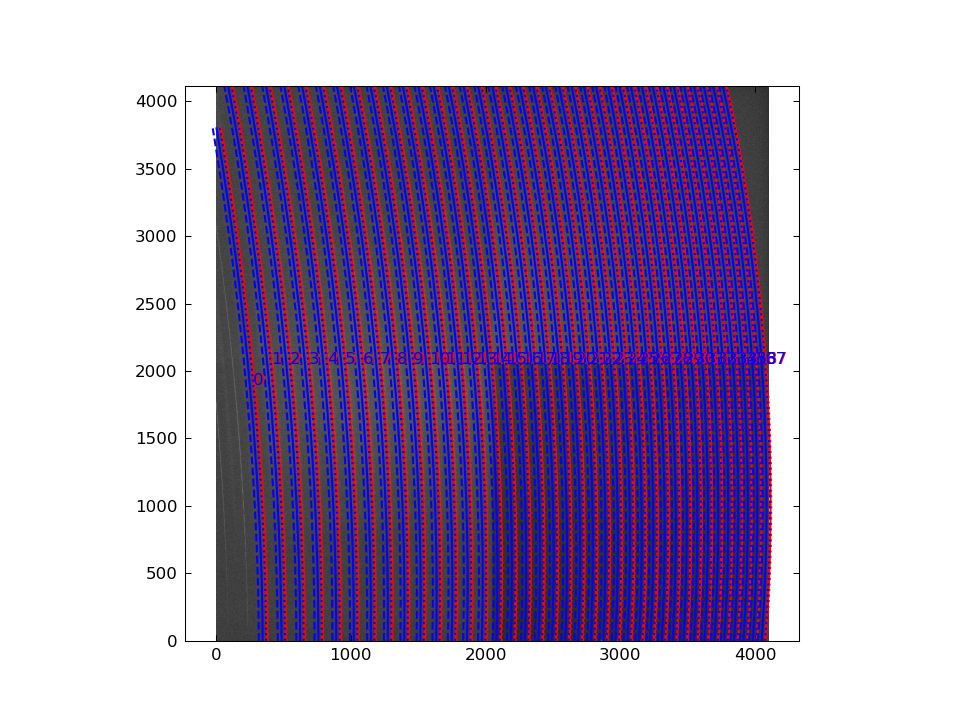

In [29]:
plt.close('all')
frame = lc_data.copy()
# frame = image_substracted_bias.copy()

ylen, xlen = frame.shape
plt.imshow(frame, norm='symlog', aspect='equal', cmap='gray', origin='lower')
# y = np.arange(ylen)

for idx, (trace_y, trace_x, lower, upper) in enumerate(traces):
    plt.plot(trace_x, trace_y, c='r')
    # Annotate the trace with its index
    # idx = traces.index((trace_y, trace_x, lower, upper))
    plt.annotate(str(idx), (trace_x[len(trace_x)//2]+upper, trace_y[len(trace_y)//2]), color='red', fontsize=8)
    plt.plot(trace_x+upper,trace_y, ls=':', c='r')
    plt.plot(trace_x-lower,trace_y, ls='--', c='r')

for idx, (trace_y, trace_x, lower, upper) in enumerate(order_traces):
    plt.plot(trace_x, trace_y, c='b')
    # Annotate the trace with its index
    # idx = traces.index((trace_y, trace_x, lower, upper))
    plt.annotate(str(idx), (trace_x[len(trace_x)//2]+upper, trace_y[len(trace_y)//2]), color='blue', fontsize=8)
    plt.plot(trace_x+upper,trace_y, ls=':', c='b')
    plt.plot(trace_x-lower,trace_y, ls='--', c='b')
plt.show()

In [ ]:
# re-adjust
# traces.x[32] += 3 + order_offset
# traces.x[33] += 1 + order_offset
# traces.x[34] += 1 + order_offset
# traces.x[35] += 1 + order_offset
# traces.x[36] += 1 + order_offset
# traces.x[37] += 16

#red 250406


In [348]:
# %matplotlib inline
# plt.close('all')
# for i, (image, center_line) in enumerate(zip(extracted_LC_imgs, traces.summing_ranges_lower)):
#     plt.close('all')
#     plt.title(f'Order {i}')
#     plt.imshow(image, norm='symlog', aspect='auto', cmap='gray')
#     plt.axvline(center_line, color='red', ls='--')
#     plt.colorbar()
#     plt.show()

In [30]:
# for i in range(len(traces.x)):
#     center_diff = np.mean(traces.x[i]-order_traces.x[i])
#     if i<29:
#         traces.x[i] += 0.5
#     elif i>29:
#         traces.x[i] -= 1.0
#     elif i==29:
#         traces.x[i] += 1.0

# for i in range(len(traces.x)):
#     center_diff = np.mean(traces.x[i]-order_traces.x[i])
#     if i<29:
#         traces.x[i] += 0.5
#     elif i>29:
#         traces.x[i] -= 1.0
#     elif i==29:
#         traces.x[i] += 1.0

# red 250406
# for i in range(len(traces.x)):
#     center_diff = np.mean(traces.x[i]-order_traces.x[i])
#     if i<=4:
#         traces.x[i] -= 2
#     elif i>4 and i<=21:
#         traces.x[i] += 1
#     elif (i>23 and i<=32) or i==39:
#         traces.x[i] += 1
#     elif i>32 and i<=38:
#         traces.x[i] -= 1
# green 250406
_x_traces = []
for i in range(len(traces.x)):
    # center_diff = np.mean(traces.x[i]-order_traces.x[i])
    if i==0:
        _x_traces.append(traces.x[i]-1)
    elif i>=1:# and i<=16:
        _x_traces.append(traces.x[i])
        # traces.x[i] += 1
    # elif i>=17:
    #     _x_traces.append(traces.x[i]-6)
traces.set_traces([(trace_y, trace_x) for trace_y, trace_x in zip(traces.y, _x_traces)])
    

In [31]:
# traces.set_traces_yx(traces.y, traces.x)

In [32]:
### in green arm only the reddest 32 orders have useful signal from LC fibre
### save updated traces
traces.save_traces(filename=f'veloce_{arm}_LC_trace_{date}', trace_dir=veloce_paths.trace_shift_dir, arm=arm)
# traces.save_traces(filename=f'veloce_{arm}_LC_trace', trace_dir=veloce_paths.trace_dir, arm=arm)

##### Extract LC data

In [78]:
extracted_single_LC, uncertainty_single_LC, extracted_single_LC_imgs = veloce_reduction_tools.extract_orders_with_trace(image_substracted_bias, traces)
extracted_LC, uncertainty_LC, extracted_LC_imgs = veloce_reduction_tools.extract_orders_with_trace(lc_data, traces)

In [227]:
%matplotlib inline

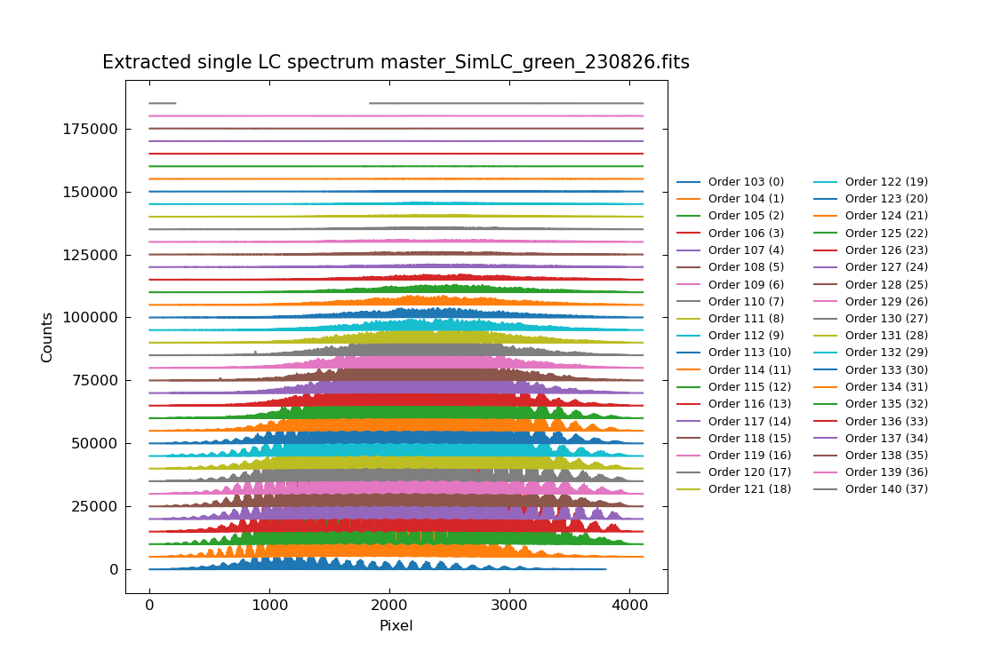

In [79]:
plt.close('all')
fig, ax = plt.subplots(figsize=(7.5, 5))
# for i, (order, spectrum) in enumerate(zip(ORDER, extracted_LC)):
for i, (order, spectrum) in enumerate(zip(ORDER, extracted_single_LC)):
    ax.plot(spectrum+i*5000, label=f'Order {order} ({i})')
ax.set_title(f'Extracted single LC spectrum {master_filename.split("/")[-1]}')
ax.set_xlabel('Pixel')
ax.set_ylabel('Counts')

box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.7, box.height])

# Put a legend to the right of the current axis
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=2)# plt.tight_layout()
plt.show()

In [38]:
# traces.set_wave_calib_slice(start=0, stop=32)

In [39]:
# filename = os.path.join(veloce_paths.output_dir, f'veloce_{arm}_LC_24aug{arm_n[arm]}0232.fits')
# save_filename = os.path.join(veloce_paths.output_dir, f'veloce_{arm}_LC_{filename}')
# save_filename = os.path.join(veloce_paths.output_dir, f'veloce_extracted_{master_filename.split('/')[-1]}')
# print(f'Saving {save_filename}')
# veloce_reduction_tools.save_extracted_spectrum_fits(save_filename, vacuum_static_wave, extracted_LC, header)

# save_filename = os.path.join(veloce_paths.output_dir, f'veloce_extracted_LC_{filename}')
# print(f'Saving {save_filename}')
# veloce_reduction_tools.save_extracted_spectrum_fits(save_filename, vacuum_static_wave, extracted_single_LC, header)

In [40]:
### compare master and single LC exposure

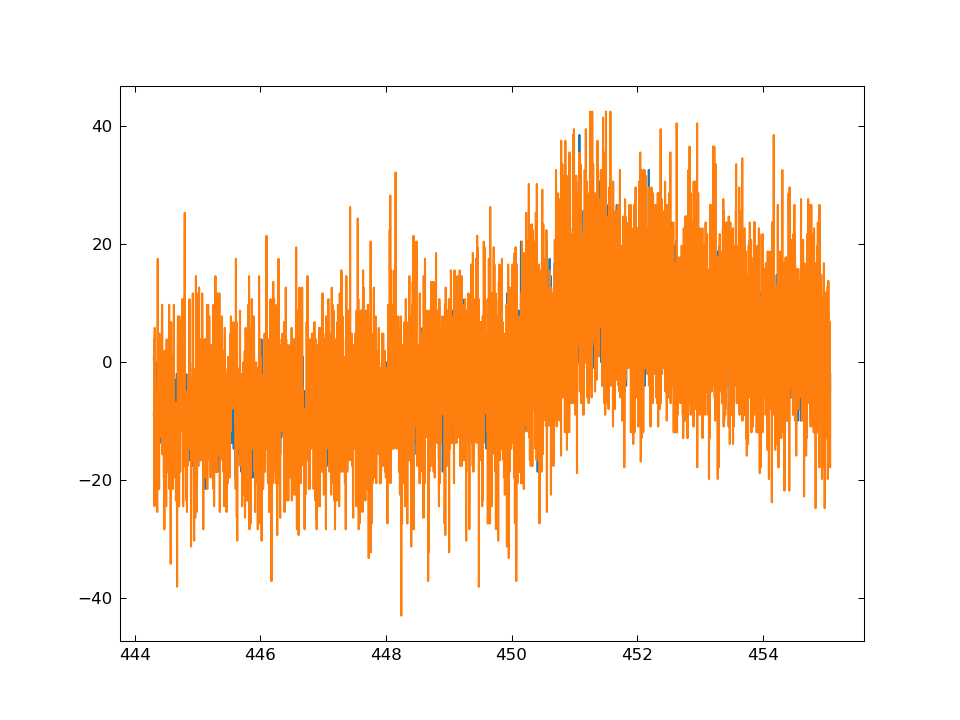

In [80]:
order = 33
plt.close('all')
plt.plot(vacuum_static_wave[order], extracted_LC[order])
plt.plot(vacuum_static_wave[order], extracted_single_LC[order])
plt.show()
# plt.xlim(720, 722.5)
# plt.xlim(720, 722.5)

In [81]:
plt.close('all')

In [43]:
# extracted_filename = '/home/usqobserver2/Joachim_veloce/Extracted_data/LC/veloce_red_LC_23dec30110.fits'
# extracted_filename = '/home/usqobserver2/Joachim_veloce/Extracted_data/LC/Delta_Call_2025_accretion/veloce_red_LC_24aug30232.fits'
# wave, extracted_LC, header = veloce_reduction_tools.load_extracted_spectrum_fits(extracted_filename)

In [44]:
# wave_calib_data = veloce_wavecalib.load_LC_wave_calibration(veloce_paths, arm, header)
# wave_calib_data
# wave_calib_data = np.array(
#     list(zip(*wave_calib_data.T)),
#     dtype=[('wave', float), ('flux', float), ('pixel', float), ('order', int)])
# unique_orders = list(set(wave_calib_data['order']))
# for order in unique_orders:
#     order_mask = wave_calib_data['order'] == order
#     wave_calib_data['wave'][order_mask], wave_calib_data['flux'][order_mask], wave_calib_data['pixel'][order_mask]
# for wave, intensity, pixel, order_num in zip(wave_calib_data[:,0], wave_calib_data[:,1], wave_calib_data[:,2], wave_calib_data[:,3]):
#     print(tuple([wave, intensity, pixel, order_num]))
#     break

##### Reference lines

In [82]:
freq_start = c/(1000e-9)
freq_end =  c/(450e-9)
print(f"The calculated frequency range is: {freq_start:.2e} -- {freq_end:.2e} Hz, but offset frequency is {veloce_wavecalib.OFFSET_FREQUENCY:.2e} Hz.")

The calculated frequency range is: 3.00e+14 -- 6.66e+14 Hz, but offset frequency is 9.56e+09 Hz.


In [88]:
n_start = np.floor((freq_start - veloce_wavecalib.OFFSET_FREQUENCY)/veloce_wavecalib.REPETITION_RATE)
n_end = np.ceil((freq_end - veloce_wavecalib.OFFSET_FREQUENCY)/veloce_wavecalib.REPETITION_RATE)
n_start, n_end

(np.float64(11991.0), np.float64(26648.0))

In [89]:
print(f"The wavelength of offset frequency is: {c/veloce_wavecalib.OFFSET_FREQUENCY*1e9:.3e} nm.")

The wavelength of offset frequency is: 3.136e+07 nm.


In [90]:
# veloce_wavecalib.REPETITION_RATE
n = np.arange(n_start, n_end, 1)
lc_lines = c/(veloce_wavecalib.OFFSET_FREQUENCY+n*veloce_wavecalib.REPETITION_RATE)*1e9 # nm

In [91]:
%matplotlib widget

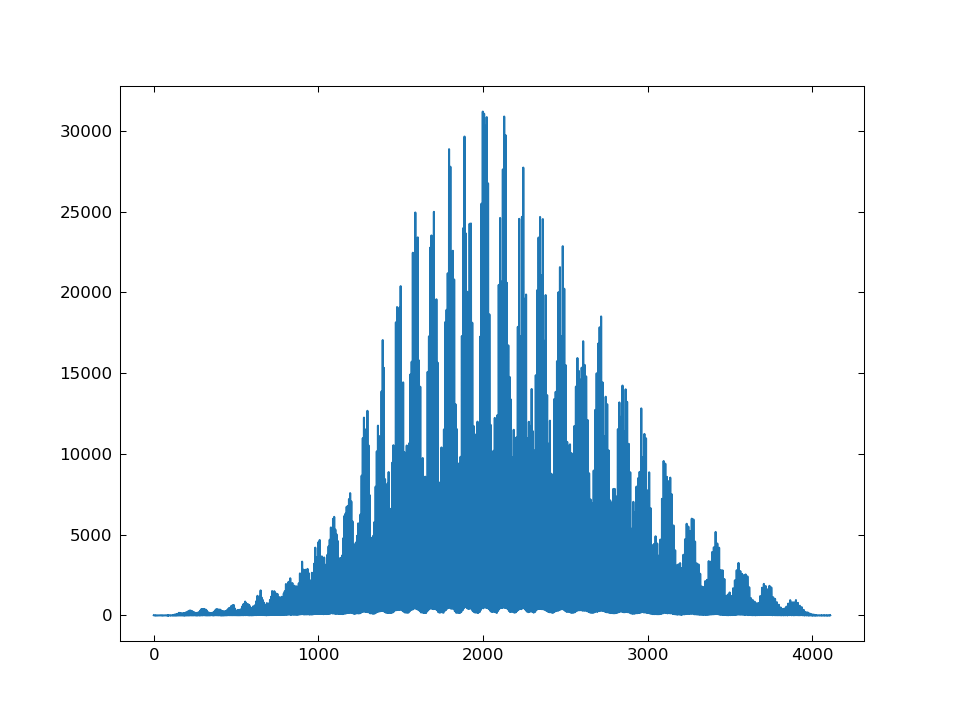

In [92]:
order = 10
plt.close('all')
plt.plot(traces.y[order], extracted_LC[order])
# plt.plot(vacuum_static_wave[order], extracted_single_LC[order])
plt.show()

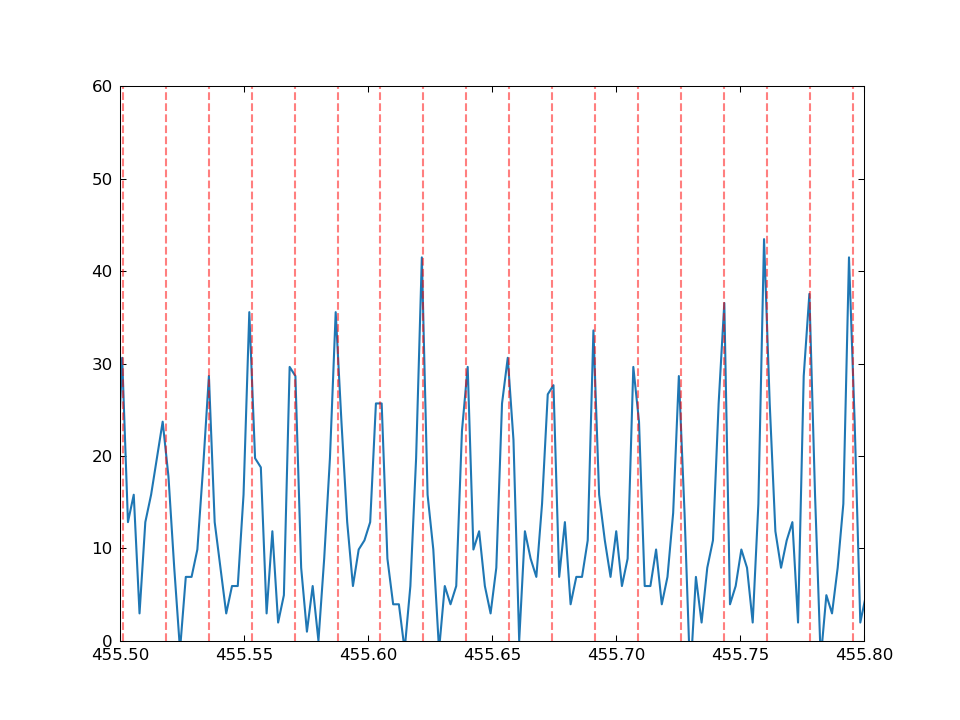

In [93]:
order = 32
plt.close('all')
plt.plot(vacuum_static_wave[order], extracted_LC[order])
# plt.plot(veloce_reduction_tools.air_to_vacuum(air_th_wave[order]), extracted_LC[order])
for lc_line in select_lc_lines_in_wave_range(lc_lines, vacuum_static_wave[order]):
    plt.axvline(lc_line, color='r', ls='--', alpha=0.5)
# plt.plot(vacuum_static_wave[order], extracted_single_LC[order])
plt.xlim(455.5, 455.8)
plt.ylim(0,60)
plt.show()

In [94]:
arm

'green'

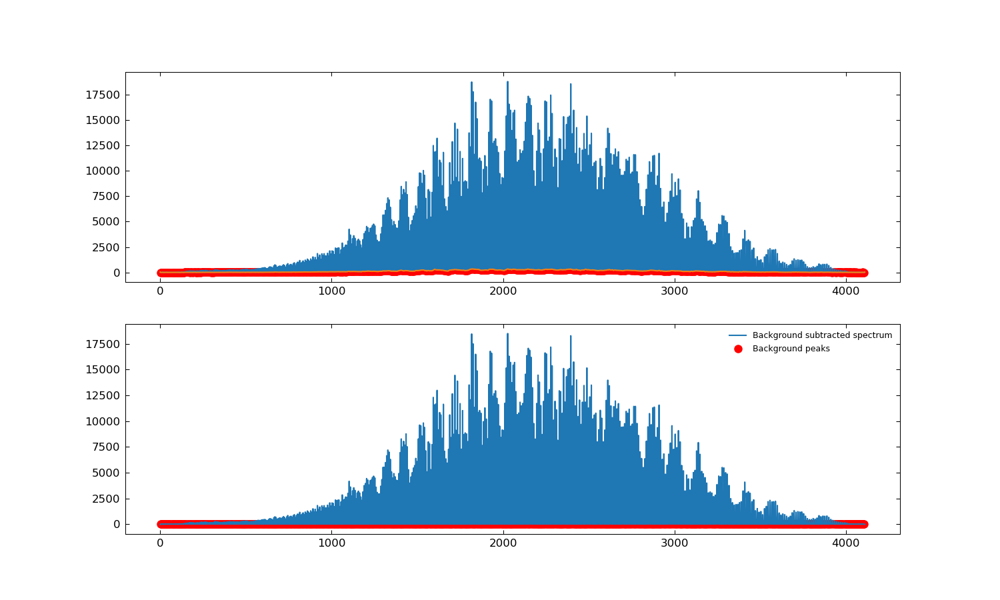

In [95]:
order = 12
%matplotlib widget
_y_corrected = remove_lc_background(extracted_LC[order], plot=True)

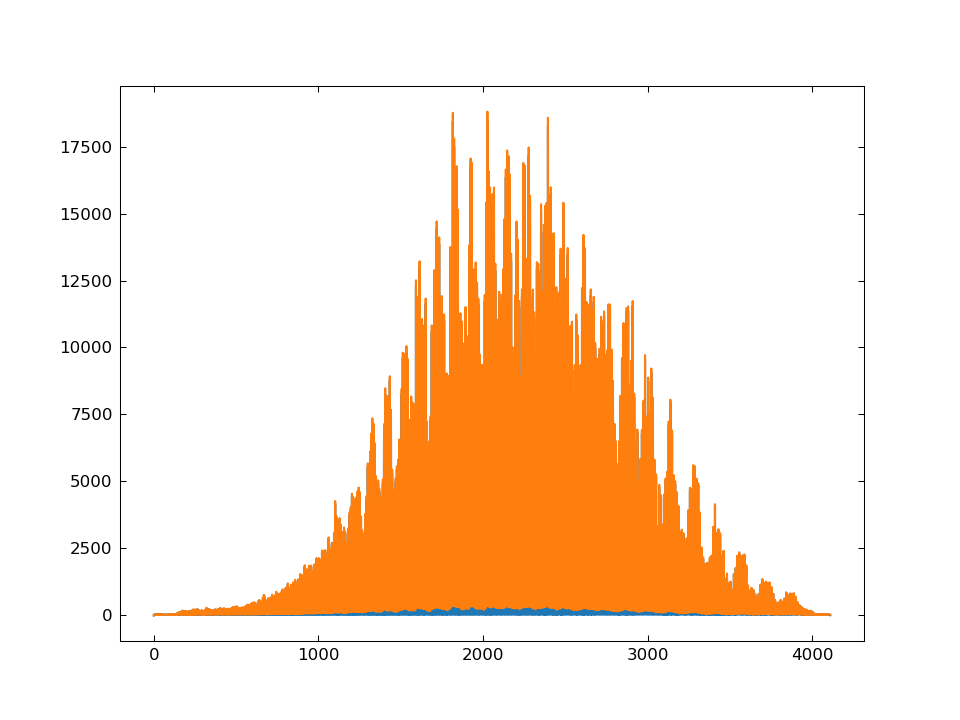

In [58]:
plt.close('all')
plt.plot(_y_corrected)
plt.plot(extracted_LC[order])
plt.show()

##### Fit LC peaks

In [224]:
# order = 13
# veloce_wavecalib.normalise_ArcTh_order_with_spline(extracted_LC[order], nknots=7, plot=True)

In [257]:
# norm_lines_pixel_positions, norm_lines_wave_positions = fit_lc_peaks_in_order(vacuum_static_wave[order], veloce_wavecalib.normalise_ArcTh_order_with_spline(extracted_LC[order]), traces.y[order], lc_lines, plot=1000)
%matplotlib inline
order = 16
# norm_lines_pixel_positions, norm_lines_wave_positions, norm_lines_weights = fit_lc_peaks_in_order(vacuum_static_wave[order], veloce_wavecalib.normalise_ArcTh_order_with_spline(extracted_single_LC[order], nknots=9), traces.y[order], lc_lines, arm, plot=True, verbose=True)
norm_lines_pixel_positions, norm_lines_wave_positions, norm_lines_fwhms, norm_lines_weights = fit_lc_peaks_in_order(
    vacuum_static_wave[order],
    # veloce_wavecalib.normalise_ArcTh_order_with_spline(extracted_LC[order], nknots=7),
    extracted_LC[order],
    # remove_lc_background(extracted_LC[order], plot=False),
    # remove_lc_background(extracted_LC[order], plot=False),
    traces.y[order],
    lc_lines, arm)#,
    # offset=0,
    # plot=True, verbose=True)

In [258]:
lines_pixel_positions, lines_wave_positions, lines_sigmas, lines_weights = fit_lc_peaks_in_order(
    vacuum_static_wave[order],
    extracted_LC[order],
    traces.y[order],
    lc_lines, arm)#,
    # offset=0,
    # plot=True, verbose=True)

In [259]:
# plt.close()
# plt.plot(vacuum_static_wave[order],
#     veloce_wavecalib.normalise_ArcTh_order_with_spline(extracted_single_LC[order], nknots=9))
# plt.show()

In [260]:
np.sum(np.isfinite(norm_lines_pixel_positions)), len(norm_lines_pixel_positions)

(np.int64(489), 546)

In [261]:
guess_pixel = get_guess_pixel_for_lc_lines(order, vacuum_static_wave[order], traces, lc_lines)

In [262]:
len(norm_lines_pixel_positions), len(norm_lines_wave_positions), len(guess_pixel), len(norm_lines_weights)

(546, 546, 546, 546)

In [265]:
%matplotlib inline

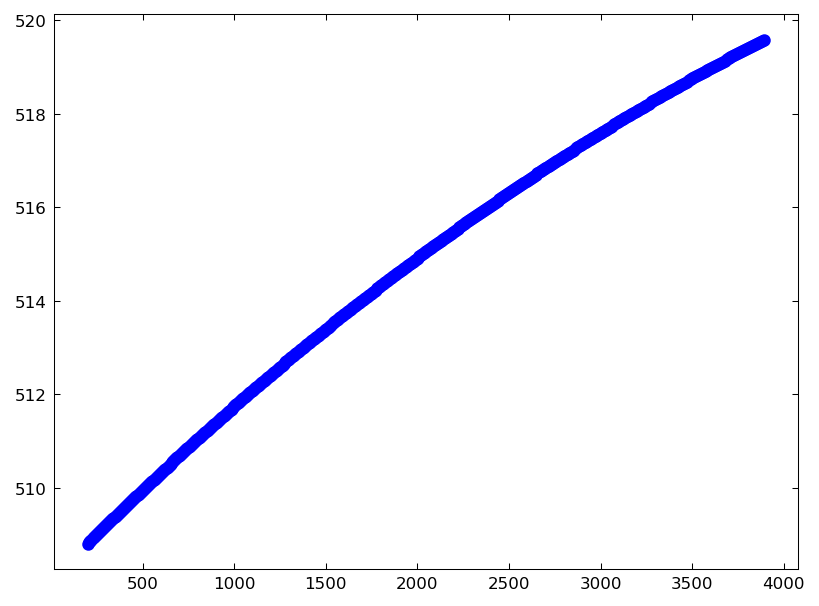

In [266]:
plt.close('all')
plt.plot(norm_lines_pixel_positions, norm_lines_wave_positions, 'bo', label='Fitted lines')
plt.show()

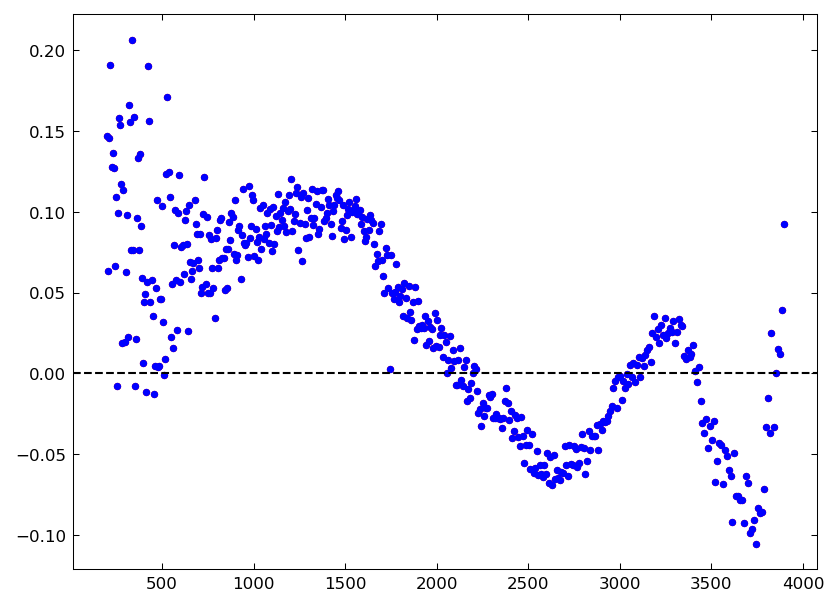

In [267]:
plt.close('all')
plt.plot(guess_pixel[np.isfinite(lines_pixel_positions)], lines_pixel_positions[np.isfinite(lines_pixel_positions)]-guess_pixel[np.isfinite(lines_pixel_positions)], 'r.')
plt.plot(guess_pixel[np.isfinite(norm_lines_pixel_positions)], norm_lines_pixel_positions[np.isfinite(norm_lines_pixel_positions)]-guess_pixel[np.isfinite(norm_lines_pixel_positions)], 'b.')
plt.axhline(0, ls='--', c='k')
plt.show()

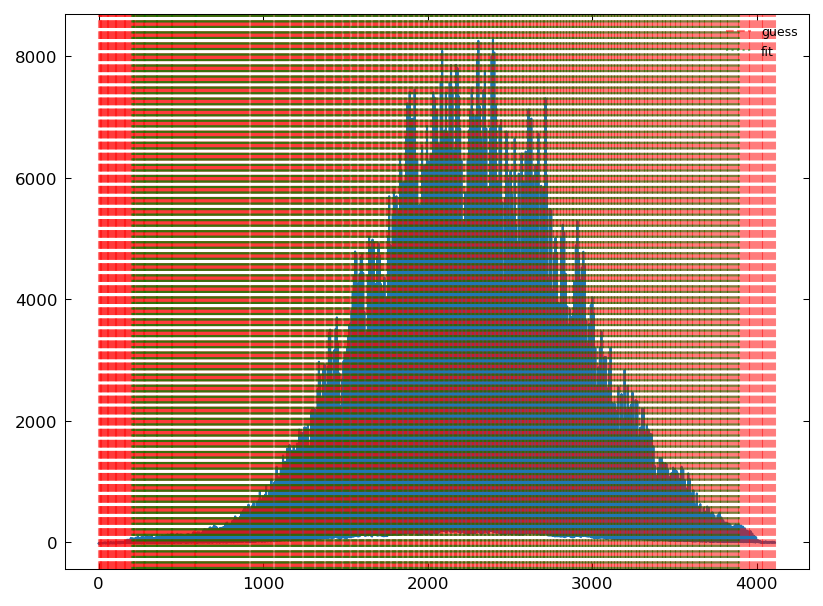

In [74]:
# order = 1
plt.close('all')
wavelengths = vacuum_static_wave[order]
min_pixel, max_pixel = int(min(traces.y[order])), int(max(traces.y[order]))
# plt.plot(traces.y[order], veloce_wavecalib.normalise_ArcTh_order_with_spline(extracted_single_LC[order], nknots=7))
# plt.plot(traces.y[order], veloce_wavecalib.normalise_ArcTh_order_with_spline(extracted_LC[order], nknots=7))
plt.plot(traces.y[order], extracted_LC[order])
for pixel in guess_pixel:
    plt.axvline(pixel, color='r', ls='--', alpha=0.5, label='guess')
for pixel in norm_lines_pixel_positions:
    plt.axvline(pixel, color='g', ls=':', alpha=0.5, label='fit')
# plt.plot(vacuum_static_wave[order], extracted_single_LC[order])
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys())
plt.show()

In [ ]:
# pixel_positions, wave_positions, order_positions = fit_all_lines_per_order(vacuum_static_wave, extracted_LC, ORDER, traces, lc_lines)
# pixel_positions, wave_positions, order_positions, weights = fit_all_lines_per_order(vacuum_static_wave[:32], extracted_single_LC[:32], ORDER[:32], traces, lc_lines, arm) # green
_pixel_positions, _wave_positions, _order_positions, _fwhms, _weights = fit_all_lc_lines_per_order(vacuum_static_wave, extracted_LC, ORDER, traces, lc_lines, arm, offset=0)

Fitting lines in order 103 (1/38)
Found 408 lines.
---
Fitting lines in order 104 (2/38)
Found 426 lines.
---
Fitting lines in order 105 (3/38)
Found 429 lines.
---
Fitting lines in order 106 (4/38)
Found 433 lines.
---
Fitting lines in order 107 (5/38)
Found 437 lines.
---
Fitting lines in order 108 (6/38)
Found 441 lines.
---
Fitting lines in order 109 (7/38)
Found 446 lines.
---
Fitting lines in order 110 (8/38)
Found 450 lines.
---
Fitting lines in order 111 (9/38)
Found 454 lines.
---
Fitting lines in order 112 (10/38)
Found 458 lines.
---
Fitting lines in order 113 (11/38)
Found 463 lines.
---
Fitting lines in order 114 (12/38)
Found 467 lines.
---
Fitting lines in order 115 (13/38)
Found 472 lines.
---
Fitting lines in order 116 (14/38)
Found 477 lines.
---
Fitting lines in order 117 (15/38)
Found 481 lines.
---
Fitting lines in order 118 (16/38)
Found 485 lines.
---
Fitting lines in order 119 (17/38)
Found 489 lines.
---
Fitting lines in order 120 (18/38)
Found 481 lines.
---
F

##### Plot fit vs guess per order

In [500]:
%matplotlib inline

In [501]:
len(np.unique(_order_positions))

35

In [502]:
for i, order in enumerate(np.unique(_order_positions)):
    order_mask = _order_positions == order
    print(f"Order {order} has {np.sum(order_mask)} fitted LC lines.")

Order 103.0 has 446 fitted LC lines.
Order 104.0 has 474 fitted LC lines.
Order 105.0 has 478 fitted LC lines.
Order 106.0 has 483 fitted LC lines.
Order 107.0 has 487 fitted LC lines.
Order 108.0 has 492 fitted LC lines.
Order 109.0 has 496 fitted LC lines.
Order 110.0 has 501 fitted LC lines.
Order 111.0 has 505 fitted LC lines.
Order 112.0 has 511 fitted LC lines.
Order 113.0 has 515 fitted LC lines.
Order 114.0 has 520 fitted LC lines.
Order 115.0 has 525 fitted LC lines.
Order 116.0 has 530 fitted LC lines.
Order 117.0 has 535 fitted LC lines.
Order 118.0 has 540 fitted LC lines.
Order 119.0 has 546 fitted LC lines.
Order 120.0 has 551 fitted LC lines.
Order 121.0 has 555 fitted LC lines.
Order 122.0 has 560 fitted LC lines.
Order 123.0 has 566 fitted LC lines.
Order 124.0 has 571 fitted LC lines.
Order 125.0 has 577 fitted LC lines.
Order 126.0 has 582 fitted LC lines.
Order 127.0 has 587 fitted LC lines.
Order 128.0 has 593 fitted LC lines.
Order 129.0 has 599 fitted LC lines.
O

In [8]:
# plt.close('all')
# for i, order in enumerate(np.unique(_order_positions)):
#     order_mask = _order_positions == order
#     mask = np.isfinite(_pixel_positions[order_mask])
#     if np.sum(mask) < 50:
#         continue
#     guess_pixel = get_guess_pixel_for_lc_lines(i, vacuum_static_wave[i], traces, lc_lines, pixel_positions=_pixel_positions[order_mask])
#     print(len(guess_pixel), len(order_mask))
#     plt.close()
#     fig = plt.figure(figsize=(10, 5))
#     ax = plt.gca()
#     ax.plot(_pixel_positions[order_mask][mask], _pixel_positions[order_mask][mask]-guess_pixel[mask], '.b', label=f'Order {order} ({i})')
#     # ax.plot(_pixel_positions[order_mask][mask], _pixel_positions[order_mask][mask], '.b', label=f'Order {order} ({i})')
#     ax.set_xlim(-1, 4112)
#     ax.set_xlabel('Pixel')
#     ax.set_ylabel('Fit - Guess (Pixel Position)')
#     ax.set_title(r'$\Delta$ Pixel Positions for Order {order}'.format(order=order))
#     ax.legend()
#     ax.axhline(0, ls='--', c='gray')
#     ax.tick_params(axis='both', which='both', direction='in')
#     plt.show()
    # plt.savefig(os.path.join(veloce_paths.wavelength_calibration_dir, f'LC_{arm}_order_{order}_pixel_fit_vs_guess.png'), dpi=300)
    # break

##### Fit Wavelength solution

In [273]:
# np.argwhere(np.array(ORDER)==130)

In [336]:
fitted_orders, order_mask = get_orders_with_lc_lines(ORDER, _order_positions, _pixel_positions)

In [337]:
# mask = np.isfinite(pixel_positions)
pixel_positions, wave_positions, order_positions, fwhms, weights = _pixel_positions[order_mask], _wave_positions[order_mask], _order_positions[order_mask], _fwhms[order_mask], _weights[order_mask]

In [338]:
# max_extracted_pixel = max([max(trace_y) for trace_y in traces.y[:28]])
max_extracted_pixel = max([max(trace_y) for trace_y in traces.y])
# min_extracted_pixel = min([min(trace_y) for trace_y in traces.y[:28]])
min_extracted_pixel = min([min(trace_y) for trace_y in traces.y])
# full_pixels = np.array([np.arange(min_extracted_pixel, max_extracted_pixel + 1) for _ in range(len(extracted_LC[:28]))])
full_pixels = np.array([np.arange(min_extracted_pixel, max_extracted_pixel + 1) for _ in range(len(fitted_orders))])

In [339]:
len(fitted_orders)

32

In [340]:
full_pixels.shape

(32, 4112)

In [341]:
if arm == 'green':
    Z, residuals, mask, model, converged, input_scaler, target_scaler = fit_xy_surface_sklearn(pixel_positions, order_positions, wave_positions, full_pixels,
                           degree_x=13, degree_y=8, sigma_clip=3, max_iter=1000, ridge_alpha=0.001,
                           input_scaling='minmax', target_scaling='standard')
    # Z, residuals, mask, model, converged = fit_lc_surface_sklearn(pixel_positions, order_positions, wave_positions, full_pixels, degree=6, sigma_clip=3, n_limit=0, robust=True, max_iter=1000) # green
    # Z, residuals, mask, model, converged = fit_lc_surface_sklearn_norm(pixel_positions, order_positions, wave_positions, full_pixels, degree=7, sigma_clip=3, n_limit=0, max_iter=1000)
elif arm == 'red':
    # Z, residuals, mask, model, converged = fit_lc_surface_sklearn(pixel_positions, order_positions, wave_positions, full_pixels, degree=7, sigma_clip=3, n_limit=0, robust=True, max_iter=1000) # red
    Z, residuals, mask, model, converged, input_scaler, target_scaler = fit_xy_surface_sklearn(pixel_positions, order_positions, wave_positions, full_pixels,
                           degree_x=9, degree_y=7, sigma_clip=3, max_iter=1000, ridge_alpha=0.001,
                           input_scaling='minmax', target_scaling='standard')
# Z, residuals, mask, model, converged = fit_lc_surface_sklearn(pixel_positions, order_positions, wave_positions, full_pixels, degree=7, sigma_clip=3, n_limit=0, robust=True, max_iter=100) # red
stdev_vel = np.std(residuals[mask]/order_positions[mask]/wave_positions[mask])*c/np.sqrt(np.sum(mask))
print(f"SE: {stdev_vel:.2f}, with mean deviation from model: {np.mean(residuals[mask]/order_positions[mask]/wave_positions[mask]):.2e}, based on {np.sum(mask)}/{len(mask)} points.")

Converged after 10 iterations.
SE: 0.36, with mean deviation from model: -8.37e-12, based on 13242/13920 points.


In [342]:
arm

'green'

In [343]:
# Z, residuals, mask, model, converged = fit_weighted_LC_surface(pixel_positions, wave_positions, order_positions, full_pixels, weights, 7, sigma_clip=3)
# stdev_vel = np.std(residuals[mask]/order_positions[mask]/wave_positions[mask])*c/np.sqrt(np.sum(mask))
# print(f"SE: {stdev_vel:.2f}, with mean deviation from model: {np.mean(residuals[mask]/order_positions[mask]/wave_positions[mask]):.2e}, based on {np.sum(mask)}/{len(mask)} points.")

In [344]:
%matplotlib widget

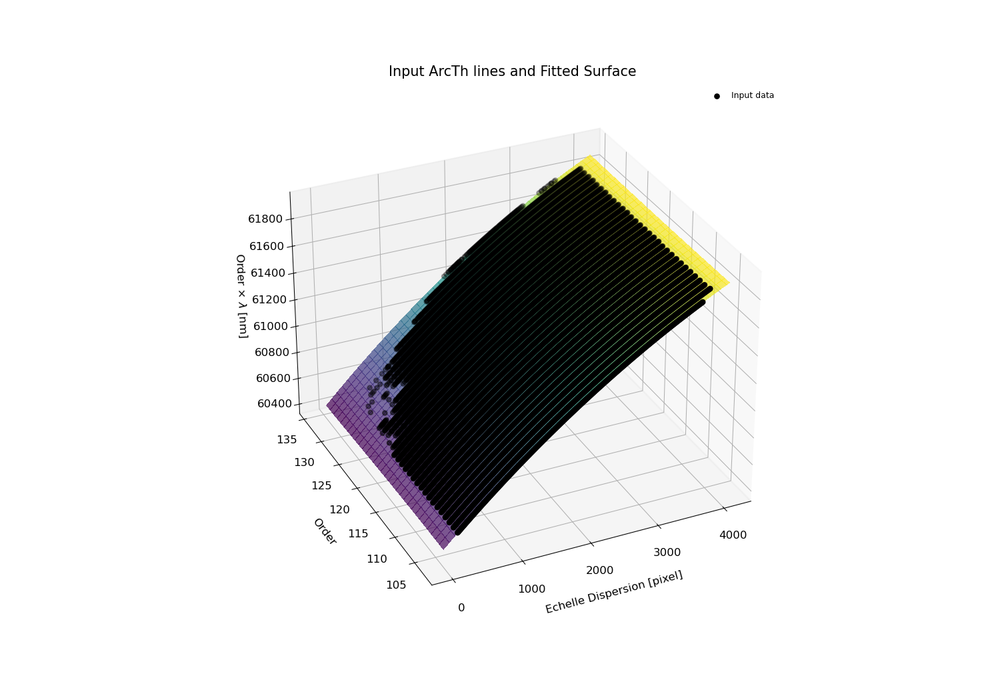

'/Users/jjkruger/VeloceExtracted/LC/Intermediate_results/Plots/Th_fitted_surface_LC_green_230826.png'

In [345]:
veloce_diagnostic.plot_ArcTh_surface(Z, pixel_positions, order_positions, wave_positions, full_pixels, veloce_paths, filename=f'LC_{arm}_{date}', show=True)
# veloce_diagnostic.plot_ArcTh_surface(Z, pixel_positions, order_positions, wave_positions, full_pixels, veloce_paths, filename=None, show=True)

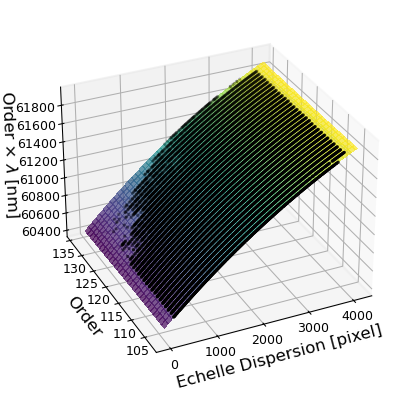

'/Users/jjkruger/VeloceExtracted/LC/Intermediate_results/Plots/LC_fitted_surface_green_230826.pdf'

In [347]:
%matplotlib inline
plot_LC_surface(Z, pixel_positions, order_positions, wave_positions, full_pixels, mask, veloce_paths, filename=f'{arm}_{date}', show=True)

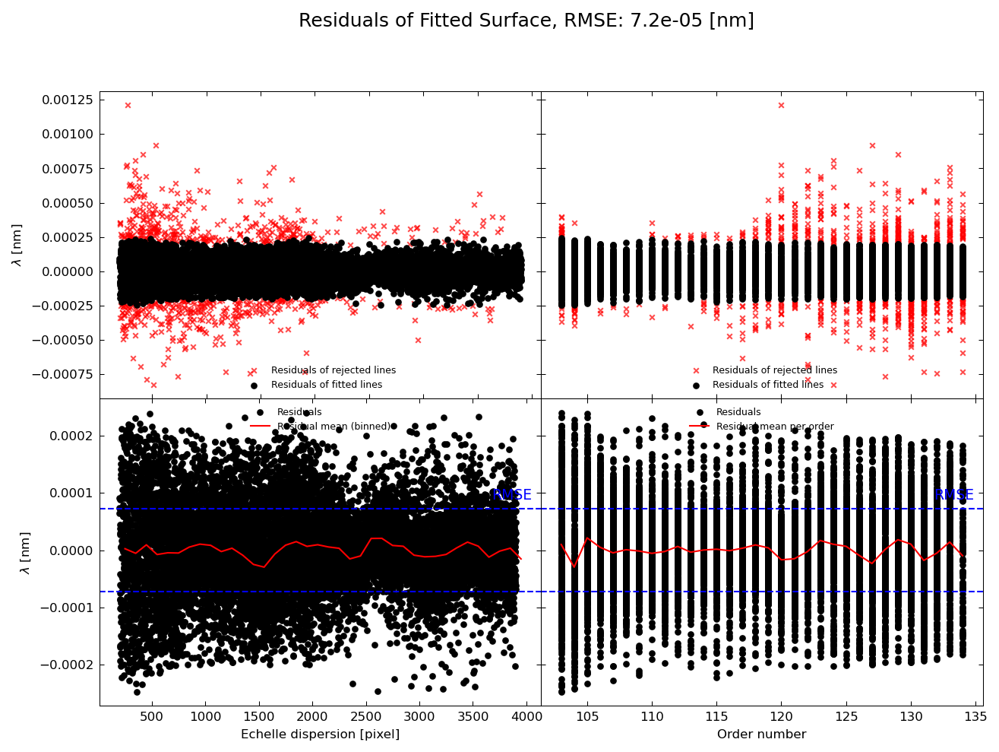

'/Users/jjkruger/VeloceExtracted/LC/Intermediate_results/Plots/Th_residuals_LC_green_230826.png'

In [348]:
veloce_diagnostic.plot_ArcTh_residuals(residuals, order_positions, pixel_positions, wave_positions, mask, veloce_paths, filename=f'LC_{arm}_{date}', plot_type='wavelength', show=True)
# veloce_diagnostic.plot_ArcTh_residuals(residuals, order_positions, pixel_positions, wave_positions, mask, veloce_paths, filename=f'LC_{arm}_{date}', plot_type='velocity', show=True)
# veloce_diagnostic.plot_ArcTh_residuals(residuals, order_positions, pixel_positions, wave_positions, mask, veloce_paths, filename=None, plot_type='velocity', show=True)
# veloce_diagnostic.plot_ArcTh_residuals(residuals, order_positions, pixel_positions, wave_positions, mask, veloce_paths, filename=None, plot_type='wavelength', show=True)

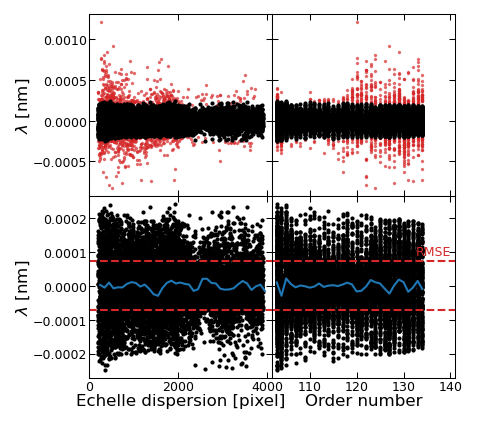

'/Users/jjkruger/VeloceExtracted/LC/Intermediate_results/Plots/LC_residuals_green_230826.pdf'

In [351]:
plot_LC_residuals(residuals, order_positions, pixel_positions, wave_positions, mask, ORDER, veloce_paths, filename=f"{arm}_{date}", plot_type='wavelength', show=True)

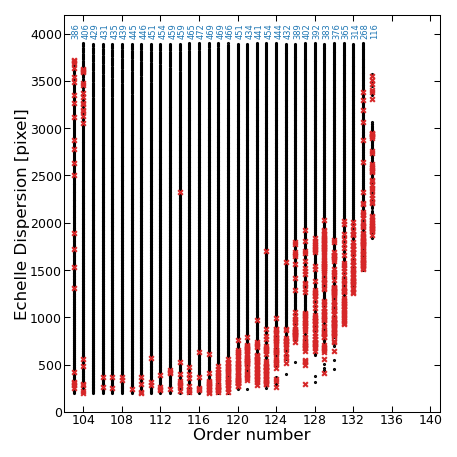

'/Users/jjkruger/VeloceExtracted/LC/Intermediate_results/Plots/LC_line_positions_used_per_order_green_230826.pdf'

In [353]:
plot_LC_points_positions(pixel_positions, order_positions, mask, veloce_paths, ORDER, filename=f'{arm}_{date}', show=True)

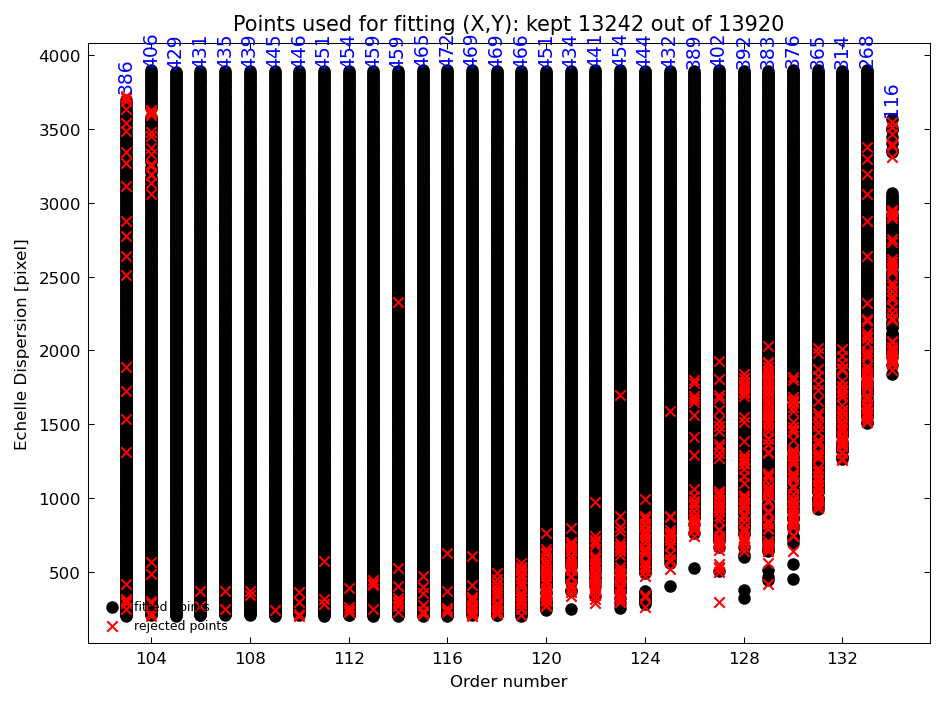

'/Users/jjkruger/VeloceExtracted/LC/Intermediate_results/Plots/ArcTh_line_positions_used_per_order_LC_green_230826.png'

In [354]:
veloce_diagnostic.plot_ArcTh_points_positions(pixel_positions, order_positions, mask, veloce_paths, filename=f'LC_{arm}_{date}', show=True)
# veloce_diagnostic.plot_ArcTh_points_positions(pixel_positions, order_positions, mask, veloce_paths, filename=None, show=True)

##### Save wavelength solution

In [384]:
calibrated_pixels_per_order = []
for i, order in enumerate(ORDER):
    if order in fitted_orders:
        pixel_in_order = pixel_positions[order_positions == order]
        # lower_pixel, upper_pixel = np.min(pixel_in_order), np.max(pixel_in_order)
        # print(np.min(pixel_in_order), traces.y[i])
        # remove isolated peaks at the edges
        for j, pixel in enumerate(pixel_in_order):
            if abs(pixel_in_order[j+1] - pixel) > 50:
                pixel_in_order[j] = np.nan
            else:
                break
        for j, pixel in enumerate(pixel_in_order[::-1]):
            if abs(pixel_in_order[len(pixel_in_order)-2-j] - pixel) > 50:
                pixel_in_order[len(pixel_in_order)-1-j] = np.nan
            else:
                break
        
        calibrated_pixels = (traces.y[i] > np.nanmin(pixel_in_order)) & (traces.y[i] < np.nanmax(pixel_in_order))
        print(len(calibrated_pixels), len(traces.y[i]), order)
        calibrated_pixels_per_order.append(calibrated_pixels)
    else:
        calibrated_pixels = np.zeros_like(traces.y[i], dtype=bool)
        calibrated_pixels_per_order.append(calibrated_pixels)
        # print(len(calibrated_pixels), len(traces.y[i]), order)

3801 3801 103
4112 4112 104
4111 4111 105
4111 4111 106
4111 4111 107
4111 4111 108
4112 4112 109
4111 4111 110
4111 4111 111
4111 4111 112
4111 4111 113
4112 4112 114
4111 4111 115
4111 4111 116
4111 4111 117
4111 4111 118
4112 4112 119
4111 4111 120
4111 4111 121
4111 4111 122
4111 4111 123
4112 4112 124
4111 4111 125
4111 4111 126
4111 4111 127
4111 4111 128
4112 4112 129
4111 4111 130
4111 4111 131
4111 4111 132
4111 4111 133
4112 4112 134


In [378]:
len(calibrated_pixels_per_order[4])

4111

In [382]:
# new_wave = [model.predict((np.column_stack([trace_y, np.ones_like(trace_y)*absolute_order])))/absolute_order for i, absolute_order, trace_y in zip(range(len(ORDER[:28])), ORDER[:28], traces.y[:28])]
# new_wave = [model.predict((np.column_stack([trace_y, np.ones_like(trace_y)*absolute_order])))/absolute_order for i, absolute_order, trace_y in zip(range(len(ORDER)), ORDER, traces.y)]
order_mask = [i for i, order in enumerate(ORDER) if order in fitted_orders]

# fitted_traces = [traces.y[i] for i in order_mask]
fitted_traces = [traces.y[i][calibrated_pixels] for i, calibrated_pixels in enumerate(calibrated_pixels_per_order) if np.any(calibrated_pixels)]
# input_scaler=MinMaxScaler(feature_range=(-1.0, 1.0))
# target_scaler=StandardScaler()
new_wave = predict_wavelength_from_surface(model, fitted_traces, fitted_orders, input_scaler=input_scaler, target_scaler=target_scaler)
print(f"New wavelength solution covers from {min([min(w) for w in new_wave]):.3f} nm to {max([max(w) for w in new_wave]):.3f} nm")
new_wave = [veloce_reduction_tools.vacuum_to_air(w) for w in new_wave]
# new_wave = [model.predict((np.column_stack([trace_y, np.ones_like(trace_y)*absolute_order])))/absolute_order for absolute_order, trace_y in zip(fitted_orders, traces.y)]
print(f"New wavelength solution covers from {min([min(w) for w in new_wave]):.3f} nm to {max([max(w) for w in new_wave]):.3f} nm")

New wavelength solution covers from 456.823 nm to 599.901 nm
New wavelength solution covers from 456.695 nm to 599.735 nm


In [357]:
len(new_wave), len([extracted_LC[i] for i, order in enumerate(ORDER) if order in fitted_orders])

(32, 32)

In [99]:
fitted_extracted_LC = [extracted_LC[i] for i, order in enumerate(ORDER) if order in fitted_orders]

In [100]:
# with open(os.path.join(veloce_paths.wavelength_calibration_dir, f'LC_wave_{date}_{arm}.pkl'), 'wb') as f:
#     pickle.dump(new_wave, f)
lc_wave_solution_filename = os.path.join(veloce_paths.wavelength_calibration_dir, f'LC_wave_{date}_{arm}.fits')
print(f"Saving new LC wavelength solution to {lc_wave_solution_filename}")

veloce_reduction_tools.save_extracted_spectrum_fits(lc_wave_solution_filename, new_wave, [extracted_LC[i] for i, order in enumerate(ORDER) if order in fitted_orders], header)

Saving new LC wavelength solution to /Users/jjkruger/VeloceExtracted/LC/Intermediate_results/Wavelength_calibration/LC_wave_230826_green.fits


'/Users/jjkruger/VeloceExtracted/LC/Intermediate_results/Wavelength_calibration/LC_wave_230826_green.fits'

In [101]:
%matplotlib widget

In [102]:
# idx = 20
# w, y, order = new_wave[idx], fitted_traces[idx], ORDER[idx]

# plt.close('all')
# plt.plot(y, w)
# plt.scatter(pixel_positions[order_positions == order], wave_positions[order_positions == order], s=2, c='k')
# plt.show()

In [103]:
# %matplotlib inline
# plt.close('all')
# # mid_resolution = []
# # mid_wave = []
# for w, y, order in zip(new_wave, fitted_traces, ORDER):
#     plt.close('all')
#     plt.plot(y, w)
#     plt.scatter(pixel_positions[order_positions == order], wave_positions[order_positions == order], s=2, c='k')
#     plt.show()

##### Estimate resolution

In [1]:
resolution_positions = veloce_wavecalib.get_resolution_from_fitted_lines(fwhms, wave_positions, pixel_positions, order_positions, new_wave)
# _resolution_positions = veloce_wavecalib.get_resolution_from_fitted_lines(_fwhms, _wave_positions, _pixel_positions, _order_positions, wave)
# _resolution_positions = get_resolution_from_fitted_lines(fwhms, wave_positions, pixel_positions, order_positions, wave)

NameError: name 'veloce_wavecalib' is not defined

In [105]:
initial_res_mask = np.ones_like(mask, dtype=bool) * ((pixel_positions>300) & (pixel_positions<3800))

In [107]:
%matplotlib inline

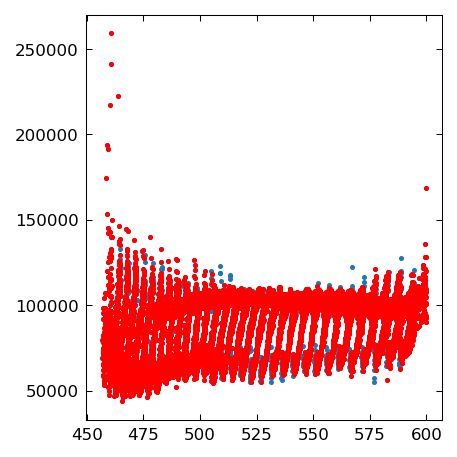

In [108]:
plt.close('all')
plt.figure(figsize=(3.15,3.15))
plt.scatter(wave_positions, resolution_positions, s=2)
plt.scatter(wave_positions[initial_res_mask], resolution_positions[initial_res_mask], s=2, c='r')
# plt.scatter(wave_positions[mask], resolution_positions[mask], s=2, c='g')
# plt.scatter(wave_positions, _resolution_positions, s=2)
plt.tight_layout()
plt.show()

In [123]:
# res_Z_xy, res_residuals_xy, res_mask_xy, res_model_xy, converged_xy, input_scaler, target_scaler = fit_xy_surface_sklearn(pixel_positions[initial_res_mask], order_positions[initial_res_mask], resolution_positions[initial_res_mask], full_pixels,
#                            degree_x=3, degree_y=2, sigma_clip=3, max_iter=1000, ridge_alpha=0.001,
#                            input_scaling='minmax', target_scaling='standard', fit_type='resolution')
# res_Z_xy, res_residuals_xy, res_mask_xy, res_model_xy, converged_xy, input_scaler, target_scaler = fit_xy_surface_sklearn(pixel_positions[initial_res_mask], order_positions[initial_res_mask], resolution_positions[initial_res_mask], full_pixels,
res_Z_xy, res_residuals_xy, res_mask_xy, res_model_xy, converged_xy, input_scaler, target_scaler = fit_xy_surface_sklearn(pixel_positions, order_positions, resolution_positions, full_pixels,
                           degree_x=4, degree_y=2, sigma_clip=3, max_iter=1000, ridge_alpha=1,
                           input_scaling='minmax', target_scaling='standard', fit_type='resolution')

_resolution_xy = predict_wavelength_from_surface(res_model_xy, traces.y, list(ORDER), input_scaler=input_scaler, target_scaler=target_scaler)
resolution_xy = [res_xy*order for res_xy, order in zip(_resolution_xy, ORDER)]

Converged after 8 iterations.


resolution: 96252 at wavelength: 595.113 nm
resolution: 97380 at wavelength: 589.389 nm
resolution: 98349 at wavelength: 583.773 nm
resolution: 99156 at wavelength: 578.264 nm
resolution: 99804 at wavelength: 572.858 nm
resolution: 100291 at wavelength: 567.552 nm
resolution: 100618 at wavelength: 562.343 nm
resolution: 100784 at wavelength: 557.229 nm
resolution: 100790 at wavelength: 552.208 nm
resolution: 100635 at wavelength: 547.276 nm
resolution: 100320 at wavelength: 542.431 nm
resolution: 99845 at wavelength: 537.671 nm
resolution: 99209 at wavelength: 532.995 nm
resolution: 98413 at wavelength: 528.398 nm
resolution: 97456 at wavelength: 523.881 nm
resolution: 96339 at wavelength: 519.440 nm
resolution: 95062 at wavelength: 515.074 nm
resolution: 93624 at wavelength: 510.780 nm
resolution: 92026 at wavelength: 506.558 nm
resolution: 90267 at wavelength: 502.404 nm
resolution: 88348 at wavelength: 498.319 nm
resolution: 86269 at wavelength: 494.299 nm
resolution: 84029 at wavel

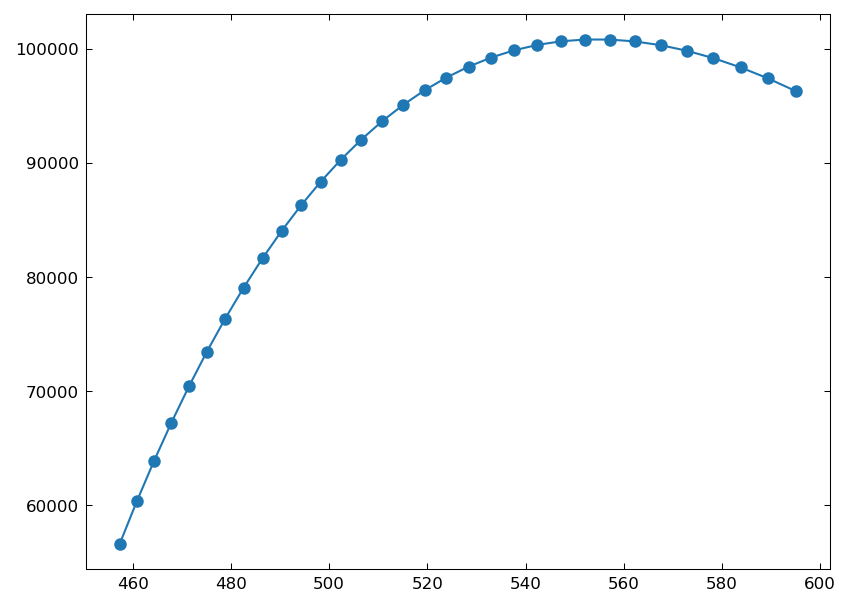

In [124]:
ylen = lc_data.shape[0]
mid_resolution = []
mid_wave = []
for w, res in zip(new_wave, resolution_xy):
    print(f"resolution: {res[ylen//2]:.0f} at wavelength: {w[ylen//2]:.3f} nm")
    mid_resolution.append(res[ylen//2])
    mid_wave.append(w[ylen//2])

plt.close('all')
plt.plot(mid_wave, mid_resolution, marker='o')
plt.show()

In [125]:
# final_res_mask = initial_res_mask.copy()
# final_res_mask[initial_res_mask] = res_mask_xy
final_res_mask = res_mask_xy

In [178]:
%matplotlib widget

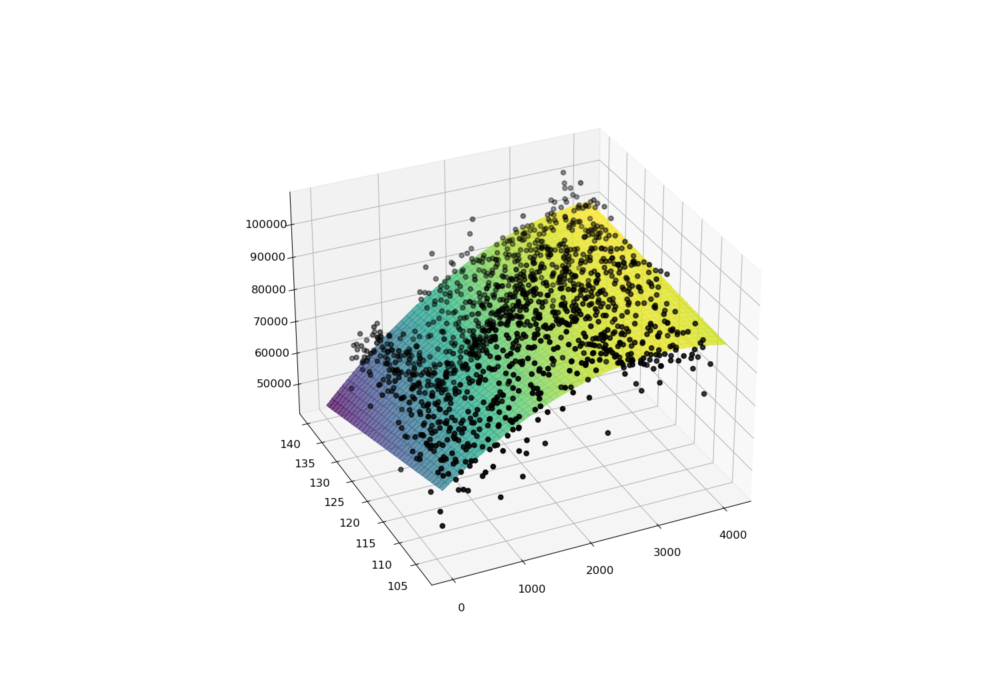

In [179]:
plt.close('all')
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(1,1,1, projection='3d')
ax.view_init(elev=30, azim=245)
X, Y = np.meshgrid(full_pixels[0], np.unique(order_positions))
ax.plot_surface(X, Y, res_Z_xy, cmap='viridis', alpha=0.7, linewidth=0, antialiased=False)
# ax.scatter(pixel_positions[final_res_mask], order_positions[final_res_mask], resolution_positions[final_res_mask], c='k', s=10)
ax.scatter(pixel_positions[final_res_mask], order_positions[final_res_mask], resolution_positions[final_res_mask], c='k', s=10)
plt.show()

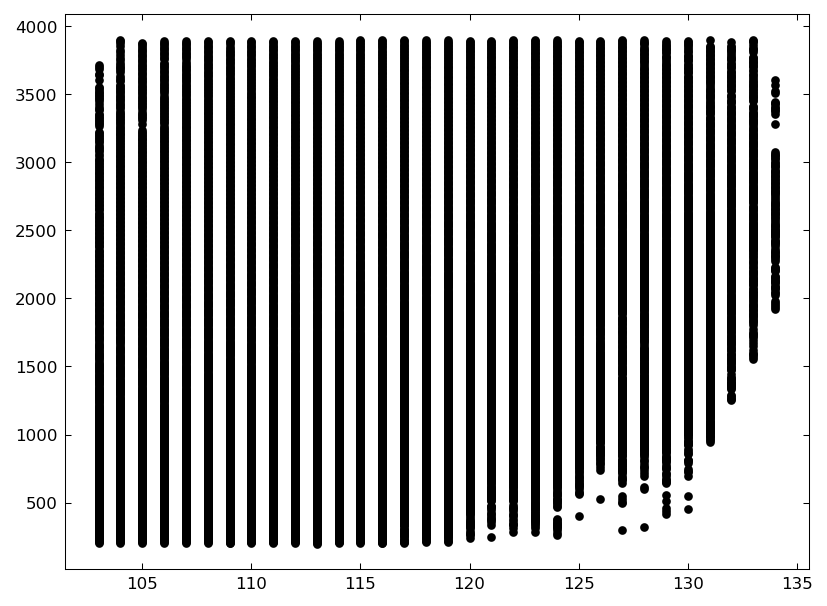

In [127]:
plt.close('all')
plt.scatter(order_positions[final_res_mask], pixel_positions[final_res_mask], c='k', s=10)
plt.show()

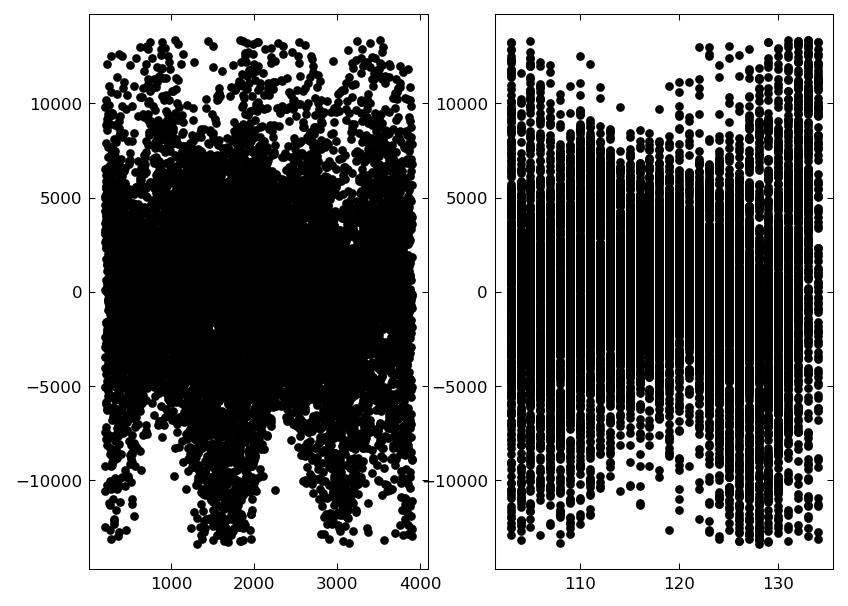

In [128]:
plt.close('all')
fig, ax = plt.subplots(1,2)
# ax.scatter(pixel_positions[final_res_mask], order_positions[final_res_mask], wave_positions[final_res_mask], c=resolution_positions[final_res_mask], cmap='viridis', s=10)
ax[0].scatter(pixel_positions[final_res_mask], res_residuals_xy[res_mask_xy], c='k', marker='o', s=10)
# ax[0].scatter(pixel_positions[initial_res_mask][~res_mask_xy], res_residuals_xy[~res_mask_xy], c='C3', marker='x', s=10)
ax[1].scatter(order_positions[final_res_mask], res_residuals_xy[res_mask_xy], c='k', marker='o', s=10)
# ax[1].scatter(order_positions[initial_res_mask][~res_mask_xy], res_residuals_xy[~res_mask_xy], c='C3', marker='x', s=10)
plt.show()

In [9]:
# %matplotlib inline
# plt.close('all')
# # mid_resolution = []
# # mid_wave = []
# for w, res, order in zip(wave, resolution_xy, ORDER):
#     print(f"Order {order}: resolution = {res[ylen//2]:.0f} at mid wavelength: {w[ylen//2]:.3f} nm")
#     plt.close('all')
#     plt.plot(w, res)
#     plt.scatter(wave_positions[order_positions == order], resolution_positions[order_positions == order], s=2, c='k', label='Resolution from lines')
#     plt.show()

##### Plot spectra with wave solution

In [105]:
# %matplotlib widget
%matplotlib inline

In [10]:
# j=0 
# for i, order in enumerate(ORDER):
#     if order in fitted_orders:
#         plt.close('all')
#         fig, ax = plt.subplots()
    
#         # Main plot: fit-guess pixel difference
#         guess_pixel = get_guess_pixel_for_lc_lines(i, vacuum_static_wave[i], traces, lc_lines)
#         order_mask = _order_positions == order
#         order_pixel = _pixel_positions[order_mask]
#         pixel_diff = order_pixel - guess_pixel
#         valid_mask = np.isfinite(pixel_diff)
#         # valid_pixels_in_wave = model.predict((np.column_stack([order_pixel[mask_valid], np.ones_like(order_pixel[mask_valid])*order])))/order
#         ax.scatter(order_pixel[valid_mask], pixel_diff[valid_mask], s=10, alpha=0.6, label=r'$\Delta$ Pixel (fit-guess)')
#         ax.set_xlim(traces.y[i].min(), traces.y[i].max())
        

#         # Secondary plot: wavelength vs delta lambda
#         ax2 = ax.twinx()
#         limit = (1000/c*new_wave[j])
#         y2 = (vacuum_static_wave[i]-new_wave[j])
#         # limit = (1000*np.ones_like(new_wave[j])
#         # y2 = (vacuum_static_wave[i]-new_wave[j])/new_wave[j]*c
#         ax2.plot(traces.y[i], y2, label=f'FibTh - SimLC wavesolution', color='red')
#         ax2.plot(traces.y[i], limit, 'b--', alpha=0.2, label=f'1000 m/s limit')
#         ax2.plot(traces.y[i], np.zeros_like(new_wave[j]), ls='--', color='blue', alpha=0.4)
#         ax2.plot(traces.y[i], -1*limit, 'b--', alpha=0.2)
        
#         # y_lim_wave_min =  abs(new_wave[j][1]-new_wave[j][0])*y_lim[0]
#         # y_lim_wave_max =  abs(new_wave[j][-2]-new_wave[j][-1])*y_lim[1]
#         # y_lim_wave_max =  model.predict(np.array([traces.y[i][-1]+y_lim[1], order]).transpose())/order

#         ###
#         ax.set_xlim(0, 4111)
        
#         ### align y-limits of both axes
#         ### compute fraction position of zero on ax (robust when 0 is outside the visible range)
#         y1_min, y1_max = ax.get_ylim()
#         # choose behaviour when primary axis doesn't include zero:
#         # - if 0 inside -> fractional position within [0,1]
#         # - if 0 outside -> align to nearest edge (bottom -> 0.0, top -> 1.0)
#         if np.isfinite(y1_min) and np.isfinite(y1_max) and (y1_max != y1_min):
#             if y1_min <= 0.0 <= y1_max:
#                 frac_zero = (0.0 - y1_min) / (y1_max - y1_min)
#             else:
#                 # zero outside primary axis: put zero at nearest edge
#                 frac_zero = 0.0 if 0.0 < y1_min else 1.0
#         else:
#             frac_zero = 0.5  # fallback (degenerate limits)

#         # Secondary axis data span (robustify against zero-span)
#         y2_min_data, y2_max_data = np.min(y2), np.max(y2)
#         span2 = y2_max_data - y2_min_data
#         if span2 == 0:
#             eps = max(1e-6, abs(y2_max_data) * 1e-3)
#             y2_min_data -= eps
#             y2_max_data += eps
#             span2 = y2_max_data - y2_min_data

#         # Option: ensure secondary axis range includes zero (so alignment can place zero inside)
#         include_zero_on_secondary = True  # set False to avoid expanding secondary limits
#         if include_zero_on_secondary:
#             y2_min_data = min(y2_min_data, 0.0)
#             y2_max_data = max(y2_max_data, 0.0)
#             span2 = y2_max_data - y2_min_data

#         # clamp frac_zero to [0,1] and compute new secondary limits so y2=0 sits at same fractional height
#         frac_zero = min(max(frac_zero, 0.0), 1.0)
#         new_y2_min = 0.0 - frac_zero * span2
#         new_y2_max = new_y2_min + span2
#         ax2.set_ylim(new_y2_min, new_y2_max)

#         # Add top x-axis for pixel positions
#         ax_top = ax.twiny()
#         ax_top.set_xlim(ax.get_xlim())
#         ax_top.set_xticks(ax.get_xticks())
#         # Interpolate pixel positions for top axis
#         # ax_top.set_xticklabels([f"{w:.1f}" for w in model.predict((np.column_stack([ax.get_xticks(), np.ones_like(ax.get_xticks())*order])))/order], color='red')
#         ax_top.set_xticklabels([f"{w:.1f}" for w in model.predict((np.column_stack([ax.get_xticks(), np.ones_like(ax.get_xticks())*order])))/order], color='red')
        
#         # label axes and title
#         ax.set_title(f"Order {order}, mean wavelength step {np.median(np.diff(new_wave[j])):.3f} nm")
#         ax.set_xlabel('Dispersion position [pixel]')
#         ax_top.set_xlabel(r'$\lambda$ [nm]', color='red')
#         ax.set_ylabel(r'$\Delta$ Pixel (fit-guess)')
#         ax2.set_ylabel(r'$\Delta \lambda$ [nm]', color='red')
#         ax.legend(loc='upper left')
#         ax2.legend(loc='lower right')

#         # Set all ticks to be 'in'
#         ax.tick_params(axis='both', which='both', direction='in')
#         ax2.tick_params(axis='both', which='both', direction='in')
#         ax_top.tick_params(axis='both', which='both', direction='in')
#         ax2.tick_params(axis='y', labelcolor='red')
#         plt.tight_layout()
#         plt.show()
#         plt.savefig(os.path.join(veloce_paths.wavelength_calibration_dir, f'LC_{arm}_order_{order}_pixel_fit_LC_vs_FibTh.png'), dpi=300)
#         j += 1

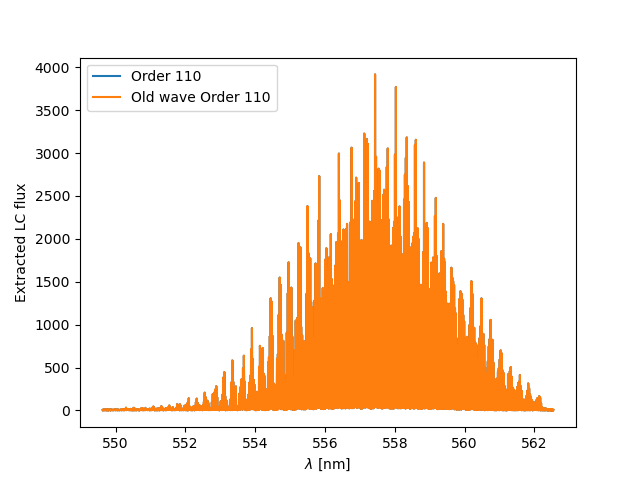

In [223]:
%matplotlib widget
selected_order = 110
selected_order_idx = np.where(np.array(fitted_orders) == selected_order)[0][0]
full_index = np.where(np.array(ORDER) == selected_order)[0][0]
# index in fitted_orders
plt.close('all')
plt.plot(new_wave[selected_order_idx], extracted_LC[full_index], label=f'Order {fitted_orders[selected_order_idx]}')
plt.plot(vacuum_static_wave[full_index], extracted_LC[full_index], label=f'Old wave Order {ORDER[full_index]}')
plt.xlabel(r'$\lambda$ [nm]')
plt.ylabel('Extracted LC flux')
plt.legend()
plt.show()

##### Plot solutions diff

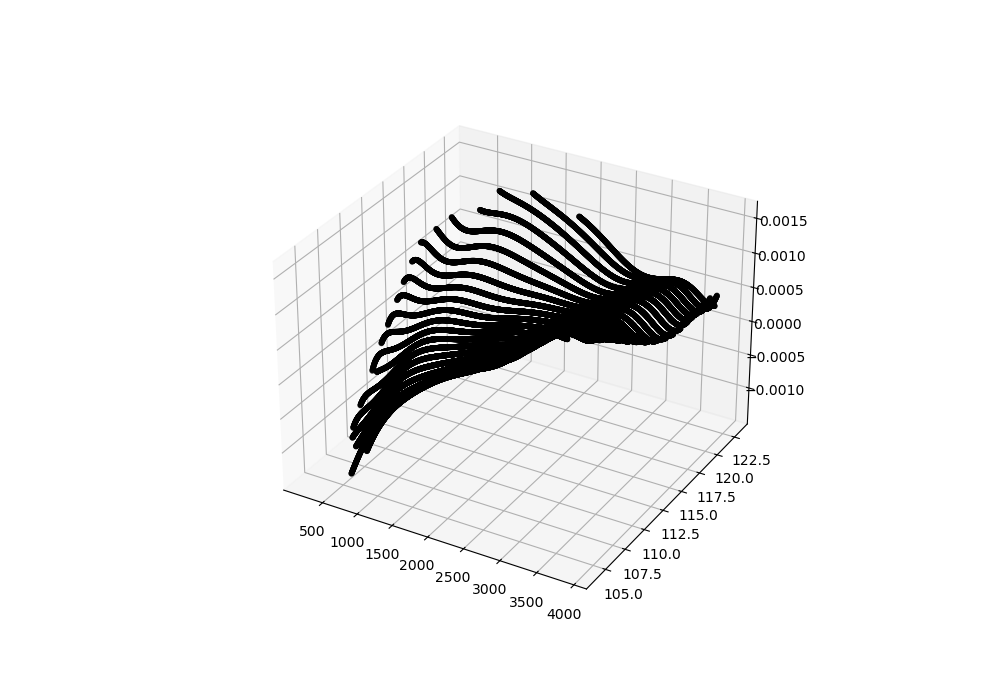

In [229]:
### plot difference between new vs old wave solution as a 3D surface x: pixel, y: order, z: delta wavelength
%matplotlib widget 
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')
# Create a meshgrid for pixel and order

_pixel, _order, _wave_difference = [], [], []
# for trace_y, order, wave_lc, wave_th in zip(traces.y, ORDER, new_wave, vacuum_static_wave):
#     _pixel.extend(trace_y)
#     _order.extend(order*np.ones_like(trace_y))
#     _wave_difference.extend(wave_th - wave_lc)

for i, order in enumerate(fitted_orders):
    full_index = np.where(np.array(ORDER) == order)[0][0]
    trace_y = traces.y[full_index]
    wave_lc = new_wave[i]
    wave_th = vacuum_static_wave[full_index]
    calibrated_pixels_mask = calibrated_pixels_per_order[full_index]

    _pixel.extend(trace_y[calibrated_pixels_mask])
    _order.extend(order*np.ones_like(trace_y[calibrated_pixels_mask]))
    _wave_difference.extend(wave_th[calibrated_pixels_mask] - wave_lc[calibrated_pixels_mask])

ax.scatter(_pixel, _order, _wave_difference, c='k', s=10,  label='Input data')

In [230]:
np.save(f'LC-onSky_offset_{arm}_{date}', np.array([_pixel, _order, _wave_difference]).T)

In [231]:
arm

'green'

In [232]:
offset_csv = np.load(f'LC-onSky_offset_{arm}_230826.npy') 
offset_delta = np.load(f'LC-onSky_offset_{arm}_250406.npy')

In [233]:
min_extracted_pixel, max_extracted_pixel = 0, 4111

In [234]:
%matplotlib widget

990.0 991.0 3028.0 3027.0
625.0 626.0 3625.0 3624.0
575.0 576.0 3322.0 3321.0
396.0 397.0 3821.0 3820.0
282.0 283.0 3846.0 3845.0
270.0 271.0 3895.0 3894.0
400.0 401.0 3895.0 3894.0
206.0 207.0 3895.0 3894.0
225.0 226.0 3895.0 3894.0
203.0 204.0 3894.0 3893.0
222.0 223.0 3893.0 3892.0
201.0 202.0 3892.0 3891.0
209.0 210.0 3891.0 3890.0
222.0 223.0 3890.0 3889.0
332.0 333.0 3889.0 3888.0
441.0 442.0 3865.0 3864.0
740.0 741.0 3897.0 3896.0
912.0 913.0 3895.0 3894.0
1284.0 1285.0 3893.0 3892.0
1842.0 1843.0 3774.0 3773.0


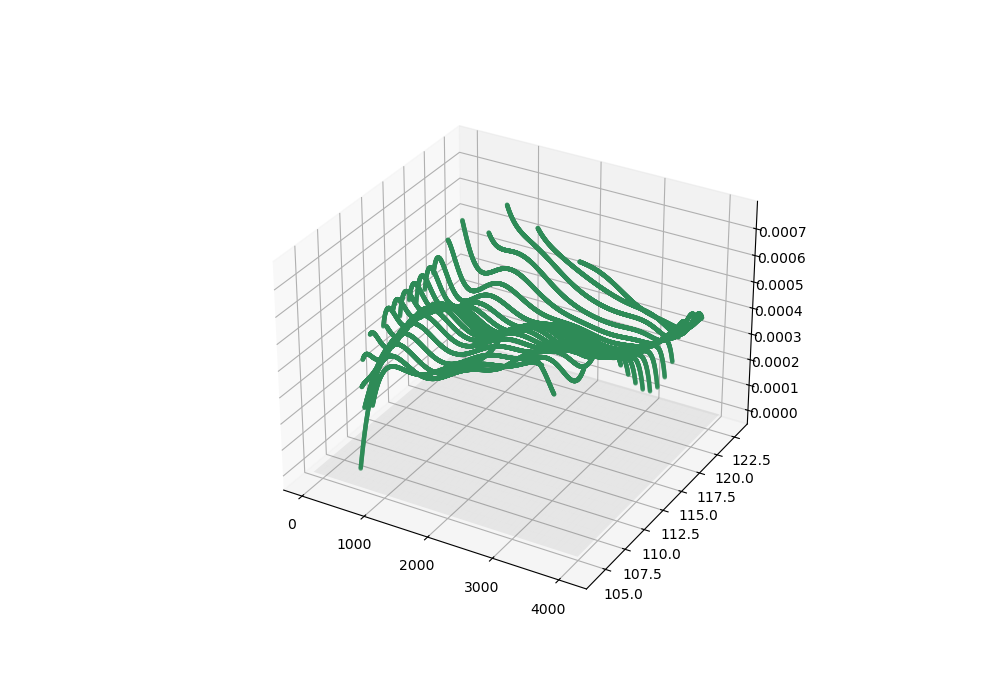

In [243]:
plt.close('all')
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')
# min_extracted_pixel, max_extracted_pixel =

# pixel_mask = (offset_csv[:,0] >= min_extracted_pixel+500) & (offset_csv[:,0] <= max_extracted_pixel-500)
# pixel_mask_delta = (offset_delta[:,0] >= min_extracted_pixel+500) & (offset_delta[:,0] <= max_extracted_pixel-500)
X, Y = np.meshgrid(np.linspace(min_extracted_pixel, max_extracted_pixel, 100), np.unique(offset_delta[:,1]))
ax.plot_surface(X, Y, np.zeros_like(X), alpha=0.1, color='gray')
for order in np.unique(offset_csv[:,1]):
    full_index = np.where(np.array(ORDER) == order)[0][0]
    
    # print(pixel_low_lim, pixel_up_lim)
    # pixel_mask = (offset_csv[:,0]>pixel_low_lim) & (offset_csv[:,0]<pixel_up_lim)
    order_mask = (offset_csv[:,1] == order)
    
    # ax.scatter(offset_csv[order_mask,0], offset_csv[order_mask,1], offset_csv[order_mask,2], c='b', s=10,  label='230826 data' if i==0 else "")
    if order in np.unique(offset_delta[:,1]):
        # pixel_mask_delta = (offset_delta[:,0]>pixel_low_lim) & (offset_delta[:,0]<pixel_up_lim)
        pixels_in_order = traces.y[full_index][calibrated_pixels_per_order[full_index]]
        pixel_low_lim, pixel_up_lim = np.min(pixels_in_order), np.max(pixels_in_order)
        order_mask_delta = (offset_delta[:,1] == order)
        # delta_mask = pixel_mask_delta*order_mask_delta
        # ax.scatter(offset_delta[order_mask_delta,0], offset_delta[order_mask_delta,1], offset_delta[order_mask_delta,2], c='r', s=10,  label='250406 data' if i==0 else "")
        _offset_pixels = offset_delta[order_mask_delta,0]
        # _csv_pixels = 
        _offset_orders = offset_delta[order_mask_delta,1]
        common_mask = np.isin(offset_delta[order_mask_delta,0], offset_csv[order_mask,0])
        _common_mask = np.isin(offset_csv[order_mask,0], offset_delta[order_mask_delta,0])
        _offset_diffs = offset_delta[order_mask_delta,2][common_mask]-offset_csv[order_mask,2][_common_mask]
        pixel_mask = (_offset_pixels>pixel_low_lim) & (_offset_pixels<pixel_up_lim)
        print(np.min(_offset_pixels), np.min(_offset_pixels[pixel_mask]), np.max(_offset_pixels), np.max(_offset_pixels[pixel_mask]))
        ax.scatter(_offset_pixels[pixel_mask], _offset_orders[pixel_mask], _offset_diffs[pixel_mask], c='seagreen', s=5, alpha=0.4)
plt.show()

In [239]:
# # min_extracted_pixel, max_extracted_pixel =
# %matplotlib inline
# plt.close('all')
# # pixel_mask = (offset_csv[:,0] >= min_extracted_pixel+500) & (offset_csv[:,0] <= max_extracted_pixel-500)
# # pixel_mask_delta = (offset_delta[:,0] >= min_extracted_pixel+500) & (offset_delta[:,0] <= max_extracted_pixel-500)
# for order in np.unique(offset_csv[:,1]):
    
#     fig, ax = plt.subplots(1, 1, figsize=(10, 7))
#     order_mask = (offset_csv[:,1] == order) #& pixel_mask
    
#     # ax.scatter(offset_csv[order_mask,0], offset_csv[order_mask,1], offset_csv[order_mask,2], c='b', s=10,  label='230826 data' if i==0 else "")
#     if order in np.unique(offset_delta[:,1]):
#         order_mask_delta = (offset_delta[:,1] == order) #& pixel_mask_delta
#         ax.plot(offset_delta[order_mask_delta,0], offset_delta[order_mask_delta,2], c='r')
#         # ax.scatter(offset_delta[order_mask_delta,0], offset_delta[order_mask_delta,2], c='seagreen', s=5, alpha=0.4)
#         # ax.scatter(offset_csv[order_mask,0], offset_csv[order_mask,2], c='orange', s=5, alpha=0.4)
#         plt.show()

In [157]:
common_mask = np.isin(offset_delta[:,1], offset_csv[:,1])
_common_mask = np.isin(offset_csv[:,1], offset_delta[:,1])
np.median(offset_csv[_common_mask,2]-offset_delta[common_mask,2]), np.min(offset_csv[_common_mask,2]-offset_delta[common_mask,2]), np.max(offset_csv[_common_mask,2]-offset_delta[common_mask,2])

(-0.0004581115793484969, -0.010021037487490503, 0.0002580710074653325)

In [331]:
offset_csv[_common_mask,2], offset_delta[common_mask,2]

(array([-0.00444525, -0.0044486 , -0.00445193, ..., -0.00132544,
        -0.00132421, -0.00132296]),
 array([-0.00906135, -0.00904402, -0.00902672, ...,  0.00237142,
         0.00238107,  0.00239075]))

##### Compare with LC reference method

In [29]:
ref_calib_wave, ref_calib_flux = veloce_wavecalib.calibrate_simLC(extracted_LC, veloce_paths, lc_data, header, arm, traces=traces, plot=True, filename=f'SimLC_ccf_test_{arm}_{date}')

(851,) (851,) (851,)
[Info] Fitting limit for LC peak fitting set to 5.50 pixel.
[Info] Closest peak to origin at 3 pixel shift (index 428).
(849,) (849,) (849,)
[Info] Fitting limit for LC peak fitting set to 6.00 pixel.
[Info] Closest peak to origin at 3 pixel shift (index 427).
(849,) (849,) (849,)
[Info] Fitting limit for LC peak fitting set to 6.50 pixel.
[Info] Closest peak to origin at 4 pixel shift (index 428).
(851,) (851,) (851,)
[Info] Fitting limit for LC peak fitting set to 5.00 pixel.
[Info] Closest peak to origin at 3 pixel shift (index 428).
(849,) (849,) (849,)
[Info] Fitting limit for LC peak fitting set to 6.00 pixel.
[Info] Closest peak to origin at 3 pixel shift (index 427).
(849,) (849,) (849,)
[Info] Fitting limit for LC peak fitting set to 6.00 pixel.
[Info] Closest peak to origin at 4 pixel shift (index 428).
(849,) (849,) (849,)
[Info] Fitting limit for LC peak fitting set to 6.50 pixel.
[Info] Closest peak to origin at 4 pixel shift (index 428).
(849,) (849,)

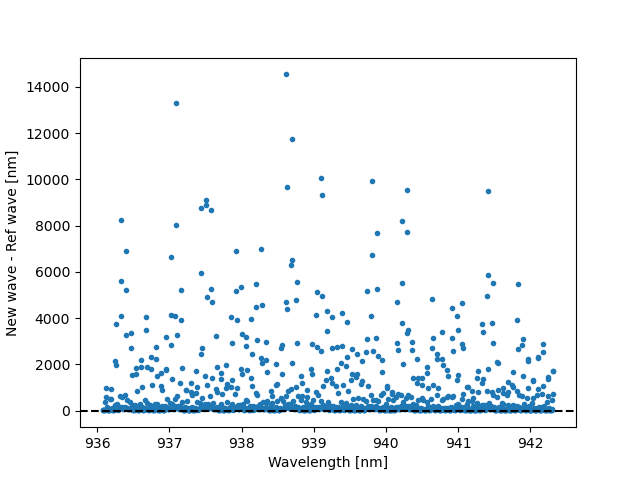

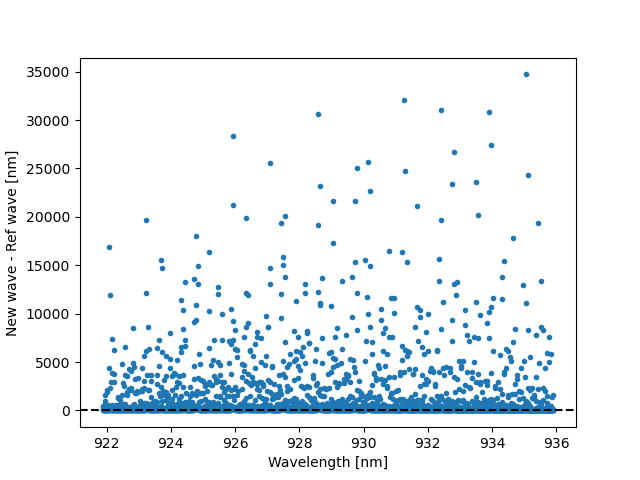

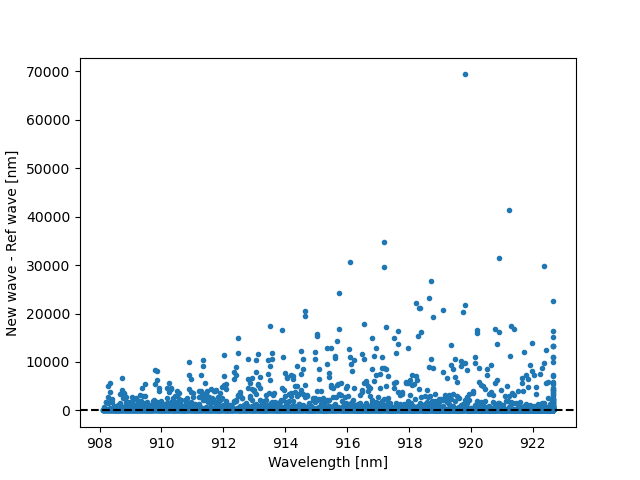

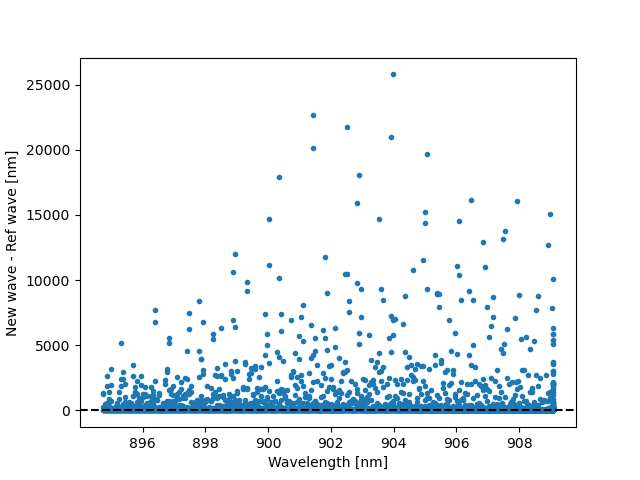

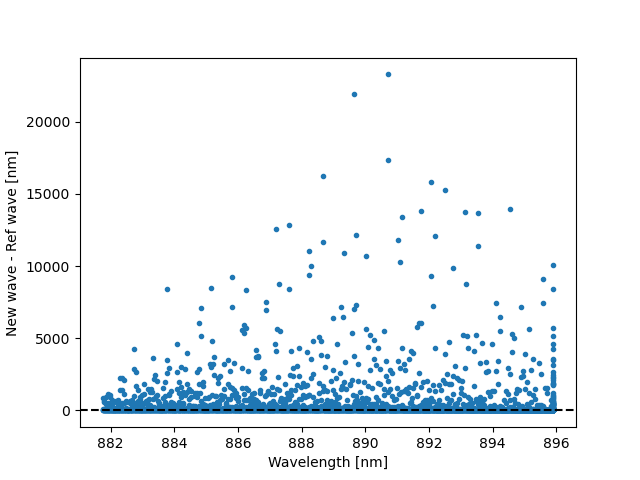

...

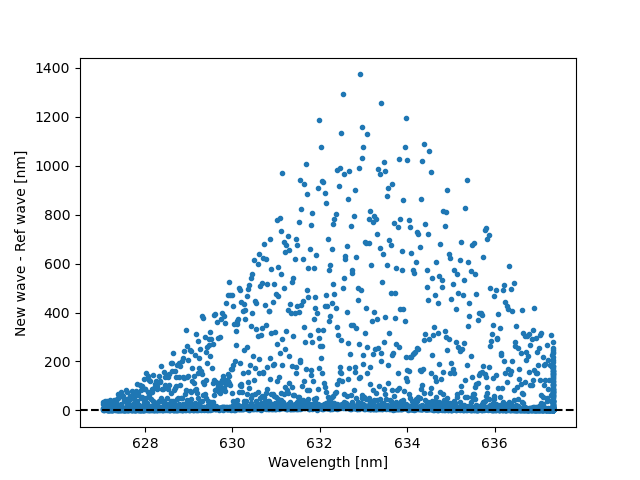

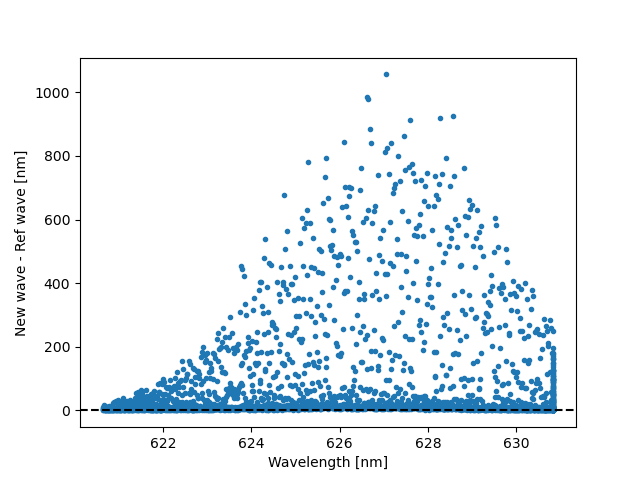

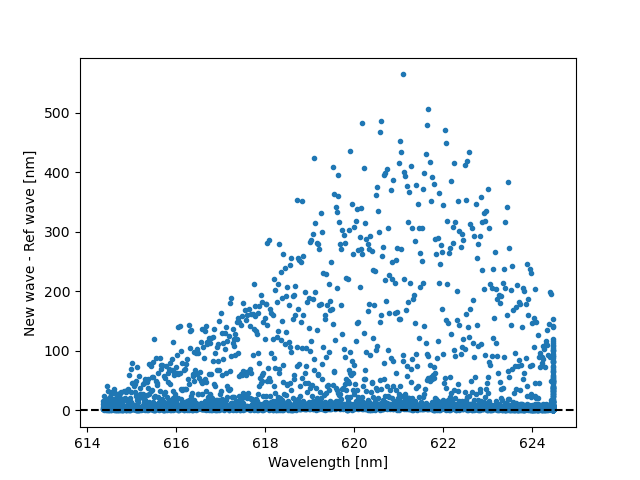

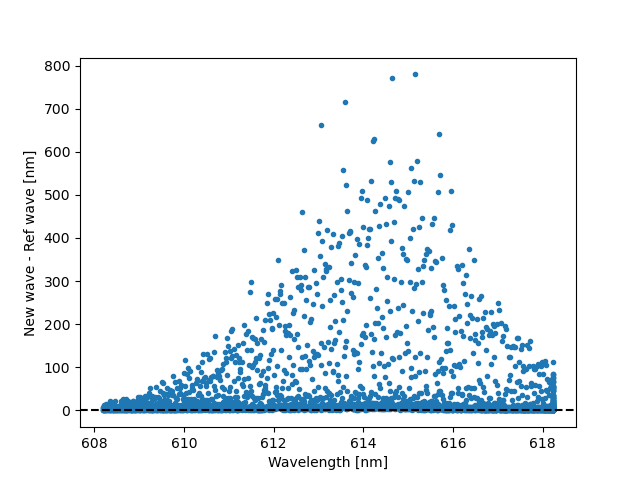

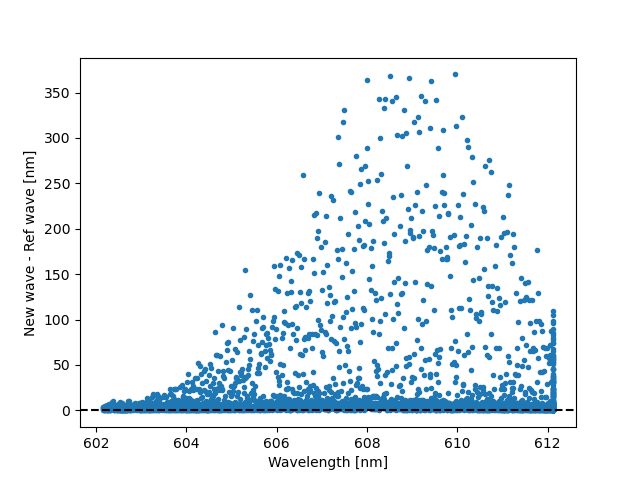

In [72]:
for ref_w, ref_f, w, f in zip(ref_calib_wave, ref_calib_flux, new_wave, fitted_extracted_LC):
    plt.close('all')
    plt.plot(ref_w, ref_f, '.')
    plt.axhline(0, ls='--', c='k')
    plt.xlabel('Wavelength [nm]')
    plt.ylabel('New wave - Ref wave [nm]')
    plt.show()

In [93]:
%matplotlib widget

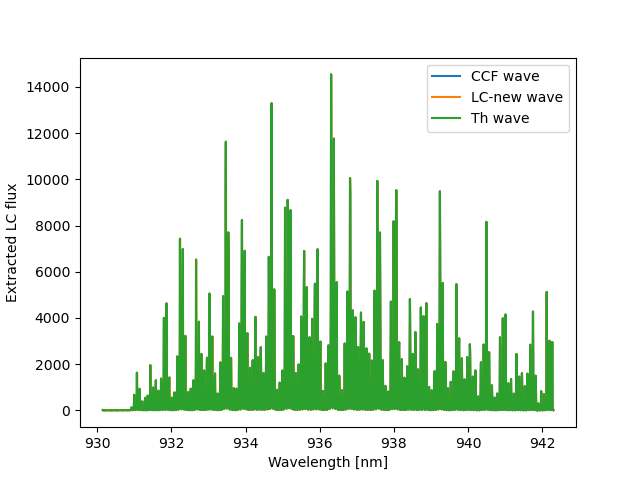

In [72]:
plt.close('all')
plt.plot(ref_calib_wave[0], ref_calib_flux[0], label='CCF wave')
plt.plot(new_wave[0], fitted_extracted_LC[0], label='LC-new wave')
plt.plot(vacuum_static_wave[0], extracted_LC[0], label='Th wave')
plt.xlabel('Wavelength [nm]')
plt.ylabel('Extracted LC flux')
plt.legend()
plt.show()

In [125]:
veloce_paths.wavelength_calibration_dir

'/home/usqobserver2/Joachim_veloce/Extracted_data/LC/Intermediate_results/Wavelength_calibration'

## Th arc lamp Wavelength Calibration

##### Load ARC ThAr calibration data

In [41]:
run = "CSV_Run"
# run = "WASP189b"
# run = "Delta_Call_2025_accretion"
date = "230828"
# date = "250406"
# date = "240410"
arm = 'red'
# arm = 'green'
# arm = 'blue'
ccd_nums = {'red': 3, 'green': 2, 'blue': 1}
ccd = f'ccd_{ccd_nums[arm]}'
amplifier_mode = 4
# amplifier_mode = 2
# filename = '26aug20055.fits'
# filename = '26aug20061.fits'
# science_targets = ['HD20203-USQ01']
science_targets = [None]
# science_targets = ['WASP189b']

In [42]:
input_dir = f'~/VeloceData/{run}/'
output_dir = f'~/VeloceExtracted/ThAr/'

In [43]:
veloce_paths = veloce_config.VelocePaths(input_dir=input_dir, output_dir=output_dir)

In [ ]:
config = {
    'run': run,
    'date': date,
    'arm': arm,
    'amplifier_mode': amplifier_mode,
    'science_targets': "Default",
    'use_log': False,  # True or False, if True the code will use the log files to identify the files
    'validate_trace': True
}

In [45]:
obs_list = veloce_config.load_night_logs(science_targets, veloce_paths, config)

In [46]:
# obs_list[f'ARC-ThAr_{arm}'][date]

In [98]:
# file_list = obs_list[f'ARC-ThAr_{arm}'][date]
# file_list = veloce_reduction_tools.get_longest_consecutive_files(file_list)
# file_list

['26aug30053.fits',
 '26aug30054.fits',
 '26aug30055.fits',
 '26aug30056.fits',
 '26aug30057.fits',
 '26aug30058.fits',
 '26aug30059.fits']

In [ ]:
# data, header = veloce_reduction_tools.get_master_mmap(file_list, input_dir, date, arm, amplifier_mode)

In [47]:
## master_filename = f'Master/master_ARC-ThAr_{arm}_{date}.fits'
master_filename = f'{veloce_paths.master_dir}/master_ARC-ThAr_{arm}_{date}.fits'
# veloce_reduction_tools.save_image_fits(master_filename, data, header)
with fits.open(master_filename) as hdul:
    data= hdul[0].data
    header = hdul[0].header

In [48]:
# traces = veloce_reduction_tools.Traces.load_traces(os.path.join(veloce_paths.trace_dir, f'veloce_{arm}_4amp_sim_calib_trace.pkl'))
traces = veloce_reduction_tools.Traces.load_traces(os.path.join(veloce_paths.trace_dir, f'veloce_{arm}_4amp_no_sim_calib_trace.pkl'))

In [49]:
# traces.set_traces([(trace_y, trace_x-2) for trace_y, trace_x, _, _ in traces])

In [50]:
%matplotlib widget

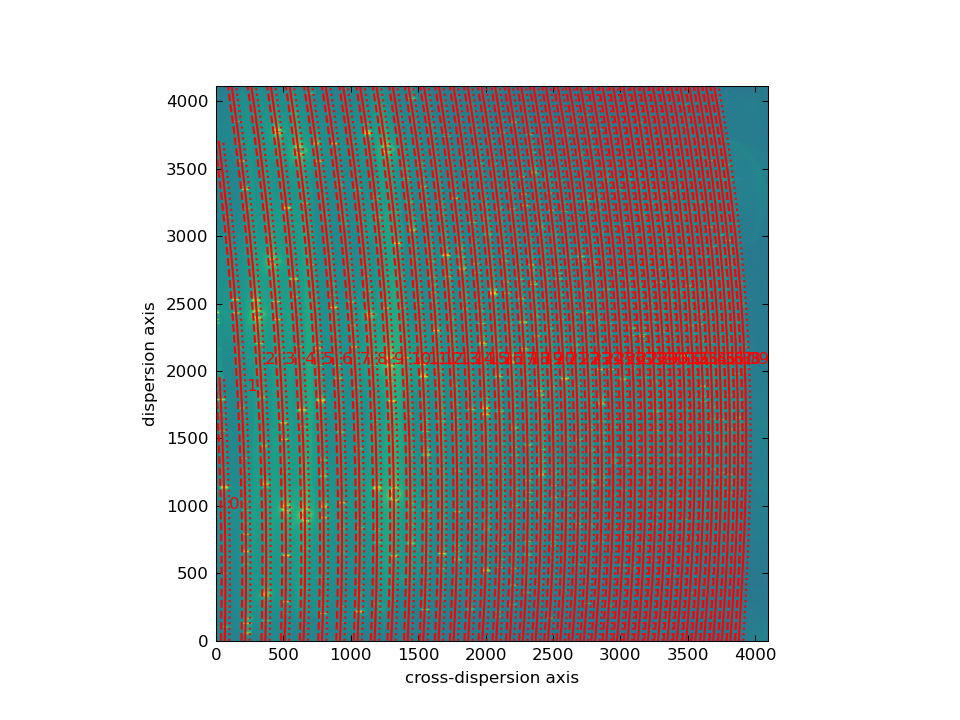

In [51]:
plt.close('all')
fig, axes = plt.subplots(1,1)
# order=-11
axes.imshow(data, origin='lower',aspect='equal', norm='symlog')
plt.xlabel('cross-dispersion axis')
plt.ylabel('dispersion axis')
# axes[1].imshow(data_2, origin='lower', norm='symlog')
for idx, (trace_y, trace_x, lower, upper) in enumerate(traces):
    plt.plot(trace_x, trace_y, c='r')
    plt.annotate(str(idx), (trace_x[len(trace_x)//2]+upper, trace_y[len(trace_y)//2]), color='red', fontsize=8)
    plt.plot(trace_x+upper,trace_y, ls=':', c='r')
    plt.plot(trace_x-lower,trace_y, ls='--', c='r')
# plt.plot(traces.x[order], traces.y[order], 'r--')
plt.xlim(0, data.shape[1]-1)
# plt.savefig(f'fibTh_{date}.png')
plt.show()

In [52]:
extracted_Th, uncertainty, extracted_Th_imgs = veloce_reduction_tools.extract_orders_with_trace(data, traces)

In [53]:
ORDER, COEFFS, MATCH_LAM, MATCH_PIX, MATCH_LRES, GUESS_LAM, Y0 = veloce_reduction_tools.load_prefitted_wave(arm=arm, wave_path=veloce_paths.wave_dir)
# wave = veloce_reduction_tools.calibrate_orders_to_wave(extracted_Th, Y0, COEFFS, traces=traces)

In [54]:
wave, ref_arcTh, _ = veloce_reduction_tools.load_extracted_spectrum_fits(
            os.path.join(veloce_paths.wave_dir, f"arcTh_wave_{arm}_230828.fits"))
wave = [order_wave[np.isfinite(order_wave)] for order_wave in wave]
ref_arcTh = [th_order[np.isfinite(th_order)] for th_order in ref_arcTh]

##### Th CCF offset test

In [33]:
# ref_run = "CSV_Run"
# ref_date = "230828"
# # ref_arm = 'red'
# ref_arm = arm
# ref_amplifier_mode = 4
# # science_targets = ['HD20203-USQ01']

In [34]:
# ref_input_dir = f'/home/usqobserver2/VeloceData/{ref_run}/'
# # ref_output_dir = f'/home/usqobserver2/Joachim_veloce/Extracted_data/ThAr/'
# ref_output_dir = f'/home/usqobserver2/Joachim_veloce/Extracted_data/{ref_run}/'

In [35]:
# ref_veloce_paths = veloce_config.VelocePaths(input_dir=ref_input_dir, output_dir=ref_output_dir)

In [36]:
# ref_obs_list = veloce_config.load_night_logs(ref_date, science_targets, arm, veloce_paths=ref_veloce_paths)

In [37]:
# # master_filename = f'Master/master_ARC-ThAr_{arm}_{date}.fits'
# ref_master_filename = f'{ref_veloce_paths.master_dir}/master_ARC-ThAr_{ref_arm}_{ref_date}.fits'
# # veloce_reduction_tools.save_image_fits(master_filename, data, header)
# with fits.open(ref_master_filename) as hdul:
#     ref_data= hdul[0].data
#     ref_header = hdul[0].header

In [38]:
# ref_traces = veloce_reduction_tools.Traces.load_traces(os.path.join(ref_veloce_paths.trace_dir, f'veloce_{arm}_4amp_no_sim_calib_trace.pkl'))

In [39]:
# ref_extracted_Th, ref_extracted_Th_imgs = veloce_reduction_tools.extract_orders_with_trace(ref_data, ref_traces)

In [40]:
# ref_flux = [veloce_wavecalib.normalise_ArcTh_order_with_spline(th_order+1, nknots=13) for th_order in ref_extracted_Th]

In [41]:
# data_flux = [veloce_wavecalib.normalise_ArcTh_order_with_spline(th_order+1, nknots=13) for th_order in extracted_Th]

In [73]:
%matplotlib widget

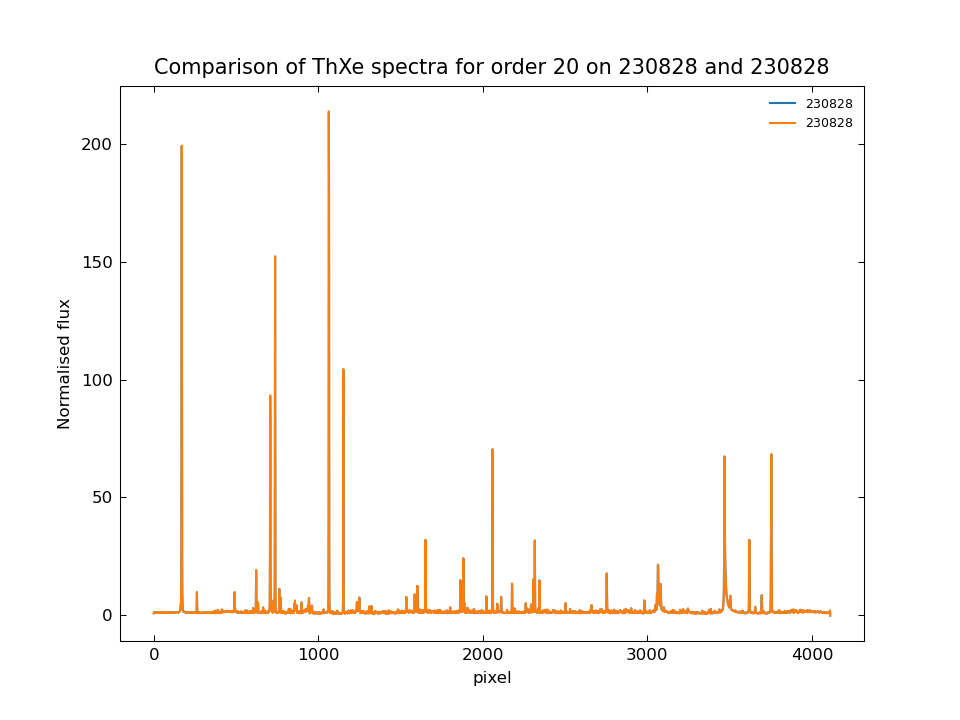

In [123]:
plt.close('all')
order = 20
# plt.plot(wave[order], veloce_wavecalib.normalise_ArcTh_order_with_spline(extracted_Th[order], nknots=15, plot=False), label=f'{date}')
plt.plot(veloce_wavecalib.normalise_ArcTh_order_with_spline(extracted_Th[order], nknots=15, plot=False), label=f'{date}')
# plt.plot(wave[order], veloce_wavecalib.normalise_ArcTh_order_with_spline(ref_arcTh[order], nknots=15, plot=False), label=f'{ref_date}')
# plt.plot(wave[order], veloce_wavecalib.normalise_ArcTh_order_with_spline(ref_arcTh[order], nknots=15, plot=False), label=f'230828')
plt.plot(veloce_wavecalib.normalise_ArcTh_order_with_spline(ref_arcTh[order], nknots=15, plot=False), label=f'230828')
plt.legend()
# plt.xlabel('Wavelength (nm)')
plt.xlabel('pixel')
plt.ylabel('Normalised flux')
# plt.title(f'Comparison of ThXe spectra for order {order} on {date} and {ref_date}')
plt.title(f'Comparison of ThXe spectra for order {order} on {date} and 230828')
plt.show()  

In [124]:
%matplotlib widget

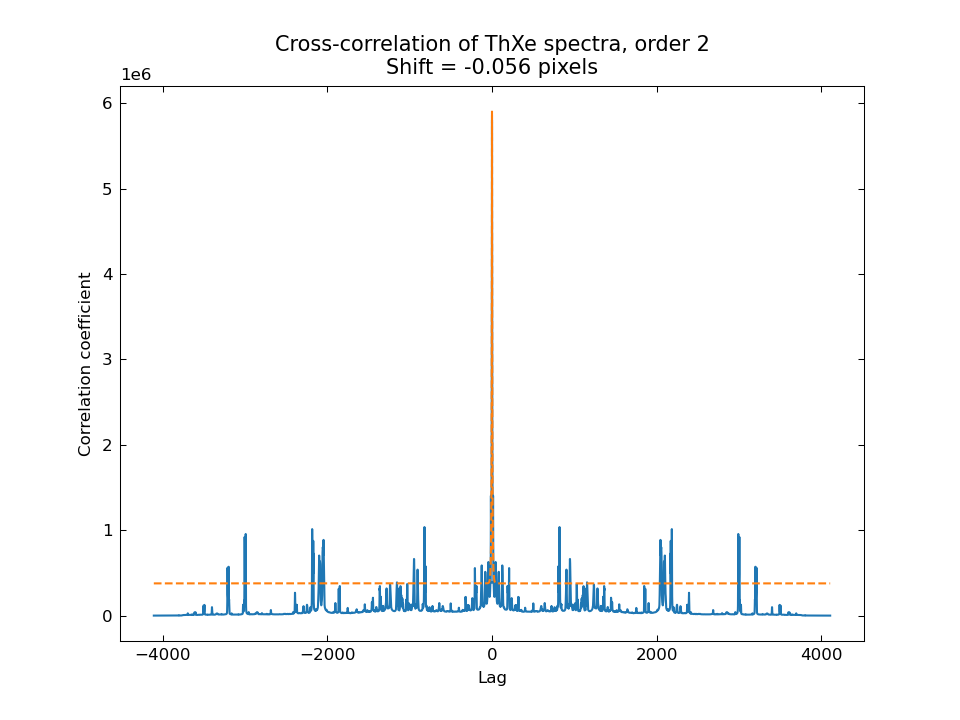

In [125]:
plt.close('all')
order = 2
th_ccf = np.correlate(veloce_wavecalib.normalise_ArcTh_order_with_spline(extracted_Th[order], nknots=13), veloce_wavecalib.normalise_ArcTh_order_with_spline(ref_arcTh[order], nknots=13), mode='full')
ref_pixel = np.arange(len(ref_arcTh[order]))
pixel_shift = np.arange(-len(ref_pixel) + 1, len(ref_pixel), 1)
# shift, popt = veloce_wavecalib.fit_lc_peak(pixel_shift, th_ccf)
shift, popt = fit_ccf_peak(pixel_shift, th_ccf, 50)
plt.plot(pixel_shift, th_ccf)
plt.plot(pixel_shift, veloce_wavecalib.general_gaussian(pixel_shift, *popt), ls='--')
plt.title(f'Cross-correlation of ThXe spectra, order {order}\nShift = {shift:.3f} pixels')
plt.xlabel('Lag')
plt.ylabel('Correlation coefficient')
plt.show()

In [126]:
# ref_order = [np.ones_like(trace_y)*i for i, trace_y in enumerate(ref_traces.y)]
ref_order = np.arange(len(traces.y))

# dispersion_position, orders_position, offset_array = veloce_wavecalib.calculate_offset_map(ref_order, ref_flux, ref_traces.y, data_flux, traces.y, number_of_parts=6, mode='Th')
dispersion_position, orders_position, offset_array = veloce_wavecalib.calculate_offset_map(ref_order, ref_arcTh, traces.y, extracted_Th, traces.y, number_of_parts=6, mode='Th')

In [127]:
%matplotlib inline

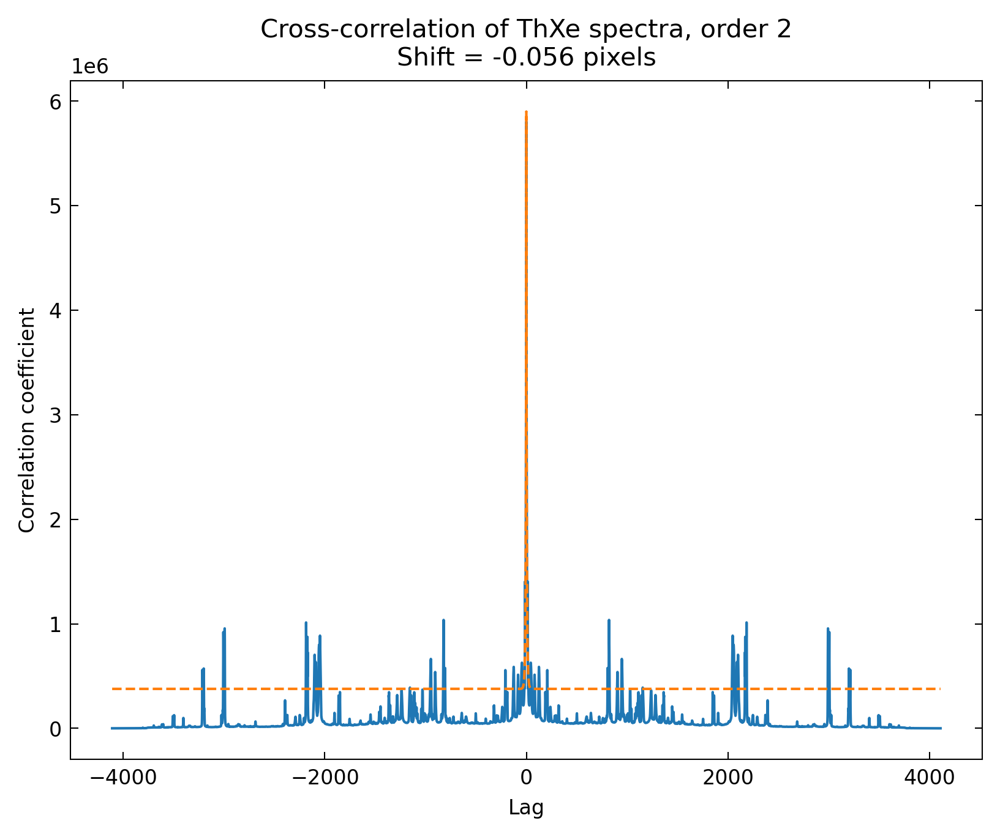

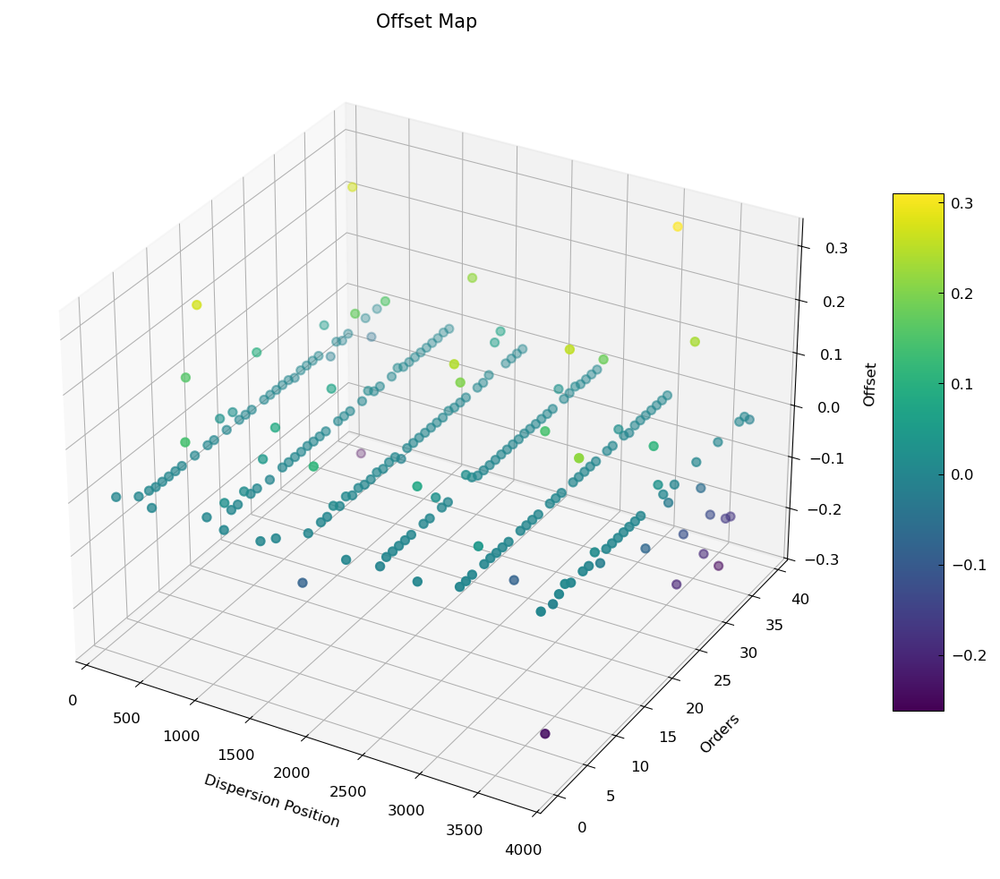

In [128]:
veloce_diagnostic.plot_offset_map(dispersion_position, orders_position, offset_array, veloce_paths=None, filename=None, show=True)

In [129]:
np.nanmedian(offset_array[abs(offset_array-np.nanmedian(offset_array))<=np.nanstd(offset_array)]), np.nanstd(offset_array[abs(offset_array-np.nanmedian(offset_array))<=np.nanstd(offset_array)])

(np.float64(3.0107544773001473e-09), np.float64(0.010692430652481728))

In [130]:
# offset = np.nanmedian(offset_array[abs(offset_array-np.nanmedian(offset_array))<=np.nanstd(offset_array)])
offset = 0.0
offset

0.0

##### All at once 

In [56]:
new_wave = veloce_wavecalib.calibrate_absolute_Th(traces, veloce_paths, obs_list,
                                                   date, arm, amplifier_mode,
                                                   plot=True, plot_filename=f'{run}_{date}_{arm}_th_calib',
                                                   th_linelist_filename='Default')

Reading existing wavelength solution file arcTh_wave_green_250406.fits


In [ ]:
# new_wave = veloce_wavecalib.calibrate_absolute_Th(ref_traces, ref_veloce_paths, ref_obs_list,
#                                                    date, arm, amplifier_mode,
#                                                    plot=True, plot_filename='delta_call_2025',
#                                                    th_linelist_filename='Default')

##### Load atomic data

In [55]:
# raw linelist processing
# nist_linelist = load_NIST_linelist('/home/usqobserver2/Joachim_veloce/veloce_reduction_dev/veloce_reduction/Wave/th_linelist_NIST.csv')

In [56]:
# cite = """@Misc{NIST_ASD,
#     author = {A.~Kramida and {Yu.~Ralchenko} and
#     J.~Reader and {and NIST ASD Team}},
#     HOWPUBLISHED = {{NIST Atomic Spectra Database
#     (ver. 5.12), [Online]. Available:
#     {\tt{https://physics.nist.gov/asd}} [2025, July 22].
#     National Institute of Standards and Technology,
#     Gaithersburg, MD.}},
#     year = {2024},
#     }"""
# notes = "350nm-950nm air, with uncertainties, only without intensity flags, relative intensity above 50"
# filtered_nist_linelist = nist_linelist[(nist_linelist['intens_flag']=='1') & (nist_linelist['intens']>50)]
# atomic_data = {'linelist': filtered_nist_linelist, 'cite': cite, 'notes': notes, date: datetime.datetime.now().date()}
# linelist_filename = './Wave/th_linelist_NIST.pickle'
# with open(linelist_filename, 'wb') as file:
#     pickle.dump(atomic_data, file)

In [57]:
nist_linelist = veloce_wavecalib.load_Th_linelist(veloce_paths, filename='Default', linelist_type='NIST')

Loaded line list
 Notes: 350nm-950nm air, with uncertainties, only without intensity flags, relative intensity above 50 
 Cite as: 
 @Misc{NIST_ASD,
    author = {A.~Kramida and {Yu.~Ralchenko} and
    J.~Reader and {and NIST ASD Team}},
    HOWPUBLISHED = {{NIST Atomic Spectra Database
    (ver. 5.12), [Online]. Available:
    {	t{https://physics.nist.gov/asd}} [2025, July 22].
    National Institute of Standards and Technology,
    Gaithersburg, MD.}},
    year = {2024},
    }



In [58]:
# err = nist_linelist[nist_linelist['intens']>200]['unc_obs_wl']
# err.mean(), err.std(), np.max(err), np.min(err)

In [59]:
# vald_linelist = load_vald_linelist('~/veloce_reduction/Wave/th_linelist_VALD.csv')

In [60]:
# uves_linelist = load_UVES_linelist('~/veloce_reduction/Wave/thar_UVES_MM090311.dat')

In [61]:
# manual_linelist = load_lines_from_solution_in_manual(MATCH_LAM)

### Fit Th lines

##### Plot seleced order with line positions

In [61]:
%matplotlib widget
# %matplotlib inline

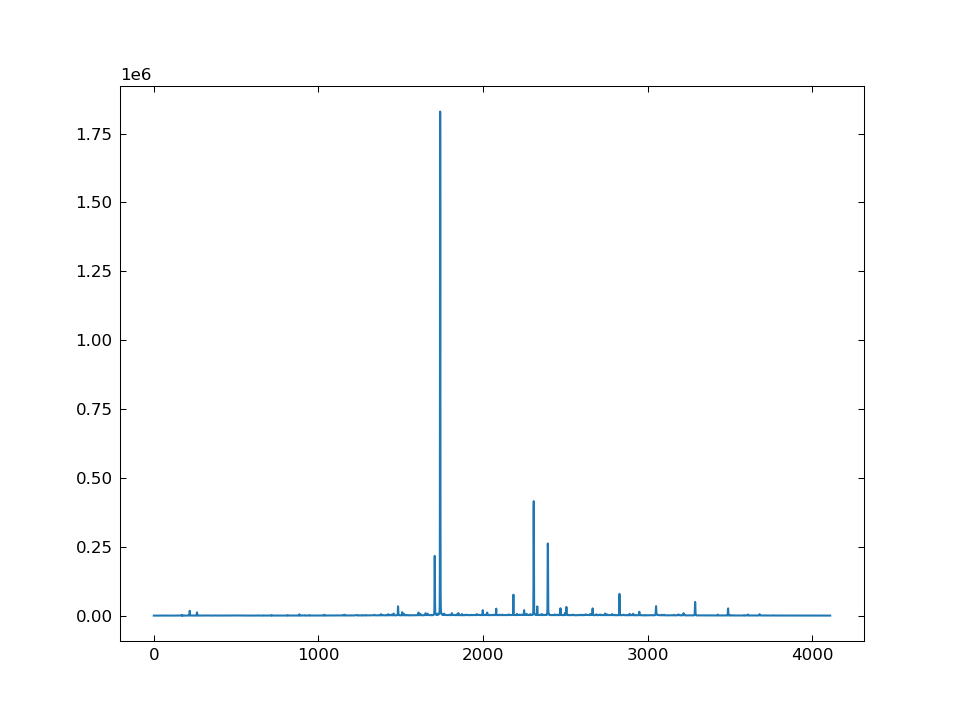

In [62]:
order = 20
plt.close('all')
plt.plot(extracted_Th[order], label='Extracted Th')
plt.show()

In [130]:
# ### TODO: add new_wave offset
plt.close('all')
veloce_wavecalib.plot_order_with_lines(
    # veloce_reduction_tools.vacuum_to_air(wave[order]),
    wave[order],
    veloce_wavecalib.normalise_ArcTh_order_with_spline(extracted_Th[order], nknots=15, plot=False),
    nist_linelist)
    # original_solution=(MATCH_LAM[order], GUESS_LAM[order]))
# plt.ylim(0,20)
# plt.xlim(493.5,494.5)
plt.xlabel(r'$\lambda$ [nm]')
plt.ylabel('Normalised flux')
plt.show()

AttributeError: module 'simple_veloce_reduction.veloce_wavecalib' has no attribute 'plot_order_with_lines'

##### Fit all lines

In [62]:
if arm =='blue':
    nknots=13
elif arm == 'green':
    nknots=15
elif arm == 'red':
    nknots=17
norm_extracted_Th = [veloce_wavecalib.normalise_ArcTh_order_with_spline(th_order, nknots=nknots) for th_order in extracted_Th]

In [68]:
# veloce_wavecalib.normalise_ArcTh_order_with_spline(extracted_Th[order], nknots=21, node_distribution='linear', plot=True)

In [60]:
# norm_extracted_Th_order = norm_extracted_Th[order]

In [63]:
offset = 0.0

In [64]:
order = 1
lines_pixel_positions, lines_wave_positions, _fitted_lines, lines_sigmas = veloce_wavecalib.fit_lines_in_order(
            wave[order],
            norm_extracted_Th[order],
            traces.y[order],
            nist_linelist, arm, offset=offset, plot=False)

In [65]:
# %matplotlib inline
order = 5
_lines_pixel_positions, _lines_wave_positions, _fitted_lines, _lines_sigmas, _lines_weight, _criteria_use = fit_Th_lines_in_order(
            wave[order],
            norm_extracted_Th[order],
            # extracted_Th[order],
            traces.y[order],
            nist_linelist, arm, offset=offset, plot=False)

Line 863.574 nm discarded due to failed criteria: peak_position.
No peaks found for line 863.836 nm.
No peaks found for line 863.944 nm.
Line 864.915 nm discarded due to failed criteria: asymmetry; peak_position.
Line 868.662 nm discarded due to failed criteria: n_points.
Line 869.860 nm discarded due to failed criteria: peak_position.
Line 870.736 nm discarded due to failed criteria: n_points.
Line 871.042 nm discarded due to failed criteria: asymmetry.
Line 873.978 nm discarded due to failed criteria: asymmetry; peak_position.
Line 877.238 nm discarded due to failed criteria: peak_position.


/var/folders/y3/9pjs_36s4dl_fswjd_qhk3yc0000gn/T/ipykernel_46183/3197064231.py:208: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, _ = curve_fit(general_gaussian, x_fit_masked, y_fit_masked, p0=p0, bounds=bounds) # use general gaussian for peak position


Line 878.414 nm discarded due to failed criteria: peak_height.
Line 881.025 nm discarded due to failed criteria: peak_height; asymmetry.
No peaks found for line 881.251 nm.
No peaks found for line 881.774 nm.
Line 882.042 nm discarded due to failed criteria: asymmetry; peak_position.
No peaks found for line 882.176 nm.
Line 882.969 nm discarded due to failed criteria: peak_position.
----------------------------------------
Lines fitted: 46 out of 63 lines in the order.
Criteria failed for lines in the order: 7 failed peak height, 5 failed asymmetry, 7 failed peak position, 2 failed number of points.
----------------------------------------
----------------------------------------


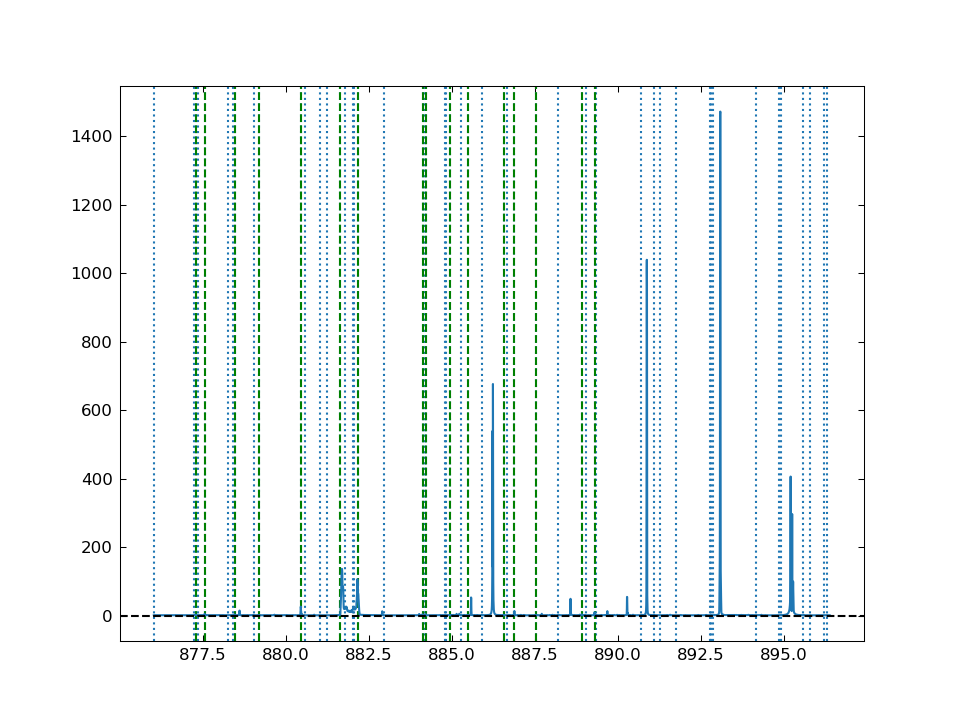

In [158]:

%matplotlib widget
plt.close('all')
order = 4
lines = get_lines_in_order(wave[order], nist_linelist, intensity_threshold=100)
# lines = get_lines_in_order(veloce_reduction_tools.vacuum_to_air(wave[order]), nist_linelist, elements=['Th', 'Xe'], intensity_threshold=100)
for line in lines:
    plt.axvline(line['obs_wl_air(nm)'], c='C0', ls=':', label="linelist")
for line in _fitted_lines['obs_wl_air(nm)']:
    plt.axvline(line, c='g', ls='--', label="fitted line")
plt.plot(wave[order], norm_extracted_Th[order])
# plt.plot(wave[order], extracted_Th[order])
plt.axhline(0, ls='--', c='k')
plt.show()

In [66]:
# air_wave = [veloce_reduction_tools.vacuum_to_air(wave[i]) for i in range(len(wave))]

pixel_positions, wave_positions, order_positions, fwhms = veloce_wavecalib.fit_all_lines_per_order(
        # air_wave,
        wave,
        norm_extracted_Th,
        # extracted_Th,
        ORDER,
        traces,
        nist_linelist,
        arm,
        offset=offset,
        veloce_paths=veloce_paths,
        plot=False
)

/Users/jjkruger/veloce_reduction/simple_veloce_reduction/veloce_wavecalib.py:1206: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, _ = curve_fit(general_gaussian, x_fit_masked, y_fit_masked, p0=p0, bounds=bounds)


In [67]:
_pixel_positions, _wave_positions, _order_positions, _fwhms, _weights = fit_all_Th_lines_per_order(
        # air_wave,
        wave,
        norm_extracted_Th,
        # extracted_Th,
        ORDER,
        traces,
        nist_linelist,
        arm,
        offset=offset,
        veloce_paths=veloce_paths,
        plot=False
)

No peaks found for line 930.001 nm.
Line 932.007 nm discarded due to failed criteria: peak_height; asymmetry; n_points.
Line 933.616 nm discarded due to failed criteria: asymmetry.
Line 934.409 nm discarded due to failed criteria: asymmetry.
Line 934.421 nm discarded due to failed criteria: asymmetry.
No peaks found for line 942.062 nm.
----------------------------------------
Lines fitted: 15 out of 21 lines in the order.
Criteria failed for lines in the order: 3 failed peak height, 4 failed asymmetry, 0 failed peak position, 1 failed number of points.
----------------------------------------
----------------------------------------
No peaks found for line 916.426 nm.
Line 916.779 nm discarded due to failed criteria: peak_position.
No peaks found for line 917.082 nm.
Line 917.508 nm discarded due to failed criteria: asymmetry; peak_position.
Line 917.697 nm discarded due to failed criteria: peak_height; asymmetry.
Line 918.850 nm discarded due to failed criteria: peak_height; asymmetr

/var/folders/y3/9pjs_36s4dl_fswjd_qhk3yc0000gn/T/ipykernel_46183/3197064231.py:208: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, _ = curve_fit(general_gaussian, x_fit_masked, y_fit_masked, p0=p0, bounds=bounds) # use general gaussian for peak position


Line 927.649 nm discarded due to failed criteria: peak_position.
Line 934.409 nm discarded due to failed criteria: asymmetry.
Line 934.421 nm discarded due to failed criteria: asymmetry.
No peaks found for line 935.599 nm.
----------------------------------------
Lines fitted: 44 out of 56 lines in the order.
Criteria failed for lines in the order: 6 failed peak height, 7 failed asymmetry, 4 failed peak position, 0 failed number of points.
----------------------------------------
----------------------------------------
Line 903.182 nm discarded due to failed criteria: peak_position.
Line 904.535 nm discarded due to failed criteria: asymmetry; n_points.
No peaks found for line 904.671 nm.
No peaks found for line 904.696 nm.
Line 904.852 nm discarded due to failed criteria: peak_position.
Line 905.608 nm discarded due to failed criteria: peak_height; asymmetry.
Line 905.826 nm discarded due to failed criteria: peak_height; asymmetry; peak_position.
Line 905.926 nm discarded due to faile

In [69]:
len(_pixel_positions), len(pixel_positions)

(2040, 833)

In [180]:
np.nanmedian(fwhms), np.nanstd(fwhms), np.nanmedian(_fwhms), np.nanstd(_fwhms)

(np.float64(2.028490753780835),
 np.float64(0.8027188813823818),
 np.float64(2.2486481792749196),
 np.float64(0.9813226968413118))

### Fit wavelength solution

##### Fit Polynomial per order

In [ ]:
### not used in the end

In [ ]:
# polynomials = fit_polynomial_per_order(pixel_positions, order_positions, wave_positions, degree=5, sigma_clip=1.8)
# new_wave = [poly[0](y) for poly, y in zip(polynomials.values(), traces.y)]

/tmp/ipykernel_13418/31139360.py:16: RankWarning: Polyfit may be poorly conditioned
  coeffs = np.polyfit(x[inlier_mask], y[inlier_mask], degree)


##### Plot poly fit

In [58]:
# %matplotlib inline
# plt.close('all')

In [59]:
# %matplotlib inline
# plt.close('all')

# unique_orders = np.unique(order_positions)
# fig, axs = plt.subplots(len(unique_orders), 1, figsize=(8, 3 * len(unique_orders)), sharex=True)

# if len(unique_orders) == 1:
#     axs = [axs]

# for i, order in enumerate(unique_orders):
#     mask = order_positions == order
#     x = pixel_positions[mask]
#     y = wave_positions[mask]
#     poly, residuals, inlier_mask = polynomials[order]
#     x_fit = np.linspace(x.min(), x.max(), 500)
#     y_fit = poly(x_fit)
#     axs[i].scatter(x, y, s=10, c='k', label='Data')
#     axs[i].plot(x_fit, y_fit, 'r-', label='Fitted polynomial')
#     axs[i].set_title(f'Order {order}')
#     axs[i].set_ylabel('Wavelength (nm)')
#     axs[i].legend()

# axs[-1].set_xlabel('Pixel')
# plt.tight_layout()
# plt.show()

In [ ]:
# %matplotlib inline
# plt.close('all')

# unique_orders = np.unique(order_positions)
# fig, axs = plt.subplots(len(unique_orders), 1, figsize=(8, 3 * len(unique_orders)), sharex=True)

# if len(unique_orders) == 1:
#     axs = [axs]

# for i, order in enumerate(unique_orders):
#     mask = order_positions == order
#     x = pixel_positions[mask]
#     y = wave_positions[mask]
#     poly, residuals, inlier_mask = polynomials[order]
#     # x_fit = np.linspace(x.min(), x.max(), 500)
#     y_fit = poly(x)
#     axs[i].scatter(x[inlier_mask], y[inlier_mask] - y_fit[inlier_mask], marker='o', s=5, color='k', label='residuals')
#     axs[i].scatter(x[~inlier_mask], y[~inlier_mask] - y_fit[~inlier_mask], marker='x', s=5, color='r', label='outliers')
#     _wave = poly(np.arange(4012))
     
#     axs[i].axhline(0, color='gray', ls='--')
#     # axs[i].plot(x_fit, y_fit, 'r-', label='Fitted polynomial')
#     # uncertainty = np.std(residuals[inlier_mask])/np.sqrt(np.sum(inlier_mask)) * np.nanmean(np.diff(_wave)) / np.nanmean(_wave) * c
#     # uncertainty = np.std(residuals[inlier_mask]) * np.nanmean(np.diff(_wave)) / np.nanmean(_wave) * c
#     uncertainty = np.std(residuals[inlier_mask]/y[inlier_mask]) * c / np.sqrt(np.sum(inlier_mask))
#     axs[i].set_title(f'Order {order}, {uncertainty:.4f} m/s')
#     axs[i].set_ylabel(r'$\Delta$ Wavelength (nm)')
#     axs[i].legend()

# axs[-1].set_xlabel('Pixel')
# plt.tight_layout()
# plt.show()

In [ ]:
# polynomial_residuals, polynomial_mask, polynomial_wave = [], [], []
# for order, trace_y in zip(unique_orders, traces.y):
#     polynomial_wave.append(polynomials[order][0](trace_y))
#     polynomial_residuals.extend(polynomials[order][1])
#     polynomial_mask.extend(polynomials[order][2])
# polynomial_residuals = np.array(polynomial_residuals)
# polynomial_mask = np.array(polynomial_mask, dtype=bool)

In [ ]:
# np.std(polynomial_residuals[polynomial_mask]/wave_positions[polynomial_mask])*c / np.sqrt(np.sum(polynomial_mask))

64.13565831560054

In [ ]:
# np.mean(polynomial_residuals[polynomial_mask])

8.435295111250901e-06

##### Fit surface wavesolution

In [181]:
max_extracted_pixel = max([max(trace_y) for trace_y in traces.y])
min_extracted_pixel = min([min(trace_y) for trace_y in traces.y])
full_pixels = np.array([np.arange(min_extracted_pixel, max_extracted_pixel + 1) for _ in range(len(extracted_Th))])

In [182]:
pixel_positions, order_positions, wave_positions = _pixel_positions, _order_positions, _wave_positions

In [84]:
# Z, C, fitted_points, residuals, mask = fit_surface_custom(pixel_positions, order_positions, wave_positions, full_pixels, degree=3)

In [183]:
if arm == 'red':
    Z, residuals, mask, model, converged = veloce_wavecalib.fit_surface_sklearn(pixel_positions, order_positions, wave_positions*order_positions, full_pixels, degree=7, sigma_clip=2.3, n_limit=9, robust=False) # red
elif arm == 'green':
    Z, residuals, mask, model, converged = veloce_wavecalib.fit_surface_sklearn(pixel_positions, order_positions, wave_positions*order_positions, full_pixels, degree=7, sigma_clip=2.4, n_limit=9, robust=False, max_iter=2000) # green
elif arm == 'blue':
    # Z, residuals, mask, model, converged = veloce_wavecalib.fit_surface_sklearn(pixel_positions, order_positions, wave_positions, full_pixels, degree=5, sigma_clip=2.4, n_limit=7, robust=False, max_iter=2000) 
    Z, residuals, mask, model, converged = veloce_wavecalib.fit_surface_sklearn(pixel_positions, order_positions, wave_positions*order_positions, full_pixels, degree=6, sigma_clip=2.3, n_limit=8, robust=False) # blue
stdev_vel = np.std(residuals[mask]/order_positions[mask]/wave_positions[mask])*c/np.sqrt(np.sum(mask))
print(f"SEM: {stdev_vel:.2f} m/s, with mean deviation from model: {np.mean(residuals[mask]):.2e}, based on {np.sum(mask)}/{len(mask)} points.")

Converged.
Std of residuals dropped from 0.374 to 0.032 after 15 iterations.
SEM: 4.50 m/s, with mean deviation from model: -1.68e-11, based on 1202/2040 points.


##### Plot Surface Fit

In [184]:
%matplotlib inline

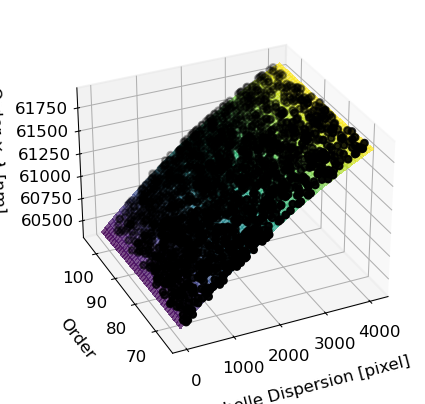

In [185]:
# veloce_diagnostic.plot_ArcTh_surface(
#     Z, pixel_positions, order_positions, wave_positions, full_pixels,
#     veloce_paths, filename=None, show=True)
plot_ArcTh_surface(
    Z, pixel_positions, order_positions, wave_positions, full_pixels,
    veloce_paths, filename=None, show=True)

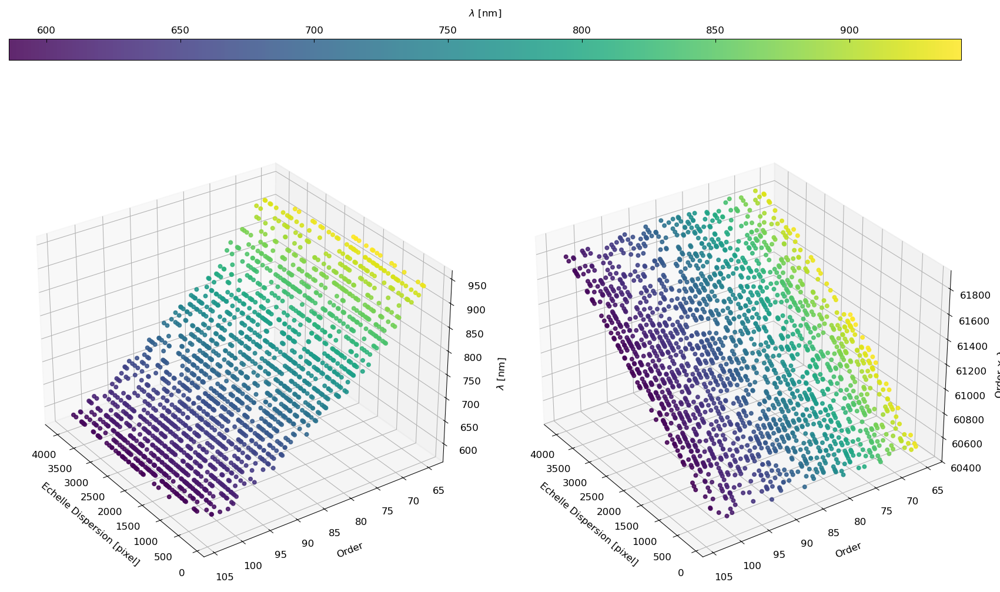

In [186]:
plt.close('all')

fig = plt.figure(figsize=(12, 8))
gs = fig.add_gridspec(1, 2, wspace=0.1, left=0.05, right=0.95, top=0.85, bottom=0.05)

# tighten subplot boxes a bit so the two 3D axes and the horizontal colorbar fit nicely
bbox0 = gs[0, 0].get_position(fig)
bbox1 = gs[0, 1].get_position(fig)
pad = 0.02  # horizontal padding between the two subplots

ax1 = fig.add_subplot(gs[0, 0], projection='3d')
# shrink each subplot a little to give breathing room
ax1.set_position([bbox0.x0, bbox0.y0, bbox0.width - pad, bbox0.height])
ax1.view_init(elev=30, azim=145)
sc = ax1.scatter(pixel_positions, order_positions, wave_positions, c=wave_positions, cmap='viridis', s=8, alpha=0.85)
ax1.set_xlabel('Echelle Dispersion [pixel]')
ax1.set_ylabel('Order')
ax1.set_zlabel(r'$\lambda$ [nm]')
ax1.tick_params(labelsize=8)

ax2 = fig.add_subplot(gs[0, 1], projection='3d')
ax2.set_position([bbox1.x0 + pad, bbox1.y0, bbox1.width - pad, bbox1.height])
ax2.view_init(elev=30, azim=145)
sc2 = ax2.scatter(pixel_positions, order_positions, order_positions * wave_positions, c=wave_positions, cmap='viridis', s=8, alpha=0.85)
ax2.set_xlabel('Echelle Dispersion [pixel]')
ax2.set_ylabel('Order')
ax2.set_zlabel('Order × λ')
ax2.tick_params(labelsize=8)

# give extra room at top so the colorbar and 3D axis labels do not overlap
# fig.subplots_adjust(top=0.9)
fig.subplots_adjust(hspace=0.05, wspace=0.05)

# bounding box spanning both subplots (figure coords)
bbox = gs[0, :].get_position(fig)
cax = fig.add_axes([bbox.x0, bbox.y1 + 0.02, bbox.width, 0.03])
cbar = fig.colorbar(sc, cax=cax, orientation='horizontal')
cbar.set_label(r'$\lambda$ [nm]', labelpad=8)
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')

plt.draw()
plt.show()


/var/folders/y3/9pjs_36s4dl_fswjd_qhk3yc0000gn/T/ipykernel_17627/1696656792.py:40: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


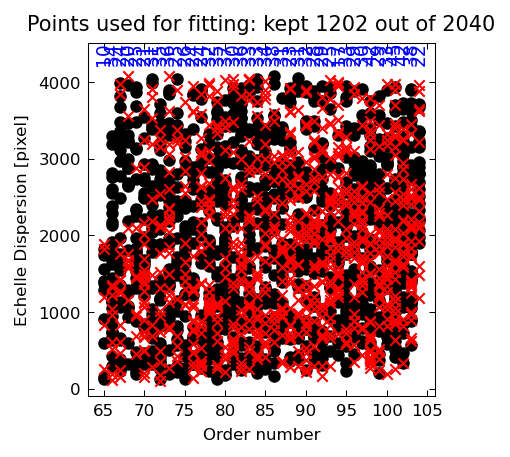

In [187]:
# veloce_diagnostic.plot_ArcTh_points_positions(
#     pixel_positions, order_positions, mask,
#     veloce_paths, filename=None, show=True)
plot_ArcTh_points_positions(
    pixel_positions, order_positions, mask,
    veloce_paths, filename=None, show=True)

/var/folders/y3/9pjs_36s4dl_fswjd_qhk3yc0000gn/T/ipykernel_17627/3296733311.py:83: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


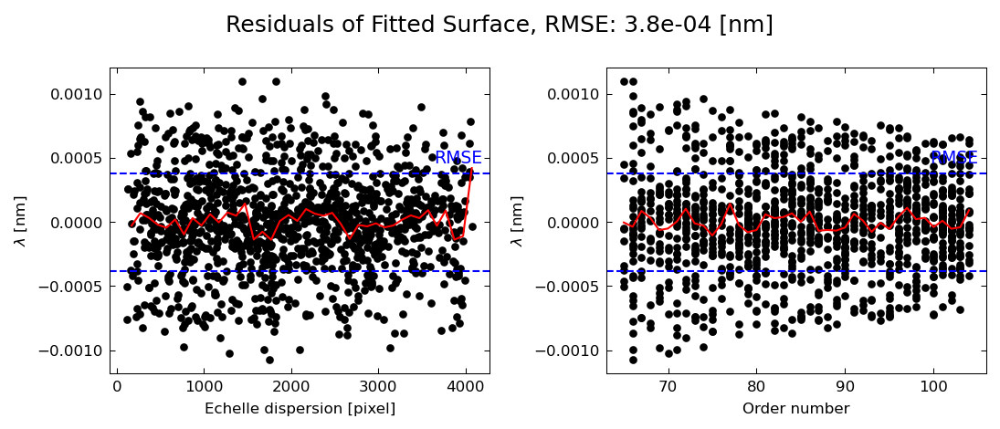

In [188]:
# veloce_diagnostic.plot_ArcTh_residuals(
#     residuals, order_positions, pixel_positions, wave_positions, mask,
#     veloce_paths, filename=None, plot_type='wavelength', show=True)
plot_ArcTh_residuals(
    residuals, order_positions, pixel_positions, wave_positions, mask,
    veloce_paths, filename=None, plot_type='wavelength', show=True)

##### Save ThXe static WAVE SOLUTION

In [189]:
new_wave = [model.predict((np.column_stack([trace_y, np.ones_like(trace_y)*absolute_order])))/absolute_order for i, absolute_order, trace_y in zip(range(len(ORDER)), ORDER, traces.y)]
print(f"New wavelength solution covers from {min([min(w) for w in new_wave]):.3f} nm to {max([max(w) for w in new_wave]):.3f} nm")

New wavelength solution covers from 580.880 nm to 942.065 nm


#### Estimate resolution

In [190]:
# resolution_positions = veloce_wavecalib.get_resolution_from_fitted_lines(fwhms, wave_positions, pixel_positions, order_positions, wave)
# _resolution_positions = veloce_wavecalib.get_resolution_from_fitted_lines(_fwhms, _wave_positions, _pixel_positions, _order_positions, wave)
# resolution_positions = get_resolution_from_fitted_lines(fwhms, wave_positions, pixel_positions, order_positions, wave)
_resolution_positions = get_resolution_from_fitted_lines(_fwhms, _wave_positions, _pixel_positions, _order_positions, wave)

In [191]:
len(mask), len(_resolution_positions)

(2040, 2040)

In [192]:
np.median(_resolution_positions), np.std(_resolution_positions), np.min(_resolution_positions), np.max(_resolution_positions)

(np.float64(79688.49130352441),
 np.float64(19123.33977117902),
 np.float64(16221.389485319856),
 np.float64(164734.681701623))

In [230]:
# initial_res_mask = mask * ((_resolution_positions>50000) & (_resolution_positions<120000)) * ((pixel_positions>300) & (pixel_positions<3800))
# initial_res_mask = (_resolution_positions>50000) & (_resolution_positions<100000)
# initial_res_mask = (_resolution_positions>np.median(_resolution_positions) - 2*np.std(_resolution_positions)) & (_resolution_positions<np.median(_resolution_positions) + 2*np.std(_resolution_positions))
# initial_res_mask = np.ones_like(mask, dtype=bool)
initial_res_mask = mask.copy() * (_resolution_positions>np.median(_resolution_positions) - 2*np.std(_resolution_positions)) & (_resolution_positions<np.median(_resolution_positions) + 2*np.std(_resolution_positions))

# initial_res_mask = np.ones_like(mask, dtype=bool) #* ((pixel_positions>300) & (pixel_positions<3800))
# initial_res_mask = mask.copy() #* ((pixel_positions>300) & (pixel_positions<3800))


In [231]:
np.median(_resolution_positions)

np.float64(79688.49130352441)

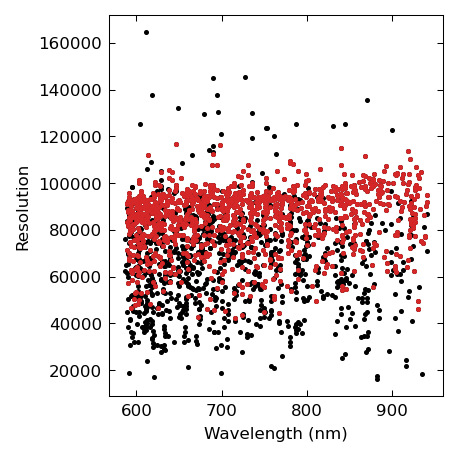

In [232]:
plt.close('all')
plt.figure(figsize=(3.15,3.15))
plt.scatter(_wave_positions, _resolution_positions, s=2, label='gaussian', c='k')
plt.scatter(_wave_positions[initial_res_mask], _resolution_positions[initial_res_mask], s=2, label='gaussian masked', c='C3')
plt.xlabel('Wavelength (nm)')
plt.ylabel('Resolution')
plt.tight_layout()
plt.show()

In [196]:
res_Z, res_residuals, res_mask, res_model, converged = veloce_wavecalib.fit_surface_sklearn(
                    _pixel_positions[initial_res_mask], _order_positions[initial_res_mask], _resolution_positions[initial_res_mask],
                    full_pixels, degree=5, sigma_clip=3, robust=False, n_limit=5)
if not converged:
    print("[Warning]: Resolution solution fitting did not converge.")
resolution = veloce_wavecalib.get_resolution_from_surface(res_model, traces, ORDER)
# resolution = [r*absolute_order for r, absolute_order in zip(resolution, ORDER)]

Converged.
Std of residuals dropped from 17840.307 to 17158.800 after 2 iterations.


In [197]:
final_res_mask = initial_res_mask.copy()
final_res_mask[initial_res_mask] = res_mask

In [198]:
_order_positions.shape

(2040,)

In [199]:
Z_spline = fit_surface_spline(_pixel_positions[initial_res_mask],
                            _order_positions[initial_res_mask],
                            _resolution_positions[initial_res_mask],
                            full_pixels,
                            kernel='cubic', smoothing=1e8, degree=4)

In [233]:
res_Z_xy, res_residuals_xy, res_mask_xy, res_model_xy, converged_xy, input_scaler, target_scaler = fit_xy_surface_sklearn(_pixel_positions[initial_res_mask], _order_positions[initial_res_mask], _resolution_positions[initial_res_mask], full_pixels,
                           degree_x=3, degree_y=3, sigma_clip=3, max_iter=1000, ridge_alpha=10,
                           input_scaling='minmax', target_scaling='standard', fit_type='resolution')

_resolution_xy = predict_wavelength_from_surface(res_model_xy, traces.y, list(ORDER), input_scaler=input_scaler, target_scaler=target_scaler)
resolution_xy = [res_xy*order for res_xy, order in zip(_resolution_xy, ORDER)]

Converged after 8 iterations.


In [234]:
final_res_mask = initial_res_mask.copy()
final_res_mask[initial_res_mask] = res_mask_xy

In [235]:
np.median(_resolution_positions[final_res_mask]), np.std(_resolution_positions[final_res_mask]), np.min(_resolution_positions[final_res_mask]), np.max(_resolution_positions[final_res_mask])

(np.float64(87500.8811048027),
 np.float64(11042.125961564197),
 np.float64(45288.47649466521),
 np.float64(114893.90216140995))

In [207]:
res_Z_w, res_residuals_w, res_mask_w, res_model_w, converged_w = fit_weighted_LC_surface(
    _pixel_positions[initial_res_mask], _order_positions[initial_res_mask], _resolution_positions[initial_res_mask],
    full_pixels, weights=_weights[initial_res_mask],
    degree=6, sigma_clip=3, alpha=100)

resolution_w = veloce_wavecalib.get_resolution_from_surface(res_model_w, traces, ORDER)
# resolution_w = [res_w for res_w, order in zip(_resolution_w, ORDER)]

40 40
Converged after 3 iterations.


In [208]:
final_res_mask = initial_res_mask.copy()
final_res_mask[initial_res_mask] = res_mask_w

In [209]:
# from mpl_toolkits.axes_grid1 import make_axes_locatable

In [210]:
%matplotlib widget

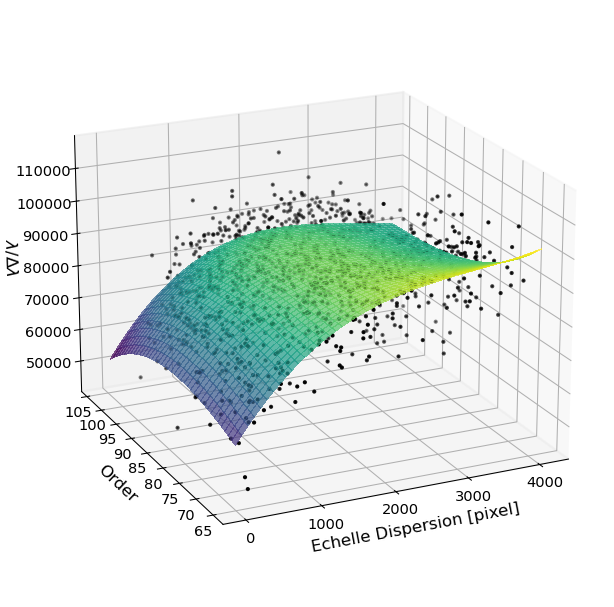

In [236]:
plt.close('all')
# fig = plt.figure(figsize=(3.15, 3.15))
fig = plt.figure(figsize=(5, 5))
ax = fig.add_subplot(1,1,1, projection='3d')
ax.view_init(elev=20, azim=245)
X, Y = np.meshgrid(full_pixels[0], np.unique(order_positions))
# ax.plot_surface(X, Y, Z_spline, cmap='viridis', alpha=0.7, linewidth=0, antialiased=False)
# ax.plot_surface(X, Y, res_Z_w, cmap='viridis', alpha=0.7, linewidth=0, antialiased=False)
# ax.plot_surface(X, Y, res_Z, cmap='viridis', alpha=0.7, linewidth=0, antialiased=False)
ax.plot_surface(X, Y, res_Z_xy, cmap='viridis', alpha=0.7, linewidth=0, antialiased=False, rasterized=True)
# ax.scatter(pixel_positions[final_res_mask], order_positions[final_res_mask], wave_positions[final_res_mask], c=resolution_positions[final_res_mask], cmap='viridis', s=10)
ax.scatter(_pixel_positions[final_res_mask], _order_positions[final_res_mask], _resolution_positions[final_res_mask], c='k', s=1, rasterized=True)
# ax.scatter(_pixel_positions, _order_positions, _resolution_positions, c='k', s=10)
ax.tick_params(axis='x', which='major', pad=-4, labelsize=7)
ax.tick_params(axis='y', which='major', pad=-4, labelsize=7)
ax.tick_params(axis='z', which='major', pad=2, labelsize=7)
ax.set_xlabel('Echelle Dispersion [pixel]', labelpad=-8, fontsize=8)
ax.set_ylabel('Order', labelpad=-8, fontsize=8)
ax.set_zlabel(r'$\lambda / \Delta \lambda$', labelpad=0, fontsize=8)

# divider = make_axes_locatable(ax)
# cax = divider.append_axes("right", size="5%", pad=0.05)
# plt.colorbar(ax.collections[0], cax=cax, orientation='vertical', label=r'$\lambda / \Delta \lambda$')
# plt.savefig(f'{run}_{date}_{arm}_resolution_surface.pdf', dpi=600, bbox_inches='tight')
# plt.savefig(f'weighted_{run}_{date}_{arm}_resolution_surface.pdf', dpi=600, bbox_inches='tight')
plt.show()

2056
resolution: 94044 at wavelength: 928.337 nm
resolution: 93725 at wavelength: 914.478 nm
resolution: 93429 at wavelength: 901.026 nm
resolution: 93157 at wavelength: 887.965 nm
resolution: 92905 at wavelength: 875.277 nm
resolution: 92673 at wavelength: 862.946 nm
resolution: 92458 at wavelength: 850.958 nm
resolution: 92259 at wavelength: 839.299 nm
resolution: 92074 at wavelength: 827.954 nm
resolution: 91901 at wavelength: 816.913 nm
resolution: 91739 at wavelength: 806.162 nm
resolution: 91585 at wavelength: 795.690 nm
resolution: 91439 at wavelength: 785.487 nm
resolution: 91298 at wavelength: 775.542 nm
resolution: 91161 at wavelength: 765.846 nm
resolution: 91026 at wavelength: 756.389 nm
resolution: 90891 at wavelength: 747.163 nm
resolution: 90754 at wavelength: 738.160 nm
resolution: 90615 at wavelength: 729.370 nm
resolution: 90470 at wavelength: 720.788 nm
resolution: 90319 at wavelength: 712.405 nm
resolution: 90159 at wavelength: 704.215 nm
resolution: 89989 at wavele

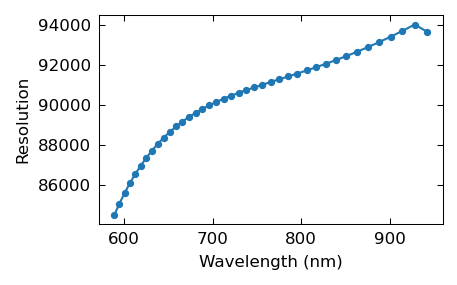

In [237]:
ylen = data.shape[0] 
print(ylen//2)
mid_resolution = []
mid_wave = []
for w, res in zip(new_wave, resolution_xy):
# for w, res, absolute_order in zip(wave, resolution, ORDER):
    if ylen//2 < len(w) and ylen//2 < len(res):
        print(f"resolution: {res[ylen//2]:.0f} at wavelength: {w[ylen//2]:.3f} nm")
        mid_resolution.append(res[ylen//2])
        mid_wave.append(w[ylen//2])
    else:
        print("Warning: middle pixel is outside the range of this order, taking closest pixel instead.")
        mid_resolution.append(res[-1])
        mid_wave.append(w[-1])

plt.close('all')
plt.figure(figsize=(3.15,2))
plt.plot(mid_wave, mid_resolution, marker='.')
# plt.ylim(60000, 90000)
plt.xlabel('Wavelength (nm)')
plt.ylabel('Resolution')
plt.tight_layout()
# plt.savefig(f'{run}_{date}_{arm}_resolution_vs_wavelength.pdf', dpi=600, bbox_inches='tight')
# plt.savefig(f'weighted_{run}_{date}_{arm}_resolution_vs_wavelength.pdf', dpi=600, bbox_inches='tight')
plt.show()

In [158]:
# %matplotlib inline
# plt.close('all')
# mid_resolution = []
# mid_wave = []
# for w, res, order in zip(wave, resolution_xy, ORDER):
#     print(f"Order {order}: resolution = {res[ylen//2]:.0f} at mid wavelength: {w[ylen//2]:.3f} nm")
#     plt.close('all')
#     plt.plot(w, res)
#     plt.scatter(_wave_positions[_order_positions == order], _resolution_positions[_order_positions == order], s=2, c='k', label='Resolution from lines')
#     plt.show()

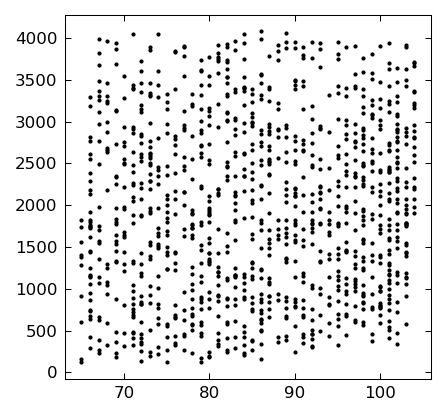

In [238]:
plt.close('all')
plt.figure(figsize=(3.15,3.15))
plt.scatter(_order_positions[final_res_mask], _pixel_positions[final_res_mask], c='k', s=1)
plt.show()

In [241]:
len(res_residuals_xy[res_mask_xy]), len(_pixel_positions[final_res_mask]), len(_pixel_positions[initial_res_mask][~res_mask_xy]), np.sum(~res_mask_xy)

(1115, 1115, 53, np.int64(53))

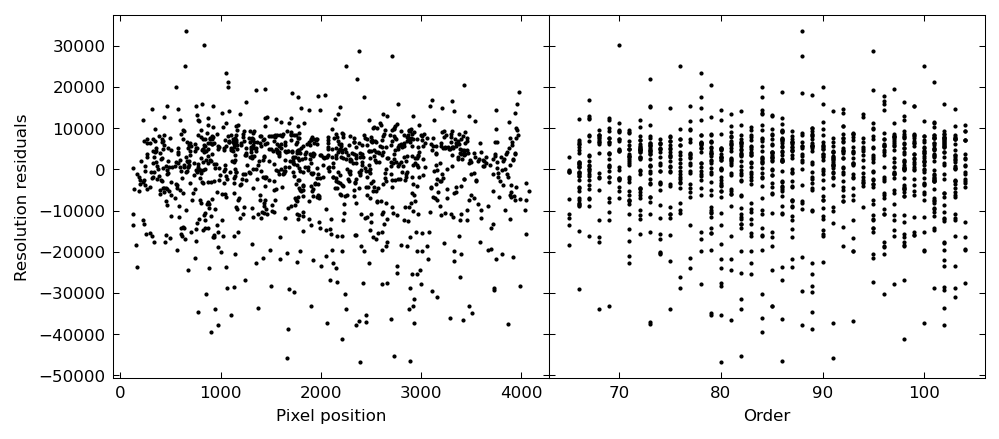

In [240]:
plt.close('all')
fig, ax = plt.subplots(1,2, figsize=(7.5, 3.15), sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})
# ax.scatter(pixel_positions[final_res_mask], order_positions[final_res_mask], wave_positions[final_res_mask], c=resolution_positions[final_res_mask], cmap='viridis', s=10)
# ax[0].scatter(pixel_positions[final_res_mask], res_residuals[res_mask], c='k', marker='o', s=10)
ax[0].scatter(_pixel_positions[initial_res_mask], res_residuals_xy, c='k', marker='o', s=1)
# ax[0].scatter(_pixel_positions[initial_res_mask], res_residuals_w, c='k', marker='o', s=1)
ax[0].set_xlabel('Pixel position')
ax[0].set_ylabel('Resolution residuals')
# ax[0].scatter(pixel_positions[initial_res_mask][~res_mask], res_residuals[~res_mask], c='C3', marker='x', s=10)
# ax[1].scatter(order_positions[final_res_mask], res_residuals[res_mask], c='k', marker='o', s=10)
ax[1].scatter(_order_positions[initial_res_mask], res_residuals_xy, c='k', marker='o', s=1)
# ax[1].scatter(_order_positions[initial_res_mask], res_residuals_w, c='k', marker='o', s=1)
ax[1].set_xlabel('Order')
# ax[1].scatter(order_positions[initial_res_mask][~res_mask], res_residuals[~res_mask], c='C3', marker='x', s=10)
# plt.tight_layout()
plt.savefig(f'{run}_{date}_{arm}_resolution_residuals.pdf', dpi=600, bbox_inches='tight')
# plt.savefig(f'weighted_{run}_{date}_{arm}_resolution_residuals.pdf', dpi=600, bbox_inches='tight')

plt.show()

1115 1115


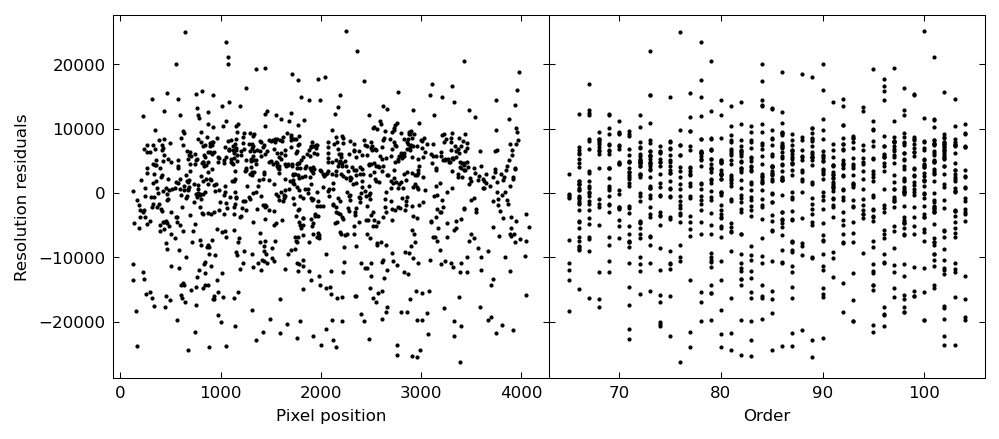

In [242]:
plt.close('all')
fig, ax = plt.subplots(1,2, figsize=(7.5, 3.15), sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})
# ax.scatter(pixel_positions[final_res_mask], order_positions[final_res_mask], wave_positions[final_res_mask], c=resolution_positions[final_res_mask], cmap='viridis', s=10)
# ax[0].scatter(pixel_positions[final_res_mask], res_residuals[res_mask], c='k', marker='o', s=10)
print(len(_pixel_positions[final_res_mask]), len(res_residuals_xy[res_mask_xy]))
ax[0].scatter(_pixel_positions[final_res_mask], res_residuals_xy[res_mask_xy], c='k', marker='o', s=1)
# ax[0].scatter(_pixel_positions[final_res_mask], res_residuals_w[res_mask_w], c='k', marker='o', s=1)
ax[0].set_xlabel('Pixel position')
ax[0].set_ylabel('Resolution residuals')
# ax[0].scatter(pixel_positions[initial_res_mask][~res_mask], res_residuals[~res_mask], c='C3', marker='x', s=10)
# ax[1].scatter(order_positions[final_res_mask], res_residuals[res_mask], c='k', marker='o', s=10)
ax[1].scatter(_order_positions[final_res_mask], res_residuals_xy[res_mask_xy], c='k', marker='o', s=1)
# ax[1].scatter(_order_positions[final_res_mask], res_residuals_w[res_mask_w], c='k', marker='o', s=1)
ax[1].set_xlabel('Order')
# ax[1].scatter(order_positions[initial_res_mask][~res_mask], res_residuals[~res_mask], c='C3', marker='x', s=10)
# plt.tight_layout()
plt.show()

Order 65: Warning: middle pixel is outside the range of this order, taking closest pixel instead. resolution = 93686 at wavelength: 942.066 nm


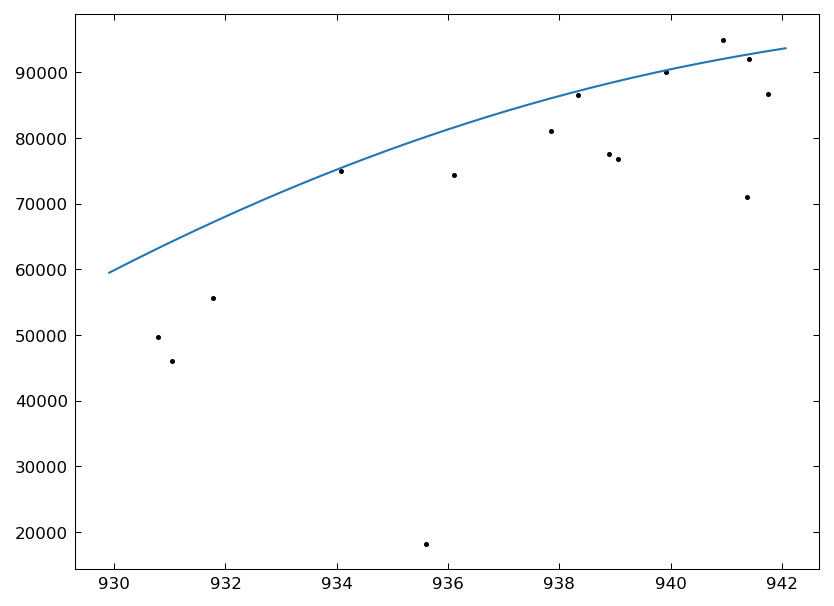

Order 66: resolution = 94044 at mid wavelength: 928.337 nm


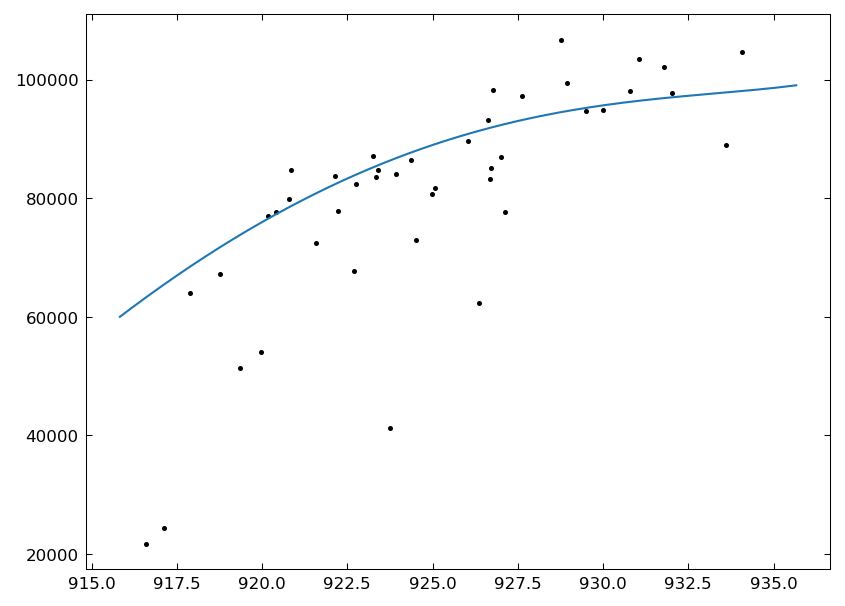

Order 67: resolution = 93725 at mid wavelength: 914.478 nm


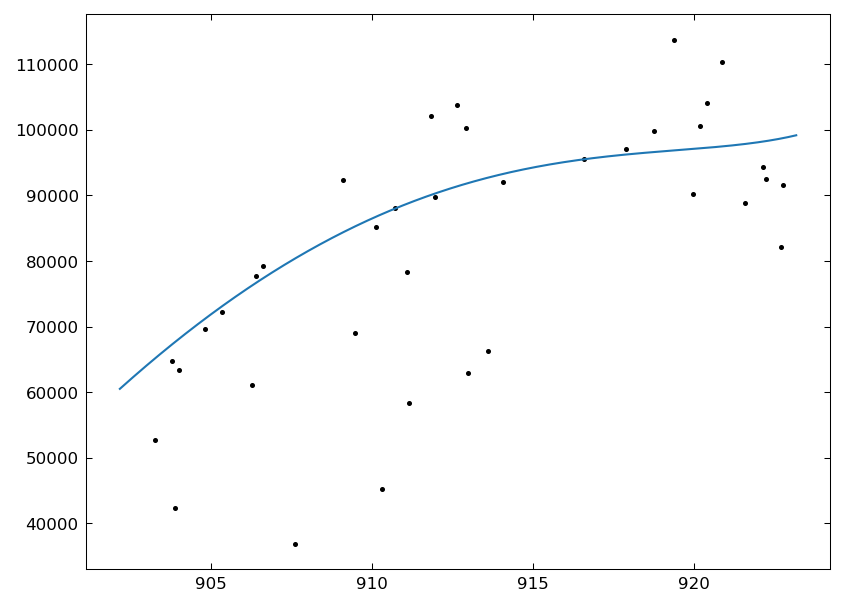

Order 68: resolution = 93429 at mid wavelength: 901.026 nm


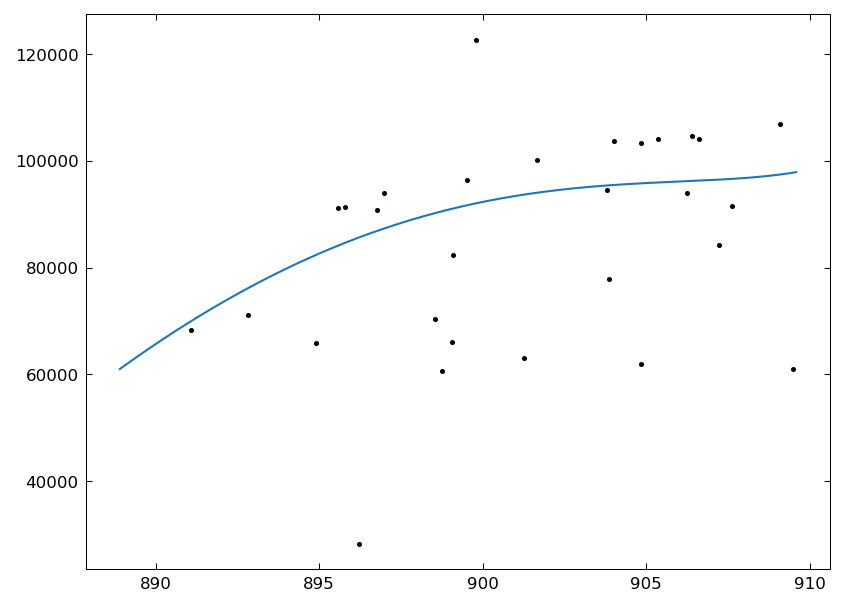

Order 69: resolution = 93157 at mid wavelength: 887.965 nm


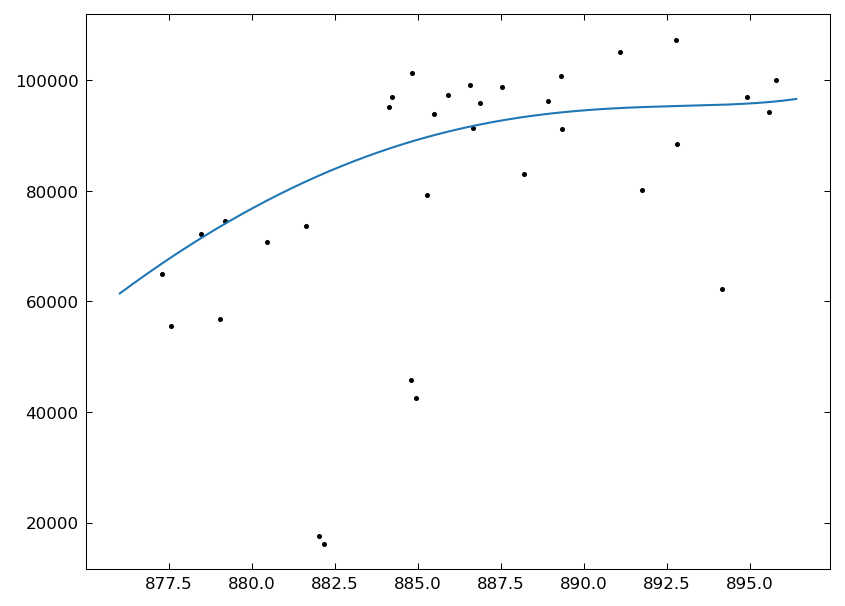

Order 70: resolution = 92905 at mid wavelength: 875.277 nm


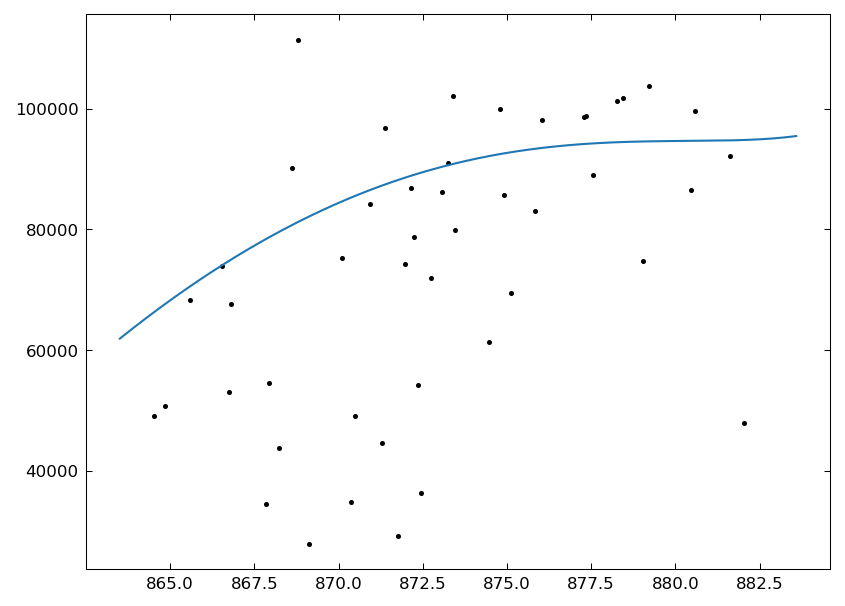

Order 71: resolution = 92673 at mid wavelength: 862.946 nm


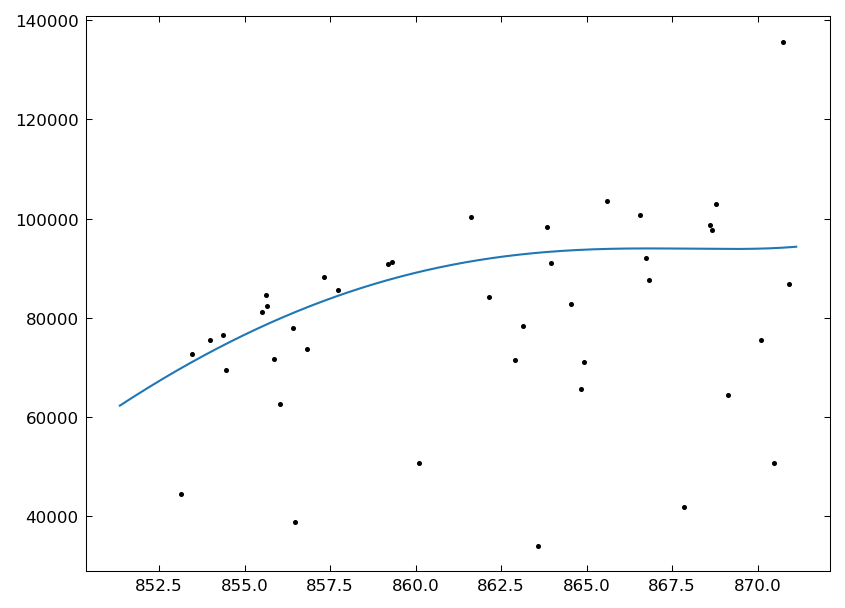

Order 72: resolution = 92458 at mid wavelength: 850.958 nm


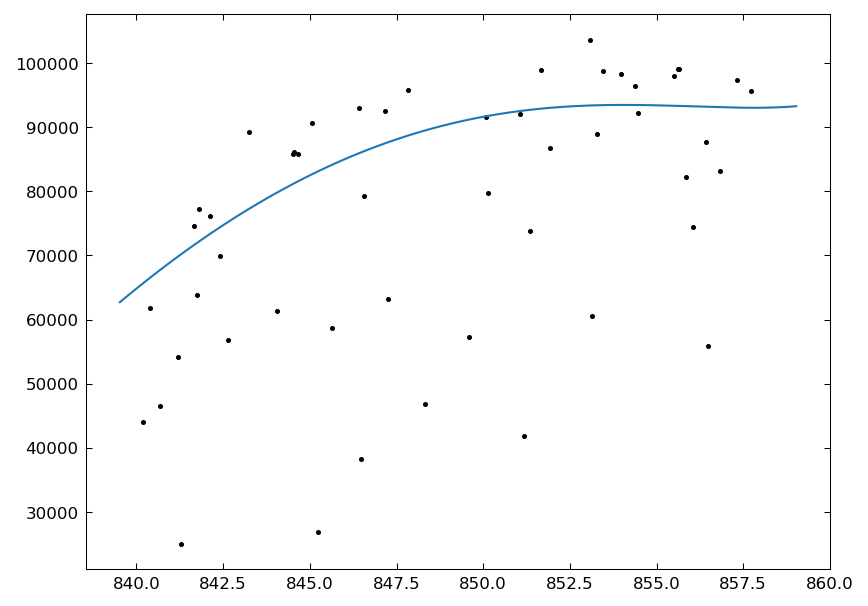

Order 73: resolution = 92259 at mid wavelength: 839.299 nm


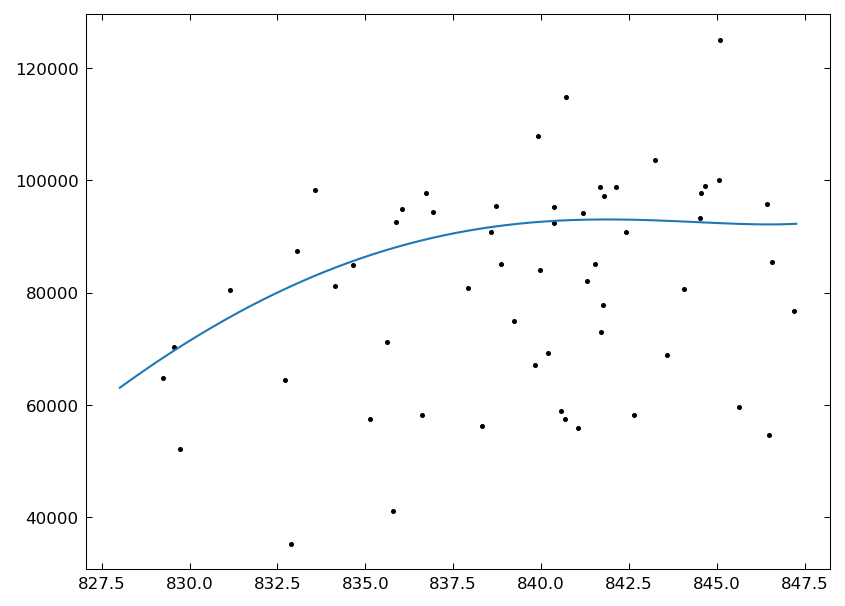

Order 74: resolution = 92074 at mid wavelength: 827.954 nm


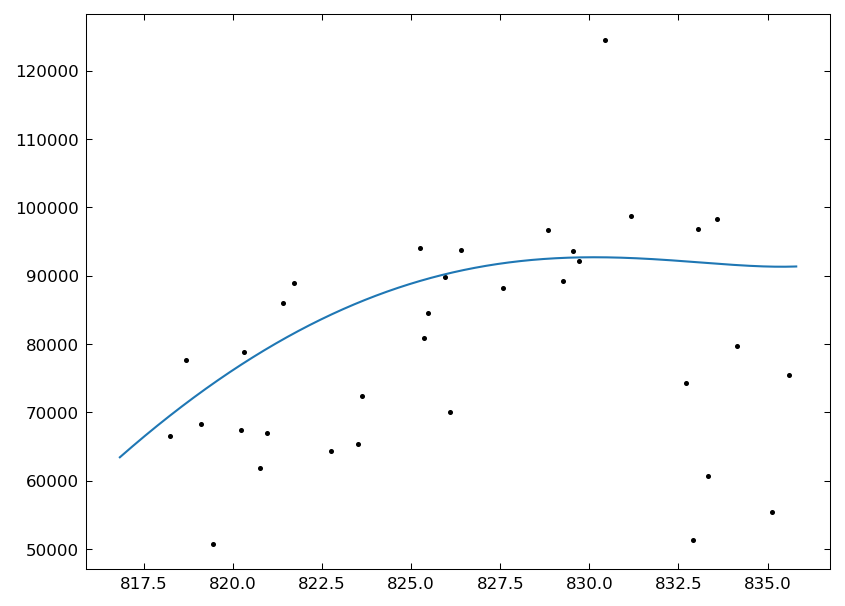

Order 75: resolution = 91901 at mid wavelength: 816.913 nm


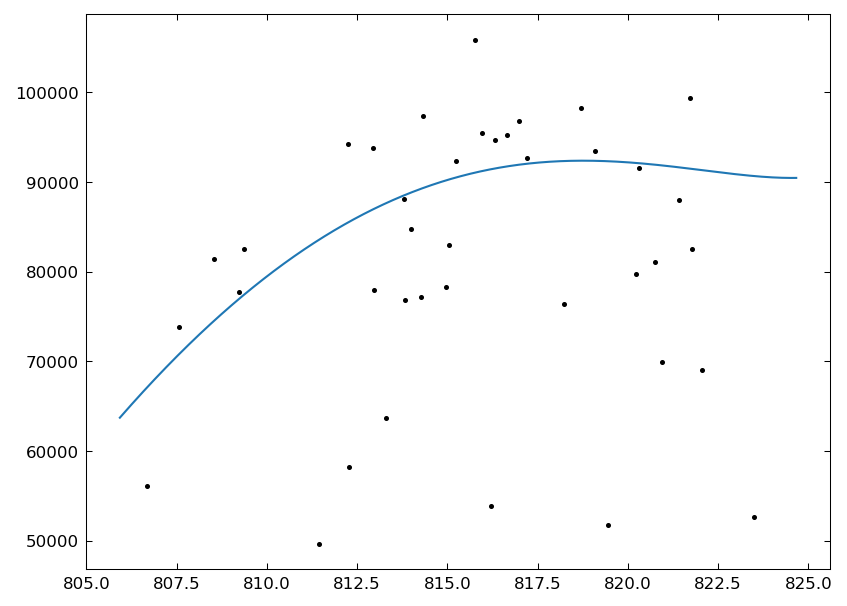

Order 76: resolution = 91739 at mid wavelength: 806.162 nm


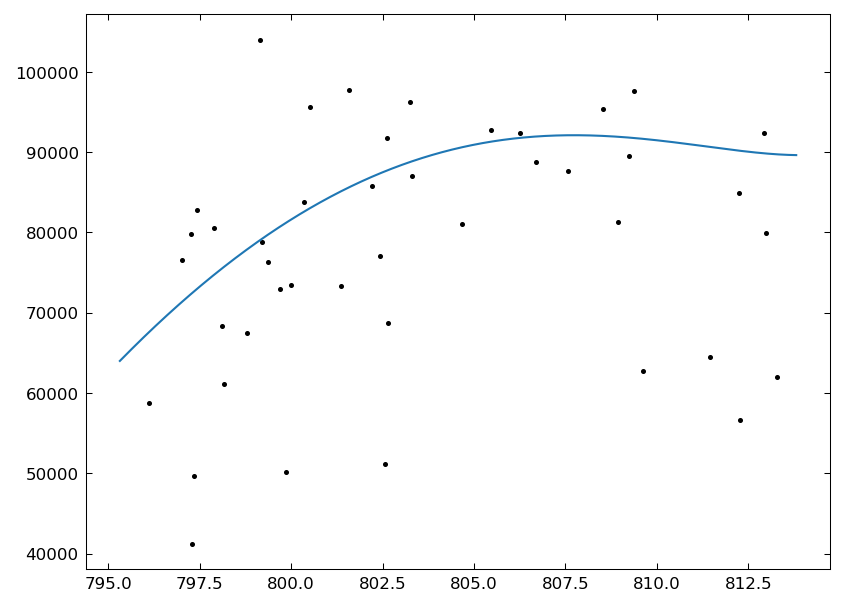

Order 77: resolution = 91585 at mid wavelength: 795.690 nm


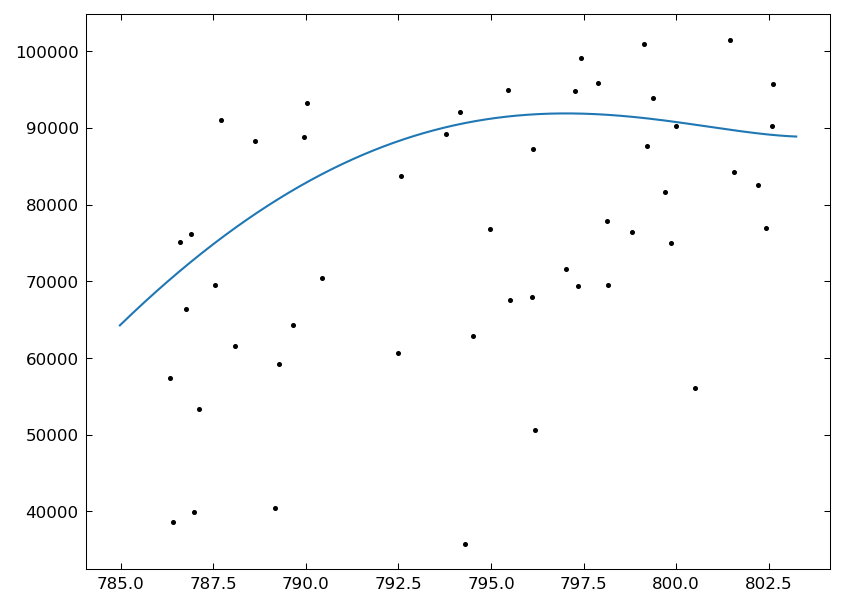

Order 78: resolution = 91439 at mid wavelength: 785.487 nm


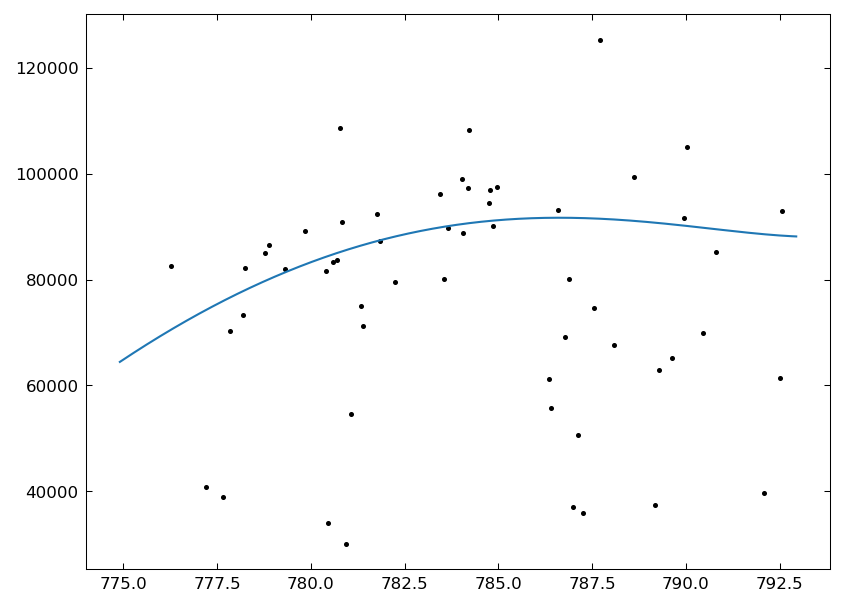

Order 79: resolution = 91298 at mid wavelength: 775.542 nm


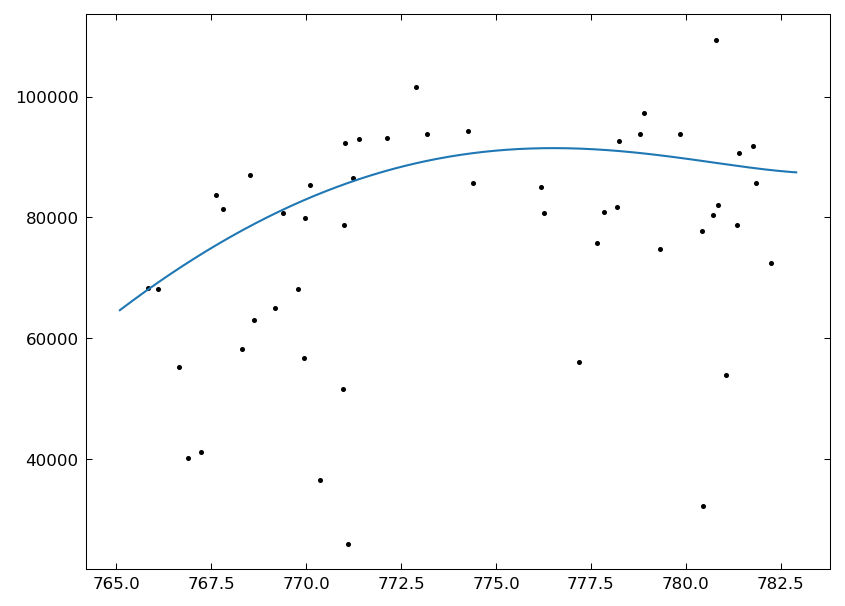

Order 80: resolution = 91161 at mid wavelength: 765.846 nm


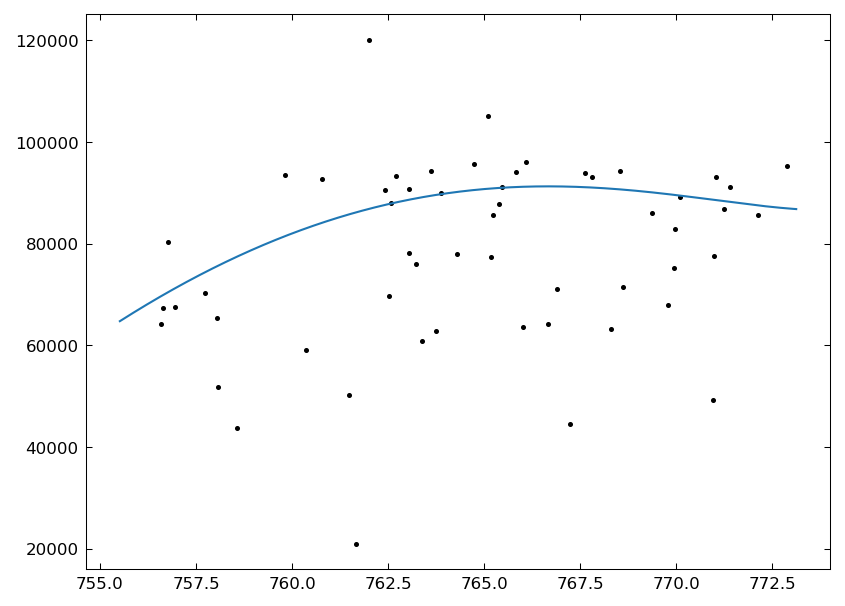

Order 81: resolution = 91026 at mid wavelength: 756.389 nm


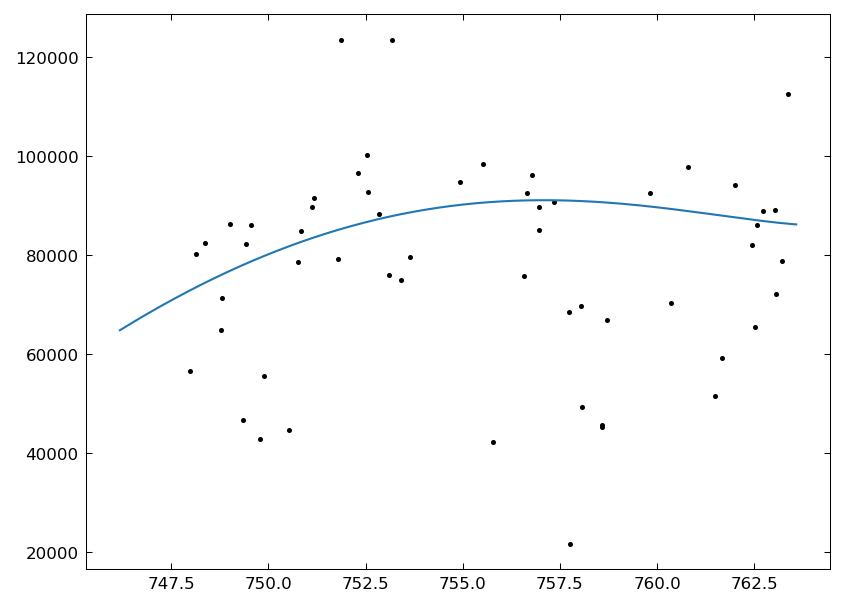

Order 82: resolution = 90891 at mid wavelength: 747.163 nm


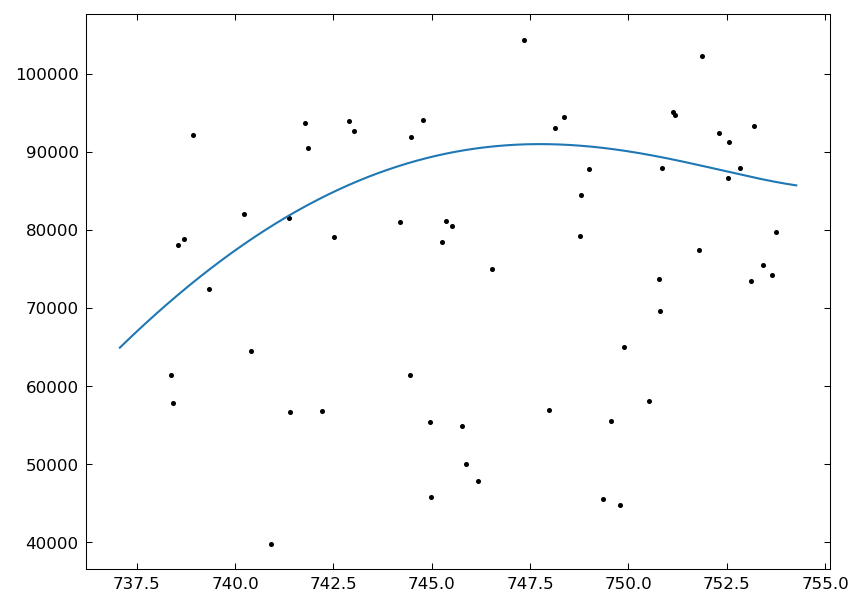

Order 83: resolution = 90754 at mid wavelength: 738.160 nm


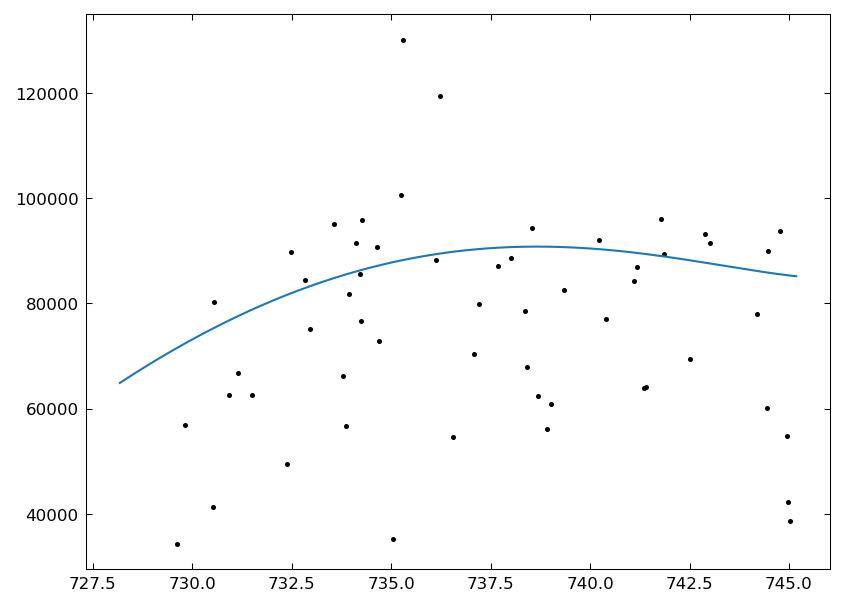

Order 84: resolution = 90615 at mid wavelength: 729.370 nm


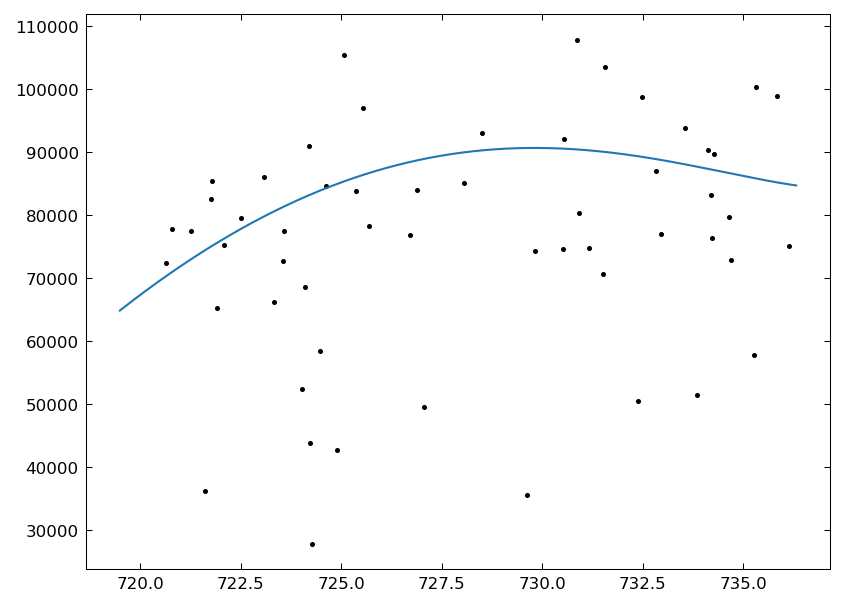

Order 85: resolution = 90470 at mid wavelength: 720.788 nm


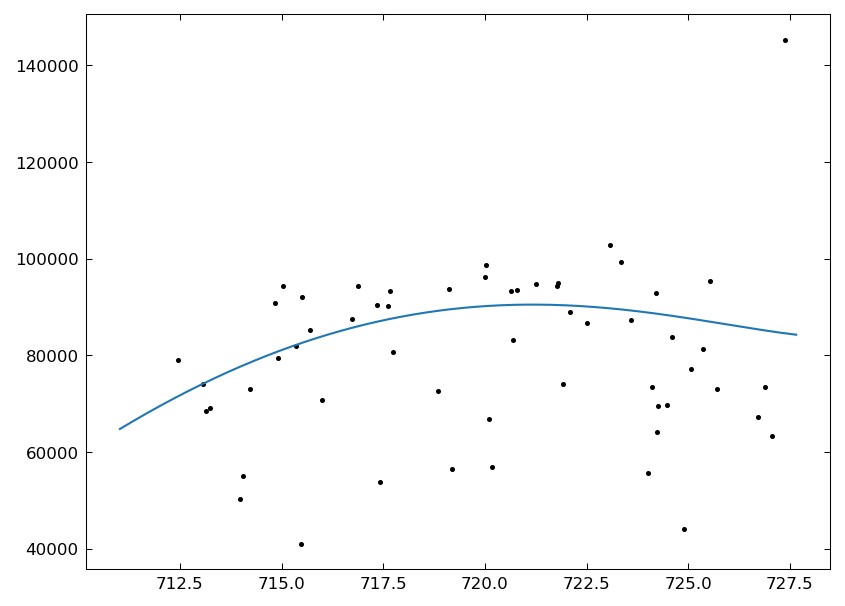

Order 86: resolution = 90319 at mid wavelength: 712.405 nm


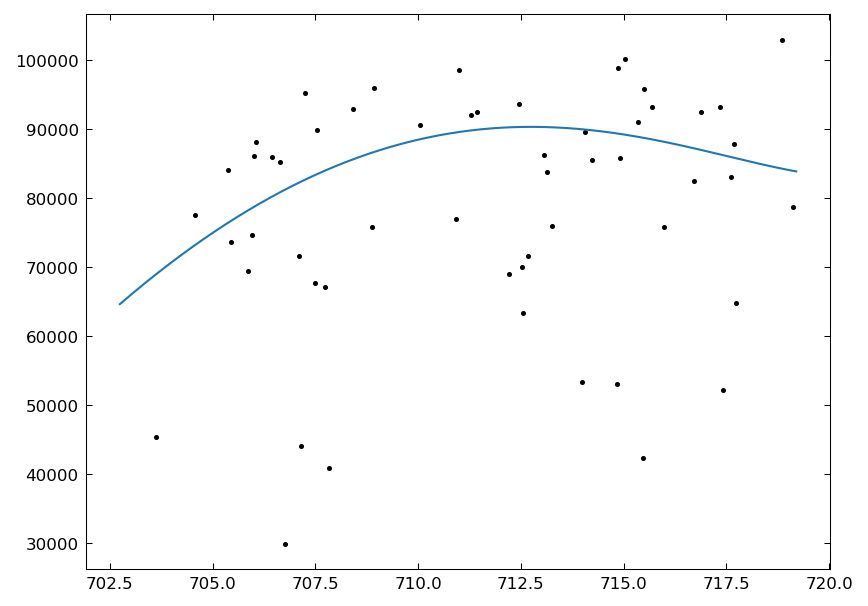

Order 87: resolution = 90159 at mid wavelength: 704.215 nm


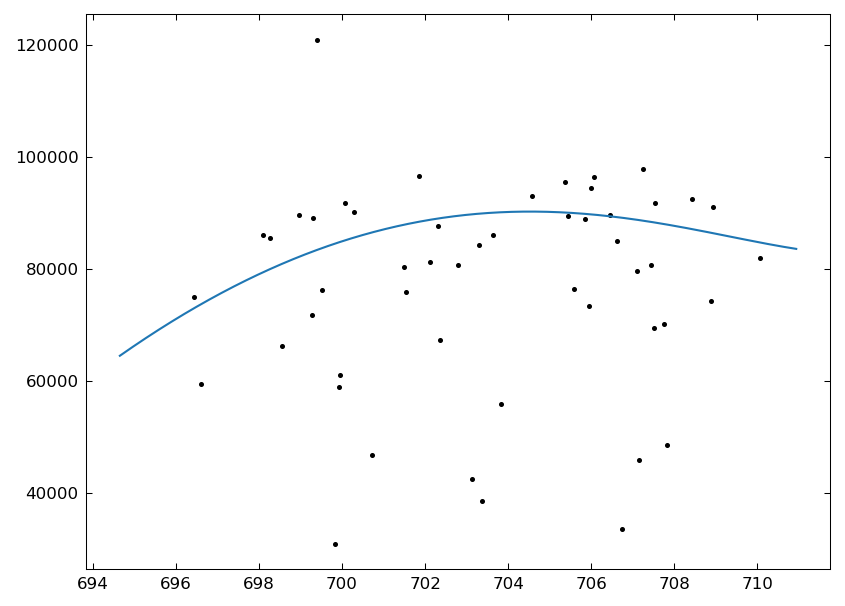

Order 88: resolution = 89989 at mid wavelength: 696.211 nm


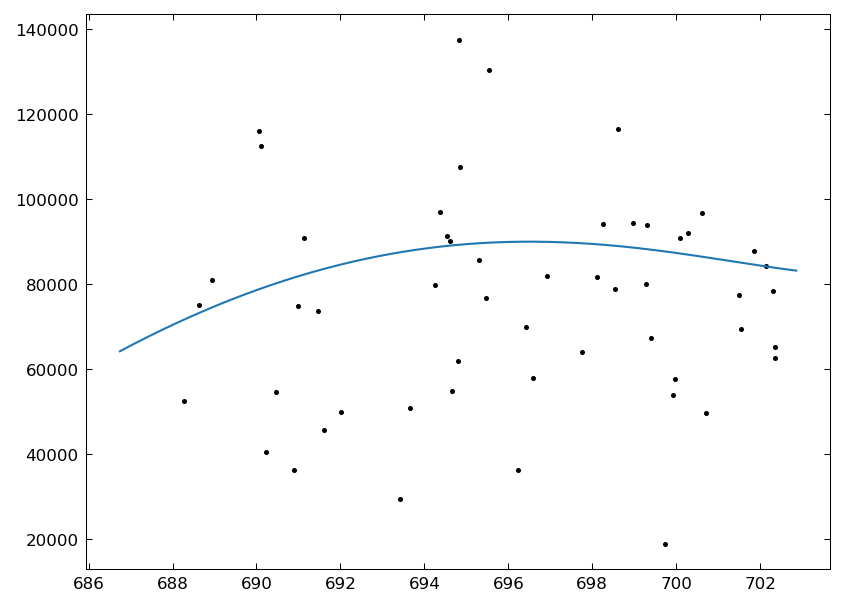

Order 89: resolution = 89808 at mid wavelength: 688.387 nm


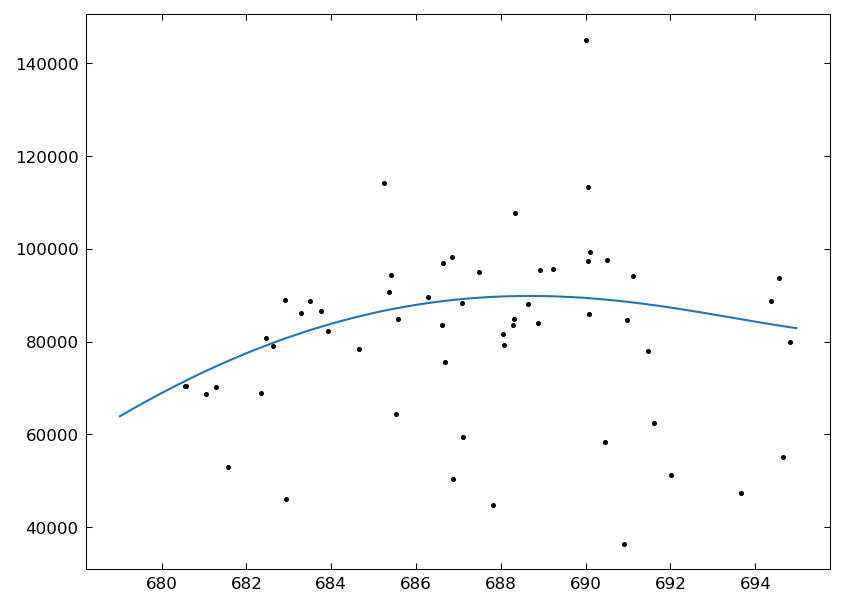

Order 90: resolution = 89613 at mid wavelength: 680.737 nm


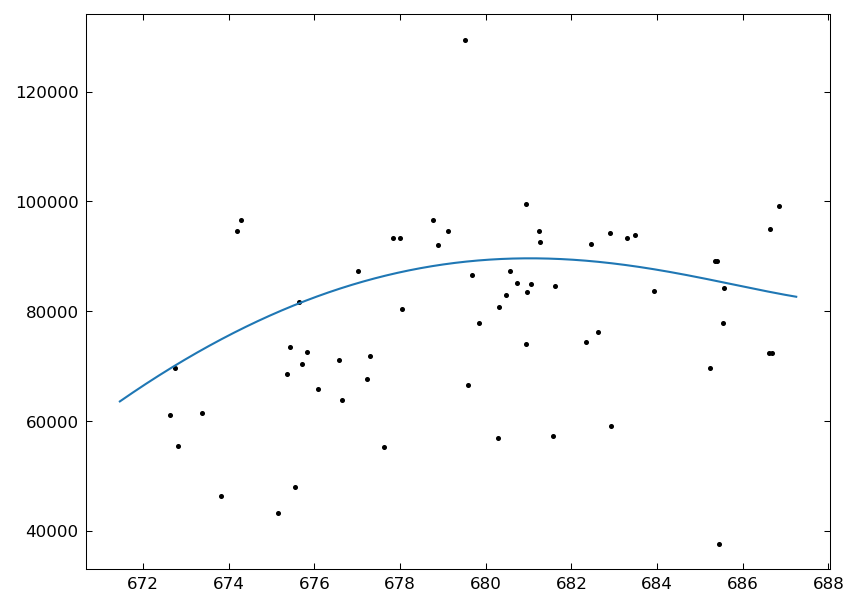

Order 91: resolution = 89402 at mid wavelength: 673.255 nm


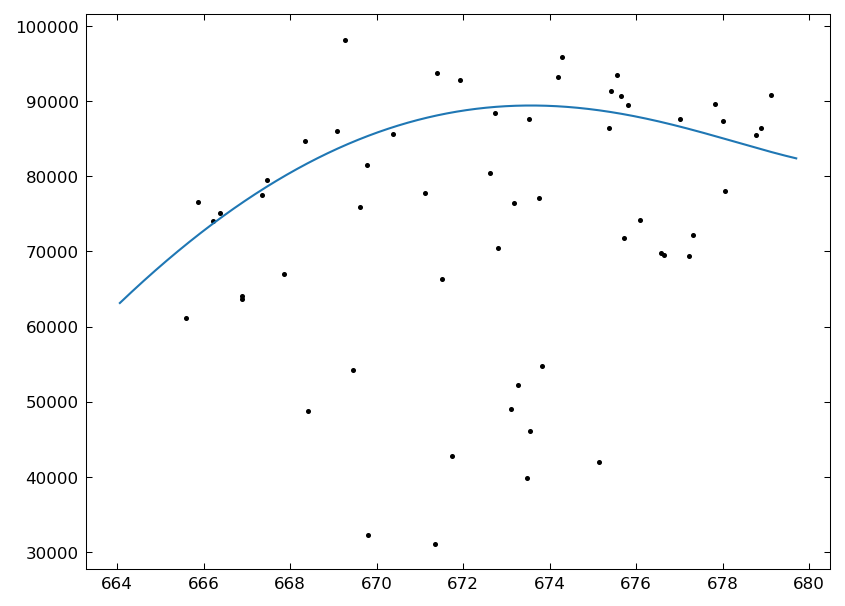

Order 92: resolution = 89175 at mid wavelength: 665.936 nm


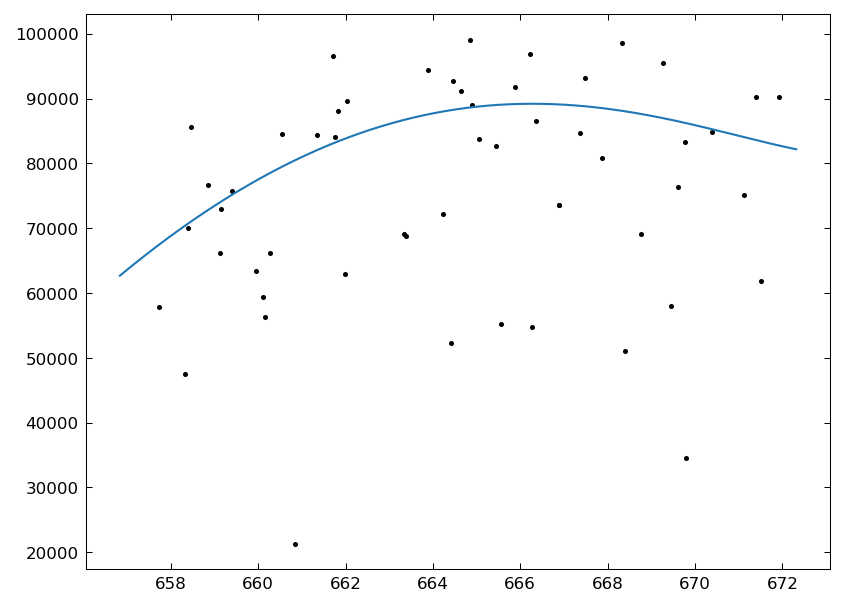

Order 93: resolution = 88929 at mid wavelength: 658.774 nm


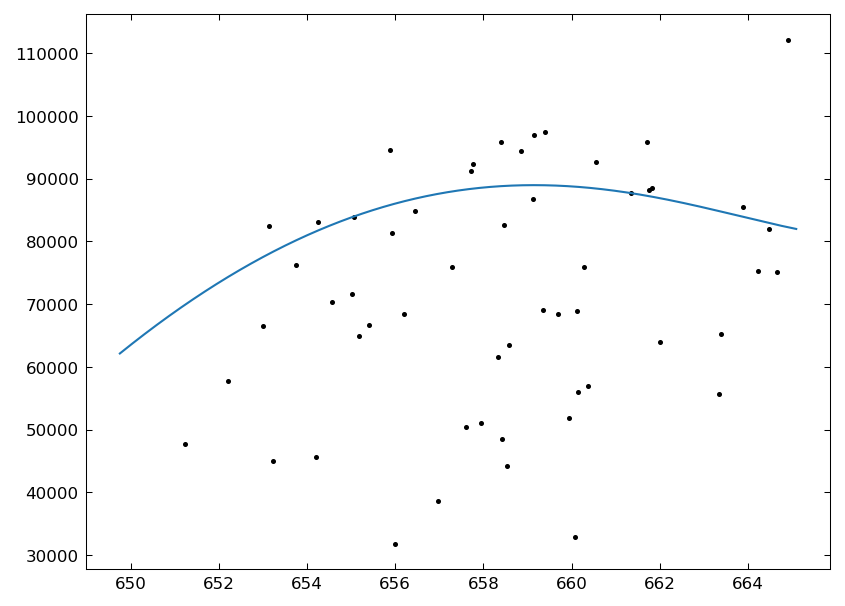

Order 94: resolution = 88663 at mid wavelength: 651.765 nm


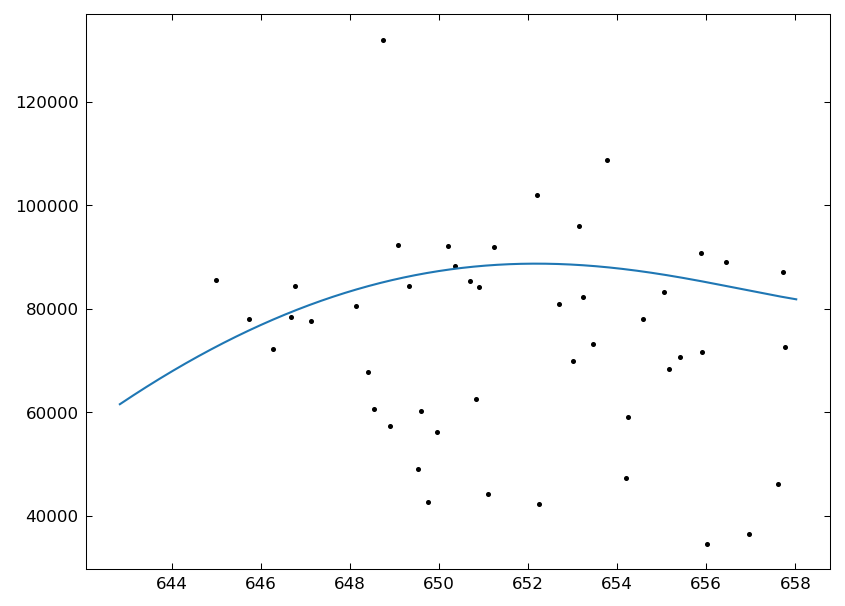

Order 95: resolution = 88374 at mid wavelength: 644.903 nm


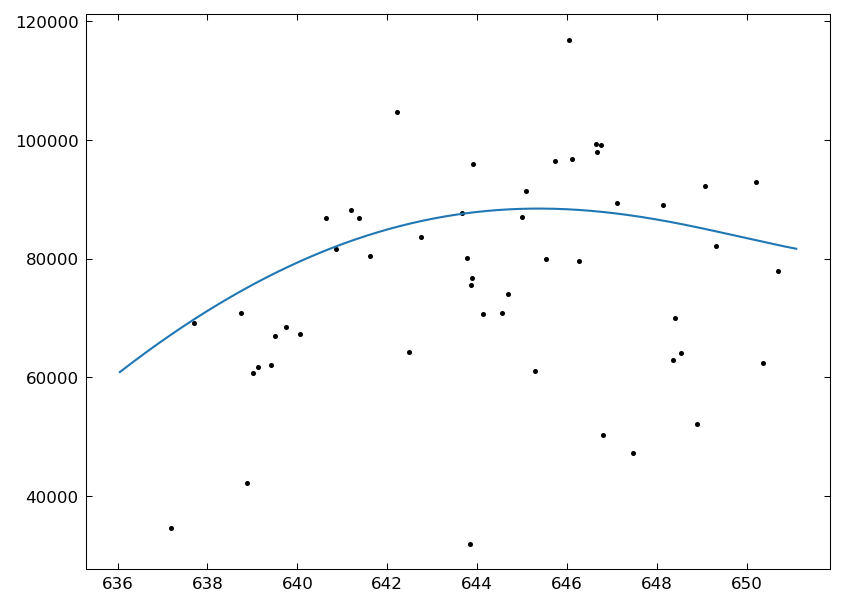

Order 96: resolution = 88061 at mid wavelength: 638.184 nm


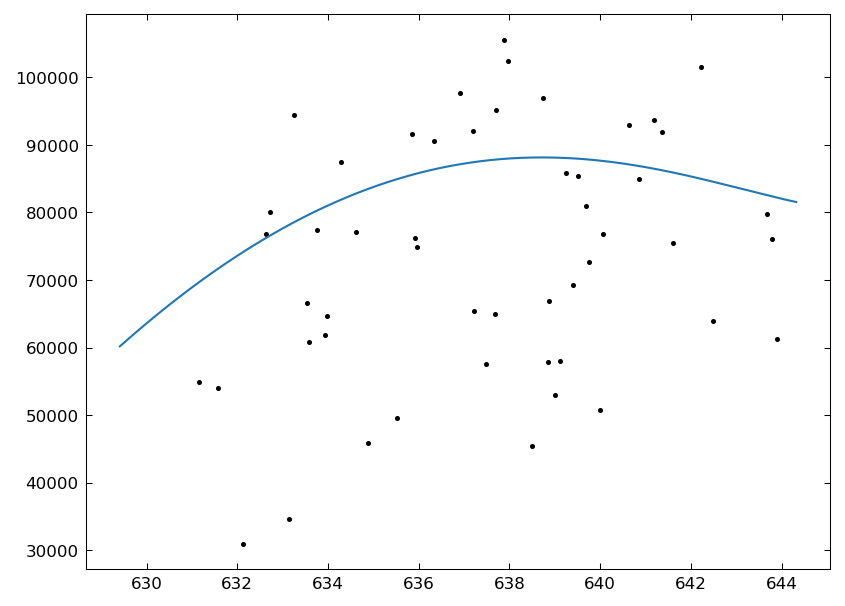

Order 97: resolution = 87723 at mid wavelength: 631.604 nm


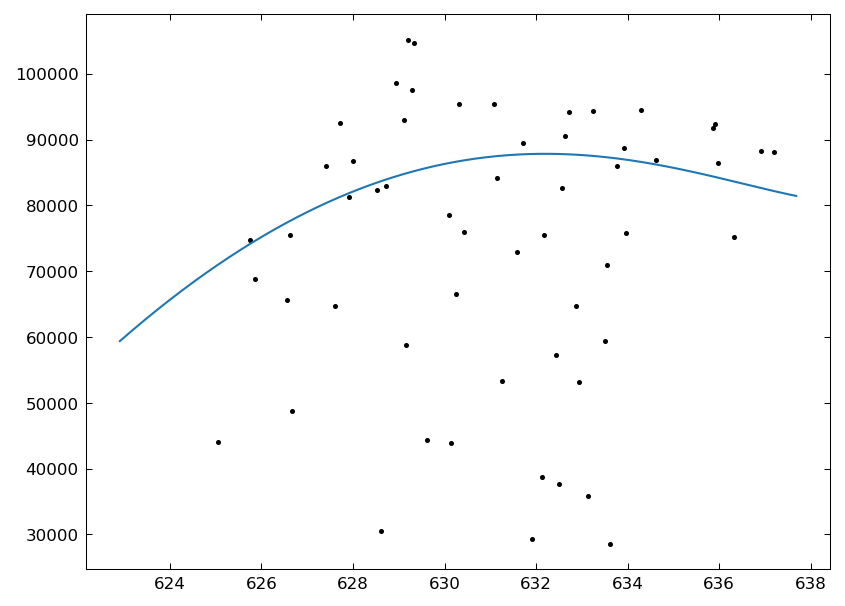

Order 98: resolution = 87358 at mid wavelength: 625.158 nm


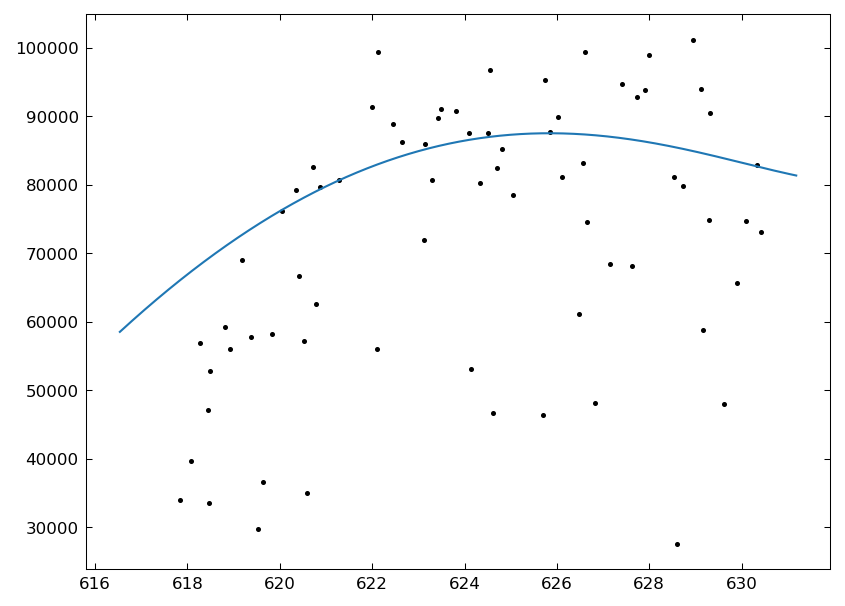

Order 99: resolution = 86964 at mid wavelength: 618.842 nm


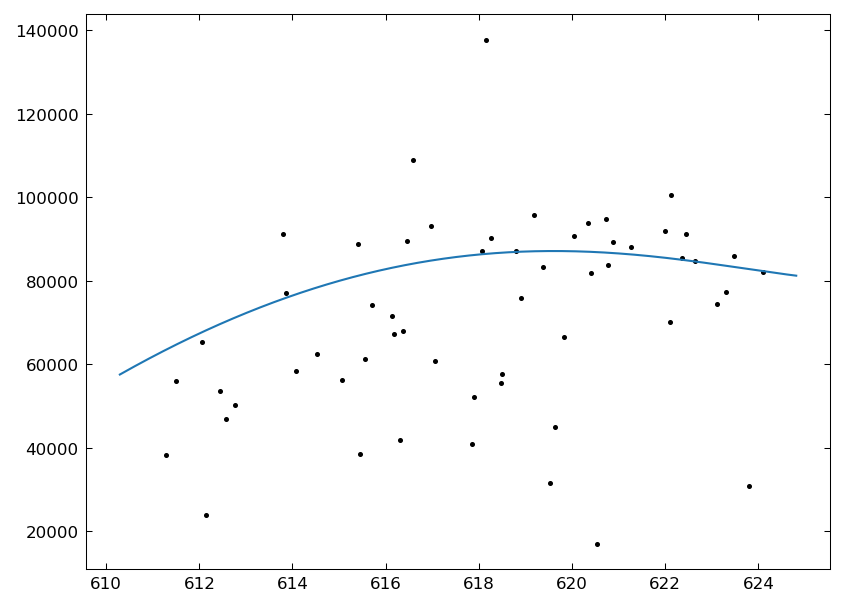

Order 100: resolution = 86538 at mid wavelength: 612.653 nm


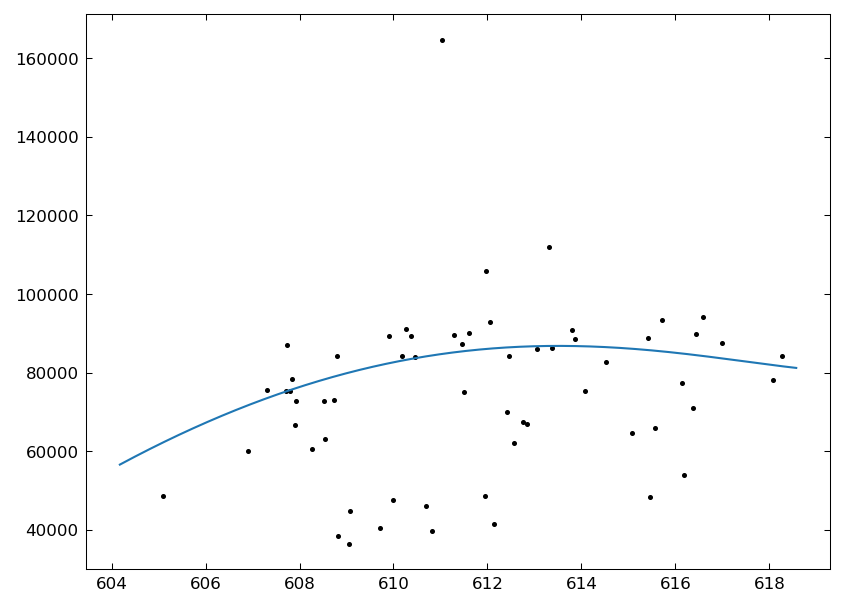

Order 101: resolution = 86081 at mid wavelength: 606.586 nm


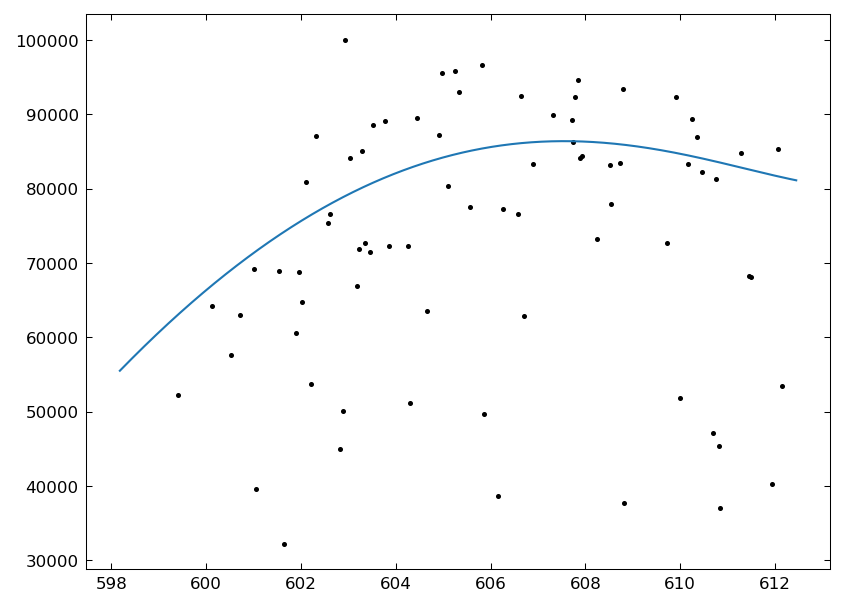

Order 102: resolution = 85589 at mid wavelength: 600.638 nm


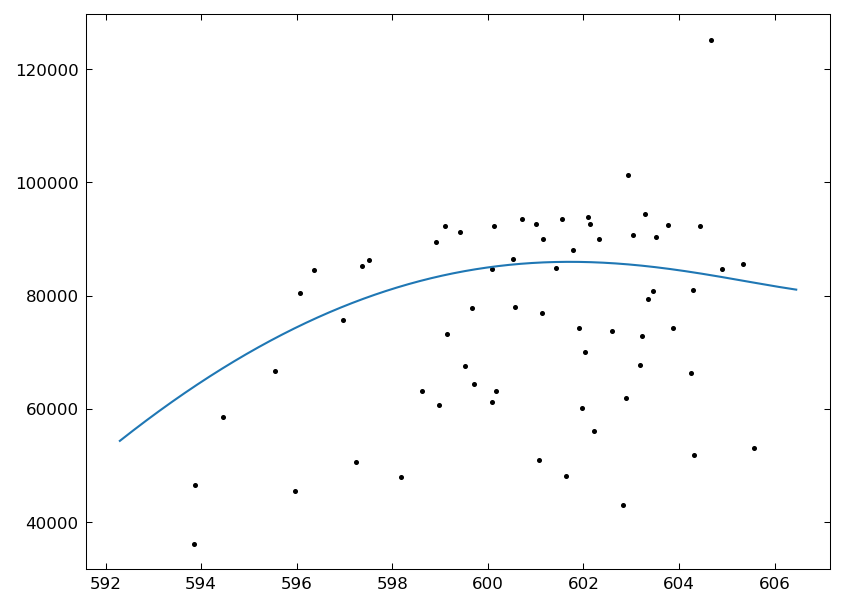

Order 103: resolution = 85061 at mid wavelength: 594.806 nm


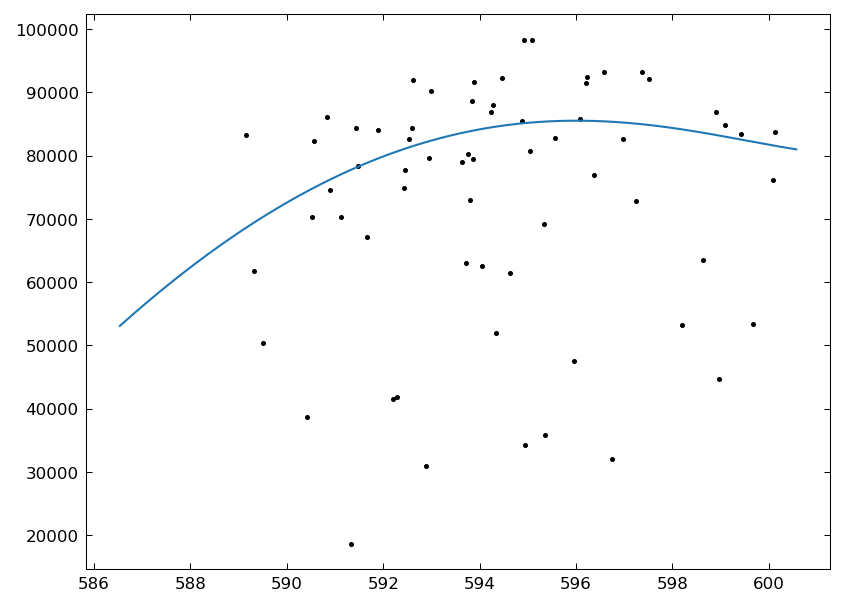

Order 104: resolution = 84496 at mid wavelength: 589.086 nm


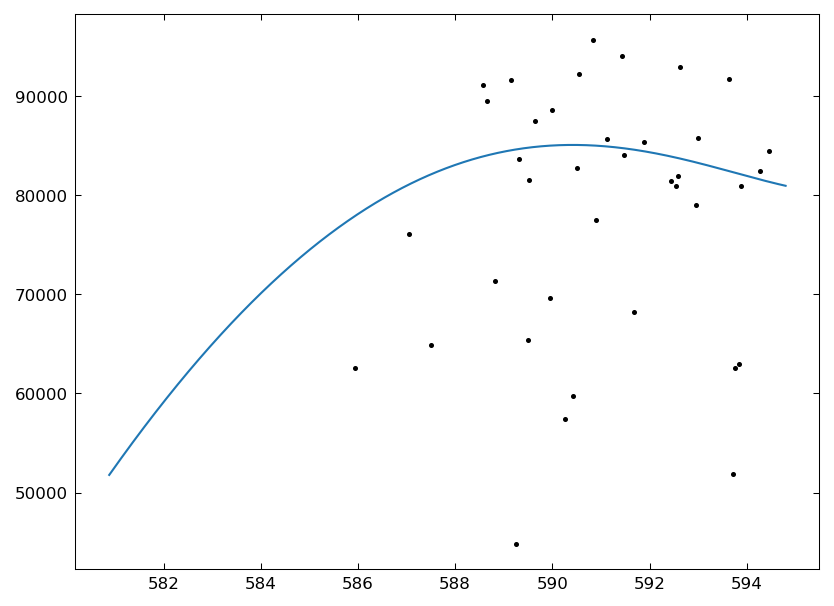

In [243]:
%matplotlib inline
plt.close('all')
for w, res, order in zip(wave, resolution_xy, ORDER):
    if ylen//2 < len(w) and ylen//2 < len(res):
        print(f"Order {order}: resolution = {res[ylen//2]:.0f} at mid wavelength: {w[ylen//2]:.3f} nm")
    else:
        print(f"Order {order}: Warning: middle pixel is outside the range of this order, taking closest pixel instead. resolution = {res[-1]:.0f} at wavelength: {w[-1]:.3f} nm")
    plt.close('all')
    plt.plot(w, res)
    plt.scatter(_wave_positions[_order_positions == order], _resolution_positions[_order_positions == order], s=2, c='k', label='Resolution from lines')
    plt.show()

In [169]:
### save resolution
veloce_reduction_tools.save_extracted_spectrum_fits(
    os.path.join(veloce_paths.wave_dir, f'resolution_{date}_{arm}.fits'),
    new_wave, resolution_xy, header)

'/Users/jjkruger/veloce_reduction/simple_veloce_reduction/Wave/resolution_230828_green.fits'

##### Plot

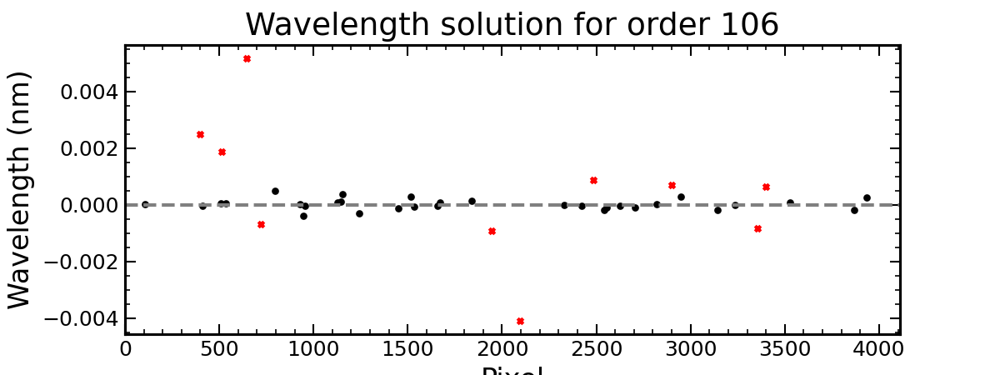

In [ ]:
plt.close('all')
selected_order = 3
plt.figure(figsize=(8, 3))
# plt.plot(traces.y[selected_order], new_wave[selected_order])
predicted_waves = model.predict((np.column_stack([pixel_positions[mask & (order_positions==ORDER[selected_order])], order_positions[mask & (order_positions==ORDER[selected_order])]])))/ORDER[selected_order]
_predicted_waves = model.predict((np.column_stack([pixel_positions[~mask & (order_positions==ORDER[selected_order])], order_positions[~mask & (order_positions==ORDER[selected_order])]])))/ORDER[selected_order]
plt.scatter(pixel_positions[mask & (order_positions==ORDER[selected_order])], wave_positions[mask & (order_positions==ORDER[selected_order])]-predicted_waves, s=10, c='k', marker='o')
plt.scatter(pixel_positions[~mask & (order_positions==ORDER[selected_order])], wave_positions[~mask & (order_positions==ORDER[selected_order])]-_predicted_waves, s=10, c='r', marker='x')
plt.hlines(0, 0, 4111, color='gray', ls='--')
plt.xlim(0, 4111)
plt.xlabel('Pixel')
plt.ylabel('Wavelength (nm)')
ax = plt.gca()
ax.minorticks_on()
ax.tick_params(axis='both', which='both', direction='in', top=True, right=True)
ax.tick_params(axis='both', which='major', length=6, width=1)
ax.tick_params(axis='both', which='minor', length=3, width=0.8)
# plt.title(f'Wavelength solution for order {ORDER[selected_order]}')
plt.show()

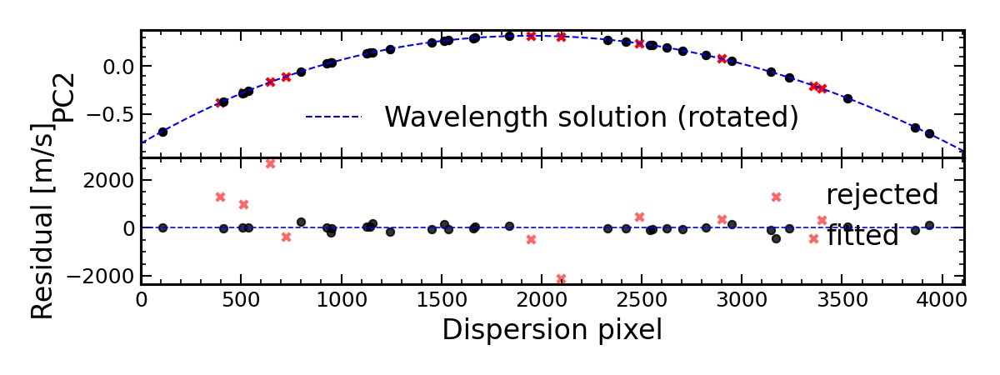

In [233]:
from matplotlib import gridspec

# select points for the chosen order
in_order = order_positions == ORDER[selected_order]
if np.sum(in_order) == 0:
    print(f"No points for selected_order == {ORDER[selected_order]}")
else:
    coords = np.column_stack([pixel_positions[in_order], wave_positions[in_order]])

    # center the data and compute principal direction via SVD (PCA)
    mean_coords = coords.mean(axis=0)
    coords_centered = coords - mean_coords
    _, _, vh = np.linalg.svd(coords_centered, full_matrices=False)
    principal_vec = vh[0]    # first principal component
    angle = np.arctan2(principal_vec[1], principal_vec[0])

    # Rotation matrix to rotate by -angle so principal axis becomes horizontal
    cos_a = np.cos(-angle)
    sin_a = np.sin(-angle)
    R = np.array([[cos_a, -sin_a],
                  [sin_a,  cos_a]])

    rot = (coords_centered @ R.T)


    # residuals limited to selected order
    sel_pix = pixel_positions[in_order]
    sel_orderpos = order_positions[in_order]
    sel_resid = residuals[in_order]
    sel_mask = mask[in_order]          # inlier mask for the selected-order points
    sel_resid_vel = sel_resid / sel_orderpos / wave_positions[in_order] * c

    # prepare figure with two stacked panels (top: rotated scatter; bottom: residuals)
    plt.close('all')
    fig = plt.figure(figsize=(8, 3))
    gs = gridspec.GridSpec(2, 1, height_ratios=[1, 1], hspace=0)

    # Top: rotated scatter (density / hexbin) and Bottom: residuals for selected order
    ax0 = fig.add_subplot(gs[0])
    ax1 = fig.add_subplot(gs[1])

    # plot rotated data on top
    ax0.scatter(rot[:, 0][~sel_mask]+mean_coords[0], rot[:, 1][~sel_mask], s=20, c='r', marker='x')
    ax0.scatter(rot[:, 0][sel_mask]+mean_coords[0], rot[:, 1][sel_mask], s=20, c='k', marker='o')

    # rotate and plot the wavelength solution on the same principal-axis frame
    w_x = traces.y[selected_order]
    w_y = new_wave[selected_order]
    w_coords = np.column_stack([w_x, w_y])
    w_rot = (w_coords - mean_coords) @ R.T
    ax0.plot(w_rot[:, 0]+mean_coords[0], w_rot[:, 1], 'b--', lw=1, label='Wavelength solution (rotated)')
    ax0.legend()
    # ax0.set_xlabel('PC1 (rotated)')
    ax0.set_ylabel('PC2')
    ax0.set_xlim(0, 4111)
    ax0.set_xticklabels([])  # hide x tick labels for top panel
    # ax0.set_title(f'Data for order {ORDER[selected_order]} rotated to principal axis (PC1 horizontal)')

    # Bottom: residuals for selected order
    ax1.axhline(0, color='b', ls='--', lw=0.8)
    # rejected points
    if np.any(~sel_mask):
        ax1.scatter(sel_pix[~sel_mask], sel_resid_vel[~sel_mask], color='r', marker='x', s=20, alpha=0.6, label='rejected')
    # fitted/inlier points
    if np.any(sel_mask):
        ax1.scatter(sel_pix[sel_mask],  sel_resid_vel[sel_mask],  color='k', marker='o', s=20, alpha=0.8, label='fitted')
    
    ax1.set_xlim(0, 4111)
    ax1.set_xlabel('Dispersion pixel')
    ax1.set_ylabel('Residual [m/s]')
    # ax1.set_title('Residuals of fitted surface (selected order)')
    ax1.legend()

    # cosmetic ticks in
    for ax in (ax0, ax1):
        ax.minorticks_on()
        ax.tick_params(axis='both', which='both', direction='in', top=True, right=True)
        ax.tick_params(axis='both', which='major', length=6, width=1)
        ax.tick_params(axis='both', which='minor', length=3, width=0.8)
    plt.tight_layout()
    plt.show()

In [ ]:
# with open(f'./Wave/arcTh_wave_{date}_{arm}.pkl', 'wb') as f:
#     pickle.dump(new_wave, f)
wave_solution_filename = f'{veloce_paths.wave_dir}/arcTh_wave_{date}_{arm}.fits'
# veloce_reduction_tools.save_extracted_spectrum_fits(wave_solution_filename, new_wave, extracted_Th, header)

'/home/usqobserver2/Joachim_veloce/veloce_reduction_dev/veloce_reduction/Wave/arcTh_wave_250406_green.fits'

##### Plot spectra with wave solution

In [67]:
%matplotlib widget

In [105]:
# prev_wave, prev_flux, _ = veloce_reduction_tools.load_extracted_spectrum_fits('/home/usqobserver2/Joachim_veloce/Extracted_data/ThAr/Intermediate_results/Wavelength_calibration/arcTh_wave_green_250406.fits')
prev_wave, prev_flux, _ = veloce_reduction_tools.load_extracted_spectrum_fits('/home/usqobserver2/Joachim_veloce/Extracted_data/ThAr/Intermediate_results/Wavelength_calibration/arcTh_wave_green_230828.fits')

ValueError: x and y must have same first dimension, but have shapes (4112,) and (4111,)

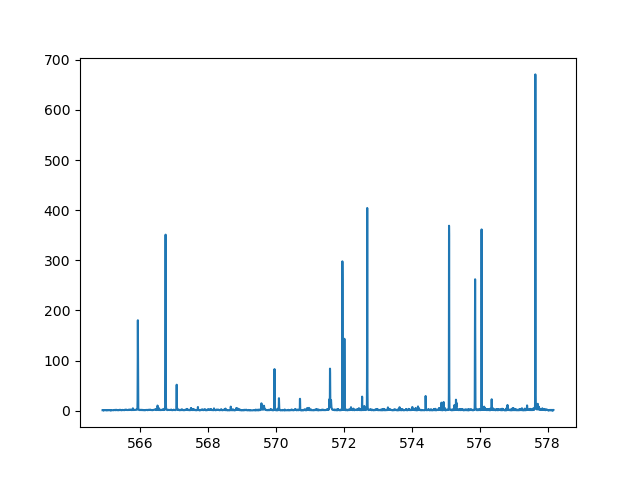

In [107]:
import matplotlib.ticker as mticker

order = 4
plt.close('all')
plt.plot(
    wave[order],
    # extracted_Th[order],
    veloce_wavecalib.normalise_ArcTh_order_with_spline(extracted_Th[order], nknots=15),
    label='Static')
plt.plot(
    prev_wave[order],
    # prev_flux[order],
    extracted_Th[order],
    label='prev')
plt.plot(
    new_wave[order],
    # extracted_Th[order],
    veloce_wavecalib.normalise_ArcTh_order_with_spline(extracted_Th[order], nknots=15),
    label='Fitted Th')
lines = veloce_wavecalib.get_lines_in_order(new_wave[order], nist_linelist, elements=['Th'], intensity_threshold=200, flag=['1'])
for line in lines:
    plt.axvline(line['obs_wl_air(nm)'], color='grey', linestyle='--')
# Force x ticks to be integer values
plt.gca().xaxis.set_major_locator(mticker.MaxNLocator(integer=True))
handles, labels = plt.gca().get_legend_handles_labels()
unique = dict()
for h, l in zip(handles, labels):
    if l not in unique:
        unique[l] = h
plt.legend(unique.values(), unique.keys())
plt.xlabel('Wavelength (nm)')
plt.ylabel('Flux')
plt.title(f'arcTh, Order {ORDER[order]}')
plt.show()


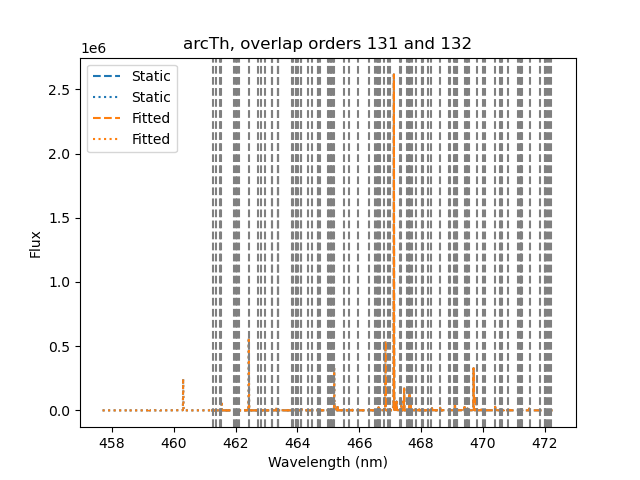

In [109]:
order = 28
plt.close('all')
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
# plt.plot(veloce_reduction_tools.vacuum_to_air(wave[order]), extracted_Th[order], linestyle='--', color=colors[0], label='Static')
# plt.plot(veloce_reduction_tools.vacuum_to_air(wave[order+1]), extracted_Th[order+1], linestyle=':', color=colors[0], label='Static')
plt.plot(wave[order], extracted_Th[order], linestyle='--', color=colors[0], label='Static')
plt.plot(wave[order+1], extracted_Th[order+1], linestyle=':', color=colors[0], label='Static')
plt.plot(new_wave[order], extracted_Th[order], linestyle='--', color=colors[1], label='Fitted')
plt.plot(new_wave[order+1], extracted_Th[order+1], linestyle=':', color=colors[1], label='Fitted')
lines = veloce_wavecalib.get_lines_in_order(new_wave[order], nist_linelist, elements=['Th'], intensity_threshold=200, flag=['1'])
for line in lines:
    plt.axvline(line['obs_wl_air(nm)'], color='grey', linestyle='--')
# Remove duplicate labels in legend
handles, labels = plt.gca().get_legend_handles_labels()
unique = dict()
for h, l in zip(handles, labels):
    if l not in unique:
        unique[l] = h
plt.legend(unique.values(), unique.keys())
plt.xlabel('Wavelength (nm)')
plt.ylabel('Flux')
plt.title(f'arcTh, overlap orders {ORDER[order]} and {ORDER[order+1]}')
plt.legend()
plt.show()

In [49]:
plt.close('all')

##### validate arms overlap

In [57]:
%matplotlib widget

In [71]:
veloce_paths.wave_dir

'/home/usqobserver2/Joachim_veloce/veloce_reduction_dev/veloce_reduction/Wave'

In [ ]:
date = '230828'
# date = '240410'
# new_green_wave = pickle.load(open(os.path.join(veloce_paths.wave_dir, f'ThXe_wave_{date}_green.pkl'), 'rb'))
new_green_wave, green_extracted_th, _ = veloce_reduction_tools.load_extracted_spectrum_fits(os.path.join(veloce_paths.wave_dir, f'arcTh_wave_{date}_green.fits'))
# new_red_wave = pickle.load(open(os.path.join(veloce_paths.wave_dir, f'ThXe_wave_{date}_red.pkl'), 'rb'))
new_red_wave, red_extracted_th, _ = veloce_reduction_tools.load_extracted_spectrum_fits(os.path.join(veloce_paths.wave_dir, f'arcTh_wave_{date}_red.fits'))
# new_blue_wave = pickle.load(open(os.path.join(veloce_paths.wave_dir, f'ThXe_wave_{date}_blue.pkl'), 'rb'))
new_blue_wave, blue_extracted_th, _ = veloce_reduction_tools.load_extracted_spectrum_fits(os.path.join(veloce_paths.wave_dir, f'arcTh_wave_{date}_blue.fits'))


In [50]:
red_traces = veloce_reduction_tools.Traces.load_traces(os.path.join(veloce_paths.trace_dir, 'veloce_red_4amp_sim_calib_trace.pkl'))
green_traces = veloce_reduction_tools.Traces.load_traces(os.path.join(veloce_paths.trace_dir, 'veloce_green_4amp_sim_calib_trace.pkl'))
blue_traces = veloce_reduction_tools.Traces.load_traces(os.path.join(veloce_paths.trace_dir, 'veloce_blue_4amp_sim_calib_trace.pkl'))

In [51]:
ORDER, COEFFS, MATCH_LAM, MATCH_PIX, MATCH_LRES, GUESS_LAM, Y0 = veloce_reduction_tools.load_prefitted_wave(arm='green', wave_path=veloce_paths.wave_dir)
old_green_wave = veloce_reduction_tools.calibrate_orders_to_wave(None, Y0, COEFFS, traces=green_traces)

In [52]:
ORDER, COEFFS, MATCH_LAM, MATCH_PIX, MATCH_LRES, GUESS_LAM, Y0 = veloce_reduction_tools.load_prefitted_wave(arm='red', wave_path=veloce_paths.wave_dir)
old_red_wave = veloce_reduction_tools.calibrate_orders_to_wave(None, Y0, COEFFS, traces=red_traces)

In [53]:
ORDER, COEFFS, MATCH_LAM, MATCH_PIX, MATCH_LRES, GUESS_LAM, Y0 = veloce_reduction_tools.load_prefitted_wave(arm='blue', wave_path=veloce_paths.wave_dir)
old_blue_wave = veloce_reduction_tools.calibrate_orders_to_wave(None, Y0, COEFFS, traces=blue_traces)

In [ ]:
# master_filename = f'{veloce_paths.master_dir}/master_ARC-ThAr_red_{date}.fits'
# # veloce_reduction_tools.save_image_fits(master_filename, data, header)
# with fits.open(master_filename) as hdul:
#     red_data= hdul[0].data
#     header = hdul[0].header
# master_filename = f'{veloce_paths.master_dir}/master_ARC-ThAr_green_{date}.fits'
# # veloce_reduction_tools.save_image_fits(master_filename, data, header)
# with fits.open(master_filename) as hdul:
#     green_data= hdul[0].data
#     header = hdul[0].header
# master_filename = f'{veloce_paths.master_dir}/master_ARC-ThAr_blue_{date}.fits'
# # veloce_reduction_tools.save_image_fits(master_filename, data, header)
# with fits.open(master_filename) as hdul:
#     blue_data= hdul[0].data
#     header = hdul[0].header

In [ ]:
# red_extracted_th, _ = veloce_reduction_tools.extract_orders_with_trace(red_data, red_traces)
# green_extracted_th, _ = veloce_reduction_tools.extract_orders_with_trace(green_data, green_traces)
# blue_extracted_th, _ = veloce_reduction_tools.extract_orders_with_trace(blue_data, blue_traces)

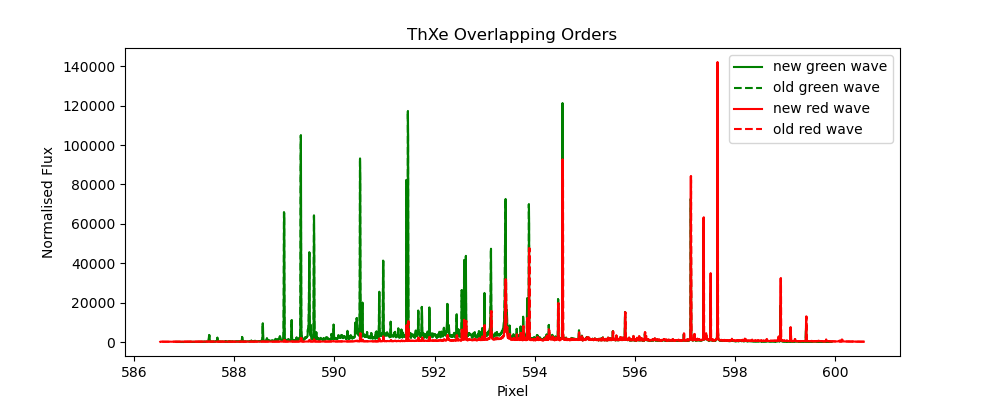

In [ ]:
green_order = 0
red_order = -2
plt.figure(figsize=(10, 4))
plt.plot(new_green_wave[green_order], green_extracted_th[green_order], 'g-', label='new green wave')
plt.plot(veloce_reduction_tools.vacuum_to_air(old_green_wave[green_order]), green_extracted_th[green_order], 'g--', label='old green wave')
plt.plot(new_red_wave[red_order], red_extracted_th[red_order], 'r-', label='new red wave')
plt.plot(veloce_reduction_tools.vacuum_to_air(old_red_wave[red_order]), red_extracted_th[red_order], 'r--', label='old red wave')
# plt.axhline(1, color='k', ls='--', label='Normalised Flux = 1')
plt.xlabel('Pixel')
plt.ylabel('Normalised Flux')
plt.title('ThXe Overlapping Orders')
plt.legend()
plt.show()

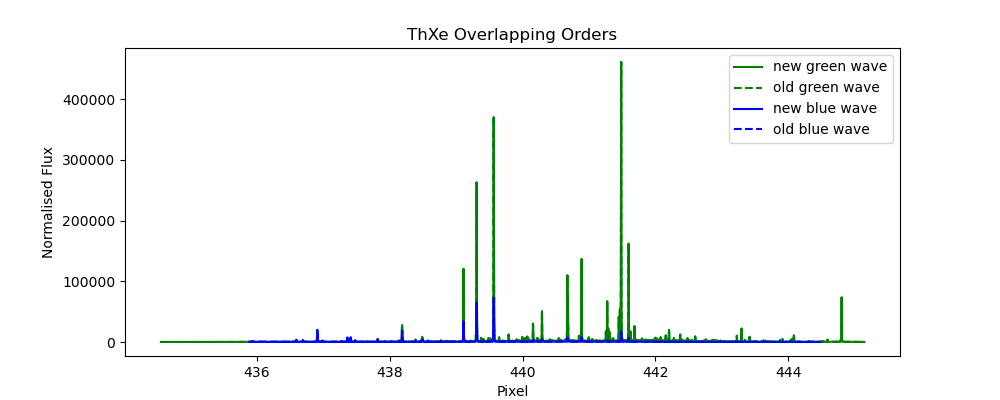

In [ ]:
blue_order = 0
green_order = -2
plt.figure(figsize=(10, 4))
plt.plot(new_green_wave[green_order], green_extracted_th[green_order], 'g-', label='new green wave')
plt.plot(veloce_reduction_tools.vacuum_to_air(old_green_wave[green_order]), green_extracted_th[green_order], 'g--', label='old green wave')
plt.plot(new_blue_wave[blue_order], blue_extracted_th[blue_order], 'b-', label='new blue wave')
plt.plot(veloce_reduction_tools.vacuum_to_air(old_blue_wave[blue_order]), blue_extracted_th[blue_order], 'b--', label='old blue wave')
# plt.axhline(1, color='k', ls='--', label='Normalised Flux = 1')
plt.xlabel('Pixel')
plt.ylabel('Normalised Flux')
plt.title('ThXe Overlapping Orders')
plt.legend()
plt.show()

In [66]:
# load science obs
# night = '230826'
arm = 'red'
# night = '240410'
# filename = '10apr30130.fits'
filename = '10apr30105.fits'
ccd = f'ccd_3'
amp_mode = 2
obs_filename =  os.path.join(veloce_paths.input_dir, date, ccd, filename)
with fits.open(obs_filename) as hdul:
    image_data = hdul[0].data
    header = hdul[0].header
image_substracted_bias = veloce_reduction_tools.remove_overscan_bias(image_data, header, arm, amp_mode, overscan_range=32)
# Extract obs
red_extracted_obs, _ = veloce_reduction_tools.extract_orders_with_trace(image_substracted_bias, red_traces)

Gain for amplifier 3 not found in header.
Gain for amplifier 4 not found in header.
Gain for half 1: 1.01
Gain for half 2: 1.040502


In [67]:
# load science obs
arm = 'green'
# night = '240410'
# filename = '10apr20130.fits'
filename = '10apr20105.fits'
ccd = f'ccd_2'
amp_mode = 2
obs_filename =  os.path.join(veloce_paths.input_dir, date, ccd, filename)
with fits.open(obs_filename) as hdul:
    image_data = hdul[0].data
    header = hdul[0].header
image_substracted_bias = veloce_reduction_tools.remove_overscan_bias(image_data, header, arm, amp_mode, overscan_range=32)
# Extract obs
green_extracted_obs, _ = veloce_reduction_tools.extract_orders_with_trace(image_substracted_bias, green_traces)

Gain for amplifier 3 not found in header.
Gain for amplifier 4 not found in header.
Gain for half 1: 1.01
Gain for half 2: 1.022423


In [ ]:
def normalise_science_order(y, nknots=10, plot=False):
    """
    Normalise the order by fitting a spline.
    """
    median_step = int(len(y) / (nknots*2) + 1)
    # maximum_step = median_step * 2
    maximum_step = median_step / 10
    print(f"Median step: {median_step}, Maximum step: {maximum_step}, N knots: {nknots}")
    x = np.arange(len(y))
    # smoothed = maximum_filter(median_filter(y, size=median_step), size=maximum_step)
    smoothed = median_filter(maximum_filter(y, size=maximum_step), size=median_step)
    # smoothed = median_filter(y, size=median_step)
    x_fit = np.linspace(x.min(), x.max(), nknots)
    y_fit = np.interp(x_fit, x, smoothed)
    spline = make_interp_spline(x_fit, y_fit, k=3)
    baseline = spline(x)
    
    if plot:
        plt.figure(figsize=(10, 6))
        plt.plot(x, y, c='gray', label='Original', alpha=0.5)
        plt.plot(x, smoothed, ls='--', c='k', label='Smoothed')
        plt.scatter(x_fit, y_fit, s=10, c='k', label='Selected knots')
        plt.plot(x, baseline, c='r', label='B-spline fit')
        plt.xlabel('Pixel')
        plt.ylabel('Flux')
        plt.xlim(0, len(y))
        plt.ylim(0, np.max(smoothed) * 1.05)
        plt.legend()
        plt.title('Normalisation of science Order')
        plt.show()

    return y/baseline

Median step: 55, Maximum step: 5.5, N knots: 35


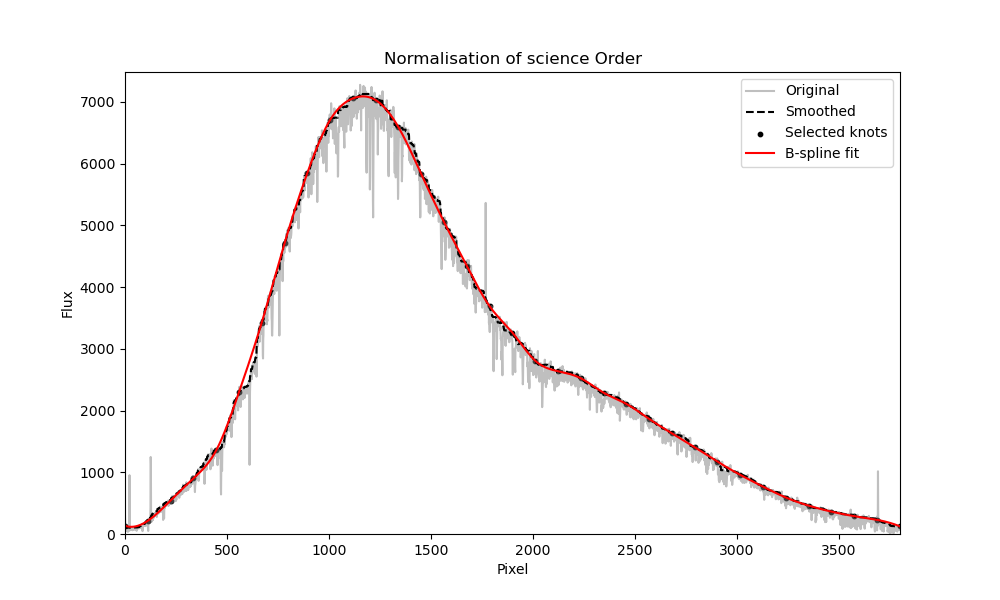

Median step: 52, Maximum step: 5.2, N knots: 40


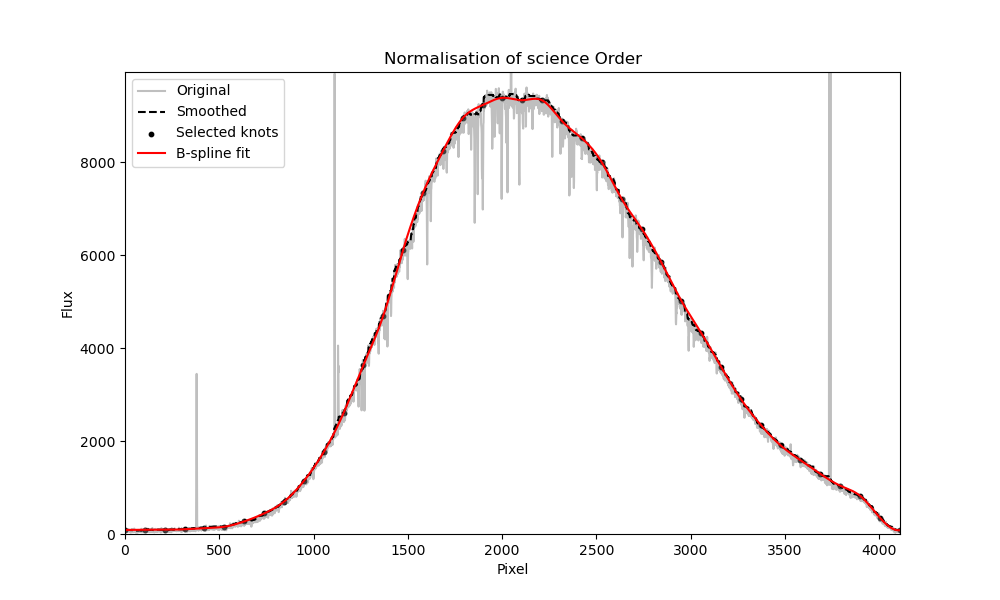

In [69]:
normalised_green_order = normalise_science_order(green_extracted_obs[0], nknots=35, plot=True)
normalised_red_order = normalise_science_order(red_extracted_obs[-2], nknots=40, plot=True)

Median step: 55, Maximum step: 5.5, N knots: 35
Median step: 55, Maximum step: 5.5, N knots: 35
Median step: 52, Maximum step: 5.2, N knots: 40
Median step: 52, Maximum step: 5.2, N knots: 40


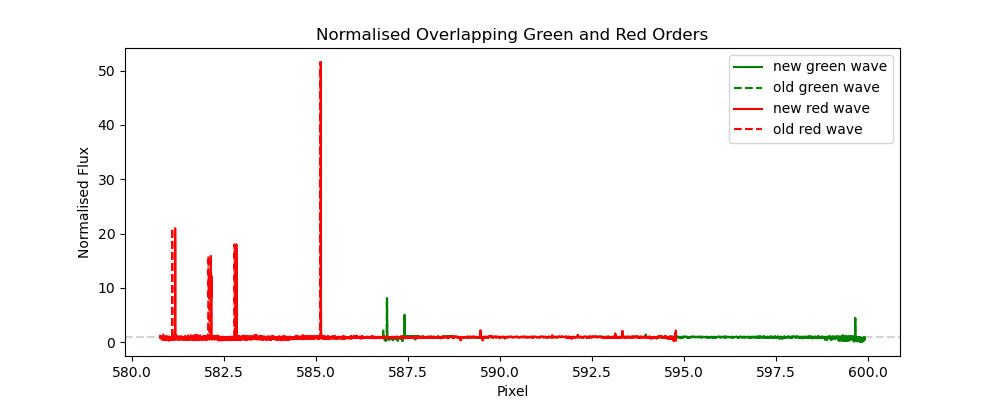

In [ ]:
green_order = 0
red_order = -1
plt.figure(figsize=(10, 4))
plt.axhline(1, color='lightgrey', ls='--')

plt.plot(
    new_green_wave[green_order],
    normalise_science_order(green_extracted_obs[green_order], nknots=35, plot=False),
    'g-', label='new green wave')
plt.plot(
    veloce_reduction_tools.vacuum_to_air(old_green_wave[green_order]),
    normalise_science_order(green_extracted_obs[green_order], nknots=35, plot=False),
    'g--', label='old green wave')
plt.plot(new_red_wave[red_order],
    normalise_science_order(red_extracted_obs[red_order], nknots=40, plot=False),
    'r-', label='new red wave')
plt.plot(veloce_reduction_tools.vacuum_to_air(old_red_wave[red_order]),
    normalise_science_order(red_extracted_obs[red_order], nknots=40, plot=False),
    'r--', label='old red wave')

plt.xlabel('Pixel')
plt.ylabel('Normalised Flux')
plt.title('Normalised Overlapping Green and Red Orders')
plt.legend()
plt.show()

In [54]:
%matplotlib widget

Order 123 with 27 lines used to fit the solution.
For reference it has 25 lines in the linelist from Veloce Manual.


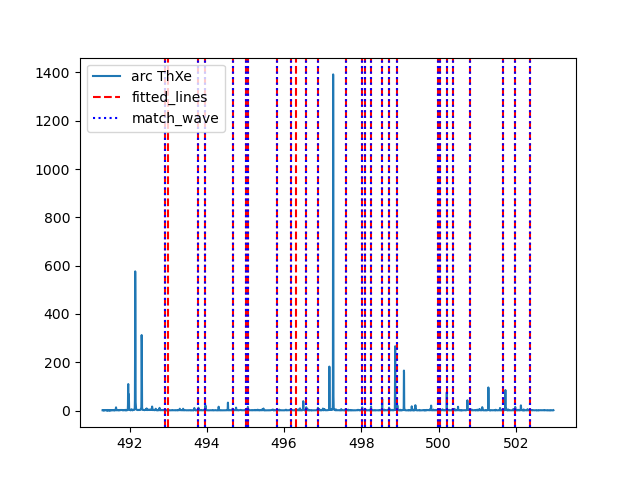

In [ ]:
plt.close('all')
order = 20
absolute_order = ORDER[order]
if arm == 'red':
    # not normalising as very bright oversaturated lines mess with my normalisation
    # plt.plot(veloce_reduction_tools.vacuum_to_air(wave[order]), extracted_ThXe[order], label='Data')
    plt.plot(new_wave[order], veloce_wavecalib.normalise_ArcTh_order_with_spline(extracted_Th[order], nknots=17), label='arc ThXe')
elif arm == 'green':
    plt.plot(new_wave[order], veloce_wavecalib.normalise_ArcTh_order_with_spline(extracted_Th[order], nknots=15), label='arc ThXe')
elif arm == 'blue':
    plt.plot(new_wave[order], veloce_wavecalib.normalise_ArcTh_order_with_spline(extracted_Th[order], nknots=13), label='arc ThXe')
else:
    raise ValueError(f"Arm {arm} does not exist, valid arms are ['red', 'green' and 'blue'].")
    

# lines = veloce_wavecalib.get_lines_in_order(veloce_reduction_tools.vacuum_to_air(wave[order]), nist_linelist, intensity_threshold=100, flag=['1'])
# for line in lines:
#     plt.axvline(line['obs_wl_air(nm)'], c='r', ls='--', label="nist_linelist")

# for line in uves_linelist[(uves_linelist['air_wave'] >= wave[20].min()) & (uves_linelist['air_wave'] <= wave[20].max())]:
#     plt.axvline(line['air_wave'], c='orange', ls='--', label="uves_linelist")

# for line in vald_linelist[(vald_linelist['WL_air(nm)'] >= wave[20].min()) & (vald_linelist['WL_air(nm)'] <= wave[20].max())]:
#     plt.axvline(line['WL_air(nm)'], c='orange', ls='--', label="vald_linelist")
for good_fit_wave in wave_positions[(order_positions == absolute_order) & mask]:
    plt.axvline(good_fit_wave, c='r', ls='--', label="fitted_lines")
for match_wave in MATCH_LAM[order]:
    plt.axvline(veloce_reduction_tools.vacuum_to_air(match_wave), c='b', ls=':', label="match_wave")

print(f"Order {absolute_order} with {len(wave_positions[(order_positions == absolute_order) & mask])} lines used to fit the solution.")
print(f"For reference it has {len(MATCH_LAM[order])} lines in the linelist from Veloce Manual.")
# for guess_wave in GUESS_LAM[order]:
#     plt.axvline(veloce_reduction_tools.vacuum_to_air(guess_wave), c='b', ls=':', label="guess_wave")
# Remove duplicate labels in legend
handles, labels = plt.gca().get_legend_handles_labels()
unique = dict()
for h, l in zip(handles, labels):
    if l not in unique:
        unique[l] = h
plt.legend(unique.values(), unique.keys())
# plt.xlim(496.27, 496.34)
plt.show()

## Grid search for best surface fitting

In [155]:
# !pip install -U pandas

##### Grid search functions

In [66]:
def grid_search_surface_fit(pixel_positions, order_positions, wave_positions, full_pixels, 
                           degree_range=None, sigma_clip_range=None, n_lim=5, robust=True,
                           metric='std_velocity', verbose=True):
    """
    Perform grid search to find optimal degree and sigma_clip parameters for surface fitting.
    
    Parameters:
    -----------
    pixel_positions, order_positions, wave_positions : array-like
        Input data for fitting
    full_pixels : array-like
        Pixel grid for prediction
    degree_range : list or range, default [3, 4, 5, 6, 7, 8]
        Range of polynomial degrees to test
    sigma_clip_range : list or range, default [1.0, 1.2, 1.4, 1.6, 1.8, 2.0]
        Range of sigma clipping values to test
    n_limit : int, default 5
        Minimum points per order
    metric : str, default 'std_velocity'
        Optimization metric ('std_velocity', 'n_points', 'rms_residuals')
    verbose : bool, default True
        Print progress information
        
    Returns:
    --------
    dict with best parameters, results grid, and best model
    """
    
    if degree_range is None:
        degree_range = [3, 4, 5, 6, 7, 8]
    if sigma_clip_range is None:
        sigma_clip_range = [1.0, 1.2, 1.4, 1.6, 1.8, 2.0, 2.2, 2.4, 2.6, 2.8, 3.0]
    
    results = []
    best_score = float('inf')
    best_params = None
    best_model = None
    best_results = None
    
    total_iterations = len(degree_range) * len(sigma_clip_range)
    iteration = 0
    
    if verbose:
        print(f"Starting grid search with {total_iterations} parameter combinations...")
        print(f"Degrees: {degree_range}")
        print(f"Sigma clips: {sigma_clip_range}")
        print("-" * 80)
    
    for degree in degree_range:
        n_limit = max(n_lim, degree + 2)  # Ensure n_limit is at least degree + 2
        # n_limit = n_lim
        if verbose: print(f"Testing degree {degree} with n_limit={n_limit}")
        for sigma_clip in sigma_clip_range:
            iteration += 1
            
            try:
                # Fit surface with current parameters
                Z, residuals, mask, model, converged = veloce_wavecalib.fit_surface_sklearn(
                    pixel_positions, order_positions, wave_positions, full_pixels,
                    degree=degree, sigma_clip=sigma_clip, n_limit=n_limit, robust=robust
                )
                
                # Calculate metrics
                n_points_used = np.sum(mask)
                n_total_points = len(mask)
                fraction_used = n_points_used / n_total_points
                
                # Velocity precision (standard error of mean)
                std_velocity = np.std(residuals[mask]/order_positions[mask]/wave_positions[mask] * c) / np.sqrt(n_points_used)
                
                # RMS residuals in velocity units
                rms_velocity = np.sqrt(np.mean((residuals[mask]/order_positions[mask]/wave_positions[mask] * c)**2))
                
                # Points per order
                unique_orders = np.unique(order_positions)
                points_per_order = []
                for order in unique_orders:
                    in_order = order_positions == order
                    points_per_order.append(np.sum(in_order * mask))
                min_points_per_order = np.min(points_per_order)
                avg_points_per_order = np.mean(points_per_order)
                
                # Store results
                result = {
                    'degree': degree,
                    'sigma_clip': sigma_clip,
                    'n_points_used': n_points_used,
                    'n_total_points': n_total_points,
                    'fraction_used': fraction_used,
                    'std_velocity': std_velocity,
                    'rms_velocity': rms_velocity,
                    'complex': rms_velocity * (1 - fraction_used),
                    'min_points_per_order': min_points_per_order,
                    'avg_points_per_order': avg_points_per_order,
                    'converged': converged,
                    'Z': Z,
                    'residuals': residuals,
                    'mask': mask,
                    'model': model
                }
                
                # Determine score based on metric
                if metric == 'std_velocity':
                    score = std_velocity
                elif metric == 'rms_velocity':
                    score = rms_velocity
                elif metric == 'n_points':
                    score = -n_points_used  # Negative because we want to maximize
                elif metric == 'complex':
                    score = rms_velocity * (1-fraction_used)
                else:
                    raise ValueError(f"Unknown metric: {metric}")
                
                # Check if this is the best so far
                if score < best_score and min_points_per_order >= n_limit:
                    best_score = score
                    best_params = {'degree': degree, 'sigma_clip': sigma_clip, 'n_limit': n_limit}
                    best_model = model
                    best_results = result.copy()
                
                if verbose:
                    print(f"[{iteration:2d}/{total_iterations}] deg={degree}, σ={sigma_clip:.1f} → "
                          f"std_vel={std_velocity:.3f} m/s, points={n_points_used}/{n_total_points} "
                          f"({fraction_used:.1%}), min_per_order={min_points_per_order}")
                
            except Exception as e:
                result = {
                    'degree': degree,
                    'sigma_clip': sigma_clip,
                    'error': str(e),
                    'converged': False,
                    'std_velocity': np.inf,
                    'rms_velocity': np.inf,
                    'complex': np.inf,
                    'n_points_used': 0,
                    'fraction_used': 0.0,
                    'min_points_per_order': 0,
                    'avg_points_per_order': 0,
                }
                
                if verbose:
                    print(f"[{iteration:2d}/{total_iterations}] deg={degree}, σ={sigma_clip:.1f} → "
                          f"FAILED: {str(e)[:50]}...")
            
            results.append(result)
    
    if verbose:
        print("-" * 80)
        print(f"Best parameters: {best_params}")
        print(f"Best {metric}: {best_score:.3f}")
        if best_results:
            print(f"Points used: {best_results['n_points_used']}/{best_results['n_total_points']} "
                  f"({best_results['fraction_used']:.1%})")
            print(f"Min points per order: {best_results['min_points_per_order']}")
    
    return {
        'best_params': best_params,
        'best_score': best_score,
        'best_model': best_model,
        'best_results': best_results,
        'all_results': results,
        'degree_range': degree_range,
        'sigma_clip_range': sigma_clip_range
    }

In [67]:
# import pandas as pd - not part of requirements for the package

# def summary_table(grid_results, top_n=5):
#     """
#     Print a summary table of the best results.
#     """
    
#     # Filter successful results
#     successful_results = [r for r in grid_results['all_results'] if r['converged']]
    
#     # Sort by std_velocity
#     successful_results.sort(key=lambda x: x['std_velocity'])
    
#     # Create DataFrame for top results
#     top_results = successful_results[:top_n]
    
#     df = pd.DataFrame([{
#         'Degree': r['degree'],
#         'Sigma Clip': r['sigma_clip'],
#         'Std Velocity [m/s]': f"{r['std_velocity']:.3f}",
#         'RMS Velocity [m/s]': f"{r['rms_velocity']:.3f}",
#         'Points Used': f"{r['n_points_used']}/{r['n_total_points']}",
#         'Fraction Used': f"{r['fraction_used']:.1%}",
#         'Min Points/Order': r['min_points_per_order']
#     } for r in top_results])
    
#     print(f"\nTop {top_n} Parameter Combinations:")
#     print("=" * 80)
#     print(df.to_string(index=False))
    
#     return df

In [68]:
def plot_grid_search_results(grid_results, metric='std_velocity', best_params=None, 
                           outlier_percentile=95, use_scale='Default', 
                           cmap='RdYlBu_r', text_color='auto', minimize=False):
    """
    Plot grid search results as a heatmap with improved scaling and visibility.
    
    Parameters:
    -----------
    outlier_percentile : float, default 95
        Percentile for outlier clipping (e.g., 95 means clip top 5% of values)
    use_robust_scale : bool, default True
        Use robust scaling (median ± 2*MAD) instead of min-max
    cmap : str, default 'RdYlBu_r'
        Colormap name. Good options: 'RdYlBu_r', 'viridis', 'plasma', 'coolwarm'
    text_color : str or 'auto', default 'auto'
        Text color for annotations. 'auto' chooses based on background
    """
    # Extract data for plotting
    degrees = grid_results['degree_range']
    sigma_clips = grid_results['sigma_clip_range']
    results = grid_results['all_results']
    
    # Create grid for results
    score_grid = np.full((len(degrees), len(sigma_clips)), np.nan)
    
    for result in results:
        if result['converged']:
            i = degrees.index(result['degree'])
            j = sigma_clips.index(result['sigma_clip'])
            score_grid[i, j] = result[metric]
    
    # Handle outliers and scaling
    valid_scores = score_grid[~np.isnan(score_grid)]
    
    if use_scale == 'Default':
        mean_score = np.mean(valid_scores)
        std = np.std(valid_scores)
        vmin = 0
        # vmin = np.min(valid_scores)
        vmax = np.max(valid_scores)
        vmax = mean_score + np.sqrt(2) * std
        if vmax > np.max(valid_scores):
            vmax = np.max(valid_scores)
    elif use_scale == 'Robust':
        # Robust scaling using median and MAD
        median_score = np.median(valid_scores)
        mad = np.median(np.abs(valid_scores - median_score))        
        vmin = median_score - 2 * mad
        if vmin < 0:
            vmin = 0
        vmax = median_score + 2 * mad

    elif use_scale == 'Percentile':
        # Percentile-based clipping
        vmin = np.percentile(valid_scores, 100 - outlier_percentile)
        vmax = np.percentile(valid_scores, outlier_percentile)
    elif 'MinMax':        # Default min-max scaling
        vmin = np.min(valid_scores)
        vmax = np.max(valid_scores)
    else:
        raise ValueError(f"Unknown scaling method: {use_scale}")
    # Ensure reasonable bounds
    # vmin = np.min(valid_scores)
    # vmax = np.max(valid_scores)
    
    # Create normalization - use TwoSlopeNorm for better contrast if appropriate
    if minimize:
        # For velocity metrics, we want lower values to be better (darker/cooler colors)
        norm = plt.Normalize(vmin=vmin, vmax=vmax)
    else:
        norm = plt.Normalize(vmin=vmax, vmax=vmin)
        if '_r' in cmap:
            cmap = cmap.replace('_r', '')
        else:
            cmap += '_r'
    
    # Plot heatmap
    fig, ax = plt.subplots(figsize=(12, 8))
    im = ax.imshow(score_grid, cmap=cmap, aspect='auto', norm=norm)
    
    # Set ticks and labels
    ax.set_xticks(range(len(sigma_clips)))
    ax.set_xticklabels([f'{s:.1f}' for s in sigma_clips])
    ax.set_yticks(range(len(degrees)))
    ax.set_yticklabels(degrees)
    
    ax.set_xlabel('Sigma Clip')
    ax.set_ylabel('Polynomial Degree')
    ax.set_title(f'Grid Search Results - {metric.replace("_", " ").title()}')
    
    # Add colorbar
    cbar = plt.colorbar(im, ax=ax, shrink=0.8)
    if 'velocity' in metric:
        cbar.set_label('Velocity Precision [m/s]')
    else:
        cbar.set_label(metric.replace('_', ' ').title())
    
    # Add text annotations with smart color selection
    for i in range(len(degrees)):
        for j in range(len(sigma_clips)):
            if not np.isnan(score_grid[i, j]):
                value = score_grid[i, j]
                
                # Smart text color selection
                if text_color == 'auto':
                    # Get normalized value for color decision
                    norm_value = (value - vmin) / (vmax - vmin) if vmax > vmin else 0.5
                    text_col = 'white' if norm_value < 0.5 else 'black'
                else:
                    text_col = text_color
                
                # Format text based on value magnitude
                if abs(value) >= 100:
                    text = f'{value:.0f}'
                elif abs(value) >= 10:
                    text = f'{value:.1f}'
                else:
                    text = f'{value:.2f}'
                
                ax.text(j, i, text, ha="center", va="center", 
                       color=text_col, fontsize=9, weight='bold')
    
    # Mark best result with a prominent border
    if best_params is not None:
        best_i = degrees.index(best_params['degree'])
        best_j = sigma_clips.index(best_params['sigma_clip'])
        # Add multiple borders for visibility
        for width, color in [(4, 'white'), (2, 'red')]:
            ax.add_patch(plt.Rectangle((best_j-0.5, best_i-0.5), 1, 1, 
                                      fill=False, edgecolor=color, linewidth=width))
    
    # Add statistics text box
    stats_text = f'Valid results: {len(valid_scores)}/{len(degrees)*len(sigma_clips)}\n'
    stats_text += f'Range: {np.min(valid_scores):.3f} - {np.max(valid_scores):.3f}\n'
    stats_text += f'Display range: {vmin:.3f} - {vmax:.3f}'
    
    ax.text(0.02, 0.98, stats_text, transform=ax.transAxes, 
            verticalalignment='top', bbox=dict(boxstyle='round', 
            facecolor='white', alpha=0.8), fontsize=8)
    
    plt.tight_layout()
    plt.show()
    
    # Print outlier information
    n_outliers = np.sum((valid_scores < vmin) | (valid_scores > vmax))
    if n_outliers > 0:
        print(f"Note: {n_outliers} outlier values clipped for better visualization")
        print(f"Clipped range: {vmin:.3f} to {vmax:.3f}")

In [69]:
def is_dominated(result1, result2, objectives=['std_velocity', 'n_points_used'], minimize=[True, False]):
    """
    Check if result1 is dominated by result2 in multi-objective sense.
    """
    better_in_all = True
    better_in_at_least_one = False
    
    for obj, minimize_obj in zip(objectives, minimize):
        val1 = result1[obj]
        val2 = result2[obj]
        
        if minimize_obj:
            # result2 dominates result1 if result2 is better (smaller) in this objective
            if val2 < val1:  # result2 is better
                better_in_at_least_one = True
            elif val2 > val1:  # result2 is worse
                better_in_all = False
        else:  # maximize
            # result2 dominates result1 if result2 is better (larger) in this objective
            if val2 > val1:  # result2 is better
                better_in_at_least_one = True
            elif val2 < val1:  # result2 is worse
                better_in_all = False
    
    return better_in_all and better_in_at_least_one

def find_pareto_frontier(results, objectives=['std_velocity', 'n_points_used'], minimize=[True, False]):
    """
    Find Pareto-optimal solutions.
    """
    # Filter successful results
    valid_results = [r for r in results if r.get('converged', False)]
    
    pareto_results = []
    
    for result in valid_results:
        is_pareto = True
        for other_result in valid_results:
            if other_result != result and is_dominated(result, other_result, objectives, minimize):
                is_pareto = False
                break
        
        if is_pareto:
            pareto_results.append(result)
    
    return pareto_results

def grid_search_pareto(pixel_positions, order_positions, wave_positions, full_pixels,
                      degree_range=None, sigma_clip_range=None, n_lim=5, robust=True,
                      objectives=['std_velocity', 'n_points_used'], minimize=[True, False],
                      verbose=True):
    """
    Grid search with Pareto frontier analysis.
    """
    if degree_range is None:
        degree_range = [3, 4, 5, 6, 7, 8]
    if sigma_clip_range is None:
        sigma_clip_range = [1.0, 1.2, 1.4, 1.6, 1.8, 2.0, 2.2, 2.4, 2.6, 2.8, 3.0]
    # Run standard grid search first
    grid_results = grid_search_surface_fit(
        pixel_positions, order_positions, wave_positions, full_pixels,
        degree_range=degree_range, sigma_clip_range=sigma_clip_range,
        n_lim=n_lim, robust=robust, metric='std_velocity', verbose=verbose
    )
    # ... (similar loop as before, but store all results)
    
    # Find Pareto frontier
    pareto_results = find_pareto_frontier(grid_results['all_results'], objectives, minimize)
    
    if verbose:
        print(f"Found {len(pareto_results)} Pareto-optimal solutions:")
        for i, result in enumerate(pareto_results):
            print(f"  {i+1}. deg={result['degree']}, σ={result['sigma_clip']:.1f}")
            for obj in objectives:
                print(f"     {obj}: {result[obj]:.3f}")
    
    return {
        'pareto_results': pareto_results,
        'all_results': grid_results['all_results'],
        'grid_results': grid_results,
        'objectives': objectives,
        'minimize': minimize
    }

In [70]:
### maybe instead of scaling n_points used by min and max in results I can do points rejected and have 0 - n_points_total (scaled then to 1)?
def find_knee_point(pareto_results, objectives=['std_velocity', 'n_points_used']):
    """
    Find the knee point (maximum curvature) in the Pareto frontier.
    """
    # Extract and normalize objectives
    points = np.array([[r[obj] for obj in objectives] for r in pareto_results])
    
    # Normalize to [0,1]
    normalized_points = (points - points.min(axis=0)) / (points.max(axis=0) - points.min(axis=0))
    
    # For minimization problems, we want the point closest to the ideal point (0,0)
    # But since we're maximizing n_points_used, flip that dimension
    normalized_points[:, 1] = 1 - normalized_points[:, 1]  # Flip n_points dimension
    
    # Find point closest to ideal (0,0)
    distances_to_ideal = np.sqrt(np.sum(normalized_points**2, axis=1))
    knee_idx = np.argmin(distances_to_ideal)
    
    return pareto_results[knee_idx], knee_idx

In [71]:
def plot_pareto_frontier(results, objectives=['std_velocity', 'n_points_used'], minimize=[True, False], vel_minmax=(0, None), n_pts_minmax=(None, None), xy_text=(10, 0), knee_solution=None):
    """
    Plot the Pareto frontier in 2D objective space, marking the knee point.
    """
    all_results = results['all_results']
    pareto_results = results['pareto_results']
    valid_results = [r for r in all_results if r.get('converged', False)]

    if len(objectives) != 2:
        print("Can only plot 2D Pareto frontier")
        return

    # Extract objective values
    all_x = [r[objectives[0]] for r in valid_results]
    all_y = [r[objectives[1]] for r in valid_results]
    pareto_x = [r[objectives[0]] for r in pareto_results]
    pareto_y = [r[objectives[1]] for r in pareto_results]

    plt.figure(figsize=(10, 6))
    plt.scatter(all_x, all_y, c='lightblue', alpha=0.6, label='All solutions')
    plt.scatter(pareto_x, pareto_y, c='red', alpha=0.8, label='Pareto optimal')

    # Mark and label the knee point
    if knee_solution is not None:
        knee_x = knee_solution[objectives[0]]
        knee_y = knee_solution[objectives[1]]
        plt.axvline(knee_x, color='k', linestyle='--', alpha=0.7)
        plt.axhline(knee_y, color='k', linestyle='--', alpha=0.7)
        plt.scatter([knee_x], [knee_y], c='gold', s=100, edgecolor='black', zorder=10, label='Knee point')
        plt.annotate(f"Knee: deg={knee_solution['degree']}, σ={knee_solution['sigma_clip']:.1f}",
                     (knee_x, knee_y), xytext=xy_text, textcoords='offset points', fontsize=10, color='black', weight='bold')

    plt.xlabel(f"{objectives[0]} ({'minimize' if minimize[0] else 'maximize'})")
    plt.ylabel(f"{objectives[1]} ({'minimize' if minimize[1] else 'maximize'})")
    plt.title('Pareto Frontier Analysis')
    plt.xlim(vel_minmax)
    plt.ylim(n_pts_minmax)
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()


In [72]:
%matplotlib inline

##### Grid search and Perato Frontier

Starting grid search with 30 parameter combinations...
Degrees: [4, 5, 6, 7, 8]
Sigma clips: [1.0, 1.2, 1.4, 1.6, 1.8, 2.0]
--------------------------------------------------------------------------------
Testing degree 4 with n_limit=10
Converged.
Std of residuals dropped from 0.344 to 0.018 after 70 iterations.
RANSAC inliers: 495 -> constrained: 516 vs iterative: 412
[ 1/30] deg=4, σ=1.0 → std_vel=8.925 m/s, points=516/2512 (20.5%), min_per_order=10
Converged.
Std of residuals dropped from 0.344 to 0.018 after 94 iterations.
RANSAC inliers: 599 -> constrained: 609 vs iterative: 417
[ 2/30] deg=4, σ=1.2 → std_vel=6.192 m/s, points=609/2512 (24.2%), min_per_order=10
Converged.
Std of residuals dropped from 0.344 to 0.016 after 60 iterations.
RANSAC inliers: 640 -> constrained: 643 vs iterative: 507
[ 3/30] deg=4, σ=1.4 → std_vel=4.662 m/s, points=643/2512 (25.6%), min_per_order=10
Converged.
Std of residuals dropped from 0.344 to 0.014 after 71 iterations.
RANSAC inliers: 630 -> const

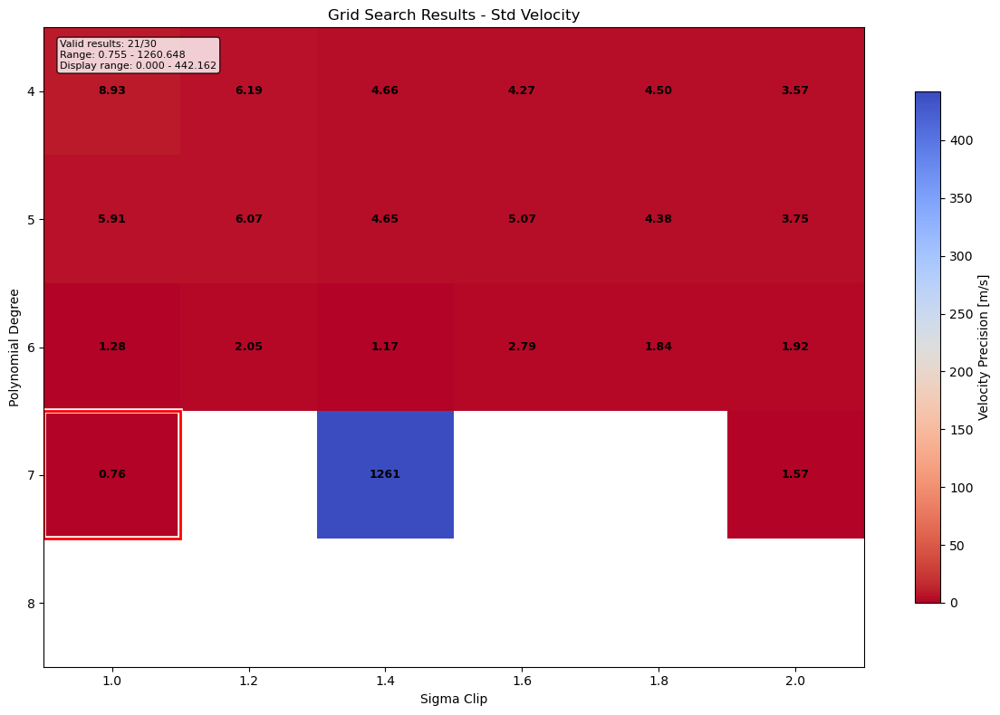

Note: 1 outlier values clipped for better visualization
Clipped range: 0.000 to 442.162

Optimal parameters: degree=7, sigma_clip=1.0


In [ ]:
# Run grid search
grid_results = grid_search_surface_fit(
    pixel_positions, order_positions, wave_positions, full_pixels,
    degree_range=[4, 5, 6, 7, 8],
    sigma_clip_range=[1.0, 1.2, 1.4, 1.6, 1.8, 2.0],
    n_lim=0,
    robust=True,
    metric='std_velocity',
    verbose=True
)

plot_grid_search_results(grid_results, metric='std_velocity', best_params=grid_results['best_params'], 
                        cmap='coolwarm', text_color='black')


# Show summary table
# summary_table(grid_results, top_n=10)

# Use best parameters
best_params = grid_results['best_params']
print(f"\nOptimal parameters: degree={best_params['degree']}, sigma_clip={best_params['sigma_clip']}")

# Refit with best parameters
# Z_opt, residuals_opt, mask_opt, model_opt, converged = fit_surface_sklearn(
#     pixel_positions, order_positions, wave_positions, full_pixels,
#     degree=best_params['degree'], 
#     sigma_clip=best_params['sigma_clip'], 
#     n_limit=best_params['degree']+2,  # Ensure n_limit is at least degree + 2
#     robust=False
# )

In [74]:
grid_results['best_params']

{'degree': 7, 'sigma_clip': 1.0, 'n_limit': 10}

In [75]:
# Pareto frontier approach
degree_range = [4, 5, 6, 7]
sigma_clip_range = [1.4, 1.6, 1.8, 2.0, 2.1, 2.2, 2.3, 2.4, 2.6, 2.8, 3.0]
objectives = ['std_velocity', 'n_points_used']
minimize = [True, False]  # minimize std_velocity, maximize n_points_used
pareto_results = grid_search_pareto(
    pixel_positions, order_positions, wave_positions, full_pixels,
    degree_range=degree_range,
    sigma_clip_range=sigma_clip_range,
    n_lim=0, robust=False,
    objectives=objectives,
    minimize=minimize
)

Starting grid search with 44 parameter combinations...
Degrees: [4, 5, 6, 7]
Sigma clips: [1.4, 1.6, 1.8, 2.0, 2.1, 2.2, 2.3, 2.4, 2.6, 2.8, 3.0]
--------------------------------------------------------------------------------
Testing degree 4 with n_limit=6
Converged.
Std of residuals dropped from 0.344 to 0.021 after 64 iterations.
[ 1/44] deg=4, σ=1.4 → std_vel=5.043 m/s, points=396/2512 (15.8%), min_per_order=6
Converged.
Std of residuals dropped from 0.344 to 0.018 after 70 iterations.
[ 2/44] deg=4, σ=1.6 → std_vel=3.964 m/s, points=473/2512 (18.8%), min_per_order=6
Converged.
Std of residuals dropped from 0.344 to 0.014 after 78 iterations.
[ 3/44] deg=4, σ=1.8 → std_vel=2.404 m/s, points=798/2512 (31.8%), min_per_order=6
Converged.
Std of residuals dropped from 0.344 to 0.020 after 51 iterations.
[ 4/44] deg=4, σ=2.0 → std_vel=2.866 m/s, points=1221/2512 (48.6%), min_per_order=6
Converged.
Std of residuals dropped from 0.344 to 0.025 after 66 iterations.
[ 5/44] deg=4, σ=2.1 → 

Knee point solution: deg=7, σ=2.4


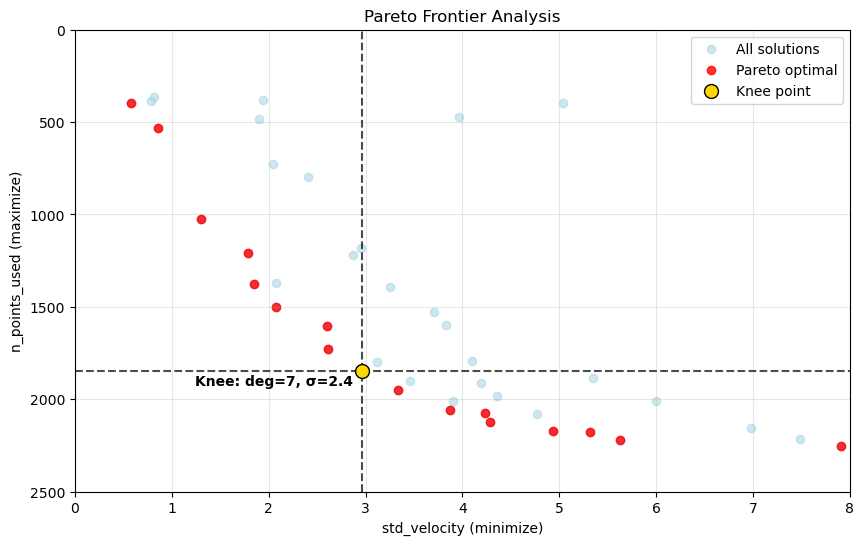

In [81]:
# Plot the results
knee_solution, knee_idx = find_knee_point(pareto_results['pareto_results'])
print(f"Knee point solution: deg={knee_solution['degree']}, σ={knee_solution['sigma_clip']:.1f}")
plot_pareto_frontier(pareto_results, 
                    objectives=['std_velocity', 'n_points_used'], 
                    minimize=[True, False], n_pts_minmax=(2500, 0), #n_pts_minmax=(len(mask), 0),
                    vel_minmax=(0, 8),
                    xy_text=(-120,-10), 
                    knee_solution=knee_solution)  # Adjust limits as needed

In [82]:
knee_solution

{'degree': 7,
 'sigma_clip': 2.4,
 'n_points_used': 1848,
 'n_total_points': 2512,
 'fraction_used': 0.7356687898089171,
 'std_velocity': 2.9619604379820785,
 'rms_velocity': 127.32985277477913,
 'complex': 33.657254077409775,
 'min_points_per_order': 32,
 'avg_points_per_order': 48.63157894736842,
 'converged': True,
 'Z': array([[60444.48424158, 60444.96272541, 60445.44112776, ...,
         61865.82760543, 61866.05837215, 61866.28908824],
        [60444.54720211, 60445.02571109, 60445.5041381 , ...,
         61865.23072656, 61865.46129468, 61865.69181227],
        [60444.51306622, 60444.99163328, 60445.47011794, ...,
         61864.71313784, 61864.94353047, 61865.17387266],
        ...,
        [60404.2690405 , 60404.76914299, 60405.26916252, ...,
         61873.852266  , 61874.08350158, 61874.31467816],
        [60402.28107104, 60402.78225591, 60403.28335805, ...,
         61874.57203283, 61874.8032402 , 61875.03438773],
        [60400.27336215, 60400.77562707, 60401.27780951, ...,


In [ ]:
# def select_best_pareto_solution(pareto_results, weights=None):
#     """
#     Select best Pareto solution using weighted scoring.
    
#     Parameters:
#     -----------
#     pareto_results : list
#         List of Pareto-optimal results
#     weights : dict
#         Weights for each objective, e.g., {'std_velocity': 0.7, 'n_points_used': 0.3}
#     """
#     if weights is None:
#         # Default: prioritize velocity precision over number of points
#         weights = {'std_velocity': 0.8, 'n_points_used': 0.2}
    
#     best_solution = None
#     best_score = 0 #float('inf')
    
#     # Normalize objectives to [0,1] scale
#     all_std_vel = [r['std_velocity'] for r in pareto_results]
#     all_n_points = [r['n_points_used'] for r in pareto_results]
    
#     min_std_vel, max_std_vel = min(all_std_vel), max(all_std_vel)
#     min_n_points, max_n_points = min(all_n_points), max(all_n_points)
    
#     for result in pareto_results:
#         # Normalize std_velocity (lower is better, so invert)
#         norm_std_vel = (max_std_vel - result['std_velocity']) / (max_std_vel - min_std_vel) if max_std_vel != min_std_vel else 0.5
        
#         # Normalize n_points_used (higher is better)
#         norm_n_points = (result['n_points_used'] - min_n_points) / (max_n_points - min_n_points) if max_n_points != min_n_points else 0.5
        
#         # Calculate weighted score
#         score = weights['std_velocity']**2 * norm_std_vel + weights['n_points_used']**2 * norm_n_points
        
#         if score > best_score:  # Higher score is better
#             best_score = score
#             best_solution = result
    
#     return best_solution, best_score

# # Example usage
# best_solution, score = select_best_pareto_solution(
#     pareto_results['pareto_results'], 
#     weights={'std_velocity': 0.8, 'n_points_used': 0.2}  # Prioritize precision
# )
# print(f"Best solution: deg={best_solution['degree']}, σ={best_solution['sigma_clip']:.1f}")
# print(f"Score: {score:.3f}")

Best solution: deg=7, σ=1.6
Score: 0.642


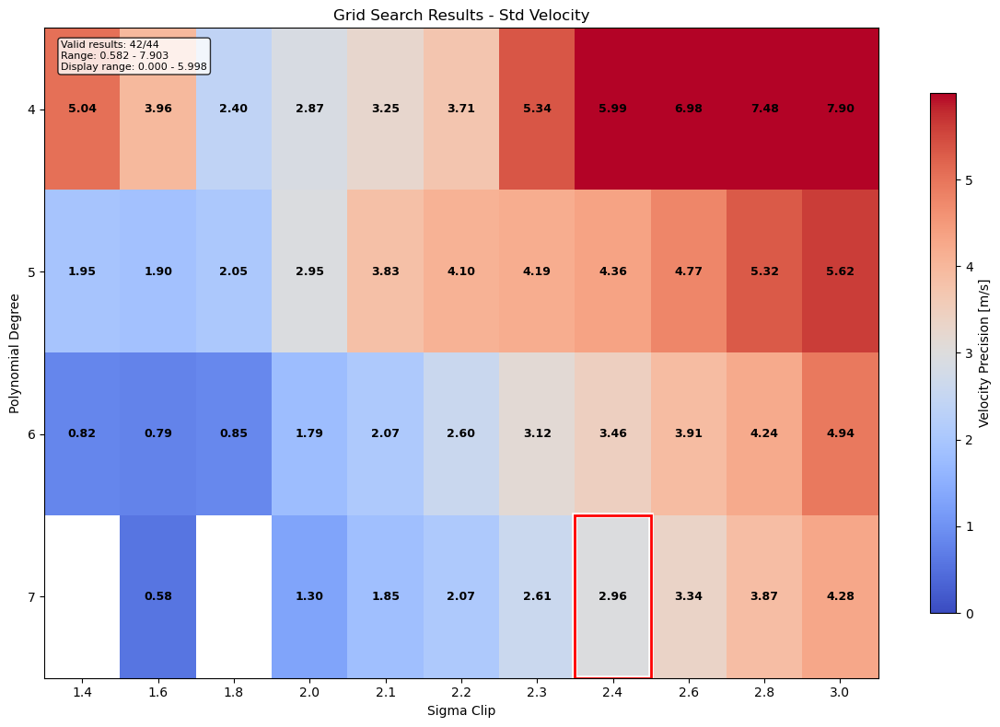

Note: 3 outlier values clipped for better visualization
Clipped range: 0.000 to 5.998


In [83]:
# Custom colormap with manual text color
plot_grid_search_results(pareto_results['grid_results'], metric='std_velocity', best_params=knee_solution,
                        cmap='coolwarm', text_color='black', use_scale='Default', minimize=True)

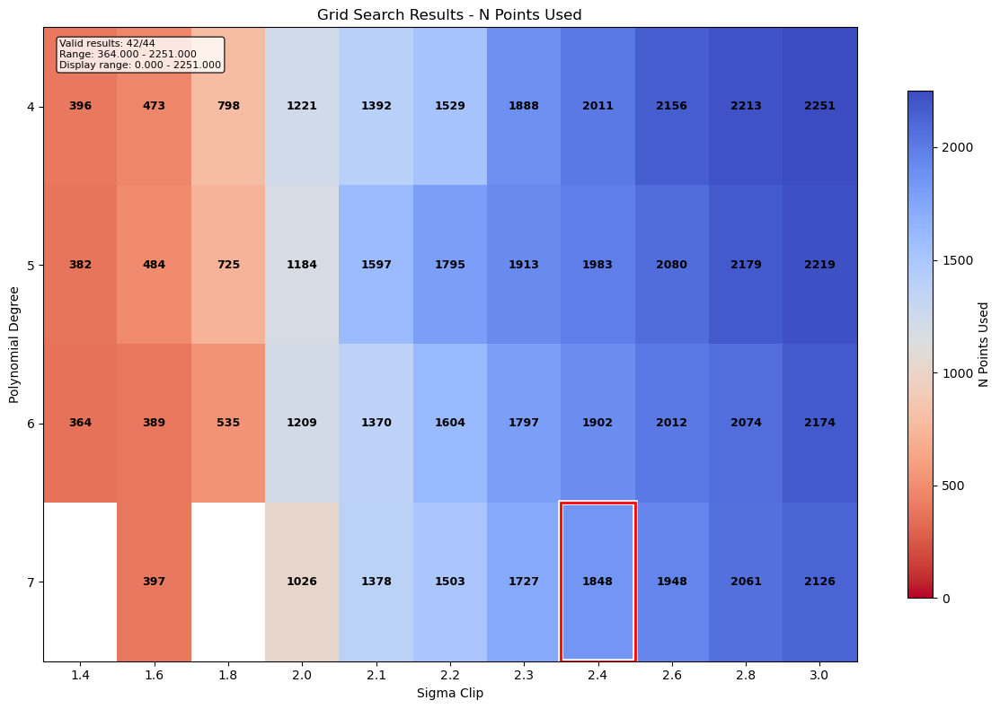

In [84]:
plot_grid_search_results(pareto_results['grid_results'], metric='n_points_used', best_params=knee_solution,
                        cmap='coolwarm', text_color='black', use_scale='Default', minimize=False)

## Find LC - on sky offset

In [8]:
file_1 = '/home/usqobserver2/Joachim_veloce/Extracted_data/ThAr/Intermediate_results/Wavelength_calibration/arcTh_wave_green_230826.fits'
file_2 = '/home/usqobserver2/Joachim_veloce/Extracted_data/ThAr/Intermediate_results/Wavelength_calibration/arcTh_wave_green_250406.fits'
wave_1, flux_1, hdr_1 = veloce_reduction_tools.load_extracted_spectrum_fits(file_1)
wave_2, flux_2, hdr_2 = veloce_reduction_tools.load_extracted_spectrum_fits(file_2)


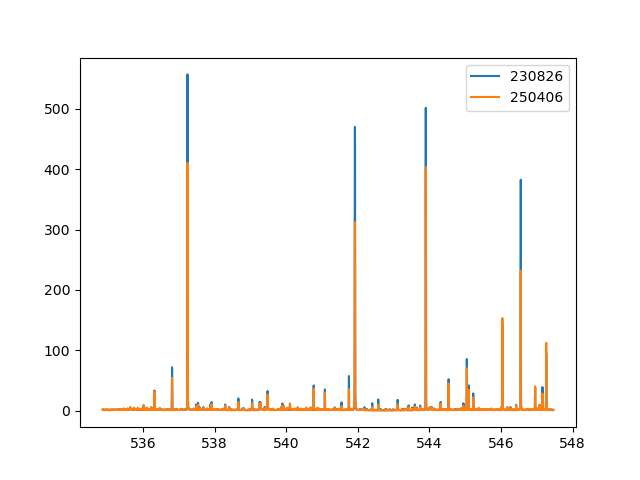

In [9]:
%matplotlib widget
selected_order = 10
plt.close("all")
plt.plot(wave_1[selected_order], flux_1[selected_order], label="230826")
plt.plot(wave_2[selected_order], flux_2[selected_order], label="250406")
plt.legend()
plt.show()

In [10]:
# science
sfile_1 = '/home/usqobserver2/Joachim_veloce/Extracted_data/HD20203/HD20203-USQ01_veloce_green_26aug20161.fits'
sfile_2 = '/home/usqobserver2/Joachim_veloce/Extracted_data/Delta_Call_2025_accretion/HD100889_veloce_green_06apr20068.fits'
swave_1, sflux_1, shdr_1 = veloce_reduction_tools.load_extracted_spectrum_fits(sfile_1)
swave_2, sflux_2, shdr_2 = veloce_reduction_tools.load_extracted_spectrum_fits(sfile_2)

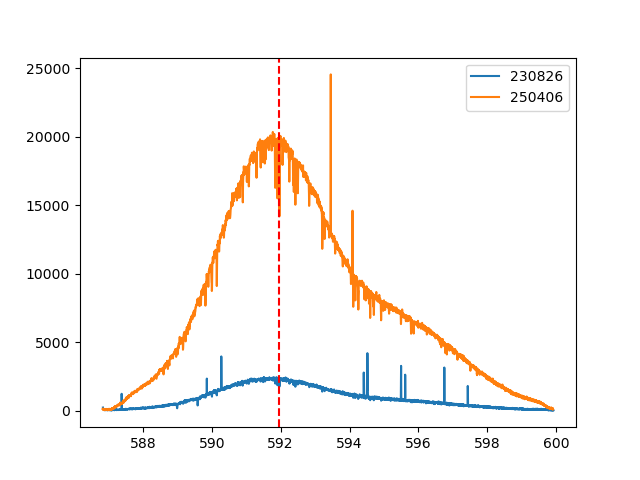

In [15]:
%matplotlib widget
selected_order = 0
plt.close("all")
plt.plot(swave_1[selected_order], sflux_1[selected_order], label="230826")
plt.plot(swave_2[selected_order], sflux_2[selected_order], label="250406")
plt.axvline(x=591.9636, color='r', ls='--')
plt.legend()
plt.show()